Author: Rohan Krishna Balaji  <br>
Course : Simulation Science <br>
Date  : 25.06.2021  <br>
Project : ICTM Analysis, Master's Thesis at Fraunhofer IPT <br>
Email :  rohan.balaji@rwth-aachen.de <br>
Verion : 1.01 <br>

# Introduction
To obtain the complete data set which includes feature from both planning data used in CAM planning and machining data obtained from Parquet fles First is to convert the machining data in machine coordinate system to tool tip data in work space coordinate system through 'Forward Kinematic Transformations' on compensated data. Then each tool tip data is clusterd to the correspoding acqired data points. Then the obtained clasters are averged to generate combined dataset with both planning and machining data.
The dataset is filtered to remove the outliers

In [1]:
# Importing necessary libraries and general settings
import transformation
import compensation
import data_imports
import pandas as pd
import os
import glob
import math
import re
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation
from mpl_toolkits import mplot3d
import numpy as np
from scipy.signal import find_peaks

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
np.set_printoptions(threshold=np.inf)

Path locations (folder location) for respective files

In [2]:
dir_paraquet = 'Manufacturing_Data/'
dir_planning = 'Planing_Data/'
dir_final_save  = 'Final_df/' 

In [3]:
print('Enter the Block number, example 1030')
block = input()
block = int(block)

Enter the Block number, example 1030
1030


In [4]:
## print('Enter the blade angle, muliples of 12')
angle = input()
angle = int(angle)

48


In [5]:
# Importing all the data
df_m,df_p,compensation_values_df = data_imports.data_out(block,angle,dir_paraquet,dir_planning)

In [6]:
df_p.columns

Index(['Leading angle', 'Side tilt angle', 'Surface Contact point X',
       'Surface contact point Y', 'Surface contact point z',
       'Surface Orietation X', 'Surface Orietation Y', 'Surface Orietation Z',
       'Tool Tip Point X', 'Tool Tip Point Y', 'Tool Tip Point Z',
       'Tool Orientation X', 'Tool Orientation Y', 'Tool Orientation Z',
       'Closes Point Distance (Surface Contact Point - Acquired TCP 1030 blade0)'],
      dtype='object')

In [7]:
df_m.columns

Index(['time', 'MachineX', 'MachineY', 'MachineZ', 'MachineA', 'MachineC',
       'LoadSpindle', 'TransfX', 'TransfY', 'TransfZ', 'TransfI', 'TransfJ',
       'TransfK', 'executionDuration', 'previousExecutionDuration',
       'relativeTimetoPreviousCall program number', 'timeStamp', 'Tool Length',
       'Tool Radius', 'G54-X', 'G54-Y', 'G54-Z', 'G54-A', 'G54-C',
       'ProgNumber', 'Blade', 'Step', 'Level', 'Fx_mean', 'Fy_mean', 'Fz_mean',
       'Mz_mean', 'Fc_mean', 'Fa_mean', 'FcN_mean', 'Fres_mean', 'Fx_sigma',
       'Fy_sigma', 'Fz_sigma', 'Mz_sigma', 'Fc_sigma', 'Fa_sigma', 'FcN_sigma',
       'Fres_sigma', 'Fx_max', 'Fy_max', 'Fz_max', 'Mz_max', 'Fc_max',
       'Fa_max', 'FcN_max', 'Fres_max'],
      dtype='object')

In [8]:
# Just copying machine data points linear(x,y,x) and rotart (a,c) into arrays.
# These machine points (x,y,x,a,c) are transformed from machine coordinate system to workpiece coordinate system by forward tramsformation

x = df_m['MachineX'].copy(deep=True)
y = df_m['MachineY'].copy(deep=True)
z = df_m['MachineZ'].copy(deep=True)
a = np.radians(df_m['MachineA']).copy(deep=True)
c = np.radians(df_m['MachineC']).copy(deep=True)

size1 = x.shape[0]

# converting pandas series to numpy array
x = x.to_numpy()
y = y.to_numpy()
z = z.to_numpy()
a = a.to_numpy()
c = c.to_numpy()

In [9]:
#compensation_values
compensation_values = compensation_values_df.to_numpy()

### Applying compensation on the Aquired Data
Based on the macine position compensation is applied to the machine datat, so that the errors are negated. This is implemented in the script compensation.py 
<img src="images/compensation.png">

In [10]:
# Within each cube we have ranges defined in x,y,z for the machine position

x_range = np.arange(-200,201,100)
y_range = np.arange(-300,301,150)
z_range = np.arange(-500,1,50)

obj3 = compensation.Compensation(compensation_values,x_range,y_range,z_range)

# Caclculation of compensation error values based on machine positions obtained through inverse transformation
deltaX1, deltaY1, deltaZ1,deltaI1,deltaJ1,deltaK1 = obj3.calculate(x,y,z)  
size3 = x.shape[0]

conc3 = np.concatenate((deltaX1.reshape(size3,1),deltaY1.reshape(size3,1),deltaZ1.reshape(size3,1),deltaI1.reshape(size3,1),deltaJ1.reshape(size3,1),deltaK1.reshape(size3,1)),axis=1)

# prininting the compensation error values
df_obj3 = pd.DataFrame(conc3, columns=['deltaX1','deltaY1','deltaZ1','deltaI1','deltaJ1','deltaK1'])
df_obj3.head(5)  
                          

,deltaX1,deltaY1,deltaZ1,deltaI1,deltaJ1,deltaK1
0,26.443495,-11.914891,-10.001572,0.0,0.0,0.0
1,26.443495,-11.914891,-10.001572,0.0,0.0,0.0
2,26.443495,-11.914891,-10.001572,0.0,0.0,0.0
3,26.443495,-11.914891,-10.001572,0.0,0.0,0.0
4,26.443495,-11.914891,-10.001572,0.0,0.0,0.0


In [11]:
x_compensated = x + deltaX1*10**-3    # since given compensation is to be converted from microns to mm (10**-6 x 10**3 = 10**-3)
y_compensated = y + deltaY1*10**-3
z_compensated = z + deltaZ1*10**-3

conc4 = np.concatenate((x_compensated.reshape(size3,1),y_compensated.reshape(size3,1),z_compensated.reshape(size3,1)),axis=1)
df_obj4 = pd.DataFrame(conc4, columns=['x_compensated','y_compensated','z_compensated'])
df_obj4.head(5)

,x_compensated,y_compensated,z_compensated
0,-158.991757,-118.613215,-79.440502
1,-158.991757,-118.613215,-79.440502
2,-158.991757,-118.613215,-79.440502
3,-158.991757,-118.613215,-79.440502
4,-158.991757,-118.613215,-79.440502


In [12]:
df_m['compensation_x'] = deltaX1*10**-3
df_m['compensation_y'] = deltaY1*10**-3
df_m['compensation_z'] = deltaZ1*10**-3
df_m.iloc[10000:10010]

,time,MachineX,MachineY,MachineZ,MachineA,MachineC,LoadSpindle,TransfX,TransfY,TransfZ,TransfI,TransfJ,TransfK,executionDuration,previousExecutionDuration,relativeTimetoPreviousCall program number,timeStamp,Tool Length,Tool Radius,G54-X,G54-Y,G54-Z,G54-A,G54-C,ProgNumber,Blade,Step,Level,Fx_mean,Fy_mean,Fz_mean,Mz_mean,Fc_mean,Fa_mean,FcN_mean,Fres_mean,Fx_sigma,Fy_sigma,Fz_sigma,Mz_sigma,Fc_sigma,Fa_sigma,FcN_sigma,Fres_sigma,Fx_max,Fy_max,Fz_max,Mz_max,Fc_max,Fa_max,FcN_max,Fres_max,compensation_x,compensation_y,compensation_z
93.014999,93.014999,-107.4262,-55.4311,-159.0920,-72.7252,22.6078,9.959091,-171.652381,132.747429,26.921076,-0.261169,0.368432,-0.892215,0.002197,0.002319,0.008122,6.375063e+10,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030,-48,SCHLICHTEN,1,0.035694,0.092636,0.166055,0.006772,1.128641,0.128329,0.120820,0.294384,0.493294,0.902904,0.535626,0.005308,0.884591,1.025652,0.965260,1.138525,6.853159,8.909050,2.433103,0.025503,4.250462,8.909050,8.487037,8.909050,0.022085,-0.012045,-0.007778
93.020004,93.020004,-107.5777,-55.3095,-159.2209,-72.7264,22.6256,9.959091,-171.800936,132.557781,26.762737,-0.268320,0.364587,-0.891673,0.001404,0.002197,0.006786,6.375063e+10,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030,-48,SCHLICHTEN,1,0.000000,0.092288,0.196099,0.005997,0.999484,0.092288,0.092170,0.288387,0.000000,0.899518,0.578526,0.005241,0.873427,0.899518,0.898368,1.052440,0.000000,8.891644,2.325475,0.027504,4.583925,8.891644,8.869179,8.891644,0.022078,-0.012048,-0.007775
93.030006,93.030006,-107.7486,-55.1791,-159.3682,-72.7296,22.6456,9.959091,-171.968179,132.343919,26.583959,-0.277293,0.361410,-0.890220,0.002312,0.001404,0.007126,6.375063e+10,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030,-48,SCHLICHTEN,1,0.114313,0.283925,0.143647,0.006055,1.009148,0.398237,0.396304,0.541884,0.909458,1.757348,0.544100,0.004243,0.707178,1.962263,1.954011,2.008011,7.707178,12.922104,2.797193,0.018558,3.092923,12.922104,12.875945,12.922104,0.022070,-0.012051,-0.007772
93.035004,93.035004,-107.9197,-55.0542,-159.5173,-72.7342,22.6654,9.936364,-172.134812,132.129989,26.405311,-0.286948,0.359045,-0.888115,0.001335,0.002312,0.006895,6.375063e+10,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030,-48,SCHLICHTEN,1,0.240745,0.000000,0.272058,0.005882,0.980363,0.240745,0.240316,0.512803,1.342272,0.000000,0.729434,0.004964,0.827250,1.342272,1.339920,1.484175,8.121780,0.000000,2.944839,0.026807,4.467837,8.121780,8.110840,8.121780,0.022062,-0.012054,-0.007768
93.040001,93.040001,-108.0912,-54.9346,-159.6683,-72.7404,22.6851,9.936364,-172.301388,131.915944,26.225921,-0.297481,0.357548,-0.885248,0.001297,0.001335,0.007038,6.375063e+10,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030,-48,SCHLICHTEN,1,0.239069,0.000000,0.161355,0.005921,0.986872,0.239069,0.231418,0.400425,1.338979,0.000000,0.519614,0.005743,0.957127,1.338979,1.299675,1.409153,8.828712,0.000000,2.163988,0.032408,5.401359,8.828712,8.692923,8.828712,0.022054,-0.012056,-0.007765
93.050003,93.050003,-108.2630,-54.8202,-159.8210,-72.7479,22.7045,9.936364,-172.467202,131.702056,26.046749,-0.308697,0.356721,-0.881735,0.001328,0.001297,0.006977,6.375063e+10,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030,-48,SCHLICHTEN,1,0.026207,0.065482,0.148263,0.004930,0.821724,0.091689,0.090697,0.239951,0.418484,0.737965,0.512211,0.004424,0.737286,0.846339,0.837434,0.975429,6.708867,8.437737,2.397033,0.021639,3.606565,8.437737,8.380493,8.437737,0.022045,-0.012059,-0.007762
93.060005,93.060005,-108.2630,-54.8202,-159.8210,-72.7479,22.7045,9.936364,-172.467202,131.702056,26.046749,-0.308697,0.356721,-0.881735,0.004323,0.001328,0.007036,6.375063e+10,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030,-48,SCHLICHTEN,1,0.142619,0.092056,0.222409,0.005262,0.876941,0.234674,0.233656,0.457083,0.977967,0.897651,0.622318,0.004043,0.673774,1.317551,1.312272,1.420856,6.990349,9.101361,2.351363,0.019395,3.232579,9.101361,9.101313,9.101361,0.022045,-0.012059,-0.007762
93.065002,93.065002,-108.4160,-54.7232,-159.9584,-72.7559,22.7216,9.927273,-172.

### Forward Transformation:
Forward transformation is performed by applying rotational and transitional
transformations on the machine points and orientation in the machine coordi-
nate system.
There are two ways to interpret the transformations. Firstly, by pre-multiplication
of all the transformation matrices with respect to base coordinate system (i.e
Machine Coordinate System). Second method is the apply post- multiplica-
tion this can be understood as applying 'Relative Transformation'.
The notation used for machine data points obtained by paraqet fles are
x,y,z,a,c in machine coordinate system. The tool tip and orientations obtained
in workpiece coordinate system X,Y,Z,I,J,K. This is implemented in transformation.py script.

<img src="images/transformation.png">

In [13]:
obj = transformation.Transformation(size1,angle)
# Forward Transformation fuction:
# Input : Machine points in machine coordinate system
# Output: returns too tip points and orientation in workpiece coordinate system
tool_position_workpiece_CS, tool_orientation_workpiece_CS = obj.forward(x_compensated,y_compensated,z_compensated,a,c)

X = tool_position_workpiece_CS[0,0,:]
Y = tool_position_workpiece_CS[1,0,:]
Z = tool_position_workpiece_CS[2,0,:]
print(X.shape)

I = tool_orientation_workpiece_CS[0,0,:]
J = tool_orientation_workpiece_CS[1,0,:]
K = tool_orientation_workpiece_CS[2,0,:]

# Verification the correctness of code, i.e on applying reverse transformation on the forward transformation we should get same values or equivalent values i.e (cos(a or c),sin(a or c))
machine_points_xyz, machine_direction_ac = obj.backward(X,Y,Z,I,J,K)

x_out = machine_points_xyz[0,0,:]
y_out = machine_points_xyz[1,0,:]
z_out = machine_points_xyz[2,0,:]

a_out = machine_direction_ac[0,0,:]
c_out = machine_direction_ac[1,0,:]

conc1 = np.concatenate((x.reshape(size1,1),x_out.reshape(size1,1),y.reshape(size1,1),y_out.reshape(size1,1),z.reshape(size1,1),z_out.reshape(size1,1),a.reshape(size1,1),a_out.reshape(size1,1),c.reshape(size1,1),c_out.reshape(size1,1)),axis=1)

df_obj1 = pd.DataFrame(conc1, columns=['x','x_out','y','y_out','z','z_out','a','a_out','c','c_out'])

df_obj1.iloc[10000:10005]


(37391,)
0 -75.2364 363.9877
1 -75.2364 363.9877
2 -75.2364 363.9877
3 -75.2364 363.9877
4 -75.2364 363.9877
5 -75.2364 363.9877
6 -75.2364 363.9877
7 -75.2364 363.9877
8 -75.2364 363.9877
9 -75.2364 363.9877
10 -75.2364 363.9877
11 -75.2364 363.9877
12 -75.2364 363.9877
13 -75.2364 363.9877
14 -75.2364 363.9877
15 -75.2364 363.9877
16 -75.2364 363.9877
17 -75.2364 363.9877
18 -75.2364 363.9877
19 -75.2364 363.9877
20 -75.2364 363.9877
21 -75.2364 363.9877
22 -75.2364 363.9877
23 -75.2364 363.9877
24 -75.2364 363.9877
25 -75.2364 363.9877
26 -75.2364 363.9877
27 -75.2364 363.9877
28 -75.2364 363.9877
29 -75.2364 363.9877
30 -75.2364 363.9877
31 -75.2364 363.9877
32 -75.2364 363.9877
33 -75.2364 363.9877
34 -75.2364 363.9877
35 -75.2364 363.9877
36 -75.2364 363.9877
37 -75.2364 363.9877
38 -75.2364 363.9877
39 -75.2364 363.9877
40 -75.2364 363.9877
41 -75.2364 363.9877
42 -75.2364 363.9877
43 -75.2364 363.9877
44 -75.2364 363.9877
45 -75.2364 363.9877
46 -75.2364 363.9877
47 -75.2364 36

478 -75.9438 379.9868000000001
479 -75.9438 379.9868000000001
480 -75.9438 379.9868000000001
481 -75.9438 379.9868000000001
482 -75.9438 379.9868000000001
483 -75.9438 379.9868000000001
484 -75.9438 379.9868000000001
485 -75.9438 379.9868000000001
486 -75.9438 379.9868000000001
487 -75.9438 379.9868000000001
488 -75.9438 379.9868000000001
489 -75.9438 379.9868000000001
490 -75.9438 379.9868000000001
491 -75.9438 379.9868000000001
492 -75.9438 379.9868000000001
493 -75.9438 379.9868000000001
494 -75.9438 379.9868000000001
495 -75.9438 379.9868000000001
496 -75.9438 379.9868000000001
497 -75.9438 379.9868000000001
498 -75.9438 379.9868000000001
499 -75.9438 379.9868000000001
500 -75.9438 379.9868000000001
501 -75.9438 379.9868000000001
502 -75.9438 379.9868000000001
503 -75.9438 379.9868000000001
504 -75.9438 379.9868000000001
505 -75.9438 379.9868000000001
506 -75.9438 379.9868000000001
507 -75.9438 379.9868000000001
508 -75.9438 379.9868000000001
509 -75.9438 379.9868000000001
510 -75.

931 -88.7596 379.862
932 -88.7823 379.8557
933 -88.8031 379.84900000000005
934 -88.8031 379.84900000000005
935 -88.8031 379.84900000000005
936 -88.8376 379.83500000000004
937 -88.8376 379.83500000000004
938 -88.8652 379.8188
939 -88.8652 379.8188
940 -88.876 379.81030000000004
941 -88.876 379.81030000000004
942 -88.8848 379.8014
943 -88.8953 379.78340000000003
944 -88.8953 379.78340000000003
945 -88.8978 379.7635
946 -88.8978 379.7635
947 -88.8924 379.74330000000003
948 -88.8924 379.74330000000003
949 -88.8858 379.73240000000004
950 -88.8771 379.7214
951 -88.8771 379.7214
952 -88.8771 379.7214
953 -88.8389 379.68780000000004
954 -88.8209 379.67580000000004
955 -88.8007 379.66380000000004
956 -88.7782 379.65160000000003
957 -88.7534 379.6392
958 -88.7282 379.6277
959 -88.6983 379.615
960 -88.6661 379.6023
961 -88.6661 379.6023
962 -88.5944 379.5767
963 -88.5944 379.5767
964 -88.5577 379.56460000000004
965 -88.5577 379.56460000000004
966 -88.4702 379.538
967 -88.4226 379.5242
968 -88.323

1380 -87.4355 379.8638
1381 -87.4947 379.8605
1382 -87.5584 379.857
1383 -87.6208 379.85350000000005
1384 -87.6817 379.85
1385 -87.6817 379.85
1386 -87.7939 379.8435
1387 -87.7939 379.8435
1388 -87.9052 379.8368
1389 -87.9052 379.8368
1390 -87.9586 379.8335
1391 -87.9586 379.8335
1392 -88.0561 379.82730000000004
1393 -88.0561 379.82730000000004
1394 -88.1046 379.82410000000004
1395 -88.1516 379.821
1396 -88.1969 379.8179
1397 -88.2405 379.8147
1398 -88.2405 379.8147
1399 -88.2787 379.8118
1400 -88.31870000000002 379.80820000000006
1401 -88.357 379.8036
1402 -88.3935 379.798
1403 -88.4586 379.78470000000004
1404 -88.4897 379.7762
1405 -88.4897 379.7762
1406 -88.519 379.7668
1407 -88.5465 379.7565
1408 -88.5941 379.73440000000005
1409 -88.6158 379.72150000000005
1410 -88.6158 379.72150000000005
1411 -88.63550000000001 379.70790000000005
1412 -88.6694 379.67830000000004
1413 -88.6824 379.6637
1414 -88.6941 379.64700000000005
1415 -88.6941 379.64700000000005
1416 -88.71140000000001 379.611

1741 -80.2519 380.22180000000003
1742 -80.2519 380.22180000000003
1743 -80.3668 380.21630000000005
1744 -80.48170000000002 380.2108
1745 -80.5965 380.2053000000001
1746 -80.7114 380.19970000000006
1747 -80.8145 380.1947
1748 -80.9291 380.189
1749 -81.0437 380.1834
1750 -81.0437 380.1834
1751 -81.1582 380.17760000000004
1752 -81.1582 380.17760000000004
1753 -81.2725 380.17190000000005
1754 -81.375 380.1668
1755 -81.489 380.16100000000006
1756 -81.6028 380.15520000000004
1757 -81.7164 380.1494
1758 -81.7164 380.1494
1759 -81.9313 380.13820000000004
1760 -81.9313 380.13820000000004
1761 -82.0442 380.1323
1762 -82.2689 380.1204
1763 -82.3808 380.1145
1764 -82.481 380.1091
1765 -82.481 380.1091
1766 -82.7029 380.09700000000004
1767 -82.7029 380.09700000000004
1768 -82.8133 380.091
1769 -82.8133 380.091
1770 -83.0216 380.07950000000005
1771 -83.1306 380.0735
1772 -83.2392 380.0674
1773 -83.2392 380.0674
1774 -83.4548 380.0552
1775 -83.551 380.04970000000003
1776 -83.6574 380.0436
1777 -83.76

2251 -88.0667 379.60650000000004
2252 -88.0999 379.5928
2253 -88.0999 379.5928
2254 -88.0999 379.5928
2255 -88.1315 379.57740000000007
2256 -88.1863 379.54240000000004
2257 -88.1863 379.54240000000004
2258 -88.2123 379.5213
2259 -88.2364 379.49850000000004
2260 -88.2364 379.49850000000004
2261 -88.2588 379.4741
2262 -88.2774 379.4504
2263 -88.2957 379.4225
2264 -88.3121 379.39310000000006
2265 -88.3121 379.39310000000006
2266 -88.3265 379.36240000000004
2267 -88.3265 379.36240000000004
2268 -88.339 379.33020000000005
2269 -88.339 379.33020000000005
2270 -88.3487 379.2996
2271 -88.3569 379.26460000000003
2272 -88.363 379.22830000000005
2273 -88.3671 379.1908
2274 -88.3691 379.1521
2275 -88.3689 379.11550000000005
2276 -88.3689 379.11550000000005
2277 -88.3665 379.07460000000003
2278 -88.3665 379.07460000000003
2279 -88.3548 378.9895
2280 -88.3548 378.9895
2281 -88.3354 378.90430000000003
2282 -88.3354 378.90430000000003
2283 -88.3215 378.85870000000006
2284 -88.3053 378.8122
2285 -88.30

2747 -86.5251 376.5466
2748 -86.5251 376.5466
2749 -86.5251 376.5466
2750 -86.2152 376.3125
2751 -86.2152 376.3125
2752 -85.99020000000002 376.15670000000006
2753 -85.759 376.0083
2754 -85.4955 375.8523
2755 -85.1883 375.6872
2756 -84.7341 375.4739
2757 -84.4373 375.35290000000003
2758 -84.4373 375.35290000000003
2759 -84.1275 375.24150000000003
2760 -83.9724 375.1909
2761 -83.6535 375.09860000000003
2762 -83.6535 375.09860000000003
2763 -83.2835 375.0106
2764 -83.2835 375.0106
2765 -83.2835 375.0106
2766 -82.7414 374.9198
2767 -82.7414 374.9198
2768 -82.4517 374.8849
2769 -82.4517 374.8849
2770 -82.1519 374.85670000000005
2771 -82.1519 374.85670000000005
2772 -81.528 374.81870000000004
2773 -81.528 374.81870000000004
2774 -81.2068 374.80850000000004
2775 -79.2113 374.8514
2776 -78.8736 374.8745
2777 -78.8736 374.8745
2778 -78.1998 374.9331
2779 -78.1998 374.9331
2780 -77.8647 374.9687
2781 -77.8647 374.9687
2782 -77.5314 375.0084
2783 -77.5314 375.0084
2784 -76.8742 375.10030000000006

3150 -88.0136 378.6326
3151 -88.0085 378.57
3152 -88.0085 378.57
3153 -88.0085 378.57
3154 -87.99230000000001 378.44550000000004
3155 -87.9801 378.37850000000003
3156 -87.9801 378.37850000000003
3157 -87.9658 378.3104
3158 -87.9658 378.3104
3159 -87.93 378.17060000000004
3160 -87.93 378.17060000000004
3161 -87.93 378.17060000000004
3162 -87.9101 378.1043
3163 -87.79890000000002 377.80890000000005
3164 -87.7302 377.6618
3165 -87.6486 377.5074
3166 -87.5082 377.27560000000005
3167 -87.3965 377.1108
3168 -87.3362 377.02670000000006
3169 -87.3362 377.02670000000006
3170 -87.3362 377.02670000000006
3171 -87.2096 376.86030000000005
3172 -87.2096 376.86030000000005
3173 -87.1394 376.77330000000006
3174 -87.1394 376.77330000000006
3175 -86.99 376.59740000000005
3176 -86.9154 376.5138
3177 -86.7466 376.33570000000003
3178 -86.7466 376.33570000000003
3179 -86.6577 376.24660000000006
3180 -86.6577 376.24660000000006
3181 -86.5659 376.1575
3182 -86.5659 376.1575
3183 -86.3775 375.9849
3184 -86.377

3713 -72.4357 376.0562
3714 -72.4357 376.0562
3715 -72.3769 376.15160000000003
3716 -72.2752 376.33650000000006
3717 -72.228 376.4332
3718 -72.228 376.4332
3719 -72.1843 376.5301
3720 -72.1439 376.62710000000004
3721 -72.1094 376.7173
3722 -72.1094 376.7173
3723 -72.0434 376.9152
3724 -72.0162 377.01030000000003
3725 -72.0162 377.01030000000003
3726 -71.972 377.1933
3727 -71.9537 377.2882000000001
3728 -71.9537 377.2882000000001
3729 -71.9244 377.4777
3730 -71.9244 377.4777
3731 -71.9133 377.57200000000006
3732 -71.9051 377.6588
3733 -71.89450000000001 377.84530000000007
3734 -71.89450000000001 377.84530000000007
3735 -71.8922 377.9377
3736 -71.8922 377.9377
3737 -71.8929 378.11390000000006
3738 -71.8929 378.11390000000006
3739 -71.8929 378.11390000000006
3740 -71.9008 378.2937
3741 -71.9008 378.2937
3742 -71.907 378.3824000000001
3743 -71.907 378.3824000000001
3744 -71.9144 378.4701
3745 -71.9225 378.55030000000005
3746 -71.9326 378.63570000000004
3747 -71.9556 378.80330000000004
3748

4152 -71.4468 376.96320000000003
4153 -71.4727 377.20270000000005
4154 -71.4727 377.20270000000005
4155 -71.5066 377.43910000000005
4156 -71.5066 377.43910000000005
4157 -71.5248 377.54780000000005
4158 -71.5464 377.6635
4159 -71.5695 377.77810000000005
4160 -71.5938 377.89140000000003
4161 -71.6194 378.00350000000003
4162 -71.6443 378.10650000000004
4163 -71.6721 378.21560000000005
4164 -71.7301 378.42890000000006
4165 -71.7301 378.42890000000006
4166 -71.7301 378.42890000000006
4167 -71.76 378.5332
4168 -71.7882 378.6283
4169 -71.8189 378.72850000000005
4170 -71.8189 378.72850000000005
4171 -71.84970000000001 378.8268
4172 -71.84970000000001 378.8268
4173 -71.8806 378.92310000000003
4174 -71.9114 379.01730000000003
4175 -71.9698 379.19160000000005
4176 -71.9698 379.19160000000005
4177 -71.9995 379.27850000000007
4178 -72.0285 379.3629
4179 -72.0568 379.4449000000001
4180 -72.1082 379.5939000000001
4181 -72.1569 379.7375
4182 -72.2171 379.92460000000005
4183 -72.2491 380.0361000000000

4484 -87.4638 378.5658
4485 -87.4638 378.5658
4486 -87.4733 378.4925
4487 -87.489 378.2611
4488 -87.4901 378.1759
4489 -87.489 378.08820000000003
4490 -87.48090000000002 377.91290000000004
4491 -87.48090000000002 377.91290000000004
4492 -87.4726 377.81730000000005
4493 -87.4726 377.81730000000005
4494 -87.4499 377.62080000000003
4495 -87.4195 377.42440000000005
4496 -87.3996 377.3192
4497 -87.35240000000002 377.1046
4498 -87.35240000000002 377.1046
4499 -87.325 376.9954
4500 -87.2961 376.8928
4501 -87.2605 376.7807
4502 -87.2214 376.6671
4503 -87.1786 376.5522
4504 -87.1786 376.5522
4505 -87.0853 376.32570000000004
4506 -87.0308 376.20680000000004
4507 -86.9729 376.0869
4508 -86.9729 376.0869
4509 -86.9114 375.9662
4510 -86.9114 375.9662
4511 -86.7816 375.72960000000006
4512 -86.6323 375.4836
4513 -86.4692 375.23640000000006
4514 -86.2016 374.87170000000003
4515 -86.0027 374.6252
4516 -86.0027 374.6252
4517 -85.7948 374.38680000000005
4518 -85.7948 374.38680000000005
4519 -85.5675 374.

4820 -79.6444 380.79220000000004
4821 -79.8551 380.75590000000005
4822 -80.066 380.7191
4823 -80.1591 380.70270000000005
4824 -80.3697 380.6652
4825 -80.3697 380.6652
4826 -80.4748 380.6462
4827 -80.7775 380.59110000000004
4828 -80.9866 380.55240000000003
4829 -81.0909 380.53290000000004
4830 -81.183 380.51570000000004
4831 -81.2867 380.4959
4832 -81.39030000000001 380.47620000000006
4833 -81.39030000000001 380.47620000000006
4834 -81.5967 380.43660000000006
4835 -81.5967 380.43660000000006
4836 -81.79 380.399
4837 -81.79 380.399
4838 -81.892 380.37890000000004
4839 -81.9938 380.35880000000003
4840 -82.0951 380.33860000000004
4841 -82.0951 380.33860000000004
4842 -82.1845 380.3208
4843 -82.3852 380.2803
4844 -82.3852 380.2803
4845 -82.4849 380.26
4846 -82.5841 380.23960000000005
4847 -82.7698 380.20120000000003
4848 -82.8675 380.18080000000003
4849 -82.9648 380.1603
4850 -82.9648 380.1603
4851 -83.0615 380.1399
4852 -83.1465 380.1218
4853 -83.1465 380.1218
4854 -83.3369 380.08090000000

5292 -86.1289 379.28180000000003
5293 -86.1851 379.26240000000007
5294 -86.3396 379.20750000000004
5295 -86.44 379.1702
5296 -86.5747 379.11780000000005
5297 -86.6608 379.0824
5298 -86.6973 379.067
5299 -86.7739 379.03220000000005
5300 -86.8427 378.992
5301 -86.8709 378.9687
5302 -86.8709 378.9687
5303 -86.8709 378.9687
5304 -86.9275 378.9006
5305 -86.9275 378.9006
5306 -86.9528 378.8595000000001
5307 -86.9761 378.814
5308 -86.9953 378.769
5309 -86.9953 378.769
5310 -87.0143 378.71430000000004
5311 -87.03120000000001 378.65540000000004
5312 -87.0461 378.59280000000007
5313 -87.0589 378.52630000000005
5314 -87.0589 378.52630000000005
5315 -87.0687 378.46240000000006
5316 -87.0769 378.3876000000001
5317 -87.0769 378.3876000000001
5318 -87.0866 378.228
5319 -87.0878 378.06280000000004
5320 -87.0878 378.06280000000004
5321 -87.0847 377.97130000000004
5322 -87.07920000000001 377.87710000000004
5323 -87.0607 377.6806
5324 -87.0607 377.6806
5325 -87.0607 377.6806
5326 -87.0485 377.5864
5327 -

5650 -79.9444 380.86070000000007
5651 -80.047 380.8383
5652 -80.24 380.7958
5653 -80.24 380.7958
5654 -80.4447 380.75030000000004
5655 -80.4447 380.75030000000004
5656 -80.5468 380.72730000000007
5657 -80.5468 380.72730000000007
5658 -80.7387 380.6837
5659 -80.7387 380.6837
5660 -80.8404 380.66030000000006
5661 -80.9419 380.63700000000006
5662 -81.0432 380.61350000000004
5663 -81.1324 380.59260000000006
5664 -81.2332 380.56890000000004
5665 -81.3337 380.5451
5666 -81.434 380.5212
5667 -81.434 380.5212
5668 -81.5339 380.4973
5669 -81.622 380.47610000000003
5670 -81.8202 380.4279
5671 -81.8202 380.4279
5672 -82.017 380.37940000000003
5673 -82.1035 380.35790000000003
5674 -82.2008 380.33360000000005
5675 -82.2978 380.30920000000003
5676 -82.3943 380.2848000000001
5677 -82.4903 380.26030000000003
5678 -82.4903 380.26030000000003
5679 -82.6698 380.2142
5680 -82.6698 380.2142
5681 -82.8583 380.16510000000005
5682 -82.8583 380.16510000000005
5683 -83.0338 380.11890000000005
5684 -83.126 380.0

6149 -86.1511 379.0073
6150 -86.1511 379.0073
6151 -86.241 378.96450000000004
6152 -86.2838 378.94350000000003
6153 -86.3208 378.92490000000004
6154 -86.3607 378.90430000000003
6155 -86.3992 378.88390000000004
6156 -86.436 378.86330000000004
6157 -86.436 378.86330000000004
6158 -86.4707 378.84180000000003
6159 -86.4996 378.8211
6160 -86.556 378.76020000000005
6161 -86.556 378.76020000000005
6162 -86.556 378.76020000000005
6163 -86.6014 378.68100000000004
6164 -86.6182 378.63960000000003
6165 -86.6182 378.63960000000003
6166 -86.647 378.53370000000007
6167 -86.647 378.53370000000007
6168 -86.6573 378.47490000000005
6169 -86.6651 378.4123
6170 -86.6722 378.28200000000004
6171 -86.6722 378.28200000000004
6172 -86.6717 378.20810000000006
6173 -86.6717 378.20810000000006
6174 -86.6627 378.0502
6175 -86.6549 377.9737
6176 -86.6549 377.9737
6177 -86.6435 377.88640000000004
6178 -86.6294 377.79620000000006
6179 -86.61260000000001 377.7035
6180 -86.61260000000001 377.7035
6181 -86.5929 377.6083

6533 -79.5 381.08340000000004
6534 -79.5999 381.0579000000001
6535 -79.7996 381.00620000000004
6536 -79.7996 381.00620000000004
6537 -79.8994 380.9802
6538 -79.8994 380.9802
6539 -80.08710000000002 380.93070000000006
6540 -80.1867 380.90420000000006
6541 -80.2862 380.8775
6542 -80.3856 380.8507
6543 -80.5723 380.79990000000004
6544 -80.6712 380.77270000000004
6545 -80.7699 380.74530000000004
6546 -80.8684 380.71790000000004
6547 -80.9551 380.6936
6548 -81.0532 380.6659
6549 -81.0532 380.6659
6550 -81.2485 380.61030000000005
6551 -81.2485 380.61030000000005
6552 -81.4314 380.5577
6553 -81.528 380.5296
6554 -81.6242 380.50140000000005
6555 -81.8157 380.44480000000004
6556 -81.8157 380.44480000000004
6557 -81.8997 380.4198
6558 -81.9944 380.39140000000003
6559 -82.0887 380.3629
6560 -82.2761 380.3059
6561 -82.3581 380.2807
6562 -82.4506 380.25210000000004
6563 -82.7248 380.16620000000006
6564 -82.7248 380.16620000000006
6565 -82.8046 380.1409
6566 -82.8943 380.11220000000003
6567 -83.072 

6950 -80.8452 380.7506
6951 -80.8452 380.7506
6952 -81.0384 380.6913
6953 -81.0384 380.6913
6954 -81.1347 380.6615
6955 -81.2193 380.6351000000001
6956 -81.31500000000001 380.60510000000005
6957 -81.4103 380.575
6958 -81.4103 380.575
6959 -81.6 380.51460000000003
6960 -81.6 380.51460000000003
6961 -81.6832 380.4879
6962 -81.7771 380.45750000000004
6963 -81.8706 380.427
6964 -81.8706 380.427
6965 -81.9637 380.39660000000003
6966 -81.9637 380.39660000000003
6967 -82.1378 380.339
6968 -82.2296 380.30840000000006
6969 -82.3209 380.2778
6970 -82.4117 380.24710000000005
6971 -82.5811 380.18930000000006
6972 -82.5811 380.18930000000006
6973 -82.6704 380.1587
6974 -82.759 380.12800000000004
6975 -82.759 380.12800000000004
6976 -82.847 380.09720000000004
6977 -82.9345 380.0665
6978 -82.9345 380.0665
6979 -83.0973 380.00870000000003
6980 -83.0973 380.00870000000003
6981 -83.26780000000001 379.9475
6982 -83.26780000000001 379.9475
6983 -83.3519 379.91700000000003
6984 -83.3519 379.91700000000003


7457 -83.9064 379.636
7458 -83.9733 379.6078
7459 -84.1218 379.54420000000005
7460 -84.1948 379.5126
7461 -84.2668 379.4811
7462 -84.2668 379.4811
7463 -84.4 379.4221
7464 -84.4693 379.3910000000001
7465 -84.4693 379.3910000000001
7466 -84.5376 379.36
7467 -84.605 379.3292
7468 -84.66370000000002 379.302
7469 -84.7291 379.27160000000003
7470 -84.7933 379.2413
7471 -84.8566 379.21110000000004
7472 -84.8566 379.21110000000004
7473 -84.8566 379.21110000000004
7474 -84.9188 379.1811000000001
7475 -84.973 379.15470000000005
7476 -85.0329 379.12510000000003
7477 -85.0918 379.0957
7478 -85.1495 379.0665
7479 -85.1495 379.0665
7480 -85.2062 379.0375
7481 -85.2062 379.0375
7482 -85.3095 378.9834000000001
7483 -85.3095 378.9834000000001
7484 -85.3626 378.95500000000004
7485 -85.4145 378.92690000000005
7486 -85.4652 378.89910000000003
7487 -85.4652 378.89910000000003
7488 -85.5091 378.87460000000004
7489 -85.5571 378.84720000000004
7490 -85.6041 378.82000000000005
7491 -85.6497 378.7932
7492 -85.

7866 -75.884 382.2945
7867 -76.0749 382.25120000000004
7868 -76.0749 382.25120000000004
7869 -76.0749 382.25120000000004
7870 -76.1728 382.2281
7871 -76.2726 382.2042
7872 -76.2726 382.2042
7873 -76.3745 382.17910000000006
7874 -76.3745 382.17910000000006
7875 -76.4785 382.1529
7876 -76.4785 382.1529
7877 -76.4785 382.1529
7878 -76.4785 382.1529
7879 -76.585 382.1256
7880 -76.585 382.1256
7881 -76.806 382.06710000000004
7882 -76.806 382.06710000000004
7883 -76.806 382.06710000000004
7884 -76.806 382.06710000000004
7885 -77.03890000000001 382.0031000000001
7886 -77.03890000000001 382.0031000000001
7887 -77.03890000000001 382.0031000000001
7888 -77.1602 381.96880000000004
7889 -77.2429 381.9452
7890 -77.2429 381.9452
7891 -77.41340000000001 381.8955
7892 -77.41340000000001 381.8955
7893 -77.41340000000001 381.8955
7894 -77.4999 381.86980000000005
7895 -77.5872 381.8436
7896 -77.6807 381.8153
7897 -77.7706 381.78770000000003
7898 -77.8614 381.75970000000007
7899 -77.8614 381.7597000000000

8283 -72.573 381.0402
8284 -72.57070000000002 381.0649
8285 -72.57070000000002 381.0649
8286 -72.5689 381.0896
8287 -72.56750000000001 381.1143
8288 -72.5666 381.13620000000003
8289 -72.566 381.1854
8290 -72.56620000000001 381.2099
8291 -72.56620000000001 381.2099
8292 -72.56680000000001 381.2343000000001
8293 -72.5676 381.25600000000003
8294 -72.5676 381.25600000000003
8295 -72.5688 381.2803
8296 -72.5703 381.3045
8297 -72.5721 381.32860000000005
8298 -72.5741 381.35260000000005
8299 -72.5762 381.374
8300 -72.5787 381.3978
8301 -72.5814 381.42150000000004
8302 -72.5842 381.4451
8303 -72.5842 381.4451
8304 -72.5872 381.46860000000004
8305 -72.5872 381.46860000000004
8306 -72.59 381.4894
8307 -72.5932 381.51250000000005
8308 -72.5966 381.53560000000004
8309 -72.6 381.5585
8310 -72.6 381.5585
8311 -72.6066 381.6014
8312 -72.6066 381.6014
8313 -72.6101 381.6238
8314 -72.6136 381.646
8315 -72.6171 381.66810000000004
8316 -72.6206 381.6899
8317 -72.6206 381.6899
8318 -72.6236 381.7092
8319 

8762 -72.7071 380.34630000000004
8763 -72.7071 380.34630000000004
8764 -72.701 380.42260000000005
8765 -72.6956 380.4879
8766 -72.6956 380.4879
8767 -72.6896 380.55520000000007
8768 -72.6835 380.61820000000006
8769 -72.6774 380.67690000000005
8770 -72.6712 380.7311
8771 -72.6656 380.77560000000005
8772 -72.6594 380.8197
8773 -72.6594 380.8197
8774 -72.653 380.85890000000006
8775 -72.653 380.85890000000006
8776 -72.6465 380.8932
8777 -72.6401 380.92310000000003
8778 -72.6401 380.92310000000003
8779 -72.6347 380.9465
8780 -72.6291 380.9726
8781 -72.6241 380.9988000000001
8782 -72.6241 380.9988000000001
8783 -72.6159 381.0511
8784 -72.61290000000001 381.0744
8785 -72.6077 381.12660000000005
8786 -72.6058 381.15270000000004
8787 -72.6043 381.1788
8788 -72.6025 381.2538
8789 -72.6027 381.27970000000005
8790 -72.6032 381.3055
8791 -72.6032 381.3055
8792 -72.6039 381.32840000000004
8793 -72.605 381.3541
8794 -72.6064 381.37960000000004
8795 -72.6081 381.40510000000006
8796 -72.61 381.4304
879

9253 -74.2424 371.538
9254 -74.1962 371.64570000000003
9255 -74.1506 371.7572
9256 -74.1506 371.7572
9257 -74.1021 371.8822
9258 -74.1021 371.8822
9259 -74.0569 372.0048
9260 -74.0569 372.0048
9261 -74.0116 372.13310000000007
9262 -74.0116 372.13310000000007
9263 -73.95820000000002 372.2927
9264 -73.9193 372.4152
9265 -73.9193 372.4152
9266 -73.8779 372.55070000000006
9267 -73.8327 372.70570000000004
9268 -73.7973 372.8319
9269 -73.7973 372.8319
9270 -73.7599 372.9712
9271 -73.7234 373.1122
9272 -73.6878 373.255
9273 -73.6878 373.255
9274 -73.6531 373.39940000000007
9275 -73.6217 373.53460000000007
9276 -73.5887 373.68240000000003
9277 -73.5566 373.8315
9278 -73.5566 373.8315
9279 -73.4947 374.13320000000004
9280 -73.4947 374.13320000000004
9281 -73.467 374.2746
9282 -73.4381 374.4282
9283 -73.41 374.58250000000004
9284 -73.3767 374.7719
9285 -73.3498 374.9328
9286 -73.3244 375.0889000000001
9287 -73.3014 375.23380000000003
9288 -73.2775 375.39070000000004
9289 -73.2775 375.39070000000

9673 -85.2571 378.2832
9674 -85.2891 378.2515
9675 -85.2891 378.2515
9676 -85.3185 378.2185
9677 -85.3444 378.18330000000003
9678 -85.3634 378.14900000000006
9679 -85.3634 378.14900000000006
9680 -85.3793 378.1061
9681 -85.3793 378.1061
9682 -85.3905 378.05950000000007
9683 -85.39710000000001 378.0094
9684 -85.39710000000001 378.0094
9685 -85.39900000000002 377.9558
9686 -85.39900000000002 377.9558
9687 -85.3968 377.9046
9688 -85.3891 377.84380000000004
9689 -85.3771 377.7798
9690 -85.3771 377.7798
9691 -85.3609 377.71270000000004
9692 -85.3609 377.71270000000004
9693 -85.3404 377.64250000000004
9694 -85.3404 377.64250000000004
9695 -85.3404 377.64250000000004
9696 -85.3182 377.57620000000003
9697 -85.2889 377.4997
9698 -85.2889 377.4997
9699 -85.2556 377.4205
9700 -85.2185 377.3387
9701 -85.1776 377.25440000000003
9702 -85.1776 377.25440000000003
9703 -85.1369 377.175
9704 -85.088 377.0853
9705 -85.0355 376.99330000000003
9706 -85.0355 376.99330000000003
9707 -84.9796 376.8992
9708 -8

10049 -73.791 383.15000000000003
10050 -73.8404 383.15290000000005
10051 -73.8943 383.15510000000006
10052 -73.8943 383.15510000000006
10053 -73.9489 383.1564000000001
10054 -74.0038 383.1568
10055 -74.0633 383.15600000000006
10056 -74.1188 383.1544
10057 -74.1749 383.1519
10058 -74.2341 383.14840000000004
10059 -74.2906 383.14430000000004
10060 -74.34760000000001 383.1394
10061 -74.4056 383.1336
10062 -74.4056 383.1336
10063 -74.4628 383.12730000000005
10064 -74.4628 383.12730000000005
10065 -74.5484 383.11650000000003
10066 -74.6339 383.10450000000003
10067 -74.7191 383.09130000000005
10068 -74.7191 383.09130000000005
10069 -74.804 383.07700000000006
10070 -74.8887 383.0616
10071 -74.8887 383.0616
10072 -74.8887 383.0616
10073 -74.9732 383.0452
10074 -74.9732 383.0452
10075 -75.0576 383.02780000000007
10076 -75.1418 383.00960000000003
10077 -75.1418 383.00960000000003
10078 -75.2261 382.99050000000005
10079 -75.2261 382.99050000000005
10080 -75.2261 382.99050000000005
10081 -75.3105 

10608 -73.3713 383.22550000000007
10609 -73.4119 383.2367
10610 -73.4536 383.2475
10611 -73.4919 383.2566
10612 -73.536 383.26570000000004
10613 -73.5811 383.274
10614 -73.5811 383.274
10615 -73.5811 383.274
10616 -73.6274 383.2815
10617 -73.6714 383.28760000000005
10618 -73.7223 383.2934
10619 -73.771 383.298
10620 -73.819 383.3015
10621 -73.876 383.3047
10622 -73.93030000000002 383.3067
10623 -73.93030000000002 383.3067
10624 -73.9895 383.30760000000004
10625 -73.9895 383.30760000000004
10626 -74.0434 383.30740000000003
10627 -74.0978 383.3063000000001
10628 -74.1564 383.30400000000003
10629 -74.2115 383.3009
10630 -74.2672 383.2971
10631 -74.2672 383.2971
10632 -74.32490000000001 383.29210000000006
10633 -74.3808 383.28650000000005
10634 -74.4371 383.28030000000007
10635 -74.5076 383.2714
10636 -74.5919 383.25950000000006
10637 -74.5919 383.25950000000006
10638 -74.6758 383.2463000000001
10639 -74.6758 383.2463000000001
10640 -74.7595 383.2318
10641 -74.7595 383.2318
10642 -74.8429 

11063 -72.8078 381.00730000000004
11064 -72.8012 381.05230000000006
11065 -72.7948 381.09180000000003
11066 -72.7884 381.1267
11067 -72.7829 381.1551
11068 -72.7829 381.1551
11069 -72.7774 381.1868
11070 -72.7774 381.1868
11071 -72.7724 381.21860000000004
11072 -72.7678 381.25030000000004
11073 -72.7678 381.25030000000004
11074 -72.7638 381.2821
11075 -72.7607 381.3103
11076 -72.7577 381.34200000000004
11077 -72.7577 381.34200000000004
11078 -72.7551 381.37370000000004
11079 -72.753 381.4053
11080 -72.753 381.4053
11081 -72.7501 381.46500000000003
11082 -72.7492 381.4965
11083 -72.7486 381.528
11084 -72.7484 381.5593
11085 -72.74850000000002 381.5906
11086 -72.7489 381.6184
11087 -72.7489 381.6184
11088 -72.7496 381.64950000000005
11089 -72.7505 381.6804
11090 -72.7517 381.7113
11091 -72.7517 381.7113
11092 -72.7532 381.742
11093 -72.7547 381.7692
11094 -72.7566 381.79970000000003
11095 -72.7586 381.83000000000004
11096 -72.7609 381.8602
11097 -72.7633 381.8901000000001
11098 -72.7633 

11478 -79.4733 371.45520000000005
11479 -79.3226 371.3534
11480 -79.1907 371.2665
11481 -79.1907 371.2665
11482 -79.0611 371.18330000000003
11483 -78.9283 371.1005
11484 -78.9283 371.1005
11485 -78.8027 371.02430000000004
11486 -78.6781 370.95070000000004
11487 -78.5518 370.87870000000004
11488 -78.4298 370.81120000000004
11489 -78.3089 370.7465
11490 -78.3089 370.7465
11491 -78.1886 370.68480000000005
11492 -78.0706 370.6263
11493 -78.0706 370.6263
11494 -77.89640000000001 370.54440000000005
11495 -77.7258 370.4694
11496 -77.7258 370.4694
11497 -77.559 370.40160000000003
11498 -77.3959 370.3407
11499 -77.3959 370.3407
11500 -77.3959 370.3407
11501 -77.2366 370.28700000000003
11502 -77.0814 370.24030000000005
11503 -77.0814 370.24030000000005
11504 -76.93 370.20070000000004
11505 -76.93 370.20070000000004
11506 -76.7826 370.1682
11507 -76.6391 370.1427
11508 -76.6391 370.1427
11509 -76.6391 370.1427
11510 -76.4995 370.12420000000003
11511 -76.3635 370.1129
11512 -76.3635 370.1129
11513

11949 -84.11660000000002 378.4392
11950 -84.1622 378.397
11951 -84.2066 378.35510000000005
11952 -84.2066 378.35510000000005
11953 -84.245 378.31850000000003
11954 -84.2872 378.27740000000006
11955 -84.2872 378.27740000000006
11956 -84.3283 378.2366
11957 -84.3683 378.1963
11958 -84.407 378.1563
11959 -84.4404 378.1213
11960 -84.4404 378.1213
11961 -84.4767 378.08220000000006
11962 -84.5118 378.04350000000005
11963 -84.5458 378.00530000000003
11964 -84.5458 378.00530000000003
11965 -84.5786 377.96740000000005
11966 -84.6065 377.93420000000003
11967 -84.6356 377.89590000000004
11968 -84.6356 377.89590000000004
11969 -84.6616 377.856
11970 -84.6839 377.8134
11971 -84.6839 377.8134
11972 -84.7018 377.7678
11973 -84.714 377.72420000000005
11974 -84.714 377.72420000000005
11975 -84.7228 377.6714
11976 -84.7228 377.6714
11977 -84.7273 377.61560000000003
11978 -84.7276 377.5567
11979 -84.7276 377.5567
11980 -84.7238 377.49490000000003
11981 -84.7168 377.43670000000003
11982 -84.6881 377.2979


12453 -80.5645 380.8946
12454 -80.6455 380.84420000000006
12455 -80.6455 380.84420000000006
12456 -83.5119 378.7851
12457 -83.5119 378.7851
12458 -83.6127 378.69700000000006
12459 -83.716 378.6046
12460 -83.76620000000001 378.5588000000001
12461 -83.8578 378.47360000000003
12462 -83.9048 378.42890000000006
12463 -83.9509 378.3845
12464 -83.99590000000002 378.34040000000005
12465 -84.0348 378.30170000000004
12466 -84.0776 378.2585000000001
12467 -84.0776 378.2585000000001
12468 -84.1193 378.21560000000005
12469 -84.16 378.17310000000003
12470 -84.16 378.17310000000003
12471 -84.1996 378.13100000000003
12472 -84.2336 378.09400000000005
12473 -84.2707 378.0527
12474 -84.3067 378.0119
12475 -84.3415 377.9714
12476 -84.3752 377.93140000000005
12477 -84.3752 377.93140000000005
12478 -84.3752 377.93140000000005
12479 -84.404 377.8964
12480 -84.4351 377.8573
12481 -84.4642 377.8176
12482 -84.4905 377.77660000000003
12483 -84.5134 377.7334
12484 -84.5134 377.7334
12485 -84.53 377.6923
12486 -84

12859 -73.7939 383.8959
12860 -73.8394 383.901
12861 -73.8846 383.90500000000003
12862 -73.9371 383.90860000000004
12863 -74.0436 383.9115
12864 -74.0939 383.911
12865 -74.1488 383.90920000000006
12866 -74.1999 383.9064
12867 -74.2514 383.90250000000003
12868 -74.3059 383.89740000000006
12869 -74.3578 383.89160000000004
12870 -74.4101 383.8849
12871 -74.4634 383.87710000000004
12872 -74.5158 383.8686000000001
12873 -74.5158 383.8686000000001
12874 -74.5945 383.8546
12875 -74.6729 383.8389
12876 -74.6729 383.8389
12877 -74.7512 383.8219
12878 -74.8291 383.80350000000004
12879 -74.8291 383.80350000000004
12880 -74.907 383.7838
12881 -74.907 383.7838
12882 -74.907 383.7838
12883 -74.9847 383.7629
12884 -75.0623 383.74090000000007
12885 -75.0623 383.74090000000007
12886 -75.1399 383.71780000000007
12887 -75.2176 383.69370000000004
12888 -75.2176 383.69370000000004
12889 -75.2176 383.69370000000004
12890 -75.2176 383.69370000000004
12891 -75.2954 383.6684
12892 -75.3737 383.6422
12893 -75.3

13262 -73.2176 378.33700000000005
13263 -73.2022 378.47970000000004
13264 -73.18720000000002 378.62170000000003
13265 -73.1727 378.7628
13266 -73.1727 378.7628
13267 -73.1727 378.7628
13268 -73.1598 378.8911
13269 -73.1463 379.02930000000003
13270 -73.1332 379.1659
13271 -73.1206 379.30070000000006
13272 -73.1084 379.4335
13273 -73.0977 379.55310000000003
13274 -73.0866 379.68080000000003
13275 -73.0866 379.68080000000003
13276 -73.0866 379.68080000000003
13277 -73.0759 379.8059
13278 -73.0656 379.92810000000003
13279 -73.0557 380.04740000000004
13280 -73.0557 380.04740000000004
13281 -73.0471 380.1532
13282 -73.03800000000001 380.2651
13283 -73.0294 380.37330000000003
13284 -73.0294 380.37330000000003
13285 -73.021 380.4777
13286 -73.013 380.57800000000003
13287 -73.013 380.57800000000003
13288 -73.013 380.57800000000003
13289 -73.0059 380.665
13290 -72.9984 380.7556
13291 -72.9911 380.84150000000005
13292 -72.984 380.9225
13293 -72.984 380.9225
13294 -72.9771 380.99830000000003
13295

13713 -72.9932 381.24320000000006
13714 -72.9932 381.24320000000006
13715 -72.9576 381.49330000000003
13716 -72.953 381.532
13717 -72.9396 381.68260000000004
13718 -72.9396 381.68260000000004
13719 -72.93 381.9808
13720 -72.93 381.9808
13721 -72.9359 382.2386000000001
13722 -72.945 382.41600000000005
13723 -72.9582 382.6215
13724 -72.9795 383.0239
13725 -72.9795 383.0239
13726 -72.9785 383.1945
13727 -72.9785 383.1945
13728 -72.9661 383.36080000000004
13729 -72.9661 383.36080000000004
13730 -72.9573 383.5204
13731 -73.0758 383.80910000000006
13732 -73.0758 383.80910000000006
13733 -73.0942 383.83170000000007
13734 -73.1138 383.85400000000004
13735 -73.1345 383.8759
13736 -73.1539 383.8949
13737 -73.1539 383.8949
13738 -73.2015 383.93660000000006
13739 -73.3394 384.03120000000007
13740 -73.3703 384.04810000000003
13741 -73.3703 384.04810000000003
13742 -73.3703 384.04810000000003
13743 -73.4023 384.06440000000003
13744 -73.4317 384.07860000000005
13745 -73.4658 384.0939
13746 -73.5009 3

14029 -73.2877 378.44630000000006
14030 -73.2718 378.5907
14031 -73.2577 378.72270000000003
14032 -73.2428 378.86560000000003
14033 -73.2285 379.0073
14034 -73.2147 379.1478
14035 -73.2014 379.2868
14036 -73.2014 379.2868
14037 -73.1896 379.4126
14038 -73.1773 379.54760000000005
14039 -73.1655 379.6803
14040 -73.1542 379.8106
14041 -73.1542 379.8106
14042 -73.1434 379.93820000000005
14043 -73.134 380.0522
14044 -73.134 380.0522
14045 -73.134 380.0522
14046 -73.1242 380.17310000000003
14047 -73.1149 380.2907
14048 -73.1059 380.4047
14049 -73.1059 380.4047
14050 -73.0973 380.5149
14051 -73.0898 380.61120000000005
14052 -73.0819 380.71200000000005
14053 -73.0743 380.80830000000003
14054 -73.0743 380.80830000000003
14055 -73.0743 380.80830000000003
14056 -73.0668 380.8998
14057 -73.0596 380.9863
14058 -73.0596 380.9863
14059 -73.0464 381.13400000000007
14060 -73.0464 381.13400000000007
14061 -73.0331 381.26550000000003
14062 -73.0265 381.3219
14063 -73.0141 381.4099
14064 -73.0021 381.4911

14485 -77.2436 370.20900000000006
14486 -77.2436 370.20900000000006
14487 -77.1079 370.17040000000003
14488 -77.1079 370.17040000000003
14489 -77.1079 370.17040000000003
14490 -76.9757 370.1383
14491 -76.84680000000002 370.11260000000004
14492 -76.84680000000002 370.11260000000004
14493 -76.7212 370.09330000000006
14494 -76.599 370.08050000000003
14495 -76.599 370.08050000000003
14496 -76.4799 370.0741
14497 -76.4799 370.0741
14498 -76.3639 370.07430000000005
14499 -76.3639 370.07430000000005
14500 -76.2509 370.0812
14501 -76.2509 370.0812
14502 -76.1409 370.0948
14503 -76.0338 370.11530000000005
14504 -76.0338 370.11530000000005
14505 -75.9297 370.14330000000007
14506 -75.8285 370.17900000000003
14507 -75.8285 370.17900000000003
14508 -75.7303 370.22240000000005
14509 -75.635 370.2739
14510 -75.635 370.2739
14511 -75.5428 370.3335
14512 -75.5428 370.3335
14513 -75.4539 370.40150000000006
14514 -75.4539 370.40150000000006
14515 -75.3684 370.4782
14516 -75.3684 370.4782
14517 -75.2865 3

14859 -79.5043 381.5273
14860 -79.5805 381.4681
14861 -79.6564 381.40880000000004
14862 -79.7234 381.35620000000006
14863 -79.7988 381.29650000000004
14864 -79.8741 381.23650000000004
14865 -79.8741 381.23650000000004
14866 -79.8741 381.23650000000004
14867 -79.9492 381.1764
14868 -80.0239 381.1161
14869 -80.0897 381.06270000000006
14870 -80.164 381.00210000000004
14871 -80.2378 380.94140000000004
14872 -80.3114 380.8806000000001
14873 -80.3847 380.8197
14874 -80.4491 380.7658
14875 -80.4491 380.7658
14876 -80.5217 380.70470000000006
14877 -80.5217 380.70470000000006
14878 -80.5939 380.6435
14879 -80.6657 380.58220000000006
14880 -80.7371 380.52090000000004
14881 -80.7999 380.4667
14882 -80.8705 380.40530000000007
14883 -80.9406 380.3439
14884 -81.0103 380.2825
14885 -81.0103 380.2825
14886 -81.0795 380.22110000000004
14887 -81.0795 380.22110000000004
14888 -81.1403 380.1668
14889 -81.2086 380.10540000000003
14890 -81.2763 380.0441
14891 -81.34360000000001 379.9828
14892 -81.4103 379.9

15244 -73.0782 383.35980000000006
15245 -73.0785 383.3921
15246 -73.0786 383.42420000000004
15247 -73.0784 383.45630000000006
15248 -73.0784 383.45630000000006
15249 -73.078 383.4883
15250 -73.0774 383.5165
15251 -73.0764 383.5482
15252 -73.075 383.57980000000003
15253 -73.0734 383.6112
15254 -73.0734 383.6112
15255 -73.0714 383.64250000000004
15256 -73.0695 383.6700000000001
15257 -73.0667 383.70090000000005
15258 -73.0637 383.7316
15259 -73.0604 383.76210000000003
15260 -73.0604 383.76210000000003
15261 -73.0572 383.7925
15262 -73.0552 383.81910000000005
15263 -73.0543 383.84880000000004
15264 -73.0543 383.84880000000004
15265 -73.0548 383.8784
15266 -73.0565 383.90770000000003
15267 -73.0595 383.93670000000003
15268 -73.0595 383.93670000000003
15269 -73.0632 383.9621
15270 -73.0689 383.9905
15271 -73.0756 384.01860000000005
15272 -73.0756 384.01860000000005
15273 -73.0836 384.04640000000006
15274 -73.0928 384.07390000000004
15275 -73.102 384.098
15276 -73.1137 384.12480000000005
152

15547 -83.1302 375.60010000000005
15548 -83.0782 375.50350000000003
15549 -83.0782 375.50350000000003
15550 -83.0237 375.40590000000003
15551 -82.9668 375.3072
15552 -82.9668 375.3072
15553 -82.9076 375.2075
15554 -82.9076 375.2075
15555 -82.8514 375.11560000000003
15556 -82.7872 375.01390000000004
15557 -82.7872 375.01390000000004
15558 -82.7208 374.9116
15559 -82.7208 374.9116
15560 -82.6524 374.80870000000004
15561 -82.5819 374.70500000000004
15562 -82.5819 374.70500000000004
15563 -82.4405 374.5047
15564 -82.4405 374.5047
15565 -82.3638 374.39950000000005
15566 -82.3638 374.39950000000005
15567 -82.2853 374.2939
15568 -82.2853 374.2939
15569 -82.12950000000001 374.0906
15570 -82.0454 373.98440000000005
15571 -82.0454 373.98440000000005
15572 -81.9596 373.87800000000004
15573 -81.8723 373.7717
15574 -81.8723 373.7717
15575 -81.7837 373.6655
15576 -81.7007 373.5679
15577 -81.6088 373.46200000000005
15578 -81.5156 373.35640000000006
15579 -81.4212 373.25100000000003
15580 -81.4212 373

16041 -83.3806 376.94500000000005
16042 -83.3856 376.88110000000006
16043 -83.3856 376.88110000000006
16044 -83.3856 376.88110000000006
16045 -83.387 376.8219
16046 -83.3847 376.7532
16047 -83.3847 376.7532
16048 -83.3791 376.6823
16049 -83.3702 376.6093
16050 -83.3582 376.53430000000003
16051 -83.3582 376.53430000000003
16052 -83.3582 376.53430000000003
16053 -83.34440000000001 376.46500000000003
16054 -83.3256 376.3858
16055 -83.3256 376.3858
16056 -83.3037 376.30480000000006
16057 -83.2789 376.2221
16058 -83.2234 376.05980000000005
16059 -83.2234 376.05980000000005
16060 -83.1895 375.97200000000004
16061 -83.1895 375.97200000000004
16062 -83.15290000000002 375.88280000000003
16063 -83.1136 375.79200000000003
16064 -83.0716 375.70000000000005
16065 -83.0311 375.6152000000001
16066 -82.9836 375.5204
16067 -82.9836 375.5204
16068 -82.9336 375.42460000000005
16069 -82.8812 375.3278
16070 -82.8812 375.3278
16071 -82.82650000000001 375.22990000000004
16072 -82.82650000000001 375.229900000

16437 -75.8225 384.3294
16438 -75.8991 384.2825
16439 -75.9773 384.2336
16440 -75.9773 384.2336
16441 -75.9773 384.2336
16442 -76.0572 384.18250000000006
16443 -76.0572 384.18250000000006
16444 -76.1391 384.1292
16445 -76.1391 384.1292
16446 -76.2229 384.07340000000005
16447 -76.2229 384.07340000000005
16448 -76.2229 384.07340000000005
16449 -76.3089 384.01520000000005
16450 -76.3089 384.01520000000005
16451 -76.3972 383.95420000000007
16452 -76.3972 383.95420000000007
16453 -76.4728 383.9012
16454 -76.4728 383.9012
16455 -76.5343 383.8575
16456 -76.5343 383.8575
16457 -76.5966 383.8127
16458 -76.662 383.7651
16459 -76.7264 383.71770000000004
16460 -76.7915 383.6693
16461 -76.8622 383.6161
16462 -76.8622 383.6161
16463 -76.9294 383.5649
16464 -76.9973 383.51270000000005
16465 -76.9973 383.51270000000005
16466 -77.0729 383.454
16467 -77.0729 383.454
16468 -77.1431 383.3988
16469 -77.2157 383.3417
16470 -77.288 383.28740000000005
16471 -77.353 383.23900000000003
16472 -77.4913 383.134700

16896 -73.1701 383.98830000000004
16897 -73.1679 384.02240000000006
16898 -73.1655 384.0562
16899 -73.1627 384.08990000000006
16900 -73.1596 384.12330000000003
16901 -73.1596 384.12330000000003
16902 -73.1567 384.15270000000004
16903 -73.1543 384.1856
16904 -73.1532 384.2183
16905 -73.1532 384.2183
16906 -73.1533 384.25070000000005
16907 -73.1546 384.28280000000007
16908 -73.1568 384.31100000000004
16909 -73.16060000000002 384.34250000000003
16910 -73.16060000000002 384.34250000000003
16911 -73.1654 384.37360000000007
16912 -73.1714 384.40450000000004
16913 -73.1786 384.435
16914 -73.186 384.4617
16915 -73.1955 384.49140000000006
16916 -73.2061 384.5208
16917 -73.2178 384.5498
16918 -73.2178 384.5498
16919 -73.2306 384.57840000000004
16920 -73.2306 384.57840000000004
16921 -73.2429 384.6034000000001
16922 -73.2581 384.6311
16923 -73.2743 384.65830000000005
16924 -73.2914 384.6851
16925 -73.3096 384.7114
16926 -73.3266 384.73440000000005
16927 -73.347 384.7597
16928 -73.3683 384.7846000

17379 -73.763 385.1969
17380 -73.763 385.1969
17381 -74.325 385.25620000000004
17382 -74.4118 385.2413
17383 -75.3124 384.87820000000005
17384 -75.3124 384.87820000000005
17385 -75.3794 384.8402
17386 -75.3794 384.8402
17387 -75.447 384.80070000000006
17388 -75.447 384.80070000000006
17389 -75.447 384.80070000000006
17390 -75.5154 384.75950000000006
17391 -75.5154 384.75950000000006
17392 -75.5846 384.7168
17393 -75.5846 384.7168
17394 -75.6549 384.67220000000003
17395 -75.7264 384.6258
17396 -75.7264 384.6258
17397 -75.7992 384.57730000000004
17398 -75.8735 384.52680000000004
17399 -75.8735 384.52680000000004
17400 -75.8735 384.52680000000004
17401 -75.9494 384.4741
17402 -76.02720000000001 384.41900000000004
17403 -76.02720000000001 384.41900000000004
17404 -76.1068 384.36150000000004
17405 -76.1068 384.36150000000004
17406 -76.1884 384.3013
17407 -76.1884 384.3013
17408 -76.1884 384.3013
17409 -76.2721 384.23840000000007
17410 -76.2721 384.23840000000007
17411 -76.2721 384.238400000

17848 -74.0098 385.4108
17849 -74.04520000000001 385.4152
17850 -74.04520000000001 385.4152
17851 -74.0851 385.41870000000006
17852 -74.1257 385.4207
17853 -74.1257 385.4207
17854 -74.1712 385.4208
17855 -74.2123 385.41920000000005
17856 -74.2538 385.41620000000006
17857 -74.2993 385.41120000000006
17858 -74.3414 385.4053
17859 -74.3414 385.4053
17860 -74.3838 385.39790000000005
17861 -74.42870000000002 385.38880000000006
17862 -74.4714 385.37890000000004
17863 -74.5143 385.36800000000005
17864 -74.5582 385.3555
17865 -74.6013 385.3424
17866 -74.6551 385.32450000000006
17867 -74.7194 385.3013
17868 -74.7194 385.3013
17869 -74.7194 385.3013
17870 -74.7837 385.2762
17871 -74.8479 385.24940000000004
17872 -74.8479 385.24940000000004
17873 -74.912 385.22090000000003
17874 -74.912 385.22090000000003
17875 -74.9761 385.1908
17876 -74.9761 385.1908
17877 -75.0402 385.15920000000006
17878 -75.0402 385.15920000000006
17879 -75.1044 385.1261
17880 -75.1688 385.09150000000005
17881 -75.1688 385.0

18233 -73.504 379.4443
18234 -73.504 379.4443
18235 -73.4755 379.7468
18236 -73.4755 379.7468
18237 -73.4622 379.89560000000006
18238 -73.4507 380.0298
18239 -73.439 380.1736000000001
18240 -73.4279 380.3143
18241 -73.4174 380.4519
18242 -73.4174 380.4519
18243 -73.4074 380.58590000000004
18244 -73.4074 380.58590000000004
18245 -73.39 380.82980000000003
18246 -73.39 380.82980000000003
18247 -73.3816 380.9503
18248 -73.3816 380.9503
18249 -73.3736 381.06590000000006
18250 -73.3658 381.17620000000005
18251 -73.3658 381.17620000000005
18252 -73.359 381.27110000000005
18253 -73.3519 381.3686000000001
18254 -73.3449 381.45980000000003
18255 -73.3449 381.45980000000003
18256 -73.3381 381.5443
18257 -73.3381 381.5443
18258 -73.3314 381.6218
18259 -73.3254 381.6845
18260 -73.3188 381.7454000000001
18261 -73.3188 381.7454000000001
18262 -73.3188 381.7454000000001
18263 -73.3059 381.85150000000004
18264 -73.3 381.9028
18265 -73.2951 381.9486
18266 -73.2951 381.9486
18267 -73.2854 382.0512
18268 

18713 -74.1599 375.5598
18714 -74.1293 375.71510000000006
18715 -74.10160000000002 375.8568
18716 -74.072 376.01020000000005
18717 -74.0429 376.1623000000001
18718 -74.0142 376.3131
18719 -74.0142 376.3131
18720 -73.9608 376.5976
18721 -73.9608 376.5976
18722 -73.9074 376.887
18723 -73.9074 376.887
18724 -73.8814 377.0287
18725 -73.8814 377.0287
18726 -73.8559 377.1682
18727 -73.8332 377.2933
18728 -73.8089 377.42830000000004
18729 -73.8089 377.42830000000004
18730 -73.7852 377.5658
18731 -73.7852 377.5658
18732 -73.7396 377.8498
18733 -73.7396 377.8498
18734 -73.7196 377.9837
18735 -73.7196 377.9837
18736 -73.6776 378.28420000000006
18737 -73.6776 378.28420000000006
18738 -73.6576 378.437
18739 -73.6209 378.73350000000005
18740 -73.6209 378.73350000000005
18741 -73.6029 378.88950000000006
18742 -73.5855 379.04550000000006
18743 -73.5855 379.04550000000006
18744 -73.5688 379.20140000000004
18745 -73.5386 379.49890000000005
18746 -73.5239 379.65220000000005
18747 -73.51 379.803900000000

19200 -75.19 371.5921000000001
19201 -75.19 371.5921000000001
19202 -75.1515 371.70270000000005
19203 -75.1128 371.8174
19204 -75.1128 371.8174
19205 -75.0312 372.07310000000007
19206 -75.0312 372.07310000000007
19207 -74.9909 372.20550000000003
19208 -74.9909 372.20550000000003
19209 -74.9422 372.3707
19210 -74.9422 372.3707
19211 -74.906 372.4975
19212 -74.8669 372.6379
19213 -74.8669 372.6379
19214 -74.7976 372.8956
19215 -74.7976 372.8956
19216 -74.7235 373.18430000000006
19217 -74.6869 373.3312
19218 -74.6869 373.3312
19219 -74.61760000000001 373.61740000000003
19220 -74.61760000000001 373.61740000000003
19221 -74.5467 373.9211
19222 -74.5467 373.9211
19223 -74.4801 374.21600000000007
19224 -74.446 374.3709
19225 -74.4123 374.5262000000001
19226 -74.379 374.68190000000004
19227 -74.379 374.68190000000004
19228 -74.306 375.03180000000003
19229 -74.306 375.03180000000003
19230 -74.2455 375.33150000000006
19231 -74.1841 375.64230000000003
19232 -74.1841 375.64230000000003
19233 -74.1

19628 -79.4892 371.59350000000006
19629 -79.4892 371.59350000000006
19630 -79.4033 371.5156
19631 -79.2381 371.3713
19632 -79.2381 371.3713
19633 -79.0639 371.2266
19634 -79.0639 371.2266
19635 -78.8796 371.0817
19636 -78.6934 370.9442
19637 -78.6934 370.9442
19638 -78.6934 370.9442
19639 -78.5988 370.87780000000004
19640 -78.4981 370.8098
19641 -78.411 370.7531
19642 -78.3253 370.69930000000005
19643 -78.3253 370.69930000000005
19644 -78.1535 370.5975
19645 -78.071 370.5516
19646 -78.071 370.5516
19647 -77.98640000000002 370.5067
19648 -77.98640000000002 370.5067
19649 -77.9057 370.46590000000003
19650 -77.8258 370.4273
19651 -77.745 370.39050000000003
19652 -77.5897 370.32570000000004
19653 -77.5897 370.32570000000004
19654 -77.513 370.297
19655 -77.3265 370.2361
19656 -77.3265 370.2361
19657 -77.2179 370.2069
19658 -77.2179 370.2069
19659 -77.1117 370.1832
19660 -77.1117 370.1832
19661 -76.9072 370.15240000000006
19662 -76.9072 370.15240000000006
19663 -76.9072 370.15240000000006
19

20054 -81.9489 375.38320000000004
20055 -81.9249 375.29670000000004
20056 -81.9249 375.29670000000004
20057 -81.8702 375.1209
20058 -81.8424 375.0402000000001
20059 -81.8092 374.9501
20060 -81.7367 374.76800000000003
20061 -81.7367 374.76800000000003
20062 -81.6974 374.676
20063 -81.6974 374.676
20064 -81.6165 374.49890000000005
20065 -81.5712 374.40540000000004
20066 -81.524 374.3115000000001
20067 -81.475 374.2173
20068 -81.4289 374.1313
20069 -81.3762 374.0366
20070 -81.3762 374.0366
20071 -81.3219 373.94180000000006
20072 -81.2659 373.8469
20073 -81.2085 373.75190000000003
20074 -81.2085 373.75190000000003
20075 -81.1547 373.66540000000003
20076 -81.0939 373.57050000000004
20077 -81.0317 373.4758
20078 -81.0317 373.4758
20079 -80.9681 373.3813
20080 -80.8428 373.20140000000004
20081 -80.775 373.1078
20082 -80.775 373.1078
20083 -80.636 372.922
20084 -80.636 372.922
20085 -80.4989 372.74640000000005
20086 -80.4989 372.74640000000005
20087 -80.4254 372.65560000000005
20088 -80.2755 3

20539 -81.7944 375.32410000000004
20540 -81.7723 375.2382
20541 -81.7723 375.2382
20542 -81.7723 375.2382
20543 -81.7234 375.0717
20544 -81.6944 374.98310000000004
20545 -81.6633 374.8937
20546 -81.6301 374.8038
20547 -81.5607 374.6304
20548 -81.5607 374.6304
20549 -81.48 374.44640000000004
20550 -81.48 374.44640000000004
20551 -81.4368 374.3539
20552 -81.4368 374.3539
20553 -81.3959 374.2696
20554 -81.3488 374.17640000000006
20555 -81.3001 374.083
20556 -81.3001 374.083
20557 -81.1976 373.8958
20558 -81.1976 373.8958
20559 -81.1488 373.81050000000005
20560 -81.1488 373.81050000000005
20561 -81.0364 373.6231
20562 -81.0364 373.6231
20563 -80.978 373.5296
20564 -80.978 373.5296
20565 -80.8625 373.35130000000004
20566 -80.8625 373.35130000000004
20567 -80.7355 373.16600000000005
20568 -80.7355 373.16600000000005
20569 -80.6701 373.07390000000004
20570 -80.6036 372.98230000000007
20571 -80.5419 372.89930000000004
20572 -80.4729 372.8088
20573 -80.4028 372.7189000000001
20574 -80.4028 372.

20971 -79.5484 380.5246
20972 -79.5484 380.5246
20973 -79.6512 380.36220000000003
20974 -79.6512 380.36220000000003
20975 -79.7584 380.19070000000005
20976 -79.7584 380.19070000000005
20977 -79.7584 380.19070000000005
20978 -79.81130000000002 380.1049
20979 -79.8583 380.02850000000007
20980 -79.9622 379.85730000000007
20981 -79.9622 379.85730000000007
20982 -80.0136 379.77180000000004
20983 -80.1094 379.61050000000006
20984 -80.1094 379.61050000000006
20985 -80.2088 379.44070000000005
20986 -80.2088 379.44070000000005
20987 -80.2088 379.44070000000005
20988 -80.3062 379.2714
20989 -80.3062 379.2714
20990 -80.3964 379.11220000000003
20991 -80.3964 379.11220000000003
20992 -80.4433 379.02840000000003
20993 -80.4896 378.94480000000004
20994 -80.4896 378.94480000000004
20995 -80.5354 378.86150000000004
20996 -80.5757 378.7875
20997 -80.6203 378.7048
20998 -80.6643 378.6224
20999 -80.7506 378.4587
21000 -80.7506 378.4587
21001 -80.8298 378.30510000000004
21002 -80.8298 378.30510000000004
21

21366 -75.4308 385.79800000000006
21367 -75.4899 385.74330000000003
21368 -75.4899 385.74330000000003
21369 -75.6114 385.62680000000006
21370 -75.7378 385.50000000000006
21371 -75.9391 385.28760000000005
21372 -76.0097 385.2103
21373 -76.0097 385.2103
21374 -76.0578 385.157
21375 -76.0578 385.157
21376 -76.1064 385.10230000000007
21377 -76.1064 385.10230000000007
21378 -76.1568 385.0448
21379 -76.1568 385.0448
21380 -76.258 384.92760000000004
21381 -76.258 384.92760000000004
21382 -76.3127 384.86330000000004
21383 -76.3653 384.8005
21384 -76.3653 384.8005
21385 -76.4774 384.66490000000005
21386 -76.4774 384.66490000000005
21387 -76.5324 384.59720000000004
21388 -76.588 384.52830000000006
21389 -76.588 384.52830000000006
21390 -76.651 384.4491
21391 -76.7101 384.37450000000007
21392 -76.7681 384.3035
21393 -76.8212 384.23980000000006
21394 -76.8212 384.23980000000006
21395 -76.933 384.10420000000005
21396 -76.933 384.10420000000005
21397 -76.995 384.02810000000005
21398 -77.0509 383.959

21867 -75.4985 385.8484
21868 -75.4985 385.8484
21869 -75.4985 385.8484
21870 -75.5578 385.7887
21871 -75.6182 385.72650000000004
21872 -75.6182 385.72650000000004
21873 -75.6182 385.72650000000004
21874 -75.7432 385.59400000000005
21875 -75.7432 385.59400000000005
21876 -75.8079 385.52320000000003
21877 -75.8079 385.52320000000003
21878 -75.8741 385.4492
21879 -75.8741 385.4492
21880 -75.9422 385.37180000000006
21881 -76.0003 385.30480000000006
21882 -76.0003 385.30480000000006
21883 -76.0477 385.2491
21884 -76.0477 385.2491
21885 -76.0477 385.2491
21886 -76.0957 385.19210000000004
21887 -76.0957 385.19210000000004
21888 -76.0957 385.19210000000004
21889 -76.1956 385.0717
21890 -76.1956 385.0717
21891 -76.2459 385.01000000000005
21892 -76.2459 385.01000000000005
21893 -76.35230000000001 384.8774
21894 -76.35230000000001 384.8774
21895 -76.458 384.74260000000004
21896 -76.458 384.74260000000004
21897 -76.5175 384.66560000000004
21898 -76.5175 384.66560000000004
21899 -76.6278 384.52060

22344 -74.1732 386.77430000000004
22345 -74.1732 386.77430000000004
22346 -74.2433 386.77950000000004
22347 -74.2433 386.77950000000004
22348 -74.2759 386.7787
22349 -74.2759 386.7787
22350 -74.3126 386.7755
22351 -74.346 386.77070000000003
22352 -74.3796 386.7642
22353 -74.4163 386.7552
22354 -74.4163 386.7552
22355 -74.4503 386.7453
22356 -74.4846 386.7339
22357 -74.4846 386.7339
22358 -74.5208 386.7201
22359 -74.5553 386.70570000000004
22360 -74.5899 386.69
22361 -74.6253 386.67260000000005
22362 -74.6601 386.6544
22363 -74.7124 386.6249
22364 -74.7647 386.5931
22365 -74.7647 386.5931
22366 -74.8169 386.559
22367 -74.8169 386.559
22368 -74.8691 386.523
22369 -74.8691 386.523
22370 -74.9736 386.445
22371 -74.9736 386.445
22372 -75.026 386.4032
22373 -75.026 386.4032
22374 -75.026 386.4032
22375 -75.0786 386.35960000000006
22376 -75.1315 386.3141
22377 -75.1315 386.3141
22378 -75.1847 386.2669000000001
22379 -75.1847 386.2669000000001
22380 -75.2383 386.2176
22381 -75.2383 386.2176
22

22755 -73.647 382.23380000000003
22756 -73.647 382.23380000000003
22757 -73.6407 382.298
22758 -73.6407 382.298
22759 -73.6298 382.41880000000003
22760 -73.6246 382.4827
22761 -73.6196 382.5466
22762 -73.6149 382.6105
22763 -73.6069 382.7312
22764 -73.6069 382.7312
22765 -73.5997 382.85850000000005
22766 -73.5997 382.85850000000005
22767 -73.5937 382.9785
22768 -73.5937 382.9785
22769 -73.5885 383.1048
22770 -73.5885 383.1048
22771 -73.5841 383.23030000000006
22772 -73.5824 383.28610000000003
22773 -73.5807 383.3483
22774 -73.5793 383.41040000000004
22775 -73.578 383.4722
22776 -73.578 383.4722
22777 -73.5768 383.5337
22778 -73.5758 383.58830000000006
22779 -73.575 383.64930000000004
22780 -73.5742 383.70980000000003
22781 -73.5742 383.70980000000003
22782 -73.5731 383.83000000000004
22783 -73.5727 383.88320000000004
22784 -73.5724 383.94230000000005
22785 -73.5724 383.94230000000005
22786 -73.5721 384.05940000000004
22787 -73.572 384.2255
22788 -73.5722 384.39340000000004
22789 -73.57

23154 -75.8024 371.0439
23155 -75.7429 371.1223
23156 -75.7429 371.1223
23157 -75.7429 371.1223
23158 -75.6853 371.20730000000003
23159 -75.6296 371.29920000000004
23160 -75.6296 371.29920000000004
23161 -75.5761 371.39840000000004
23162 -75.5761 371.39840000000004
23163 -75.5248 371.50530000000003
23164 -75.5248 371.50530000000003
23165 -75.4838 371.60020000000003
23166 -75.4838 371.60020000000003
23167 -75.4209 371.76460000000003
23168 -75.3894 371.8519
23169 -75.3894 371.8519
23170 -75.3894 371.8519
23171 -75.3256 372.0402
23172 -75.294 372.1386
23173 -75.2611 372.24490000000003
23174 -75.2611 372.24490000000003
23175 -75.2292 372.3509
23176 -75.2292 372.3509
23177 -75.1974 372.46000000000004
23178 -75.1974 372.46000000000004
23179 -75.1636 372.5796
23180 -75.1636 372.5796
23181 -75.099 372.8186
23182 -75.099 372.8186
23183 -75.0623 372.9603
23184 -75.0623 372.9603
23185 -74.9926 373.2402
23186 -74.9627 373.3648
23187 -74.9304 373.5022
23188 -74.9304 373.5022
23189 -74.9015 373.6274

23445 -76.6523 384.5808
23446 -76.6523 384.5808
23447 -76.7604 384.42150000000004
23448 -76.7604 384.42150000000004
23449 -76.7604 384.42150000000004
23450 -76.811 384.34620000000007
23451 -76.8584 384.2751
23452 -76.8584 384.2751
23453 -76.965 384.11310000000003
23454 -76.965 384.11310000000003
23455 -77.0184 384.031
23456 -77.0184 384.031
23457 -77.0718 383.9483
23458 -77.1196 383.8741
23459 -77.2267 383.7053
23460 -77.2803 383.62
23461 -77.2803 383.62
23462 -77.3338 383.5341
23463 -77.3816 383.4571
23464 -77.4352 383.36990000000003
23465 -77.4887 383.2823
23466 -77.5957 383.10560000000004
23467 -77.6434 383.0262
23468 -77.6967 382.9365
23469 -77.7499 382.84650000000005
23470 -77.7499 382.84650000000005
23471 -77.8031 382.75590000000005
23472 -77.9036 382.58340000000004
23473 -77.9036 382.58340000000004
23474 -77.9564 382.4918
23475 -78.0618 382.3072
23476 -78.1143 382.2144
23477 -78.1611 382.13120000000004
23478 -78.1611 382.13120000000004
23479 -78.2653 381.9440000000001
23480 -78.

23880 -74.1273 387.2035
23881 -74.154 387.213
23882 -74.154 387.213
23883 -74.2053 387.2257
23884 -74.2053 387.2257
23885 -74.2053 387.2257
23886 -74.2346 387.23010000000005
23887 -74.2685 387.2323
23888 -74.2685 387.2323
23889 -74.3284 387.2294
23890 -74.3284 387.2294
23891 -74.3622 387.2243
23892 -74.3622 387.2243
23893 -74.393 387.2178
23894 -74.424 387.2094
23895 -74.4578 387.1985
23896 -74.48910000000001 387.18660000000006
23897 -74.5208 387.1732
23898 -74.5208 387.1732
23899 -74.5857 387.1411
23900 -74.5857 387.1411
23901 -74.6177 387.12340000000006
23902 -74.6177 387.12340000000006
23903 -74.6502 387.10390000000007
23904 -74.6823 387.0835
23905 -74.7305 387.05080000000004
23906 -74.7787 387.01570000000004
23907 -74.8269 386.97830000000005
23908 -74.8751 386.9388
23909 -74.8751 386.9388
23910 -74.9234 386.8971
23911 -74.9234 386.8971
23912 -74.9717 386.85360000000003
23913 -74.9717 386.85360000000003
23914 -75.0202 386.80800000000005
23915 -75.0202 386.80800000000005
23916 -75.06

24289 -73.7882 382.0047
24290 -73.78170000000001 382.0957
24291 -73.7752 382.1818
24292 -73.7694 382.25440000000003
24293 -73.7694 382.25440000000003
24294 -73.7566 382.3989000000001
24295 -73.7566 382.3989000000001
24296 -73.7446 382.53520000000003
24297 -73.7344 382.66420000000005
24298 -73.7344 382.66420000000005
24299 -73.7295 382.73220000000003
24300 -73.7205 382.8682
24301 -73.7205 382.8682
24302 -73.7167 382.9289
24303 -73.7129 382.99670000000003
24304 -73.7093 383.0645
24305 -73.7059 383.13210000000004
24306 -73.7027 383.19950000000006
24307 -73.7001 383.2597
24308 -73.6974 383.32680000000005
24309 -73.6974 383.32680000000005
24310 -73.6949 383.3937
24311 -73.6926 383.4605
24312 -73.6905 383.527
24313 -73.6887 383.5862
24314 -73.687 383.65220000000005
24315 -73.6854 383.71790000000004
24316 -73.6825 383.8485
24317 -73.6825 383.8485
24318 -73.6814 383.9064000000001
24319 -73.6804 383.97080000000005
24320 -73.67850000000001 384.09860000000003
24321 -73.67660000000001 384.28060000

24704 -75.6303 371.53040000000004
24705 -75.6303 371.53040000000004
24706 -75.5802 371.6311
24707 -75.5802 371.6311
24708 -75.5321 371.7389
24709 -75.5321 371.7389
24710 -75.486 371.8539
24711 -75.486 371.8539
24712 -75.4565 371.9347
24713 -75.4565 371.9347
24714 -75.3984 372.1075000000001
24715 -75.3693 372.19870000000003
24716 -75.3693 372.19870000000003
24717 -75.3693 372.19870000000003
24718 -75.3102 372.3942
24719 -75.3102 372.3942
24720 -75.2809 372.49580000000003
24721 -75.2809 372.49580000000003
24722 -75.2517 372.60040000000004
24723 -75.2517 372.60040000000004
24724 -75.2209 372.7137000000001
24725 -75.2209 372.7137000000001
24726 -75.1915 372.8253
24727 -75.1915 372.8253
24728 -75.16210000000001 372.94
24729 -75.16210000000001 372.94
24730 -75.0997 373.19320000000005
24731 -75.0997 373.19320000000005
24732 -75.0315 373.48420000000004
24733 -75.0315 373.48420000000004
24734 -75.0315 373.48420000000004
24735 -75.0315 373.48420000000004
24736 -74.9739 373.7416
24737 -74.9474 37

25229 -75.3252 372.4442
25230 -75.3252 372.4442
25231 -75.26730000000002 372.65160000000003
25232 -75.26730000000002 372.65160000000003
25233 -75.26730000000002 372.65160000000003
25234 -75.26730000000002 372.65160000000003
25235 -75.2387 372.75840000000005
25236 -75.2103 372.8681
25237 -75.2103 372.8681
25238 -75.18 372.9879
25239 -75.122 373.2262
25240 -75.122 373.2262
25241 -75.0891 373.36730000000006
25242 -75.0891 373.36730000000006
25243 -75.0266 373.6444
25244 -74.9997 373.76730000000003
25245 -74.9997 373.76730000000003
25246 -74.9997 373.76730000000003
25247 -74.9448 374.02570000000003
25248 -74.9448 374.02570000000003
25249 -74.8917 374.2853
25250 -74.8917 374.2853
25251 -74.86420000000001 374.42310000000003
25252 -74.837 374.562
25253 -74.81 374.7019
25254 -74.81 374.7019
25255 -74.7832 374.84270000000004
25256 -74.7589 374.9725
25257 -74.7589 374.9725
25258 -74.681 375.40150000000006
25259 -74.681 375.40150000000006
25260 -74.6555 375.54530000000005
25261 -74.6555 375.54530

25607 -80.0869 375.9943
25608 -80.0869 375.9943
25609 -80.121 375.83840000000004
25610 -80.121 375.83840000000004
25611 -80.1541 375.6775
25612 -80.1541 375.6775
25613 -80.1814 375.5269
25614 -80.1814 375.5269
25615 -80.1925 375.4463
25616 -80.2015 375.36510000000004
25617 -80.20850000000002 375.2832
25618 -80.20850000000002 375.2832
25619 -80.2167 375.04210000000006
25620 -80.2123 374.8732
25621 -80.192 374.62530000000004
25622 -80.18120000000002 374.53920000000005
25623 -80.1399 374.2882
25624 -80.1219 374.20140000000004
25625 -80.1219 374.20140000000004
25626 -80.0811 374.02790000000005
25627 -80.0811 374.02790000000005
25628 -80.0363 373.863
25629 -80.0363 373.863
25630 -80.0102 373.7765
25631 -80.0102 373.7765
25632 -79.9826 373.6904
25633 -79.9535 373.6044
25634 -79.9231 373.5187
25635 -79.9231 373.5187
25636 -79.8943 373.44160000000005
25637 -79.8943 373.44160000000005
25638 -79.8261 373.27220000000005
25639 -79.7528 373.1047
25640 -79.718 373.02970000000005
25641 -79.6781 372.9

25985 -75.3131 386.93580000000003
25986 -75.3131 386.93580000000003
25987 -75.3606 386.8664
25988 -75.409 386.79400000000004
25989 -75.409 386.79400000000004
25990 -75.4584 386.71860000000004
25991 -75.4584 386.71860000000004
25992 -75.5089 386.63980000000004
25993 -75.5089 386.63980000000004
25994 -75.5606 386.55760000000004
25995 -75.6137 386.47170000000006
25996 -75.6137 386.47170000000006
25997 -75.6137 386.47170000000006
25998 -75.6681 386.38190000000003
25999 -75.6681 386.38190000000003
26000 -75.7525 386.2395
26001 -75.7525 386.2395
26002 -75.7908 386.17350000000005
26003 -75.831 386.10360000000003
26004 -75.831 386.10360000000003
26005 -75.8707 386.03380000000004
26006 -75.8707 386.03380000000004
26007 -75.9109 385.9623
26008 -75.9109 385.9623
26009 -75.9542 385.8842
26010 -75.9542 385.8842
26011 -76.038 385.7311
26012 -76.1282 385.56260000000003
26013 -76.1282 385.56260000000003
26014 -76.1722 385.4794
26015 -76.1722 385.4794
26016 -76.2223 385.3833
26017 -76.2223 385.3833
260

26519 -75.7374 386.32570000000004
26520 -75.7374 386.32570000000004
26521 -75.775 386.25730000000004
26522 -75.8132 386.1874
26523 -75.8132 386.1874
26524 -75.8538 386.112
26525 -75.8538 386.112
26526 -75.8932 386.03790000000004
26527 -75.8932 386.03790000000004
26528 -75.9331 385.9621
26529 -75.9331 385.9621
26530 -75.9769 385.87800000000004
26531 -75.9769 385.87800000000004
26532 -76.06 385.71590000000003
26533 -76.06 385.71590000000003
26534 -76.107 385.6229000000001
26535 -76.107 385.6229000000001
26536 -76.1937 385.4485
26537 -76.1937 385.4485
26538 -76.2461 385.34340000000003
26539 -76.2954 385.2478
26540 -76.2954 385.2478
26541 -76.3369 385.16720000000004
26542 -76.3808 385.08110000000005
26543 -76.4706 384.90270000000004
26544 -76.5108 384.8222
26545 -76.5108 384.8222
26546 -76.5556 384.73130000000003
26547 -76.5556 384.73130000000003
26548 -76.6457 384.54720000000003
26549 -76.6457 384.54720000000003
26550 -76.7311 384.36990000000003
26551 -76.7311 384.36990000000003
26552 -76

27010 -75.4711 386.86850000000004
27011 -75.4711 386.86850000000004
27012 -75.5203 386.7816
27013 -75.5203 386.7816
27014 -75.5708 386.6908
27015 -75.6226 386.59590000000003
27016 -75.6226 386.59590000000003
27017 -75.6226 386.59590000000003
27018 -75.6578 386.5305
27019 -75.6934 386.46340000000004
27020 -75.73060000000001 386.39270000000005
27021 -75.73060000000001 386.39270000000005
27022 -75.7675 386.3216
27023 -75.8049 386.249
27024 -75.88370000000002 386.09290000000004
27025 -75.9662 385.9261
27026 -76.0939 385.6609
27027 -76.2345 385.36670000000004
27028 -76.2345 385.36670000000004
27029 -76.2345 385.36670000000004
27030 -76.2746 385.2847
27031 -76.2746 385.2847
27032 -76.363 385.1021
27033 -76.363 385.1021
27034 -76.363 385.1021
27035 -76.4431 384.93390000000005
27036 -76.4865 384.8415
27037 -76.5301 384.74830000000003
27038 -76.5301 384.74830000000003
27039 -76.6128 384.56960000000004
27040 -76.6128 384.56960000000004
27041 -76.7002 384.3777
27042 -76.7002 384.3777
27043 -76.74

27442 -73.87710000000001 387.3951
27443 -73.891 387.48490000000004
27444 -73.891 387.48490000000004
27445 -73.90630000000002 387.56710000000004
27446 -73.90630000000002 387.56710000000004
27447 -73.9247 387.65100000000007
27448 -73.9347 387.69190000000003
27449 -73.9347 387.69190000000003
27450 -73.9453 387.73190000000005
27451 -73.9551 387.7667
27452 -73.9667 387.805
27453 -73.9667 387.805
27454 -73.9788 387.84250000000003
27455 -74.00560000000002 387.91630000000004
27456 -74.00560000000002 387.91630000000004
27457 -74.0319 387.97880000000004
27458 -74.0319 387.97880000000004
27459 -74.04650000000001 388.01040000000006
27460 -74.04650000000001 388.01040000000006
27461 -74.0771 388.07070000000004
27462 -74.0771 388.07070000000004
27463 -74.108 388.1236
27464 -74.108 388.1236
27465 -74.108 388.1236
27466 -74.1252 388.1498
27467 -74.1612 388.196
27468 -74.1612 388.196
27469 -74.1976 388.231
27470 -74.1976 388.231
27471 -74.2163 388.24510000000004
27472 -74.238 388.25860000000006
27473 -7

27803 -75.0212 374.4031
27804 -74.999 374.52360000000004
27805 -74.999 374.52360000000004
27806 -74.9751 374.6555
27807 -74.9299 374.9115
27808 -74.9299 374.9115
27809 -74.90650000000001 375.0467
27810 -74.8833 375.18260000000004
27811 -74.8394 375.4451
27812 -74.8169 375.58320000000003
27813 -74.7945 375.72170000000006
27814 -74.7945 375.72170000000006
27815 -74.7504 375.9997
27816 -74.7304 376.1274
27817 -74.709 376.2669
27818 -74.709 376.2669
27819 -74.6415 376.71940000000006
27820 -74.6212 376.85890000000006
27821 -74.583 377.1245
27822 -74.583 377.1245
27823 -74.583 377.1245
27824 -74.5443 377.39990000000006
27825 -74.5253 377.53650000000005
27826 -74.5082 377.66040000000004
27827 -74.4898 377.79510000000005
27828 -74.4717 377.9288
27829 -74.4539 378.0613000000001
27830 -74.4539 378.0613000000001
27831 -74.4364 378.1927
27832 -74.4364 378.1927
27833 -74.4037 378.43980000000005
27834 -74.4037 378.43980000000005
27835 -74.3708 378.6925
27836 -74.3547 378.8177
27837 -74.3547 378.8177

28110 -78.169 380.041
28111 -78.169 380.041
28112 -78.2386 379.8133
28113 -78.2386 379.8133
28114 -78.2729 379.6997
28115 -78.2729 379.6997
28116 -78.3375 379.4839
28117 -78.3375 379.4839
28118 -78.3708 379.37080000000003
28119 -78.4038 379.25780000000003
28120 -78.4365 379.14510000000007
28121 -78.4365 379.14510000000007
28122 -78.4977 378.9316
28123 -78.5605 378.70820000000003
28124 -78.5605 378.70820000000003
28125 -78.5913 378.59710000000007
28126 -78.6217 378.48620000000005
28127 -78.6488 378.3865
28128 -78.6783 378.27650000000006
28129 -78.7075 378.16690000000006
28130 -78.7075 378.16690000000006
28131 -78.7646 377.949
28132 -78.7646 377.949
28133 -78.81710000000001 377.7436
28134 -78.81710000000001 377.7436
28135 -78.8441 377.6365
28136 -78.8706 377.5298
28137 -78.8706 377.5298
28138 -78.9196 377.32860000000005
28139 -78.9196 377.32860000000005
28140 -78.9691 377.1195
28141 -78.9691 377.1195
28142 -78.9932 377.01590000000004
28143 -78.9932 377.01590000000004
28144 -79.0167 376.9

28573 -76.224 385.3219
28574 -76.2613 385.2302
28575 -76.3006 385.13300000000004
28576 -76.3006 385.13300000000004
28577 -76.3754 384.94620000000003
28578 -76.3754 384.94620000000003
28579 -76.4148 384.8464
28580 -76.4148 384.8464
28581 -76.49380000000001 384.6444
28582 -76.49380000000001 384.6444
28583 -76.5689 384.44980000000004
28584 -76.5689 384.44980000000004
28585 -76.6084 384.346
28586 -76.648 384.24170000000004
28587 -76.6876 384.1366
28588 -76.7271 384.03090000000003
28589 -76.7626 383.93530000000004
28590 -76.8021 383.8281
28591 -76.8415 383.7205
28592 -76.9203 383.50360000000006
28593 -76.9203 383.50360000000006
28594 -76.9557 383.40520000000004
28595 -76.9949 383.2953
28596 -77.034 383.1849
28597 -77.0731 383.07410000000004
28598 -77.1121 382.9628
28599 -77.1472 382.8621
28600 -77.1859 382.7499
28601 -77.2246 382.6374
28602 -77.2631 382.5244
28603 -77.3015 382.41110000000003
28604 -77.3015 382.41110000000003
28605 -77.3742 382.19470000000007
28606 -77.3742 382.1947000000000

28979 -73.9749 387.8369
28980 -73.981 387.884
28981 -73.9868 387.92530000000005
28982 -73.9939 387.97090000000003
28983 -74.0015 388.01570000000004
28984 -74.0095 388.0597
28985 -74.018 388.10290000000003
28986 -74.018 388.10290000000003
28987 -74.0354 388.1820000000001
28988 -74.0354 388.1820000000001
28989 -74.0453 388.2226
28990 -74.0557 388.2623
28991 -74.0557 388.2623
28992 -74.0768 388.33500000000004
28993 -74.0768 388.33500000000004
28994 -74.089 388.3724
28995 -74.10100000000001 388.40710000000007
28996 -74.10100000000001 388.40710000000007
28997 -74.1135 388.4408
28998 -74.1265 388.4734
28999 -74.1383 388.50140000000005
29000 -74.1522 388.5317
29001 -74.1665 388.56100000000004
29002 -74.1812 388.589
29003 -74.1812 388.589
29004 -74.2104 388.63640000000004
29005 -74.2104 388.63640000000004
29006 -74.2437 388.67660000000006
29007 -74.2437 388.67660000000006
29008 -74.26 388.6921
29009 -74.26 388.6921
29010 -74.27880000000002 388.70700000000005
29011 -74.29700000000001 388.718400

29434 -74.0668 383.9177
29435 -74.0598 384.07910000000004
29436 -74.0598 384.07910000000004
29437 -74.0564 384.15950000000004
29438 -74.0564 384.15950000000004
29439 -74.0506 384.31120000000004
29440 -74.0506 384.31120000000004
29441 -74.0477 384.39070000000004
29442 -74.0449 384.4698
29443 -74.0422 384.5486
29444 -74.04 384.619
29445 -74.0375 384.69710000000003
29446 -74.0352 384.77470000000005
29447 -74.0308 384.9286
29448 -74.0308 384.9286
29449 -74.029 384.9971
29450 -74.029 384.9971
29451 -74.0252 385.148
29452 -74.0234 385.22270000000003
29453 -74.0234 385.22270000000003
29454 -74.0217 385.2969
29455 -74.0202 385.3629
29456 -74.0186 385.43570000000005
29457 -74.0156 385.5796
29458 -74.0156 385.5796
29459 -74.0142 385.6506
29460 -74.0142 385.6506
29461 -74.0129 385.7136
29462 -74.0129 385.7136
29463 -74.0102 385.85200000000003
29464 -74.0102 385.85200000000003
29465 -74.0076 385.98750000000007
29466 -74.0076 385.98750000000007
29467 -74.0053 386.11280000000005
29468 -74.004 386.17

29710 -78.884 374.2404
29711 -78.8826 374.15900000000005
29712 -78.8793 374.06890000000004
29713 -78.8748 373.9791000000001
29714 -78.8689 373.88970000000006
29715 -78.8618 373.8007
29716 -78.8618 373.8007
29717 -78.8542 373.7208
29718 -78.8443 373.6327
29719 -78.8331 373.54510000000005
29720 -78.8207 373.45810000000006
29721 -78.8207 373.45810000000006
29722 -78.7776 373.2094
29723 -78.742 373.04150000000004
29724 -78.7039 372.8848
29725 -78.6356 372.6446
29726 -78.5876 372.497
29727 -78.5332 372.3464
29728 -78.5332 372.3464
29729 -78.5047 372.27270000000004
29730 -78.4753 372.20020000000005
29731 -78.448 372.136
29732 -78.4169 372.06620000000004
29733 -78.3849 371.9977
29734 -78.3522 371.9306
29735 -78.3187 371.8648
29736 -78.2879 371.807
29737 -78.2879 371.807
29738 -78.2172 371.6832
29739 -78.2172 371.6832
29740 -78.1809 371.6236
29741 -78.1809 371.6236
29742 -78.1439 371.5655
29743 -78.07190000000001 371.46040000000005
29744 -78.0332 371.4076
29745 -77.9939 371.3565
29746 -77.9541

30175 -78.6869 374.82370000000003
30176 -78.695 374.7403
30177 -78.7023 374.64770000000004
30178 -78.7023 374.64770000000004
30179 -78.7127 374.4628
30180 -78.7127 374.4628
30181 -78.7158 374.37070000000006
30182 -78.7175 374.28790000000004
30183 -78.7168 374.105
30184 -78.7168 374.105
30185 -78.7144 374.014
30186 -78.7144 374.014
30187 -78.7108 373.92350000000005
30188 -78.7108 373.92350000000005
30189 -78.7001 373.7525
30190 -78.7001 373.7525
30191 -78.6839 373.57480000000004
30192 -78.6739 373.4868
30193 -78.6739 373.4868
30194 -78.6639 373.408
30195 -78.6514 373.3213
30196 -78.6378 373.23530000000005
30197 -78.623 373.1501
30198 -78.623 373.1501
30199 -78.6071 373.0656
30200 -78.5919 372.9902
30201 -78.5919 372.9902
30202 -78.5545 372.8257
30203 -78.5545 372.8257
30204 -78.5343 372.7448
30205 -78.5343 372.7448
30206 -78.4932 372.5937
30207 -78.4932 372.5937
30208 -78.44590000000001 372.4393
30209 -78.44590000000001 372.4393
30210 -78.4209 372.3637
30211 -78.371 372.2233
30212 -78.3

30580 -76.3072 384.7268
30581 -76.3717 384.51480000000004
30582 -76.3717 384.51480000000004
30583 -76.4057 384.4022
30584 -76.4735 384.17500000000007
30585 -76.4735 384.17500000000007
30586 -76.538 383.9562
30587 -76.5718 383.8403
30588 -76.5718 383.8403
30589 -76.6393 383.6068
30590 -76.6697 383.5006
30591 -76.7368 383.26370000000003
30592 -76.7368 383.26370000000003
30593 -76.8035 383.0249
30594 -76.8035 383.0249
30595 -76.8668 382.79580000000004
30596 -76.8668 382.79580000000004
30597 -76.9327 382.55370000000005
30598 -76.9327 382.55370000000005
30599 -76.9655 382.43210000000005
30600 -77.0277 382.19950000000006
30601 -77.0277 382.19950000000006
30602 -77.0601 382.0768
30603 -77.0923 381.95400000000006
30604 -77.1535 381.71930000000003
30605 -77.1535 381.71930000000003
30606 -77.2483 381.34830000000005
30607 -77.3077 381.1121
30608 -77.3996 380.73940000000005
30609 -77.4869 380.3782
30610 -77.5164 380.2540000000001
30611 -77.5457 380.12980000000005
30612 -77.5748 380.00570000000005


30973 -74.3542 389.3206
30974 -74.3858 389.33840000000004
30975 -74.3858 389.33840000000004
30976 -74.4057 389.3439
30977 -74.4226 389.3456
30978 -74.4226 389.3456
30979 -74.4398 389.34450000000004
30980 -74.4398 389.34450000000004
30981 -74.4597 389.34020000000004
30982 -74.4597 389.34020000000004
30983 -74.4954 389.3248
30984 -74.4954 389.3248
30985 -74.5339 389.2986
30986 -74.5339 389.2986
30987 -74.5726 389.26390000000004
30988 -74.5726 389.26390000000004
30989 -74.5726 389.26390000000004
30990 -74.5914 389.24420000000003
30991 -74.6303 389.1985
30992 -74.6303 389.1985
30993 -74.6687 389.14720000000005
30994 -74.6687 389.14720000000005
30995 -74.7176 389.074
30996 -74.7176 389.074
30997 -74.7763 388.9759
30998 -74.7763 388.9759
30999 -74.8057 388.9228
31000 -74.8057 388.9228
31001 -74.8353 388.8672
31002 -74.8353 388.8672
31003 -74.8951 388.7481
31004 -74.8951 388.7481
31005 -74.9254 388.68480000000005
31006 -74.9254 388.68480000000005
31007 -74.9868 388.5502
31008 -74.9868 388.550

31272 -75.4393 373.05280000000005
31273 -75.4159 373.16560000000004
31274 -75.3792 373.3543
31275 -75.3052 373.76040000000006
31276 -75.2674 373.98100000000005
31277 -75.2289 374.21290000000005
31278 -75.2289 374.21290000000005
31279 -75.21010000000001 374.3296
31280 -75.1911 374.44930000000005
31281 -75.1911 374.44930000000005
31282 -75.1694 374.588
31283 -75.1493 374.71920000000006
31284 -75.1493 374.71920000000006
31285 -75.1493 374.71920000000006
31286 -75.11080000000001 374.97470000000004
31287 -75.11080000000001 374.97470000000004
31288 -75.0918 375.10380000000004
31289 -75.0918 375.10380000000004
31290 -75.0565 375.3484
31291 -75.0565 375.3484
31292 -75.0218 375.5951
31293 -75.0218 375.5951
31294 -75.0038 375.7251
31295 -74.9859 375.85550000000006
31296 -74.9682 375.9866
31297 -74.9521 376.1068
31298 -74.9347 376.2388
31299 -74.9347 376.2388
31300 -74.9002 376.5033
31301 -74.8832 376.636
31302 -74.8832 376.636
31303 -74.851 376.8901000000001
31304 -74.8313 377.0495
31305 -74.831

31772 -75.03490000000001 375.6927
31773 -75.0177 375.8219
31774 -75.0006 375.9517
31775 -74.9836 376.0819000000001
31776 -74.9682 376.20140000000004
31777 -74.935 376.4637
31778 -74.935 376.4637
31779 -74.9022 376.7268
31780 -74.9022 376.7268
31781 -74.8874 376.8474
31782 -74.8714 376.9791
31783 -74.8364 377.2742
31784 -74.8364 377.2742
31785 -74.8211 377.4062
31786 -74.8211 377.4062
31787 -74.8059 377.53790000000004
31788 -74.7921 377.65770000000003
31789 -74.7773 377.7887
31790 -74.7626 377.91910000000007
31791 -74.74800000000002 378.04900000000004
31792 -74.7208 378.2957
31793 -74.7208 378.2957
31794 -74.693 378.55060000000003
31795 -74.6794 378.6768
31796 -74.6794 378.6768
31797 -74.666 378.80210000000005
31798 -74.6539 378.91540000000003
31799 -74.6281 379.16060000000004
31800 -74.603 379.4021
31801 -74.603 379.4021
31802 -74.603 379.4021
31803 -74.5798 379.6333
31804 -74.5798 379.6333
31805 -74.5565 379.87680000000006
31806 -74.5565 379.87680000000006
31807 -74.5349 380.109700000

32210 -75.6367 372.369
32211 -75.6064 372.47560000000004
32212 -75.6064 372.47560000000004
32213 -75.6064 372.47560000000004
32214 -75.5474 372.7003
32215 -75.5189 372.81880000000007
32216 -75.5189 372.81880000000007
32217 -75.491 372.9417
32218 -75.491 372.9417
32219 -75.46380000000002 373.06910000000005
32220 -75.46380000000002 373.06910000000005
32221 -75.4373 373.20120000000003
32222 -75.4373 373.20120000000003
32223 -75.4116 373.33810000000005
32224 -75.4116 373.33810000000005
32225 -75.3948 373.4319
32226 -75.3781 373.5289
32227 -75.3447 373.7274
32228 -75.3447 373.7274
32229 -75.3275 373.833
32230 -75.3275 373.833
32231 -75.31070000000001 373.9377
32232 -75.2938 374.0445
32233 -75.2762 374.1585
32234 -75.2762 374.1585
32235 -75.2422 374.38280000000003
32236 -75.2239 374.5065
32237 -75.2239 374.5065
32238 -75.2065 374.6258
32239 -75.1889 374.74830000000003
32240 -75.1684 374.89420000000007
32241 -75.1684 374.89420000000007
32242 -75.1493 375.03080000000006
32243 -75.1332 375.1476

32580 -77.7954 375.1957
32581 -77.8058 375.08750000000003
32582 -77.81570000000002 374.98040000000003
32583 -77.8253 374.87430000000006
32584 -77.8253 374.87430000000006
32585 -77.8422 374.67530000000005
32586 -77.8422 374.67530000000005
32587 -77.85790000000001 374.4714
32588 -77.85790000000001 374.4714
32589 -77.8649 374.3709
32590 -77.8649 374.3709
32591 -77.8755 374.1815
32592 -77.8823 373.985
32593 -77.8851 373.7912
32594 -77.8817 373.51550000000003
32595 -77.87020000000001 373.247
32596 -77.8642 373.1565
32597 -77.8495 372.9784
32598 -77.8495 372.9784
32599 -77.8408 372.8909
32600 -77.8217 372.7277
32601 -77.8217 372.7277
32602 -77.798 372.56070000000005
32603 -77.798 372.56070000000005
32604 -77.785 372.4791
32605 -77.7725 372.40650000000005
32606 -77.7725 372.40650000000005
32607 -77.7423 372.24980000000005
32608 -77.7423 372.24980000000005
32609 -77.72610000000002 372.17350000000005
32610 -77.7092 372.09850000000006
32611 -77.6934 372.0323000000001
32612 -77.6749 371.9603
3261

32884 -74.3105 389.6519
32885 -74.3183 389.6874
32886 -74.3256 389.718
32887 -74.334 389.75100000000003
32888 -74.3519 389.8115
32889 -74.3519 389.8115
32890 -74.3519 389.8115
32891 -74.37030000000001 389.85900000000004
32892 -74.3807 389.87980000000005
32893 -74.3908 389.89670000000007
32894 -74.3908 389.89670000000007
32895 -74.4026 389.91290000000004
32896 -74.4141 389.9254
32897 -74.4363 389.9418
32898 -74.4515 389.94770000000005
32899 -74.4649 389.9494
32900 -74.4649 389.9494
32901 -74.4942 389.9436
32902 -74.4942 389.9436
32903 -74.5084 389.9366
32904 -74.5389 389.91380000000004
32905 -74.5389 389.91380000000004
32906 -74.5536 389.8994
32907 -74.5536 389.8994
32908 -74.5848 389.86240000000004
32909 -74.5848 389.86240000000004
32910 -74.6 389.84150000000005
32911 -74.6 389.84150000000005
32912 -74.6315 389.79290000000003
32913 -74.647 389.76640000000003
32914 -74.647 389.76640000000003
32915 -74.6787 389.70790000000005
32916 -74.6787 389.70790000000005
32917 -74.6946 389.676500000

33330 -74.2423 388.16030000000006
33331 -74.2411 388.21810000000005
33332 -74.2401 388.2822
33333 -74.2401 388.2822
33334 -74.2388 388.4087
33335 -74.2388 388.4087
33336 -74.239 388.5876
33337 -74.2397 388.64820000000003
33338 -74.2397 388.64820000000003
33339 -74.2419 388.7672
33340 -74.2419 388.7672
33341 -74.2452 388.87710000000004
33342 -74.2473 388.934
33343 -74.2523 389.04560000000004
33344 -74.2549 389.09420000000006
33345 -74.2549 389.09420000000006
33346 -74.2617 389.20050000000003
33347 -74.2655 389.25230000000005
33348 -74.2695 389.30330000000004
33349 -74.2695 389.30330000000004
33350 -74.278 389.3967
33351 -74.2828 389.44460000000004
33352 -74.2879 389.4916
33353 -74.2932 389.5376
33354 -74.2985 389.5794
33355 -74.30410000000002 389.62080000000003
33356 -74.3105 389.6646
33357 -74.3232 389.7441
33358 -74.3436 389.85
33359 -74.3661 389.94460000000004
33360 -74.3837 389.99780000000004
33361 -74.3931 390.0205
33362 -74.3931 390.0205
33363 -74.4129 390.05690000000004
33364 -74

33771 -74.3621 385.3113000000001
33772 -74.3551 385.49080000000004
33773 -74.3551 385.49080000000004
33774 -74.3551 385.49080000000004
33775 -74.3487 385.6596
33776 -74.3425 385.8349
33777 -74.3394 385.92170000000004
33778 -74.3394 385.92170000000004
33779 -74.3339 386.08500000000004
33780 -74.3284 386.254
33781 -74.3257 386.33740000000006
33782 -74.3257 386.33740000000006
33783 -74.3209 386.4938
33784 -74.3209 386.4938
33785 -74.31840000000001 386.57480000000004
33786 -74.316 386.65510000000006
33787 -74.3137 386.73460000000006
33788 -74.3114 386.8133
33789 -74.3094 386.88320000000004
33790 -74.3072 386.96000000000004
33791 -74.3051 387.03580000000005
33792 -74.3031 387.11080000000004
33793 -74.3031 387.11080000000004
33794 -74.3031 387.11080000000004
33795 -74.2993 387.2502
33796 -74.2974 387.32200000000006
33797 -74.2956 387.39290000000005
33798 -74.2938 387.46320000000003
33799 -74.2905 387.5955
33800 -74.2856 387.80300000000005
33801 -74.2841 387.8716
33802 -74.2783 388.1350000000

34141 -75.4349 373.44780000000003
34142 -75.4141 373.58610000000004
34143 -75.3971 373.7046
34144 -75.3971 373.7046
34145 -75.3971 373.7046
34146 -75.37030000000001 373.89970000000005
34147 -75.37030000000001 373.89970000000005
34148 -75.3567 374.0017
34149 -75.3567 374.0017
34150 -75.3299 374.2078
34151 -75.3299 374.2078
34152 -75.3024 374.42490000000004
34153 -75.3024 374.42490000000004
34154 -75.2745 374.65110000000004
34155 -75.2745 374.65110000000004
34156 -75.26070000000001 374.7642
34157 -75.247 374.87910000000005
34158 -75.247 374.87910000000005
34159 -75.2319 375.0065
34160 -75.2178 375.1281
34161 -75.2178 375.1281
34162 -75.2033 375.25350000000003
34163 -75.1857 375.40760000000006
34164 -75.1727 375.52260000000007
34165 -75.1586 375.6481
34166 -75.1586 375.6481
34167 -75.1461 375.7607
34168 -75.1461 375.7607
34169 -75.1201 375.99920000000003
34170 -75.1201 375.99920000000003
34171 -75.0932 376.24920000000003
34172 -75.0932 376.24920000000003
34173 -75.0678 376.49000000000007


34440 -76.2198 382.62690000000003
34441 -76.2632 382.35030000000006
34442 -76.2632 382.35030000000006
34443 -76.30620000000002 382.0726000000001
34444 -76.3256 381.94550000000004
34445 -76.3468 381.80600000000004
34446 -76.3679 381.66640000000007
34447 -76.4097 381.38650000000007
34448 -76.4286 381.2585
34449 -76.4695 380.97800000000007
34450 -76.4695 380.97800000000007
34451 -76.4898 380.83770000000004
34452 -76.5281 380.569
34453 -76.5281 380.569
34454 -76.5673 380.28830000000005
34455 -76.5673 380.28830000000005
34456 -76.606 380.00800000000004
34457 -76.606 380.00800000000004
34458 -76.6422 379.7402
34459 -76.6422 379.7402
34460 -76.6608 379.60060000000004
34461 -76.6792 379.46110000000004
34462 -76.6974 379.3218
34463 -76.7493 378.9176
34464 -76.7837 378.64160000000004
34465 -76.8321 378.2427
34466 -76.8642 377.97090000000003
34467 -76.9089 377.5788
34468 -76.9237 377.44530000000003
34469 -76.9383 377.31230000000005
34470 -76.9383 377.31230000000005
34471 -76.9513 377.1917
34472 -

34946 -76.6619 378.52660000000003
34947 -76.6929 378.2489
34948 -76.6929 378.2489
34949 -76.6929 378.2489
34950 -76.708 378.11060000000003
34951 -76.7216 377.98480000000006
34952 -76.7362 377.84770000000003
34953 -76.7506 377.71110000000004
34954 -76.7506 377.71110000000004
34955 -76.7785 377.4393
34956 -76.7909 377.31600000000003
34957 -76.8042 377.18170000000003
34958 -76.8173 377.04800000000006
34959 -76.8301 376.915
34960 -76.8301 376.915
34961 -76.8537 376.66260000000005
34962 -76.8537 376.66260000000005
34963 -76.8772 376.40180000000004
34964 -76.8772 376.40180000000004
34965 -76.8884 376.2726
34966 -76.8884 376.2726
34967 -76.9092 376.0278
34968 -76.91950000000001 375.90130000000005
34969 -76.9393 375.6506
34970 -76.9393 375.6506
34971 -76.9487 375.5267
34972 -76.9487 375.5267
34973 -76.957 375.41490000000005
34974 -76.9657 375.293
34975 -76.982 375.0524
34976 -76.982 375.0524
34977 -76.9897 374.9336
34978 -76.9963 374.82660000000004
34979 -77.0098 374.595
34980 -77.016 374.4808

35376 -75.58520000000001 385.7301
35377 -75.58520000000001 385.7301
35378 -75.6051 385.60260000000005
35379 -75.6051 385.60260000000005
35380 -75.6451 385.345
35381 -75.6451 385.345
35382 -75.6833 385.0955
35383 -75.7032 384.9636
35384 -75.7431 384.69770000000005
35385 -75.7431 384.69770000000005
35386 -75.78120000000001 384.44050000000004
35387 -75.78120000000001 384.44050000000004
35388 -75.8208 384.16880000000003
35389 -75.8208 384.16880000000003
35390 -75.8406 384.03200000000004
35391 -75.8406 384.03200000000004
35392 -75.8587 383.9066
35393 -75.8783 383.7685
35394 -75.8979 383.63
35395 -75.9175 383.4909
35396 -75.937 383.35130000000004
35397 -75.9548 383.2232
35398 -75.9742 383.08270000000005
35399 -76.0127 382.8003
35400 -76.0127 382.8003
35401 -76.0319 382.65850000000006
35402 -76.0493 382.52860000000004
35403 -76.0682 382.38610000000006
35404 -76.1059 382.1003
35405 -76.1059 382.1003
35406 -76.12450000000001 381.9571
35407 -76.1415 381.8257
35408 -76.1415 381.8257
35409 -76.159

35744 -74.40340000000002 389.4525
35745 -74.404 389.51480000000004
35746 -74.404 389.51480000000004
35747 -74.4055 389.6308
35748 -74.4055 389.6308
35749 -74.4078 389.74940000000004
35750 -74.4078 389.74940000000004
35751 -74.4092 389.80740000000003
35752 -74.4107 389.8645
35753 -74.4122 389.91470000000004
35754 -74.4122 389.91470000000004
35755 -74.414 389.96970000000005
35756 -74.416 390.0239
35757 -74.4181 390.0769
35758 -74.4204 390.129
35759 -74.4225 390.17440000000005
35760 -74.4251 390.2241
35761 -74.4251 390.2241
35762 -74.431 390.3258
35763 -74.4337 390.3672
35764 -74.4363 390.40650000000005
35765 -74.4394 390.44900000000007
35766 -74.4428 390.49050000000005
35767 -74.4428 390.49050000000005
35768 -74.4463 390.5306
35769 -74.4463 390.5306
35770 -74.4499 390.5693
35771 -74.4533 390.6027
35772 -74.4614 390.6729
35773 -74.4614 390.6729
35774 -74.4659 390.7046
35775 -74.4706 390.7334
35776 -74.486 390.79760000000005
35777 -74.4923 390.81530000000004
35778 -74.4987 390.828900000000

36047 -75.5869 372.38250000000005
36048 -75.5869 372.38250000000005
36049 -75.5869 372.38250000000005
36050 -75.57 372.49480000000005
36051 -75.57 372.49480000000005
36052 -75.5536 372.6093
36053 -75.5536 372.6093
36054 -75.5377 372.72610000000003
36055 -75.5219 372.845
36056 -75.5219 372.845
36057 -75.5062 372.9666
36058 -75.5062 372.9666
36059 -75.4907 373.09060000000005
36060 -75.4907 373.09060000000005
36061 -75.4752 373.21750000000003
36062 -75.45970000000001 373.3473
36063 -75.45970000000001 373.3473
36064 -75.4444 373.4802
36065 -75.429 373.6163
36066 -75.429 373.6163
36067 -75.4137 373.7556
36068 -75.4137 373.7556
36069 -75.3985 373.89840000000004
36070 -75.3985 373.89840000000004
36071 -75.3833 374.0446
36072 -75.3833 374.0446
36073 -75.3732 374.14390000000003
36074 -75.3732 374.14390000000003
36075 -75.3632 374.2454
36076 -75.3632 374.2454
36077 -75.3532 374.3478
36078 -75.343 374.45140000000004
36079 -75.3326 374.55930000000006
36080 -75.3122 374.7742
36081 -75.3122 374.7742

36455 -76.5318 372.13640000000004
36456 -76.5318 372.13640000000004
36457 -76.5272 372.05
36458 -76.5222 371.96520000000004
36459 -76.5109 371.8009
36460 -76.5109 371.8009
36461 -76.5053 371.7293
36462 -76.5053 371.7293
36463 -76.4987 371.652
36464 -76.4987 371.652
36465 -76.4843 371.50300000000004
36466 -76.4843 371.50300000000004
36467 -76.4694 371.36870000000005
36468 -76.4431 371.17260000000005
36469 -76.4337 371.1113
36470 -76.4047 370.94680000000005
36471 -76.3733 370.8011
36472 -76.3502 370.71260000000007
36473 -76.3502 370.71260000000007
36474 -76.3262 370.6334
36475 -76.3262 370.6334
36476 -76.3152 370.6012
36477 -76.3152 370.6012
36478 -76.3027 370.56790000000007
36479 -76.2899 370.53710000000007
36480 -76.2769 370.5086
36481 -76.2769 370.5086
36482 -76.2637 370.4827
36483 -76.2383 370.4413
36484 -76.2246 370.42320000000007
36485 -76.2246 370.42320000000007
36486 -76.2107 370.4078
36487 -76.1968 370.39500000000004
36488 -76.1842 370.386
36489 -76.1699 370.37890000000004
36490

36895 -76.3176 375.4741
36896 -76.3298 375.21250000000003
36897 -76.3298 375.21250000000003
36898 -76.341 374.9549
36899 -76.341 374.9549
36900 -76.3457 374.83880000000005
36901 -76.35940000000001 374.4644
36902 -76.3668 374.2314
36903 -76.3733 373.9929
36904 -76.3805 373.65520000000004
36905 -76.3849 373.3199000000001
36906 -76.3849 373.3199000000001
36907 -76.3863 373.1134
36908 -76.3863 373.1134
36909 -76.3864 373.00780000000003
36910 -76.3862 372.9037
36911 -76.3856 372.8011
36912 -76.3847 372.70000000000005
36913 -76.3836 372.60980000000006
36914 -76.3819 372.51230000000004
36915 -76.38 372.41640000000007
36916 -76.38 372.41640000000007
36917 -76.3749 372.22960000000006
36918 -76.3749 372.22960000000006
36919 -76.3686 372.0587
36920 -76.3686 372.0587
36921 -76.3647 371.9716
36922 -76.3647 371.9716
36923 -76.3559 371.80300000000005
36924 -76.346 371.6501
36925 -76.346 371.6501
36926 -76.346 371.6501
36927 -76.3404 371.57270000000005
36928 -76.3281 371.4236
36929 -76.3281 371.4236
3

37272 -75.2364 375.9877
37273 -75.2364 375.9877
37274 -75.2364 375.9877
37275 -75.2364 375.9877
37276 -75.2364 375.9877
37277 -75.2364 375.9877
37278 -75.2364 375.9877
37279 -75.2364 375.9877
37280 -75.2364 375.9877
37281 -75.2364 375.9877
37282 -75.2364 375.9877
37283 -75.2364 375.9877
37284 -75.2364 375.9877
37285 -75.2364 375.9877
37286 -75.2364 375.9877
37287 -75.2364 375.9877
37288 -75.2364 375.9877
37289 -75.2364 375.9877
37290 -75.2364 375.9877
37291 -75.2364 375.9877
37292 -75.2364 375.9877
37293 -75.2364 375.9877
37294 -75.2364 375.9877
37295 -75.2364 375.9877
37296 -75.2364 375.9877
37297 -75.2364 375.9877
37298 -75.2364 375.9877
37299 -75.2364 375.9877
37300 -75.2364 375.9877
37301 -75.2364 375.9877
37302 -75.2364 375.9877
37303 -75.2364 375.9877
37304 -75.2364 375.9877
37305 -75.2364 375.9877
37306 -75.2364 375.9877
37307 -75.2364 375.9877
37308 -75.2364 375.9877
37309 -75.2364 375.9877
37310 -75.2364 375.9877
37311 -75.2364 375.9877
37312 -75.2364 375.9877
37313 -75.2364 3

,x,x_out,y,y_out,z,z_out,a,a_out,c,c_out
10000,-107.4262,-107.404115,-55.4311,-55.443145,-159.0920,-159.099778,-1.269294,-1.269294,0.394581,6.677766
10001,-107.5777,-107.555622,-55.3095,-55.321548,-159.2209,-159.228675,-1.269315,-1.269315,0.394891,6.678077
10002,-107.7486,-107.726530,-55.1791,-55.191151,-159.3682,-159.375972,-1.269371,-1.269371,0.395240,6.678426
10003,-107.9197,-107.897638,-55.0542,-55.066254,-159.5173,-159.525068,-1.269451,-1.269451,0.395586,6.678771
10004,-108.0912,-108.069146,-54.9346,-54.946656,-159.6683,-159.676065,-1.269559,-1.269559,0.395930,6.679115


In [14]:
conc11 = np.concatenate((x.reshape(size1,1),y.reshape(size1,1),z.reshape(size1,1),a.reshape(size1,1),c.reshape(size1,1),X.reshape(size1,1),Y.reshape(size1,1),Z.reshape(size1,1),I.reshape(size1,1),J.reshape(size1,1),K.reshape(size1,1)),axis=1)
dfout11 = pd.DataFrame(conc11, columns=['x','y','z','a','c','X','Y','Z','I','J','K'])
dfout11.head(10)


,x,y,z,a,c,X,Y,Z,I,J,K
0,-159.0182,-118.6013,-79.4305,-1.313123,0.069598,62.405088,293.422605,99.941964,0.671874,0.695447,0.254831
1,-159.0182,-118.6013,-79.4305,-1.313123,0.069598,62.405088,293.422605,99.941964,0.671874,0.695447,0.254831
2,-159.0182,-118.6013,-79.4305,-1.313123,0.069598,62.405088,293.422605,99.941964,0.671874,0.695447,0.254831
3,-159.0182,-118.6013,-79.4305,-1.313123,0.069598,62.405088,293.422605,99.941964,0.671874,0.695447,0.254831
4,-159.0182,-118.6013,-79.4305,-1.313123,0.069598,62.405088,293.422605,99.941964,0.671874,0.695447,0.254831
5,-159.0182,-118.6013,-79.4305,-1.313123,0.069598,62.405088,293.422605,99.941964,0.671874,0.695447,0.254831
6,-159.0182,-118.6013,-79.4305,-1.313123,0.069598,62.405088,293.422605,99.941964,0.671874,0.695447,0.254831
7,-159.0182,-118.6013,-79.4305,-1.313123,0.069598,62.405088,293.422605,99.941964,0.671874,0.695447,0.254831
8,-159.0182,-118.6013,-79.4305,-1.313123,0.069598,62.405088,293.422605,99.941964,0.671874,0.695447,0.254831
9,-159.0182,-118.6013,-79.4305,-1.313123,0.069598,62.405088,293.422605,99.941964,0.671874,0.695447,0.254831


In [15]:
# example
n = 15000
distance1 = (((df_p['Tool Tip Point X']-X[n])**2+(df_p['Tool Tip Point Y']-Y[n])**2+(df_p['Tool Tip Point Z']-Z[n])**2)**(1/2))
distance1.min()

0.4330032908216921

In [16]:
tool_tip_X = df_p['Tool Tip Point X'].to_numpy()
tool_tip_Y = df_p['Tool Tip Point Y'].to_numpy()
tool_tip_Z = df_p['Tool Tip Point Z'].to_numpy()
X_inv=tool_tip_X
Y_inv=tool_tip_Y
Z_inv=tool_tip_Z

In [17]:
# Plotting the result obtained during the study
def subplotter(low,high,X,Y,Z,X_inv,Y_inv,Z_inv):
    
    range = np.arange(low,high)
    fig,axs = plt.subplots(3,figsize=(10,15))

    axs[0].plot(range,X[range],label = 'X acquired', color='blue')
    axs[0].plot(range,X_inv[range],label = 'X planning', color='red')
    axs[0].legend() 
    axs[0].set_xlabel('row index (dimension less)')
    axs[0].set_ylabel('X in mm')
    #axs[0].set_title('X data comparison')   
    
    axs[1].plot(range,Y[range], label = 'Y acquired', color='blue')
    axs[1].plot(range,Y_inv[range], label = 'Y planning', color='red') 
    axs[1].legend()
    axs[1].set_xlabel('row index (dimension less)')
    axs[1].set_ylabel('Y in mm')
   # axs[1].set_title('Y data comparison')   
    

    axs[2].plot(range,Z[range], label = 'Z acquired', color='blue')
    axs[2].plot(range,Z_inv[range] , label = 'Z planning', color='red')
    axs[2].legend()
    axs[2].set_xlabel('row index (dimension less)')
    axs[2].set_ylabel('Z in mm')
    #axs[2].set_title('Z data comparison')   
    
    
    fig.canvas.draw()
    fig.canvas.flush_events()


In [18]:
small_shape = df_p.shape[0]
if(df_p.shape[0]>df_m.shape[0]):
    small_shape=df_m.shape[0]

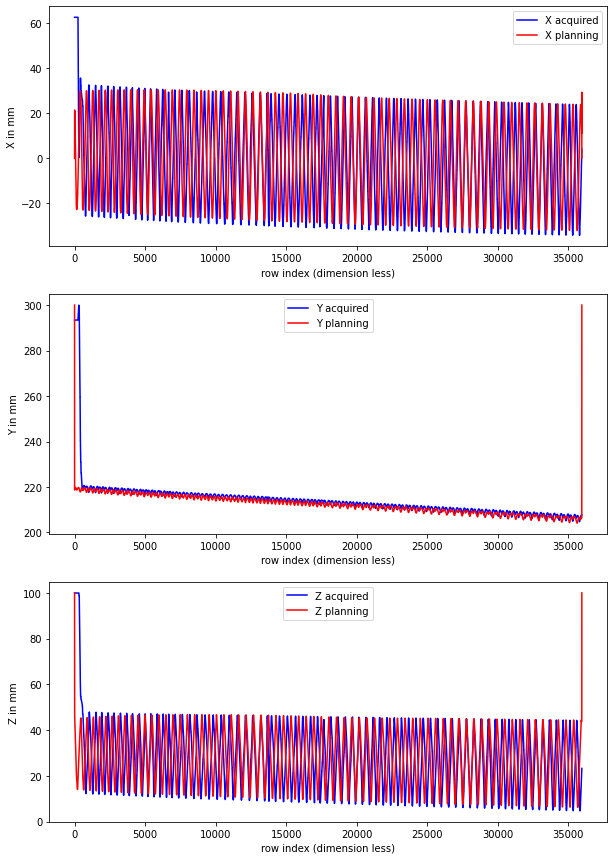

In [19]:
subplotter(0,small_shape,X,Y,Z,X_inv,Y_inv,Z_inv)

In [20]:
#subplotter(1000,34900,X,Y,Z,X_inv,Y_inv,Z_inv)

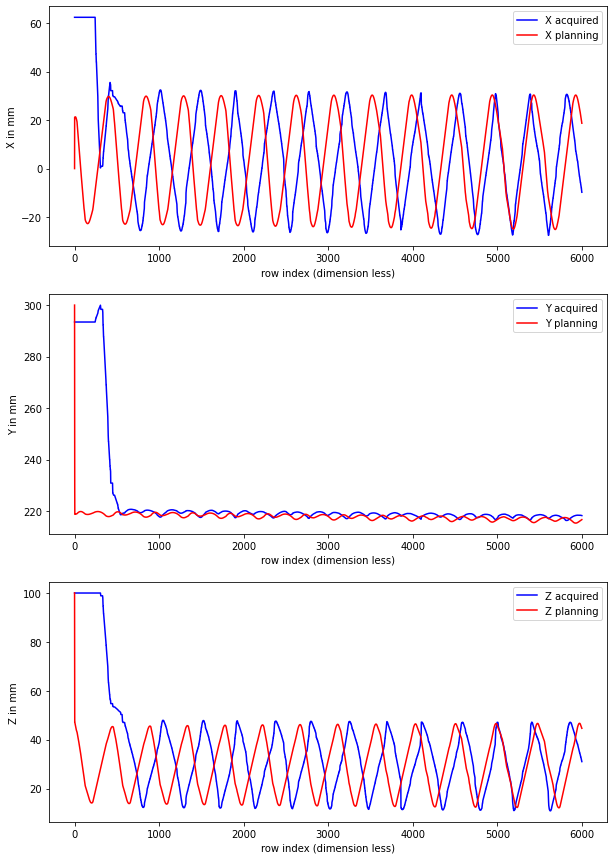

In [25]:
subplotter(0,6000,X,Y,Z,X_inv,Y_inv,Z_inv)

### Finding the closest points
Here the distances are calculated, for each aquired data point, forward transformation was performed above, and now for each of those poits the disace for all planning points are calculated. Partition the data into 5 chuncks and find the closest distance points in those chucks, if we use full set at once, we may match up with far way points, which were causing lots of outliers.the position closest the iterator is considered, since the far away values are thus avoided from matching. store both position and the value in two separate lists

In [27]:
# Here the distances are calculated, for each aquired data point, forward transformation was performed above,
# and now for each of those poits the disace for all planning points are calculated.
lst1 = []
lst2 = []

dist  = np.zeros(len(tool_tip_X))
print('Enter the tolerance number value, example 3 mm')
tol = input()

count = 0 
k = 5

for i in np.arange(len(X)):   # 47917
    
    dist = (((tool_tip_X-X[i])**2+(tool_tip_Y-Y[i])**2+(tool_tip_Z-Z[i])**2)**(1/2))
    
    # partition the data into 5 chuncks and find the closest distance points in those chucks, if we use full set at once, 
    # we may match up with far way points, which were causing lots of outliers
    
    pos = np.argpartition(dist, k)
    pos = pos[:k]
    min_val = dist[pos]
    #print(pos,min_val)
    
    # the position closest the iterator is considered, since the far away values are thus avoided from matching
    pos = pos[np.argmin(abs(pos - i))]
    min_val = dist[pos]
    
    #print(i,pos,min_val)
    # store both position and the value in two separate lists
    if(abs(min_val<=float(tol))): 
        lst1.append(pos)
        lst2.append(min_val)
        count = count+1
        print(i,pos,min_val,count)
    else:
        lst1.append(np.nan)
        lst2.append(np.nan)
   

Enter the tolerance number value, example 3 mm
3
565 2225 2.555340719978633 1
566 1784 2.234351510855094 2
567 1786 2.130285453793527 3
568 1787 2.086917226472289 4
569 1787 2.086917226472289 5
570 1787 2.086917226472289 6
571 1788 2.0744697070266525 7
572 1789 2.072824180700392 8
573 1789 2.072824180700392 9
574 8 1.9319305988744448 10
575 8 1.9319305988744448 11
576 8 1.9319305988744448 12
577 8 1.9319305988744448 13
578 8 1.9319305988744448 14
579 8 1.9319305988744448 15
580 8 1.9319305988744448 16
581 8 1.9319305988744448 17
582 8 1.9319305988744448 18
583 8 1.9319305988744448 19
584 8 1.9319305988744448 20
585 8 1.9319305988744448 21
586 8 1.9319305988744448 22
587 8 1.9319305988744448 23
588 8 1.9319305988744448 24
589 8 1.9319305988744448 25
590 8 1.9319305988744448 26
591 8 1.9319305988744448 27
592 8 1.9319305988744448 28
593 8 1.382770539455685 29
594 9 0.97703577132047 30
595 10 0.9890255635864631 31
596 11 1.211986841658271 32
597 11 1.211986841658271 33
598 14 1.6820049871

955 783 1.2369046839236506 391
956 784 1.2356532843077739 392
957 785 1.2348933432282423 393
958 786 1.2338477332444246 394
959 787 1.233659590826908 395
960 788 1.2336190493416679 396
961 788 1.2336190493416679 397
962 1233 1.22923703324898 398
963 1233 1.22923703324898 399
964 1234 1.2195725559642814 400
965 1234 1.2195725559642814 401
966 1236 1.2124429931533873 402
967 1237 1.209400243763506 403
968 1239 1.1995690765064768 404
969 1239 1.1995690765064768 405
970 1240 1.1975685960119917 406
971 1241 1.1954653191084468 407
972 1243 1.1925921959525996 408
973 801 1.2518886674181193 409
974 803 1.2552338211806502 410
975 1250 1.2393082124761212 411
976 1251 1.2372597771049627 412
977 1251 1.2372597771049627 413
978 1252 1.2355371904244805 414
979 1253 1.2305699328063826 415
980 1254 1.2298854833809145 416
981 1255 1.2293653377095501 417
982 1256 1.2298578862362408 418
983 1256 1.2298578862362408 419
984 1257 1.2306380752054513 420
985 1257 1.2306380752054513 421
986 1258 1.233484855341

1215 1001 1.868004693170958 651
1216 1003 1.8978922676769698 652
1217 1003 1.8654653737137004 653
1218 1004 1.8755365458177529 654
1219 1005 1.863862758008976 655
1220 1005 1.863862758008976 656
1221 1005 1.863862758008976 657
1222 1006 1.8812130952031993 658
1223 1007 1.9156789995788208 659
1224 1007 1.8658718469003823 660
1225 1008 1.8847147497176824 661
1226 1008 1.8495696321651027 662
1227 1009 1.8534375848597298 663
1228 1009 1.8534375848597298 664
1229 1011 1.8285078295070403 665
1230 1011 1.8285078295070403 666
1231 1013 1.7687783488761322 667
1232 1013 1.7687783488761322 668
1233 1016 1.7572608264309277 669
1234 1016 1.7572608264309277 670
1235 1019 1.7588517329771864 671
1236 1021 1.7740548197228045 672
1237 1021 1.7740548197228045 673
1238 1023 1.7970134618070668 674
1239 1026 1.8534122796657593 675
1240 1026 1.8534122796657593 676
1241 1026 1.8534122796657593 677
1242 1029 1.9368460141315416 678
1243 1029 1.9368460141315416 679
1244 1474 2.0286648392033073 680
1245 1474 2.02

1590 1382 1.9370495900410263 1026
1591 1384 1.9314750919003851 1027
1592 1385 1.9304976830593057 1028
1593 1385 1.9304976830593057 1029
1594 1386 1.945617326131575 1030
1595 1386 1.9284309612456134 1031
1596 1387 1.9331595176194831 1032
1597 1388 1.9255680274580098 1033
1598 1388 1.9255680274580098 1034
1599 1389 1.9348756978844897 1035
1600 1389 1.9274883072315578 1036
1601 1391 1.9404360356423291 1037
1602 1391 1.9404360356423291 1038
1603 1392 1.924057772374066 1039
1604 1393 1.9430573593112181 1040
1605 1393 1.9430573593112181 1041
1606 1393 1.9177089928999174 1042
1607 1394 1.9261834318665865 1043
1608 1394 1.9183511272190892 1044
1609 1395 1.9145635105652081 1045
1610 1396 1.9271043778391013 1046
1611 1397 1.913721900864266 1047
1612 1398 1.9321164213282054 1048
1613 1398 1.9321164213282054 1049
1614 1399 1.9121523759725685 1050
1615 1399 1.9121523759725685 1051
1616 1400 1.902175360008851 1052
1617 1400 1.902175360008851 1053
1618 1401 1.8988599126224421 1054
1619 1403 1.9187141

1860 1668 0.9853341497169104 1296
1861 1670 0.985648745064359 1297
1862 1671 0.9864773029728499 1298
1863 1675 0.9966716760448129 1299
1864 1676 0.9985202560356592 1300
1865 1677 1.006660687685832 1301
1866 1678 1.0100753112393681 1302
1867 1682 1.0320150347364412 1303
1868 1683 0.9685964065676392 1304
1869 1684 0.970377930434533 1305
1870 1684 0.970377930434533 1306
1871 1685 0.9720038739115292 1307
1872 1688 0.9828326530252998 1308
1873 1688 0.9828326530252998 1309
1874 1689 0.9864825646317329 1310
1875 1690 0.9906257170396929 1311
1876 1691 0.9986321644488518 1312
1877 1693 1.0096280546726932 1313
1878 1694 1.0154198227166258 1314
1879 1695 1.0217647604382492 1315
1880 1696 1.0335954690314209 1316
1881 1698 1.0493268376468246 1317
1882 1698 1.0493268376468246 1318
1883 1699 0.9935689289898659 1319
1884 1700 0.9993663661382576 1320
1885 1702 1.0056050376768901 1321
1886 1704 1.0484728037230944 1322
1887 1706 1.0455154214070455 1323
1888 1709 1.0842266137392136 1324
1889 1709 1.084226

2115 3752 2.693532645927418 1551
2116 3752 2.693532645927418 1552
2117 3754 2.699537866549687 1553
2118 3755 2.706502062200909 1554
2119 3755 2.706502062200909 1555
2120 3758 2.6838806154807364 1556
2121 3758 2.6838806154807364 1557
2122 3759 2.663660948428496 1558
2123 3759 2.663660948428496 1559
2124 3761 2.6083197867520016 1560
2125 3761 2.6083197867520016 1561
2126 3763 2.5554050984686425 1562
2127 3763 2.5554050984686425 1563
2128 3298 2.523376013322623 1564
2129 3299 2.4659970085948957 1565
2130 3300 2.410008433193484 1566
2131 2851 2.2159221200929315 1567
2132 2408 2.0829470281450244 1568
2133 2410 1.9923817250905904 1569
2134 2410 1.9923817250905904 1570
2135 2412 1.9057807040543704 1571
2136 2412 1.9057807040543704 1572
2137 1972 1.8488696947953016 1573
2138 1972 1.8488696947953016 1574
2139 1973 1.772882833271643 1575
2140 1975 1.7202046163216835 1576
2141 1976 1.6485424421403763 1577
2142 1976 1.6485424421403763 1578
2143 1980 1.5660790959229922 1579
2144 1981 1.504235475488

2389 2230 1.623529332371241 1825
2390 2231 1.6050519279686244 1826
2391 2231 1.6050519279686244 1827
2392 2234 1.595371584225597 1828
2393 2234 1.595371584225597 1829
2394 2234 1.595371584225597 1830
2395 2235 1.589219274511287 1831
2396 8 1.5178157933150935 1832
2397 8 1.5178157933150935 1833
2398 9 1.0180070646645674 1834
2399 9 0.7118974030872712 1835
2400 9 0.7118974030872712 1836
2401 10 0.5708519811325271 1837
2402 10 0.3800472989676537 1838
2403 10 0.3800472989676537 1839
2404 11 0.5312711949426517 1840
2405 11 0.5312711949426517 1841
2406 11 0.6483573611709452 1842
2407 13 1.167615041139732 1843
2408 15 1.436712314538201 1844
2409 15 1.436712314538201 1845
2410 2244 1.5953966496317273 1846
2411 2244 1.5953966496317273 1847
2412 2245 1.6271911382583522 1848
2413 2245 1.591775926412361 1849
2414 2245 1.591775926412361 1850
2415 2246 1.6070136366450423 1851
2416 2247 1.6016256692946482 1852
2417 2247 1.6016256692946482 1853
2418 2248 1.5969239924626712 1854
2419 2249 1.61933561275

2692 2536 0.8889568477573733 2128
2693 2536 0.8889568477573733 2129
2694 2537 0.8876092219341365 2130
2695 2537 0.8571425944702901 2131
2696 2537 0.8571425944702901 2132
2697 2538 0.8545138696077617 2133
2698 2539 0.8515384434758089 2134
2699 2539 0.8515384434758089 2135
2700 2540 0.8475455795937029 2136
2701 2542 0.8428219123347694 2137
2702 2543 0.8401689439568164 2138
2703 2544 0.8383247190716712 2139
2704 2544 0.8383247190716712 2140
2705 2545 0.8369493813180425 2141
2706 2546 0.8350886892386752 2142
2707 2546 0.8350886892386752 2143
2708 2548 0.8323954692486136 2144
2709 2548 0.8323954692486136 2145
2710 2550 0.8324249980578781 2146
2711 2550 0.8324249980578781 2147
2712 2552 0.831674713184989 2148
2713 2553 0.8314460008397649 2149
2714 2553 0.8314460008397649 2150
2715 2554 0.8315718450078787 2151
2716 2555 0.8363652238872779 2152
2717 2556 0.8369806677487539 2153
2718 2556 0.8369806677487539 2154
2719 2557 0.8382226557179503 2155
2720 2559 0.841183754718294 2156
2721 2559 0.8190

2963 2341 1.4144736195644418 2399
2964 2788 1.4502770116062909 2400
2965 2342 1.3942621114678309 2401
2966 2342 1.3942621114678309 2402
2967 2343 1.384855575915186 2403
2968 2345 1.3964742995514938 2404
2969 2346 1.3750328457163705 2405
2970 2347 1.3735162483501613 2406
2971 2806 1.6418762158982128 2407
2972 2808 1.7558647394210374 2408
2973 2808 1.7558647394210374 2409
2974 2810 1.8185506646894891 2410
2975 2810 1.8185506646894891 2411
2976 2810 1.8621783278437738 2412
2977 2812 1.9355460647571046 2413
2978 3266 2.061941611166142 2414
2979 3269 2.127714798182816 2415
2980 3271 2.2116277938757527 2416
2981 3271 2.2116277938757527 2417
2982 3739 2.273850765087146 2418
2983 3739 2.273850765087146 2419
2984 3741 2.3437948075210273 2420
2985 3743 2.413773697975281 2421
2986 3743 2.413773697975281 2422
2987 4217 2.473659353785866 2423
2988 4704 2.6422742033856914 2424
2989 4705 2.679522340152279 2425
2990 4705 2.679522340152279 2426
2991 4707 2.689539610280154 2427
2992 4707 2.6895396102801

3236 3089 1.7577765827697194 2672
3237 3091 1.7572021169736782 2673
3238 3092 1.7407052195865789 2674
3239 3094 1.7267108322349138 2675
3240 3094 1.7267108322349138 2676
3241 3096 1.7079602268593552 2677
3242 3098 1.6849778749877737 2678
3243 3100 1.6569118979562127 2679
3244 3100 1.6569118979562127 2680
3245 3102 1.624122973936159 2681
3246 3102 1.624122973936159 2682
3247 3105 1.555617050354659 2683
3248 3105 1.555617050354659 2684
3249 3105 1.555617050354659 2685
3250 3106 1.5290094867286126 2686
3251 3108 1.5083166889841941 2687
3252 3108 1.5083166889841941 2688
3253 3109 1.4814904432624698 2689
3254 3109 1.4814904432624698 2690
3255 3112 1.4410255065782624 2691
3256 3114 1.4323321502907456 2692
3257 3114 1.4323321502907456 2693
3258 3115 1.4110539165539397 2694
3259 3117 1.4068858750616413 2695
3260 3117 1.4068858750616413 2696
3261 3119 1.3803072728999672 2697
3262 3119 1.3803072728999672 2698
3263 3122 1.3796837597895486 2699
3264 3122 1.3796837597895486 2700
3265 3123 1.3795678

3495 2886 1.1512070443756937 2931
3496 2887 1.1449765181311136 2932
3497 2888 1.1382834578324639 2933
3498 2888 1.1382834578324639 2934
3499 2891 1.129697763324074 2935
3500 2891 1.129697763324074 2936
3501 2892 1.1232940768086268 2937
3502 2893 1.1167315960161033 2938
3503 2894 1.0544752414504996 2939
3504 2894 1.0544752414504996 2940
3505 2896 1.0417022124662763 2941
3506 2897 1.0355399286456899 2942
3507 2897 1.0355399286456899 2943
3508 2899 1.0256046033618869 2944
3509 2899 1.0256046033618869 2945
3510 2900 1.0195481488594333 2946
3511 2901 1.0131413672751077 2947
3512 2902 1.0073228925763267 2948
3513 2903 1.0009963224494303 2949
3514 2904 0.9991493765549623 2950
3515 2906 0.9871642412805492 2951
3516 2907 0.9812989449296006 2952
3517 2907 0.9812989449296006 2953
3518 2907 0.9812989449296006 2954
3519 2909 0.9749102828609042 2955
3520 2910 0.9690909063458697 2956
3521 2912 0.9577249492024615 2957
3522 2912 0.9577249492024615 2958
3523 2914 0.9529930400255151 2959
3524 2915 0.9474

3760 3628 1.349768671573596 3196
3761 3629 1.3480978000159085 3197
3762 3629 1.3480978000159085 3198
3763 3630 1.3523333386600116 3199
3764 3630 1.3605898877955653 3200
3765 3631 1.3468665786576692 3201
3766 3632 1.3592187445048 3202
3767 3632 1.3592187445048 3203
3768 3633 1.347021541118114 3204
3769 3633 1.347021541118114 3205
3770 3634 1.3638477887073865 3206
3771 3635 1.3500776813408863 3207
3772 3635 1.3500776813408863 3208
3773 3636 1.3460046261345613 3209
3774 3636 1.3460046261345613 3210
3775 3637 1.3542723874250397 3211
3776 3637 1.3542723874250397 3212
3777 3637 1.3542723874250397 3213
3778 3639 1.3583507702966515 3214
3779 3639 1.351522419127752 3215
3780 3640 1.3456786062572872 3216
3781 3640 1.3456786062572872 3217
3782 3641 1.3476206880265993 3218
3783 3182 1.3044171783305525 3219
3784 3182 1.3044171783305525 3220
3785 3644 1.3527766343073113 3221
3786 3644 1.3527766343073113 3222
3787 3645 1.3447799671821274 3223
3788 3186 1.3094701604558519 3224
3789 3188 1.316610146397

4020 3441 0.6261468468374232 3456
4021 3441 0.6261468468374232 3457
4022 3442 0.6257779358972572 3458
4023 3442 0.6257779358972572 3459
4024 3444 0.6262698933231898 3460
4025 3444 0.6262698933231898 3461
4026 3444 0.6262698933231898 3462
4027 3446 0.6340701993001459 3463
4028 3446 0.6340701993001459 3464
4029 3447 0.6349000217557823 3465
4030 3448 0.6367012422840268 3466
4031 3448 0.6219626057155062 3467
4032 3448 0.6219626057155062 3468
4033 3449 0.6151672617463042 3469
4034 3450 0.6130558557861379 3470
4035 3451 0.6112584047512902 3471
4036 3452 0.6093206893082761 3472
4037 3453 0.6079721665493928 3473
4038 3454 0.6055152514795653 3474
4039 3455 0.6051578155773298 3475
4040 3457 0.6046476242641436 3476
4041 3457 0.6046476242641436 3477
4042 3459 0.6078667829233256 3478
4043 3459 0.6078667829233256 3479
4044 3459 0.6078667829233256 3480
4045 3460 0.6093620888376755 3481
4046 3461 0.6113206134431824 3482
4047 3462 0.6136434340433753 3483
4048 3463 0.6164405110905841 3484
4049 3464 0.62

4277 3227 1.1125017942507207 3713
4278 3229 1.1399061472257541 3714
4279 3230 1.1192960658622924 3715
4280 3230 1.1192960658622924 3716
4281 3232 1.0960155981726742 3717
4282 3232 1.0960155981726742 3718
4283 3233 1.087145028692889 3719
4284 3235 1.0858318882731492 3720
4285 3235 1.0858318882731492 3721
4286 3237 1.1387545947450053 3722
4287 3237 1.085393662333164 3723
4288 3237 1.085393662333164 3724
4289 3238 1.1054935726713018 3725
4290 3238 1.0929735261863553 3726
4291 3239 1.0899150580477863 3727
4292 3239 1.0899150580477863 3728
4293 3240 1.1228281844536707 3729
4294 3240 1.0912929701486647 3730
4295 3241 1.0985121453220084 3731
4296 3242 1.0953914651924583 3732
4297 3244 1.0996280886942251 3733
4298 3245 1.0998689309607843 3734
4299 3251 1.1628128273070688 3735
4300 3254 1.2287176321025144 3736
4301 3255 1.2615760662158806 3737
4302 3255 1.2615760662158806 3738
4303 3258 1.3684724561681167 3739
4304 3259 1.4348878118104025 3740
4305 3726 1.5343524266634008 3741
4306 3728 1.60053

4544 3052 0.4910285833579867 3980
4545 3052 0.4910285833579867 3981
4546 3054 0.5026213401947084 3982
4547 3054 0.5026213401947084 3983
4548 3059 0.5962529004307858 3984
4549 3059 0.5962529004307858 3985
4550 3061 0.6294069565467649 3986
4551 3063 0.6702748763945384 3987
4552 3063 0.6702748763945384 3988
4553 3065 0.7163461858239657 3989
4554 3068 0.8074063193483139 3990
4555 3068 0.8074063193483139 3991
4556 3071 0.86737052783991 3992
4557 3071 0.86737052783991 3993
4558 3073 0.9142867570186319 3994
4559 3075 0.9582993353427096 3995
4560 3075 0.9582993353427096 3996
4561 3529 1.019017854174945 3997
4562 3529 1.019017854174945 3998
4563 3531 1.0497079644832081 3999
4564 3531 1.0497079644832081 4000
4565 3535 1.0996667752027118 4001
4566 3535 1.0996667752027118 4002
4567 3535 1.0996667752027118 4003
4568 3537 1.1193002262887717 4004
4569 3540 1.1335012582205655 4005
4570 3540 1.1335012582205655 4006
4571 3542 1.135913313410379 4007
4572 3544 1.134841850341981 4008
4573 3546 1.1298008279

4817 3793 1.0361978005639512 4253
4818 3797 0.9302223841518894 4254
4819 3800 0.872480024945658 4255
4820 3802 0.8640888103430228 4256
4821 3804 0.8505261903143816 4257
4822 3806 0.8371196399035123 4258
4823 3807 0.8339709278802144 4259
4824 3809 0.8207456379886585 4260
4825 3809 0.8207456379886585 4261
4826 3810 0.8140348113851259 4262
4827 3813 0.7998932609658349 4263
4828 3815 0.787372299212205 4264
4829 3816 0.7814031154215977 4265
4830 3817 0.7820142716632134 4266
4831 3818 0.775677746313765 4267
4832 3819 0.7695923913889786 4268
4833 3819 0.7695923913889786 4269
4834 3821 0.7574524773567289 4270
4835 3821 0.7574524773567289 4271
4836 3823 0.7541973588897556 4272
4837 3823 0.7541973588897556 4273
4838 3824 0.7481470419156261 4274
4839 3825 0.7424998434245232 4275
4840 3826 0.7366653603361182 4276
4841 3826 0.7366653603361182 4277
4842 3827 0.7407544879534502 4278
4843 3829 0.7295802333975926 4279
4844 3829 0.7295802333975926 4280
4845 3830 0.7241045279694136 4281
4846 3831 0.71825

5187 7212 2.6779018814879656 4623
5188 6706 2.6511062319750356 4624
5189 6707 2.6126775540936356 4625
5190 6707 2.6126775540936356 4626
5191 6711 2.4583843289525458 4627
5192 5713 2.197482889180378 4628
5193 5713 2.197482889180378 4629
5194 5221 2.046495259710293 4630
5195 5221 2.046495259710293 4631
5196 5224 1.8496723581424546 4632
5197 5224 1.8496723581424546 4633
5198 5224 1.8496723581424546 4634
5199 5224 1.8496723581424546 4635
5200 5226 1.736097082600869 4636
5201 5226 1.736097082600869 4637
5202 5228 1.665010661615403 4638
5203 5231 1.5507706739451168 4639
5204 5232 1.4932423414735418 4640
5205 4742 1.4030676684673318 4641
5206 4743 1.34200215204953 4642
5207 4743 1.34200215204953 4643
5208 4264 1.211961638592874 4644
5209 4265 1.1260531499126267 4645
5210 4265 1.1260531499126267 4646
5211 4268 1.0138393507151644 4647
5212 4276 0.8123899443027889 4648
5213 4277 0.8056724404911678 4649
5214 4277 0.8056724404911678 4650
5215 4279 0.791056151411768 4651
5216 4280 0.784573553451096

5446 4556 1.0637791251497686 4882
5447 4557 1.0472192386199304 4883
5448 4558 1.0339533076537688 4884
5449 4559 1.02456072111781 4885
5450 4561 1.0465553643335492 4886
5451 4561 1.0465553643335492 4887
5452 4562 1.0344092134399179 4888
5453 4563 1.0200616953510797 4889
5454 4564 1.0095739850980465 4890
5455 4565 1.0030882435595125 4891
5456 4565 1.0030882435595125 4892
5457 4567 1.0166000632546093 4893
5458 4567 1.0166000632546093 4894
5459 4569 0.9945746549537874 4895
5460 4569 0.9945746549537874 4896
5461 4571 1.0219156784150567 4897
5462 4572 1.0035734230825382 4898
5463 4572 1.0035734230825382 4899
5464 4572 1.0035734230825382 4900
5465 4575 1.032886388403264 4901
5466 4575 1.032886388403264 4902
5467 4576 0.970307810778039 4903
5468 4576 0.970307810778039 4904
5469 4576 0.970307810778039 4905
5470 4577 0.9761017625831677 4906
5471 4577 0.9761017625831677 4907
5472 4578 1.0132895379756333 4908
5473 4578 0.9604037613347018 4909
5474 4578 0.9604037613347018 4910
5475 4579 0.960672526

5706 4339 0.43763914810881166 5142
5707 4341 0.4491451974725313 5143
5708 4341 0.4491451974725313 5144
5709 4342 0.4450313466664539 5145
5710 4343 0.4409861247327667 5146
5711 4344 0.4371825076511188 5147
5712 4345 0.4332045646375501 5148
5713 4346 0.4508190840505045 5149
5714 4346 0.4508190840505045 5150
5715 4348 0.44340399817648785 5151
5716 4349 0.4395932836255142 5152
5717 4829 0.48912517645661774 5153
5718 4829 0.4834104081929747 5154
5719 4830 0.4816307330115541 5155
5720 4831 0.4798752276718872 5156
5721 4832 0.4781289774255459 5157
5722 4832 0.4781289774255459 5158
5723 4834 0.4647577605519803 5159
5724 4834 0.4647577605519803 5160
5725 4835 0.4629417180208224 5161
5726 4836 0.46111470556141826 5162
5727 4837 0.4592757176911049 5163
5728 4838 0.4578334287385762 5164
5729 4838 0.4578334287385762 5165
5730 4838 0.4578334287385762 5166
5731 4840 0.44575231642834606 5167
5732 4842 0.4423994885453952 5168
5733 4843 0.4404999865527087 5169
5734 4843 0.4404999865527087 5170
5735 4844

5957 5076 0.8907624577687222 5393
5958 4597 0.8685855370064298 5394
5959 5078 0.8830984661830207 5395
5960 5078 0.8880140355526557 5396
5961 5079 0.871094554948757 5397
5962 4599 0.7992753462121754 5398
5963 4600 0.8269505507894569 5399
5964 5081 0.8712499715117835 5400
5965 5081 0.8712499715117835 5401
5966 4602 0.8373326090487023 5402
5967 4602 0.8373326090487023 5403
5968 4603 0.798409853089821 5404
5969 4603 0.798409853089821 5405
5970 4604 0.837695252648356 5406
5971 5085 0.8906278155906423 5407
5972 5085 0.8906278155906423 5408
5973 4606 0.8511803949668568 5409
5974 4606 0.7843644704202514 5410
5975 4606 0.7843644704202514 5411
5976 4607 0.8021697271633155 5412
5977 4608 0.8530115405827688 5413
5978 4608 0.7829536386669381 5414
5979 4609 0.8101640999885751 5415
5980 4609 0.785485217201895 5416
5981 4610 0.7808167527439966 5417
5982 4611 0.8110726474221162 5418
5983 4611 0.8110726474221162 5419
5984 4612 0.7831181004448051 5420
5985 4612 0.7831181004448051 5421
5986 4613 0.8231939

6318 5042 0.8194491035602152 5754
6319 5043 0.8097563477415003 5755
6320 5044 0.8053280657448683 5756
6321 5046 0.8272569067216835 5757
6322 5046 0.8272569067216835 5758
6323 5048 0.8005439451529115 5759
6324 5048 0.8005439451529115 5760
6325 5050 0.833424649229152 5761
6326 5050 0.833424649229152 5762
6327 5052 0.8028486007210142 5763
6328 5053 0.7912489358506694 5764
6329 5053 0.7912489358506694 5765
6330 5055 0.8248738319894057 5766
6331 5055 0.8248738319894057 5767
6332 5056 0.8045858745773413 5768
6333 5056 0.8045858745773413 5769
6334 5547 0.8503673194797456 5770
6335 5058 0.7817977158426991 5771
6336 5059 0.7758145868150617 5772
6337 5059 0.7758145868150617 5773
6338 5551 0.8465170440990215 5774
6339 5552 0.8419938875004122 5775
6340 5552 0.8419938875004122 5776
6341 5552 0.8419938875004122 5777
6342 5554 0.8641548726249964 5778
6343 5556 0.8393767169060737 5779
6344 5556 0.8393767169060737 5780
6345 5557 0.8685181474155014 5781
6346 5557 0.8685181474155014 5782
6347 5064 0.8117

6593 5307 0.32954827990013724 6029
6594 5307 0.32954827990013724 6030
6595 5308 0.32663929963795507 6031
6596 5309 0.3240693028300171 6032
6597 5309 0.3240693028300171 6033
6598 5311 0.3206311671422594 6034
6599 5312 0.3176683469624936 6035
6600 5313 0.31477260913231814 6036
6601 5314 0.31182114971151875 6037
6602 5314 0.31182114971151875 6038
6603 5316 0.3115017371218742 6039
6604 5317 0.3086260812293183 6040
6605 5318 0.3058830610780843 6041
6606 5318 0.3058830610780843 6042
6607 5320 0.30884957685428405 6043
6608 5320 0.30884957685428405 6044
6609 5321 0.30563003197936484 6045
6610 5322 0.3026590772125952 6046
6611 5323 0.2997464266044185 6047
6612 5324 0.2970295286024979 6048
6613 5325 0.30573762168429813 6049
6614 5326 0.302803859694879 6050
6615 5327 0.29998284517928286 6051
6616 5327 0.29998284517928286 6052
6617 5327 0.29998284517928286 6053
6618 5329 0.29443084439203043 6054
6619 5329 0.29443084439203043 6055
6620 5331 0.30315426939982426 6056
6621 5331 0.30315426939982426 605

6884 8741 2.670438590424032 6320
6885 8741 2.670438590424032 6321
6886 8744 2.7163750573783685 6322
6887 8744 2.7163750573783685 6323
6888 8745 2.733007400314936 6324
6889 8745 2.733007400314936 6325
6890 8745 2.733007400314936 6326
6891 8747 2.7305938827446394 6327
6892 8749 2.715672084376455 6328
6893 8752 2.6585719215463532 6329
6894 8754 2.584960213187933 6330
6895 8755 2.5436375514922656 6331
6896 8244 2.4883590471337937 6332
6897 8245 2.4273610595148676 6333
6898 8245 2.4273610595148676 6334
6899 8246 2.3683830395719214 6335
6900 8246 2.3683830395719214 6336
6901 8246 2.3683830395719214 6337
6902 7736 2.2220562557584436 6338
6903 7736 2.2220562557584436 6339
6904 7736 2.2220562557584436 6340
6905 7738 2.1327608151548563 6341
6906 7227 2.0626172524042388 6342
6907 7227 2.0626172524042388 6343
6908 7229 1.962276174914166 6344
6909 7229 1.962276174914166 6345
6910 7229 1.962276174914166 6346
6911 6724 1.8308457672653455 6347
6912 6726 1.7689110080431367 6348
6913 6726 1.768911008043

7177 6025 0.7318094544643088 6613
7178 5532 0.7243060154264387 6614
7179 6028 0.725465574607678 6615
7180 6029 0.7177208372468413 6616
7181 6030 0.7157585358274328 6617
7182 6030 0.7157585358274328 6618
7183 5537 0.7065037364274379 6619
7184 6033 0.7124785415721191 6620
7185 6034 0.7033905702316287 6621
7186 6034 0.7033905702316287 6622
7187 5542 0.6959074470164076 6623
7188 5542 0.6959074470164076 6624
7189 6038 0.6966498483061543 6625
7190 6038 0.6966498483061543 6626
7191 6040 0.6863795541718775 6627
7192 6040 0.6863795541718775 6628
7193 5547 0.6838769255580881 6629
7194 6043 0.6839661779573519 6630
7195 6044 0.6760080133979365 6631
7196 6044 0.6760080133979365 6632
7197 6045 0.6737270641022514 6633
7198 6046 0.6770431686247503 6634
7199 6048 0.6725781940604876 6635
7200 6048 0.6725781940604876 6636
7201 6049 0.6649967136849408 6637
7202 6050 0.6648341817632011 6638
7203 6050 0.6648341817632011 6639
7204 6052 0.676291206209967 6640
7205 6052 0.676291206209967 6641
7206 6053 0.66230

7451 5788 0.3531678914988257 6887
7452 5790 0.3773401687279239 6888
7453 5790 0.3773401687279239 6889
7454 5792 0.3699329001234239 6890
7455 5792 0.3699329001234239 6891
7456 5793 0.3659862163068223 6892
7457 5793 0.3659862163068223 6893
7458 5793 0.19119550408975164 6894
7459 5795 0.18475864378479379 6895
7460 5796 0.18185276396293965 6896
7461 5797 0.17866761570931392 6897
7462 5797 0.17866761570931392 6898
7463 5799 0.1792120528389312 6899
7464 5800 0.1762670014769201 6900
7465 5800 0.1762670014769201 6901
7466 5801 0.1729683841046471 6902
7467 5802 0.17004991966881544 6903
7468 5803 0.17916974905104582 6904
7469 5804 0.17602453521460554 6905
7470 6306 0.33467898116725237 6906
7471 6307 0.3325646775181717 6907
7472 6307 0.3325646775181717 6908
7473 6307 0.3325646775181717 6909
7474 6308 0.3301150368472367 6910
7475 6309 0.32115775060767354 6911
7476 6310 0.31867765402343456 6912
7477 6311 0.31622881050717827 6913
7478 6312 0.3137021025218131 6914
7479 6312 0.3137021025218131 6915
74

7721 6565 0.6284178960485215 7157
7722 6565 0.6284178960485215 7158
7723 6064 0.5536845908612994 7159
7724 6566 0.5988982436211131 7160
7725 6566 0.5988982436211131 7161
7726 6567 0.6328803157344483 7162
7727 6568 0.6050768454148314 7163
7728 6568 0.6050768454148314 7164
7729 6568 0.6050768454148314 7165
7730 6067 0.5147764034093185 7166
7731 6068 0.5705215814935178 7167
7732 6570 0.6079143610330338 7168
7733 6570 0.6079143610330338 7169
7734 6069 0.5222036751856124 7170
7735 6572 0.6182189662703055 7171
7736 6572 0.6182189662703055 7172
7737 6072 0.5922887228337473 7173
7738 6072 0.5922887228337473 7174
7739 6073 0.5342066565135108 7175
7740 6575 0.6054947987369271 7176
7741 6575 0.6054947987369271 7177
7742 6075 0.5352379375041708 7178
7743 6075 0.5352379375041708 7179
7744 6076 0.4985895169349308 7180
7745 6076 0.4985895169349308 7181
7746 6077 0.5520519447390756 7182
7747 6077 0.5520519447390756 7183
7748 6579 0.6149123300392814 7184
7749 6079 0.5727099257171302 7185
7750 6079 0.57

7984 6300 0.18217406702036087 7420
7985 6301 0.17887412859993485 7421
7986 6301 0.17887412859993485 7422
7987 6302 0.17552856506509404 7423
7988 6303 0.17244300616927694 7424
7989 6304 0.1860059957521156 7425
7990 6305 0.18288171985992063 7426
7991 6305 0.18288171985992063 7427
7992 6306 0.17944321769759508 7428
7993 6307 0.17614708089948075 7429
7994 6307 0.17614708089948075 7430
7995 6308 0.1727614087081025 7431
7996 6309 0.1918649748181129 7432
7997 6310 0.1887834893663935 7433
7998 6310 0.1887834893663935 7434
7999 6311 0.1853916322385636 7435
8000 6312 0.18223747606410245 7436
8001 6312 0.18223747606410245 7437
8002 6313 0.17904244909846184 7438
8003 6314 0.20227719487218201 7439
8004 6818 0.31472562092432355 7440
8005 6819 0.31189152853230434 7441
8006 6819 0.31189152853230434 7442
8007 6820 0.30912473220991443 7443
8008 6821 0.3063117714258891 7444
8009 6821 0.3063117714258891 7445
8010 6822 0.30646645366441166 7446
8011 6823 0.3037079987803955 7447
8012 6824 0.300862910148525 7

8253 6557 0.5032064135347664 7689
8254 7060 0.58292975384093 7690
8255 7061 0.5908622441753809 7691
8256 7061 0.5908622441753809 7692
8257 7063 0.5797957284617871 7693
8258 7064 0.5756724065793982 7694
8259 7064 0.5756724065793982 7695
8260 6561 0.5435058500822363 7696
8261 7065 0.5877329144954149 7697
8262 7066 0.5729837333366005 7698
8263 6563 0.5648161726725173 7699
8264 7067 0.5798668363108797 7700
8265 7068 0.5724928964884904 7701
8266 7068 0.5724928964884904 7702
8267 6565 0.5898236344204527 7703
8268 7069 0.5717766549311157 7704
8269 7069 0.5717766549311157 7705
8270 7070 0.5800671151822948 7706
8271 6566 0.47447745951537484 7707
8272 7071 0.5721332982142623 7708
8273 7071 0.5721332982142623 7709
8274 6568 0.5254226410976012 7710
8275 7072 0.5953490640557262 7711
8276 7072 0.5953490640557262 7712
8277 7072 0.5953490640557262 7713
8278 7073 0.5732818920391174 7714
8279 6570 0.528049932747668 7715
8280 6570 0.528049932747668 7716
8281 7074 0.5954198524113998 7717
8282 7075 0.57816

8537 6786 0.23472405022836307 7973
8538 6787 0.22647071724722204 7974
8539 6788 0.22355669218266516 7975
8540 6789 0.22056057060188006 7976
8541 6790 0.21767950007861872 7977
8542 6791 0.21485527323657272 7978
8543 6792 0.21207950302136305 7979
8544 6793 0.20900883107748536 7980
8545 6793 0.20900883107748536 7981
8546 6794 0.20603528597899237 7982
8547 6794 0.20603528597899237 7983
8548 6795 0.20291208076350856 7984
8549 6796 0.19998405321827492 7985
8550 6797 0.20330995092307402 7986
8551 6798 0.20024080299369118 7987
8552 6799 0.1969711271855043 7988
8553 6800 0.19378064634502742 7989
8554 6800 0.19378064634502742 7990
8555 6801 0.19082300255325108 7991
8556 6802 0.20051441160163777 7992
8557 6803 0.19724951340073252 7993
8558 6803 0.19724951340073252 7994
8559 6804 0.19402045285682168 7995
8560 6805 0.1908746736166323 7996
8561 6806 0.1875932402879738 7997
8562 6806 0.1875932402879738 7998
8563 6807 0.20310660052996873 7999
8564 6807 0.20310660052996873 8000
8565 6808 0.200027808237

8815 7095 0.4931835867980735 8251
8816 7096 0.4380457387197919 8252
8817 6593 0.3040917360837554 8253
8818 6594 0.33552750240521856 8254
8819 7099 0.4413735659838327 8255
8820 7099 0.4413735659838327 8256
8821 6596 0.38337724507648835 8257
8822 6597 0.3590608682112935 8258
8823 6598 0.3238921351980224 8259
8824 6599 0.41613421538402795 8260
8825 6600 0.3676818260427249 8261
8826 6601 0.3298705590594158 8262
8827 6601 0.3298705590594158 8263
8828 6602 0.3156453663179959 8264
8829 6603 0.30273578951365454 8265
8830 6603 0.30273578951365454 8266
8831 6605 0.3548481271470941 8267
8832 6606 0.3219544496025827 8268
8833 6607 0.305419817206949 8269
8834 6608 0.3044722473631379 8270
8835 6610 0.34562224354023635 8271
8836 6611 0.31752354281113354 8272
8837 6611 0.31752354281113354 8273
8838 6612 0.30635060887026605 8274
8839 6613 0.31377824476410804 8275
8840 6613 0.31377824476410804 8276
8841 6615 0.3394550357167903 8277
8842 6616 0.31581001350299975 8278
8843 6617 0.3095688127498582 8279
884

9127 7874 0.3366956709921669 8563
9128 7874 0.34250287802538615 8564
9129 7874 0.34250287802538615 8565
9130 7875 0.3397201196796208 8566
9131 7876 0.3279298362388213 8567
9132 7876 0.3279298362388213 8568
9133 7876 0.3279298362388213 8569
9134 7877 0.3269209832717821 8570
9135 7878 0.32654608951505065 8571
9136 7878 0.32654608951505065 8572
9137 7879 0.3266319052787779 8573
9138 7879 0.3266319052787779 8574
9139 7880 0.3275318350664823 8575
9140 7880 0.3275318350664823 8576
9141 7370 0.19784746968888497 8577
9142 7370 0.19784746968888497 8578
9143 7370 0.19784746968888497 8579
9144 7371 0.20876496645586826 8580
9145 7372 0.22059463975793145 8581
9146 7373 0.23257481302792304 8582
9147 7373 0.23257481302792304 8583
9148 7375 0.271632247909549 8584
9149 7375 0.271632247909549 8585
9150 7376 0.2856908389824116 8586
9151 7376 0.2856908389824116 8587
9152 7377 0.3000927632973711 8588
9153 7378 0.3149388141186982 8589
9154 7379 0.34467614739334984 8590
9155 7380 0.3602923545097968 8591
9156

9392 7096 0.34213781986648123 8828
9393 7096 0.34213781986648123 8829
9394 7097 0.3016009337632543 8830
9395 7098 0.2773186646027529 8831
9396 7099 0.35127532180125237 8832
9397 7100 0.30872791328805105 8833
9398 7100 0.30941261377286405 8834
9399 7101 0.27523899846808547 8835
9400 7103 0.33678862877725974 8836
9401 7103 0.33678862877725974 8837
9402 7104 0.299517408739336 8838
9403 7104 0.299517408739336 8839
9404 7105 0.27941657878311166 8840
9405 7107 0.37128121579692325 8841
9406 7107 0.28848252240894656 8842
9407 7109 0.29433091640986503 8843
9408 7110 0.28051958459569953 8844
9409 7110 0.28051958459569953 8845
9410 7111 0.2873004814186178 8846
9411 7111 0.2873004814186178 8847
9412 7113 0.31886432753121763 8848
9413 7114 0.29236138245644366 8849
9414 7115 0.28454110031889723 8850
9415 7116 0.29683020058737414 8851
9416 7118 0.3018247790956771 8852
9417 7119 0.2932848275875701 8853
9418 7120 0.29071236990371685 8854
9419 7122 0.32839874972397265 8855
9420 7123 0.3024717053112879 8

9689 7864 0.20600011653875785 9125
9690 7864 0.20600011653875785 9126
9691 7865 0.2112086752581317 9127
9692 7865 0.2112086752581317 9128
9693 8379 0.3091052670938492 9129
9694 8379 0.3091052670938492 9130
9695 8379 0.3091052670938492 9131
9696 8380 0.3200555406430581 9132
9697 8381 0.32330705624058875 9133
9698 8381 0.32330705624058875 9134
9699 7869 0.2634593615964093 9135
9700 7870 0.27193626116459824 9136
9701 7871 0.2808809205098679 9137
9702 7871 0.2808809205098679 9138
9703 7872 0.3143852042176154 9139
9704 7873 0.32432956939793245 9140
9705 7874 0.3348538063362012 9141
9706 7874 0.3348538063362012 9142
9707 8387 0.3352461127952521 9143
9708 8388 0.3338079848186817 9144
9709 8388 0.3338079848186817 9145
9710 8388 0.3338079848186817 9146
9711 8389 0.32665233375112135 9147
9712 7877 0.16473886841492105 9148
9713 7877 0.16473886841492105 9149
9714 7878 0.17272972089073238 9150
9715 7878 0.17272972089073238 9151
9716 7879 0.1815288578460066 9152
9717 7879 0.1815288578460066 9153
971

10049 8716 1.2809926603945885 9485
10050 9232 1.3689747928961067 9486
10051 9233 1.4360851623249404 9487
10052 9233 1.4360851623249404 9488
10053 9235 1.5096291003134708 9489
10054 9237 1.5911731746921116 9490
10055 9758 1.6659898734238012 9491
10056 9760 1.737635407335474 9492
10057 9761 1.79500007656406 9493
10058 10285 1.8763307623897256 9494
10059 10286 1.9355061687653514 9495
10060 10287 1.9984975627383714 9496
10061 10288 2.063964672822991 9497
10062 10288 2.063964672822991 9498
10063 10289 2.1295468319269375 9499
10064 10289 2.1295468319269375 9500
10065 10291 2.216507759679481 9501
10066 10294 2.297039896708978 9502
10067 10817 2.3633652226530866 9503
10068 10817 2.3633652226530866 9504
10069 10819 2.432628069241475 9505
10070 10821 2.500813729201171 9506
10071 10821 2.500813729201171 9507
10072 10821 2.500813729201171 9508
10073 11344 2.5526796899327904 9509
10074 11344 2.5526796899327904 9510
10075 11346 2.5956521894752793 9511
10076 11347 2.647540815015872 9512
10077 11347 2

10305 8406 0.34903104261950246 9741
10306 8406 0.26407096399573826 9742
10307 8407 0.26534626598690336 9743
10308 8408 0.268180242052082 9744
10309 8409 0.2717378008200777 9745
10310 8409 0.2717378008200777 9746
10311 8409 0.2717378008200777 9747
10312 8410 0.27687793581356657 9748
10313 8411 0.2839740286156899 9749
10314 8412 0.2915339746293289 9750
10315 8413 0.30007046628210976 9751
10316 8414 0.30930889236865095 9752
10317 8415 0.32601824345459124 9753
10318 8416 0.3372877514576593 9754
10319 8416 0.3372877514576593 9755
10320 8419 0.3733918884198925 9756
10321 8419 0.3391373390997729 9757
10322 8419 0.3391373390997729 9758
10323 8420 0.3388526178420304 9759
10324 8421 0.3394694095990115 9760
10325 8422 0.34063891087174003 9761
10326 8422 0.34063891087174003 9762
10327 8423 0.3428481721696777 9763
10328 8424 0.3453916155507432 9764
10329 8425 0.34985595570328926 9765
10330 8426 0.35505038031192876 9766
10331 8426 0.35505038031192876 9767
10332 8427 0.3603349228527305 9768
10333 842

10589 8174 0.3249514868055587 10025
10590 7663 0.29466648755499497 10026
10591 7664 0.24187976126132787 10027
10592 8178 0.3402400611085069 10028
10593 8179 0.33274617043015176 10029
10594 7668 0.314410734610068 10030
10595 7669 0.2628895156666568 10031
10596 7669 0.2628895156666568 10032
10597 8183 0.34633811283756044 10033
10598 8183 0.34633811283756044 10034
10599 8184 0.34610136622660637 10035
10600 7673 0.3326119220782864 10036
10601 8186 0.3906201866175396 10037
10602 8188 0.40567900331464585 10038
10603 8189 0.42775596723111786 10039
10604 8189 0.42775596723111786 10040
10605 8190 0.46053405137515147 10041
10606 8190 0.46053405137515147 10042
10607 8191 0.5077719880575645 10043
10608 8193 0.6262508808753083 10044
10609 8194 0.6578198689971397 10045
10610 8708 0.7496558601258222 10046
10611 8709 0.7935409440166041 10047
10612 8710 0.8518873775949979 10048
10613 8711 0.9174129800097789 10049
10614 8711 0.9174129800097789 10050
10615 8711 0.9174129800097789 10051
10616 9227 1.03510

10871 8916 0.27844332316860104 10307
10872 8918 0.303700302820189 10308
10873 8918 0.303700302820189 10309
10874 8919 0.31722392653157894 10310
10875 8919 0.31722392653157894 10311
10876 8920 0.3309284139891652 10312
10877 8920 0.3309284139891652 10313
10878 8921 0.3580853491314967 10314
10879 8921 0.2844409413030028 10315
10880 8922 0.28550391044777035 10316
10881 8923 0.2875218418068972 10317
10882 8924 0.2909444944334771 10318
10883 8925 0.29508569900376364 10319
10884 8926 0.30124044065502126 10320
10885 8926 0.30124044065502126 10321
10886 8927 0.3080657328060369 10322
10887 8928 0.3157555539197596 10323
10888 8928 0.3157555539197596 10324
10889 8929 0.3242047189465928 10325
10890 8930 0.33945332768939024 10326
10891 8931 0.3499247847659205 10327
10892 8932 0.360542088114312 10328
10893 8933 0.3720510504255395 10329
10894 8933 0.3720510504255395 10330
10895 8934 0.383685455434541 10331
10896 8934 0.3555525406841172 10332
10897 8935 0.3547109230276094 10333
10898 8936 0.35473607109

11156 8167 0.29827959442474167 10592
11157 8168 0.23778124136942103 10593
11158 8169 0.18486099957668178 10594
11159 8170 0.17834545616637518 10595
11160 8172 0.1848588126623442 10596
11161 8173 0.2629069293108303 10597
11162 8173 0.2629069293108303 10598
11163 8174 0.2096078678216906 10599
11164 8175 0.16878950931276462 10600
11165 8177 0.30942267498199927 10601
11166 8177 0.30942267498199927 10602
11167 8178 0.2532716197326239 10603
11168 8179 0.2302336984654101 10604
11169 8180 0.18856630812171854 10605
11170 8180 0.18856630812171854 10606
11171 8182 0.3309294080865937 10607
11172 8183 0.27713228170594184 10608
11173 8184 0.2349095145918464 10609
11174 8185 0.22300528470546704 10610
11175 8187 0.34613398567483666 10611
11176 8188 0.3431265171820677 10612
11177 8188 0.3431265171820677 10613
11178 8702 0.4093799597167164 10614
11179 8703 0.4255219908717251 10615
11180 8704 0.45473433146533937 10616
11181 8705 0.4968709066955524 10617
11182 8708 0.6548060494180479 10618
11183 8709 0.69

11456 9445 0.37298163870979395 10892
11457 9445 0.3437922747530497 10893
11458 9446 0.34351247361377774 10894
11459 9447 0.3438463671758626 10895
11460 9448 0.3450850231659139 10896
11461 9449 0.34697231484658053 10897
11462 9450 0.3491703824122323 10898
11463 9451 0.353434375199965 10899
11464 9451 0.353434375199965 10900
11465 9452 0.3581911251720131 10901
11466 9453 0.363954850164524 10902
11467 9454 0.3699655604195313 10903
11468 8938 0.3111175795135889 10904
11469 8939 0.3219955444747169 10905
11470 8940 0.33331329734813725 10906
11471 8941 0.34430565538834607 10907
11472 8941 0.34430565538834607 10908
11473 8941 0.34430565538834607 10909
11474 8942 0.35412168597902294 10910
11475 8943 0.3351658888124768 10911
11476 8944 0.3349912780603262 10912
11477 8945 0.2942885014850939 10913
11478 8946 0.241324456371803 10914
11479 8947 0.14996812704178647 10915
11480 8949 0.1897758509326559 10916
11481 8949 0.1897758509326559 10917
11482 8951 0.23035475069155786 10918
11483 8952 0.254503315

11772 11329 1.7239962848201307 11208
11773 11331 1.7941423077654508 11209
11774 11333 1.8701369753182862 11210
11775 11859 1.939042360554656 11211
11776 11860 2.002518002211044 11212
11777 11861 2.066238880773673 11213
11778 11862 2.1318534335175547 11214
11779 11864 2.194530618766857 11215
11780 11866 2.279463278257008 11216
11781 11866 2.279463278257008 11217
11782 11866 2.279463278257008 11218
11783 12394 2.3490695837837103 11219
11784 12396 2.4171408341771228 11220
11785 12396 2.4171408341771228 11221
11786 12397 2.492495094350096 11222
11787 12397 2.492495094350096 11223
11788 12399 2.5503662695114957 11224
11789 12399 2.5503662695114957 11225
11790 12931 2.5856520643334697 11226
11791 12931 2.5856520643334697 11227
11792 12932 2.6368290335753635 11228
11793 12934 2.668760939894178 11229
11794 12934 2.668760939894178 11230
11795 12935 2.7030029802793654 11231
11796 12935 2.7030029802793654 11232
11797 12937 2.7226608703087902 11233
11798 12938 2.7378701244345733 11234
11799 12938 

12045 9454 0.3911554711792399 11481
12046 9974 0.39515553119639263 11482
12047 9975 0.3942789453389024 11483
12048 9976 0.3938714448741514 11484
12049 9977 0.3935848881362413 11485
12050 9458 0.27715532321125447 11486
12051 9458 0.27715532321125447 11487
12052 9459 0.2751255814177798 11488
12053 9460 0.2544241436186364 11489
12054 9461 0.21584797789162333 11490
12055 9462 0.1793949218710089 11491
12056 9464 0.2674913969895089 11492
12057 9465 0.15604733901887094 11493
12058 9465 0.15604733901887094 11494
12059 9467 0.2048362776265619 11495
12060 9468 0.2115559277596328 11496
12061 9470 0.34266138126262136 11497
12062 9471 0.36088668231396426 11498
12063 9471 0.36088668231396426 11499
12064 9472 0.39242638524216855 11500
12065 9474 0.48617439943239243 11501
12066 9474 0.48617439943239243 11502
12067 9475 0.50979964235003 11503
12068 9477 0.5863403318924604 11504
12069 9478 0.6106103032113442 11505
12070 9481 0.7066639875077675 11506
12071 9483 0.7512648334294817 11507
12072 9483 0.75126

12338 10275 1.1569220422016389 11774
12339 10799 1.23019462864423 11775
12340 10800 1.2902641213017083 11776
12341 10802 1.3958030609401677 11777
12342 11325 1.4754233674121338 11778
12343 11327 1.548861514912657 11779
12344 11329 1.6313793794362406 11780
12345 11329 1.6313793794362406 11781
12346 11329 1.6313793794362406 11782
12347 11856 1.707144465530182 11783
12348 11858 1.7790321122555004 11784
12349 11859 1.8380922355823641 11785
12350 11861 1.9159966235201116 11786
12351 12388 2.0403604599690013 11787
12352 12389 2.1031711019510806 11788
12353 12391 2.1696404311887885 11789
12354 12393 2.2548094811259576 11790
12355 12393 2.2548094811259576 11791
12356 12393 2.2548094811259576 11792
12357 12395 2.3405923122827215 11793
12358 12926 2.40911406602183 11794
12359 12926 2.40911406602183 11795
12360 12928 2.4709537511008945 11796
12361 12930 2.5322527252802254 11797
12362 12930 2.5322527252802254 11798
12363 13460 2.5852330499285876 11799
12364 13460 2.5852330499285876 11800
12365 134

12600 10547 1.0661935550957353 12036
12601 11070 1.0892698131507097 12037
12602 11070 1.0892698131507097 12038
12603 10551 1.058332822430924 12039
12604 10551 1.058332822430924 12040
12605 10551 1.058332822430924 12041
12606 10554 1.058256489747284 12042
12607 10556 1.0443228264443316 12043
12608 10556 1.0443228264443316 12044
12609 10559 1.0366060115525055 12045
12610 10561 1.0123535719868177 12046
12611 10561 1.0123535719868177 12047
12612 10564 1.0002326878916348 12048
12613 10566 0.9657968567891334 12049
12614 10566 0.9657968567891334 12050
12615 10566 0.9657968567891334 12051
12616 10568 0.932873892475993 12052
12617 10570 0.9013031121899928 12053
12618 10570 0.9013031121899928 12054
12619 10049 0.8553542341515055 12055
12620 10051 0.7968493373577189 12056
12621 10051 0.7968493373577189 12057
12622 10053 0.7379122990649543 12058
12623 10053 0.7379122990649543 12059
12624 10055 0.6788359588716688 12060
12625 10055 0.6788359588716688 12061
12626 10058 0.6369865301375759 12062
12627 

12877 12927 2.390128250751962 12313
12878 13457 2.4525902279423026 12314
12879 13457 2.4525902279423026 12315
12880 13459 2.51096463068177 12316
12881 13459 2.51096463068177 12317
12882 13459 2.51096463068177 12318
12883 13461 2.5688210101054683 12319
12884 13991 2.6148226929995517 12320
12885 13991 2.6148226929995517 12321
12886 13993 2.6467804263088928 12322
12887 13994 2.686943554418293 12323
12888 13994 2.686943554418293 12324
12889 13994 2.686943554418293 12325
12890 13994 2.686943554418293 12326
12891 13996 2.7065966410140816 12327
12892 13997 2.728291021427873 12328
12893 13997 2.728291021427873 12329
12894 13999 2.735166061133482 12330
12895 13999 2.735166061133482 12331
12896 14000 2.7364330233190746 12332
12897 14000 2.7364330233190746 12333
12898 14000 2.7364330233190746 12334
12899 14001 2.7300997690169306 12335
12900 14002 2.71594714227796 12336
12901 14002 2.71594714227796 12337
12902 14004 2.6853522040031894 12338
12903 14004 2.669403754231802 12339
12904 14006 2.6159310

13165 11585 1.0711113462010327 12601
13166 11585 1.0711113462010327 12602
13167 11065 1.084370330293371 12603
13168 11590 1.1109534216604242 12604
13169 11590 1.1109534216604242 12605
13170 11592 1.1193167587274602 12606
13171 11595 1.1274920953979635 12607
13172 11595 1.1274920953979635 12608
13173 11075 1.1166599912595632 12609
13174 11075 1.1166599912595632 12610
13175 11075 1.1166599912595632 12611
13176 11600 1.1225746135289196 12612
13177 11080 1.098962939026227 12613
13178 11080 1.098962939026227 12614
13179 11082 1.0731339308975418 12615
13180 11085 1.0633260649592222 12616
13181 11085 1.0633260649592222 12617
13182 11087 1.027561624988319 12618
13183 11087 1.027561624988319 12619
13184 11089 0.9927223270637152 12620
13185 11089 0.9927223270637152 12621
13186 11092 0.9680219731327577 12622
13187 11094 0.9226185067247895 12623
13188 11094 0.9226185067247895 12624
13189 11096 0.877653965988614 12625
13190 10577 0.8051487692132427 12626
13191 10577 0.8051487692132427 12627
13192 1

13427 12919 1.9165666374981736 12863
13428 12919 1.9165666374981736 12864
13429 13448 1.9890914849720152 12865
13430 13449 2.049805903754418 12866
13431 13450 2.1130518625405994 12867
13432 13454 2.2599487913400664 12868
13433 13454 2.2599487913400664 12869
13434 13986 2.4183158558114317 12870
13435 13986 2.4183158558114317 12871
13436 13986 2.4183158558114317 12872
13437 13990 2.5347476610715534 12873
13438 13990 2.5347476610715534 12874
13439 13990 2.5347476610715534 12875
13440 13992 2.5929886061932654 12876
13441 14527 2.6282834228862497 12877
13442 14527 2.6282834228862497 12878
13443 14527 2.6282834228862497 12879
13444 14529 2.6599105601495237 12880
13445 14530 2.693679386388125 12881
13446 14530 2.693679386388125 12882
13447 14531 2.722259382144835 12883
13448 14533 2.728876096963861 12884
13449 14533 2.728876096963861 12885
13450 14533 2.728876096963861 12886
13451 14534 2.736946689676788 12887
13452 14534 2.736946689676788 12888
13453 14535 2.7375257083828313 12889
13454 1453

13710 11200 0.20224790893964062 13146
13711 11202 0.29460943899402064 13147
13712 11202 0.29460943899402064 13148
13713 11210 0.3497363324493879 13149
13714 11210 0.3497363324493879 13150
13715 11214 0.4039329000957837 13151
13716 11214 0.19201978849033274 13152
13717 11217 0.3159069368662225 13153
13718 11217 0.3159069368662225 13154
13719 11222 0.28558902131675695 13155
13720 11222 0.28558902131675695 13156
13721 11226 0.253195474487498 13157
13722 11232 0.26530774455178124 13158
13723 10716 0.24582521526157863 13159
13724 10732 0.1601328475354469 13160
13725 10732 0.1601328475354469 13161
13726 10740 0.23424582307062347 13162
13727 10740 0.23424582307062347 13163
13728 10747 0.15889205529803122 13164
13729 10747 0.15889205529803122 13165
13730 10755 0.22048770262623285 13166
13731 10769 0.1724005365450772 13167
13732 10769 0.1724005365450772 13168
13733 10771 0.23531831023281613 13169
13734 10772 0.19690283341045622 13170
13735 10773 0.17568234728562793 13171
13736 10774 0.174336507

14014 11687 0.3985457310159225 13450
14015 11688 0.3677144512356443 13451
14016 11688 0.3677144512356443 13452
14017 11689 0.3454239565418606 13453
14018 11689 0.3454239565418606 13454
14019 11690 0.33654319573410607 13455
14020 11692 0.3996780267244528 13456
14021 11693 0.3642160364343558 13457
14022 11694 0.3375084314941829 13458
14023 11695 0.32188343968878663 13459
14024 11697 0.3966403118952155 13460
14025 11698 0.35740176897514364 13461
14026 11698 0.35740176897514364 13462
14027 11699 0.3267628003870124 13463
14028 11700 0.3067666093744357 13464
14029 11700 0.3067666093744357 13465
14030 11702 0.37421334616125157 13466
14031 11703 0.34785583890172417 13467
14032 11704 0.31304365925083305 13468
14033 11705 0.2890293820562589 13469
14034 11707 0.36447455017953995 13470
14035 11708 0.3209209498812648 13471
14036 11708 0.3209209498812648 13472
14037 11709 0.29724708172978753 13473
14038 11710 0.26971859368280193 13474
14039 11712 0.3522552440617486 13475
14040 11713 0.30545920600926

14284 11935 0.3005615562907243 13720
14285 11936 0.297322425322254 13721
14286 11936 0.297322425322254 13722
14287 11937 0.28807865561220364 13723
14288 11938 0.28594211268873115 13724
14289 11938 0.28594211268873115 13725
14290 11939 0.2842094797323264 13726
14291 11940 0.28291797123063744 13727
14292 11941 0.2819257589200982 13728
14293 11942 0.2871508554974423 13729
14294 11943 0.28788841670394 13730
14295 11944 0.28874459437267463 13731
14296 11945 0.28999646320492967 13732
14297 11946 0.29137640273989596 13733
14298 11946 0.29137640273989596 13734
14299 11947 0.30939061877032653 13735
14300 11948 0.3120648064940594 13736
14301 11949 0.31487109285888 13737
14302 11950 0.31775536547209077 13738
14303 11950 0.31775536547209077 13739
14304 11951 0.32088166792281886 13740
14305 11952 0.2793068594783347 13741
14306 11953 0.2744302234138784 13742
14307 11953 0.2744302234138784 13743
14308 11954 0.26965128874356353 13744
14309 11955 0.26505482982223744 13745
14310 11955 0.2650548298222374

14606 12244 0.34004517236823767 14042
14607 12245 0.2936333464014995 14043
14608 12246 0.25790291237881663 14044
14609 12246 0.25790291237881663 14045
14610 12247 0.23804689398746404 14046
14611 12249 0.3230806489930119 14047
14612 12250 0.2749500609517301 14048
14613 12251 0.23829663316834754 14049
14614 12251 0.23829663316834754 14050
14615 12251 0.23829663316834754 14051
14616 12252 0.22030545228786305 14052
14617 12254 0.2835411541208766 14053
14618 12254 0.2835411541208766 14054
14619 12255 0.2561069795773237 14055
14620 12256 0.2213329277065841 14056
14621 12256 0.2213329277065841 14057
14622 12258 0.3174003929868537 14058
14623 12258 0.3174003929868537 14059
14624 12259 0.2639886403582272 14060
14625 12260 0.2236319337246871 14061
14626 12262 0.35682546615992056 14062
14627 12790 0.38614696867862974 14063
14628 12791 0.3755175649944824 14064
14629 12791 0.3755175649944824 14065
14630 12792 0.4246965472544853 14066
14631 12792 0.4246965472544853 14067
14632 12792 0.40168871723294

14897 12499 0.21569097513549992 14333
14898 12500 0.21074812277398894 14334
14899 12501 0.2060794939874357 14335
14900 12502 0.20058989986555728 14336
14901 12503 0.19764646794110768 14337
14902 12504 0.19490704177901497 14338
14903 12505 0.19249672188267758 14339
14904 12505 0.19249672188267758 14340
14905 12505 0.19249672188267758 14341
14906 12506 0.19043210061043755 14342
14907 12507 0.20098001343009814 14343
14908 12508 0.200460302634737 14344
14909 12509 0.2005063051462389 14345
14910 12510 0.20075362197957783 14346
14911 12511 0.2014517491117886 14347
14912 12511 0.2014517491117886 14348
14913 12512 0.22520623872227855 14349
14914 12512 0.22520623872227855 14350
14915 12513 0.22755570343716397 14351
14916 12514 0.22949313495139678 14352
14917 12515 0.23208389638402646 14353
14918 12516 0.23478675079602188 14354
14919 12517 0.26699228605413616 14355
14920 12518 0.2704104322969319 14356
14921 12519 0.2740769742553604 14357
14922 12519 0.2740769742553604 14358
14923 12520 0.2780181

15165 12770 0.3020025616400567 14601
15166 12771 0.2794803757872567 14602
15167 12771 0.2794803757872567 14603
15168 12771 0.2794803757872567 14604
15169 12773 0.34735317174133706 14605
15170 12774 0.3039037063452126 14606
15171 12774 0.3039037063452126 14607
15172 12775 0.2817960527434326 14608
15173 12776 0.25824671878253835 14609
15174 12778 0.32883640025106475 14610
15175 12779 0.2838905590242748 14611
15176 12779 0.2838905590242748 14612
15177 12779 0.2838905590242748 14613
15178 12780 0.2516054334529929 14614
15179 12781 0.23972145751251708 14615
15180 12781 0.23972145751251708 14616
15181 12783 0.30940807427306266 14617
15182 12784 0.26448462755757174 14618
15183 12785 0.23466912163421957 14619
15184 12785 0.23466912163421957 14620
15185 12787 0.31951269883772143 14621
15186 12787 0.31951269883772143 14622
15187 12788 0.2902017388691265 14623
15188 12789 0.24788058706707172 14624
15189 12791 0.3555374555625529 14625
15190 13322 0.39787781801397143 14626
15191 13322 0.39787781801

15470 13036 0.23834302698329604 14906
15471 13037 0.26263002186546025 14907
15472 13038 0.2652930162593292 14908
15473 13039 0.268052577229228 14909
15474 13040 0.27121825136247607 14910
15475 13040 0.27121825136247607 14911
15476 13040 0.27121825136247607 14912
15477 13041 0.274715524904533 14913
15478 13041 0.210259997228811 14914
15479 13042 0.20572835105305054 14915
15480 13043 0.20138566529551824 14916
15481 13044 0.1978457107956653 14917
15482 13044 0.1978457107956653 14918
15483 13045 0.19416676989466694 14919
15484 13046 0.18345761781038206 14920
15485 13047 0.1821991434198731 14921
15486 13048 0.1813595577368333 14922
15487 13048 0.1813595577368333 14923
15488 13049 0.18060435168323757 14924
15489 13050 0.18089563980768691 14925
15490 13051 0.18723347853894304 14926
15491 13052 0.18929466034085723 14927
15492 13052 0.18929466034085723 14928
15493 13053 0.19209076593577068 14929
15494 13054 0.19528254222827107 14930
15495 13054 0.19528254222827107 14931
15496 13055 0.1988323407

15762 12822 0.12912874838757757 15198
15763 12824 0.25924322178844483 15199
15764 12825 0.1967989789848918 15200
15765 12825 0.1967989789848918 15201
15766 12826 0.14765166889662698 15202
15767 12827 0.13374496915376785 15203
15768 12829 0.24993882695782066 15204
15769 12829 0.24993882695782066 15205
15770 12830 0.19222489300484813 15206
15771 12831 0.15106363639225295 15207
15772 12833 0.275668737517312 15208
15773 12834 0.24520268126092457 15209
15774 12835 0.1919756743103937 15210
15775 12838 0.2725939804326611 15211
15776 12839 0.21726531397108412 15212
15777 12839 0.21726531397108412 15213
15778 12840 0.19539417341661003 15214
15779 12843 0.27365412692589786 15215
15780 12843 0.27365412692589786 15216
15781 12844 0.221520322432177 15217
15782 12844 0.221520322432177 15218
15783 12845 0.18392137153490745 15219
15784 12847 0.17682274634312053 15220
15785 12847 0.17682274634312053 15221
15786 12849 0.22818258734618327 15222
15787 12850 0.19255065834181312 15223
15788 12851 0.17987740

16062 13620 0.43399966436818815 15498
16063 13621 0.4430306734737053 15499
16064 13622 0.4520178616515555 15500
16065 13623 0.46773854829826367 15501
16066 13624 0.4779416106019251 15502
16067 13624 0.4779416106019251 15503
16068 13625 0.4881588758847892 15504
16069 13626 0.49858295419122217 15505
16070 13626 0.49858295419122217 15506
16071 13627 0.5093213987514624 15507
16072 13627 0.5093213987514624 15508
16073 13628 0.5303611962339796 15509
16074 13629 0.5418690015027521 15510
16075 13629 0.5418690015027521 15511
16076 13630 0.5534673806461369 15512
16077 13630 0.505514272657286 15513
16078 13630 0.505514272657286 15514
16079 13631 0.5095210115861617 15515
16080 13632 0.5120560627379322 15516
16081 13633 0.5175162454983173 15517
16082 13633 0.5175162454983173 15518
16083 13634 0.5232485194632086 15519
16084 13634 0.5232485194632086 15520
16085 13635 0.5291119188393356 15521
16086 13635 0.5291119188393356 15522
16087 13636 0.5350705502246876 15523
16088 13637 0.5443390936795098 15524

16360 13409 0.23109303608758922 15796
16361 13411 0.21247593038440965 15797
16362 13411 0.21247593038440965 15798
16363 13412 0.2181406882818148 15799
16364 13414 0.2601483628463079 15800
16365 13415 0.23185420079491523 15801
16366 13415 0.23185420079491523 15802
16367 13416 0.21873683164865276 15803
16368 13417 0.22140448705020688 15804
16369 13419 0.27358090021929554 15805
16370 13420 0.26866414876419314 15806
16371 13421 0.26711849418709394 15807
16372 13422 0.2868317539196154 15808
16373 13422 0.2868317539196154 15809
16374 13424 0.3911303245669231 15810
16375 13425 0.3916880017957133 15811
16376 13427 0.5084205999068482 15812
16377 13427 0.5084205999068482 15813
16378 13428 0.5341504873600763 15814
16379 13958 0.6140980483960875 15815
16380 13958 0.6140980483960875 15816
16381 13959 0.6674285928162199 15817
16382 13961 0.7486538787905146 15818
16383 13962 0.8004647332081929 15819
16384 14495 0.9202003701452363 15820
16385 14497 0.9787322154564675 15821
16386 14499 1.05384947156137

16661 14186 0.650604796994855 16097
16662 14187 0.6469678023009942 16098
16663 14188 0.6430287350772665 16099
16664 14189 0.6394960135653492 16100
16665 14190 0.6352181226059388 16101
16666 14191 0.6299497645404114 16102
16667 14192 0.6262794185244653 16103
16668 14192 0.6262794185244653 16104
16669 14193 0.6222060922030132 16105
16670 14193 0.6222060922030132 16106
16671 14194 0.6155622679577919 16107
16672 14195 0.597906330261536 16108
16673 14196 0.5704746957772248 16109
16674 14197 0.5244382289708199 16110
16675 14198 0.46166027710582963 16111
16676 14199 0.39308801067848287 16112
16677 14744 0.4220971556182259 16113
16678 14744 0.4220971556182259 16114
16679 14744 0.4220971556182259 16115
16680 14746 0.4939350955422996 16116
16681 14748 0.5845287490162646 16117
16682 14748 0.5845287490162646 16118
16683 14749 0.6176809861328887 16119
16684 15287 0.7321567710731018 16120
16685 15290 0.8157935670309348 16121
16686 15290 0.8157935670309348 16122
16687 15293 0.9078307786272829 16123
1

16929 13944 0.22175118802847107 16365
16930 13944 0.22175118802847107 16366
16931 13945 0.2387253751824654 16367
16932 13947 0.250475576502044 16368
16933 13948 0.23829045718729558 16369
16934 13949 0.23334353606294567 16370
16935 13950 0.24679145642986244 16371
16936 13952 0.30068027574055034 16372
16937 13952 0.30068027574055034 16373
16938 13953 0.2976504012220183 16374
16939 13953 0.2976504012220183 16375
16940 13954 0.31979784179198195 16376
16941 13955 0.34885413475773586 16377
16942 13956 0.4101706721221371 16378
16943 14489 0.5420495805704231 16379
16944 13959 0.5823077757120206 16380
16945 13959 0.5823077757120206 16381
16946 14491 0.6456331003737982 16382
16947 14493 0.7063107153982882 16383
16948 14493 0.7063107153982882 16384
16949 14495 0.7907837847671011 16385
16950 14497 0.8837417923827181 16386
16951 14498 0.9319310559988713 16387
16952 15033 1.0264780522755308 16388
16953 15035 1.0985153324394639 16389
16954 15035 1.0985153324394639 16390
16955 15037 1.1782112557739182

17194 17456 1.111396022849074 16630
17195 17459 1.0968965930287224 16631
17196 17461 1.10923120508359 16632
17197 16929 1.1088097589951238 16633
17198 17466 1.0941520823668536 16634
17199 16932 1.095772291852689 16635
17200 16935 1.0853509706786233 16636
17201 16937 1.0541012929998903 16637
17202 16937 1.0541012929998903 16638
17203 16940 1.0388786907556913 16639
17204 16942 0.9999295067195937 16640
17205 16942 0.9999295067195937 16641
17206 16944 0.9624803834532111 16642
17207 16944 0.9624803834532111 16643
17208 16410 0.9259506267248664 16644
17209 16410 0.9259506267248664 16645
17210 15877 0.8548754025362985 16646
17211 15877 0.8548754025362985 16647
17212 15879 0.7719079516094528 16648
17213 15346 0.6799169843168189 16649
17214 15346 0.6799169843168189 16650
17215 15348 0.6140337267292653 16651
17216 15349 0.5295859489628139 16652
17217 15350 0.45867222575713346 16653
17218 15350 0.45867222575713346 16654
17219 15352 0.4261646331028601 16655
17220 15352 0.4261646331028601 16656
172

17482 14611 0.32890633699216754 16918
17483 14611 0.32890633699216754 16919
17484 14612 0.3387895548362881 16920
17485 14612 0.11880068491727473 16921
17486 14613 0.11990036239812457 16922
17487 14614 0.12211559263953857 16923
17488 14615 0.12528259419553786 16924
17489 14615 0.12528259419553786 16925
17490 14616 0.1294491991840914 16926
17491 14617 0.16031482158726437 16927
17492 14618 0.16757813931123813 16928
17493 14618 0.16757813931123813 16929
17494 15158 0.29844565778010795 16930
17495 15159 0.29972290846752175 16931
17496 15160 0.3015988084658991 16932
17497 15162 0.30701866806416 16933
17498 14627 0.3137128738108408 16934
17499 15164 0.324568077380659 16935
17500 15165 0.3195906116141925 16936
17501 15165 0.3195906116141925 16937
17502 15166 0.3153921317653223 16938
17503 15167 0.29876982038202177 16939
17504 15168 0.29666853065658055 16940
17505 15169 0.2949879657851945 16941
17506 15170 0.29399219038563407 16942
17507 15171 0.2939321809975768 16943
17508 15171 0.293932180997

17766 14949 0.14838845172741238 17202
17767 14951 0.23669117056501618 17203
17768 14952 0.18606708674551387 17204
17769 14953 0.16813678469454307 17205
17770 14955 0.2883377715190828 17206
17771 14956 0.23043482722106154 17207
17772 14957 0.18550514166027987 17208
17773 14957 0.18550514166027987 17209
17774 14957 0.18550514166027987 17210
17775 14958 0.1642209425360261 17211
17776 14960 0.28360204086425284 17212
17777 14961 0.22928789901742486 17213
17778 14962 0.18960010754046977 17214
17779 14963 0.17418361798861082 17215
17780 14963 0.17418361798861082 17216
17781 14964 0.18870656123650018 17217
17782 14966 0.23298083706055348 17218
17783 14966 0.23298083706055348 17219
17784 14967 0.19712531977983436 17220
17785 14968 0.18504809920396761 17221
17786 14969 0.20089560678534388 17222
17787 14971 0.21991707877290817 17223
17788 14972 0.20687144883219435 17224
17789 14973 0.19587317673400045 17225
17790 14974 0.21022717300378718 17226
17791 14974 0.21022717300378718 17227
17792 14974 0.

18045 15733 0.46723821622684264 17481
18046 15733 0.46723821622684264 17482
18047 15734 0.4759913578499864 17483
18048 15735 0.4847811395485064 17484
18049 15736 0.493542730585244 17485
18050 15737 0.5109820076505559 17486
18051 15738 0.5203670792061978 17487
18052 15738 0.5203670792061978 17488
18053 15739 0.5300572441136684 17489
18054 15739 0.5300572441136684 17490
18055 15739 0.5383217686536278 17491
18056 15740 0.5438175428131496 17492
18057 15740 0.5438175428131496 17493
18058 15746 0.5706661314580285 17494
18059 15747 0.5789023957367473 17495
18060 15748 0.5869198028420991 17496
18061 15749 0.5952985266634445 17497
18062 15749 0.5952985266634445 17498
18063 15750 0.6036676533740839 17499
18064 15751 0.6128648493150486 17500
18065 15751 0.6128648493150486 17501
18066 15751 0.6128648493150486 17502
18067 15752 0.6221208470914332 17503
18068 15753 0.6315957063386901 17504
18069 15754 0.6412459837173041 17505
18070 15755 0.6506444006675658 17506
18071 15756 0.6652415898407428 17507


18322 15519 0.2351293717203266 17758
18323 15519 0.2351293717203266 17759
18324 15522 0.23969044572883863 17760
18325 15523 0.2278853640585964 17761
18326 15524 0.23565202753839565 17762
18327 15524 0.23565202753839565 17763
18328 15527 0.242263896621697 17764
18329 15527 0.242263896621697 17765
18330 15529 0.23535599244528332 17766
18331 15529 0.23535599244528332 17767
18332 15530 0.25139055403285493 17768
18333 15532 0.2587980096666188 17769
18334 15532 0.2587980096666188 17770
18335 15533 0.24022033095920228 17771
18336 15534 0.23738259795685482 17772
18337 15534 0.23738259795685482 17773
18338 15536 0.261609032236412 17774
18339 15537 0.2627091401296811 17775
18340 15539 0.2559219631202193 17776
18341 15539 0.2559219631202193 17777
18342 15540 0.23985534385698934 17778
18343 15540 0.23985534385698934 17779
18344 15542 0.25802964897531133 17780
18345 15542 0.25802964897531133 17781
18346 15545 0.245492034175565 17782
18347 15545 0.245492034175565 17783
18348 15547 0.2446699985128372

18630 16349 0.1718252436115253 18066
18631 16352 0.17835356790206253 18067
18632 16891 0.2895431196408801 18068
18633 16893 0.34777457499043785 18069
18634 16893 0.34777457499043785 18070
18635 17434 0.4742203418712691 18071
18636 17437 0.5208793377140858 18072
18637 17437 0.5208793377140858 18073
18638 17977 0.5947523541041675 18074
18639 17980 0.6451145985637807 18075
18640 17980 0.6451145985637807 18076
18641 18520 0.6953224942878925 18077
18642 18523 0.7046827433109345 18078
18643 18526 0.7388013146441028 18079
18644 18528 0.7366283228529044 18080
18645 18528 0.7366283228529044 18081
18646 18528 0.7366283228529044 18082
18647 18531 0.7765100618507182 18083
18648 18536 0.8060840355282101 18084
18649 18540 0.7642827731018742 18085
18650 18545 0.7677394220100638 18086
18651 18547 0.7399247327755871 18087
18652 18551 0.6888876752158272 18088
18653 18551 0.6888876752158272 18089
18654 18551 0.6888876752158272 18090
18655 18554 0.7082479635295177 18091
18656 18556 0.6781233080299978 1809

18919 19913 2.6512039134409444 18355
18920 19378 2.57464672928768 18356
18921 19378 2.57464672928768 18357
18922 19380 2.5142819129061604 18358
18923 19380 2.466069594135421 18359
18924 19380 2.466069594135421 18360
18925 19382 2.3853968070474725 18361
18926 19382 2.3853968070474725 18362
18927 18845 2.3190896107517376 18363
18928 18847 2.2339533912856226 18364
18929 18847 2.2339533912856226 18365
18930 18847 2.2339533912856226 18366
18931 18847 2.2339533912856226 18367
18932 18849 2.1489063215037087 18368
18933 18849 2.1489063215037087 18369
18934 18850 2.0857533347867525 18370
18935 18850 2.0857533347867525 18371
18936 18853 1.9747029990648777 18372
18937 18853 1.9747029990648777 18373
18938 18854 1.9074386481629544 18374
18939 18854 1.837053233627583 18375
18940 18318 1.7530683810172047 18376
18941 18318 1.7530683810172047 18377
18942 18320 1.610922891000718 18378
18943 17784 1.5304938246642956 18379
18944 17784 1.5304938246642956 18380
18945 17785 1.4457506276524648 18381
18946 177

19227 18069 0.6544483086705366 18663
19228 18071 0.644008693029688 18664
19229 18071 0.644008693029688 18665
19230 18074 0.6558706840992304 18666
19231 18076 0.6527067988171691 18667
19232 18076 0.6527067988171691 18668
19233 18079 0.6662953461897674 18669
19234 18079 0.6662953461897674 18670
19235 18080 0.6594413185888746 18671
19236 18081 0.6594615986812988 18672
19237 18082 0.6658903834847798 18673
19238 18082 0.6658903834847798 18674
19239 18084 0.6690196586306543 18675
19240 18085 0.6654004911591935 18676
19241 18086 0.6643243552700828 18677
19242 17552 0.6684831128564317 18678
19243 18089 0.6732813850380507 18679
19244 17556 0.6118243692766487 18680
19245 17559 0.6190743843323271 18681
19246 17561 0.6016033008414472 18682
19247 17565 0.5927337711336066 18683
19248 17568 0.6133876394818036 18684
19249 17569 0.5908867032785078 18685
19250 17570 0.5752369306449925 18686
19251 17572 0.6155366328249908 18687
19252 17572 0.5675159185729708 18688
19253 17572 0.5675159185729708 18689
192

19536 16785 0.27788539295529735 18972
19537 16785 0.27788539295529735 18973
19538 16786 0.28802521592083885 18974
19539 16787 0.2979810988554835 18975
19540 17326 0.38665214450588115 18976
19541 17327 0.39006526461347113 18977
19542 17328 0.3943106381714835 18978
19543 17328 0.3943106381714835 18979
19544 17329 0.39918182659527746 18980
19545 17329 0.39918182659527746 18981
19546 17331 0.4101799178584994 18982
19547 17331 0.4101799178584994 18983
19548 17333 0.430669916313814 18984
19549 17333 0.430669916313814 18985
19550 17334 0.43776250607013073 18986
19551 17335 0.4455797219082644 18987
19552 17335 0.4455797219082644 18988
19553 17336 0.4531141216359846 18989
19554 17337 0.4740495370599253 18990
19555 17338 0.48269555639917294 18991
19556 17339 0.49137758579700597 18992
19557 17340 0.5005483507035992 18993
19558 17340 0.5005483507035992 18994
19559 17341 0.5098603629677633 18995
19560 17341 0.5098603629677633 18996
19561 17342 0.4714399795604434 18997
19562 17342 0.4714399795604434

19828 17143 0.28650154468520345 19264
19829 17144 0.26626262695403524 19265
19830 17144 0.26626262695403524 19266
19831 17146 0.26863359137834036 19267
19832 17153 0.269084456237775 19268
19833 17154 0.28832688425796044 19269
19834 17154 0.28832688425796044 19270
19835 17156 0.27723565101188324 19271
19836 17158 0.2658736298337035 19272
19837 17158 0.2658736298337035 19273
19838 17160 0.28807015293237515 19274
19839 17160 0.28807015293237515 19275
19840 17163 0.27504937682056313 19276
19841 17163 0.27504937682056313 19277
19842 17164 0.27496224877289055 19278
19843 17164 0.27496224877289055 19279
19844 17165 0.2834805937772042 19280
19845 17166 0.3090163131012085 19281
19846 17168 0.31320648142671104 19282
19847 17169 0.3249950172252612 19283
19848 17170 0.3533543721016372 19284
19849 17170 0.3533543721016372 19285
19850 17172 0.4033533893489779 19286
19851 17172 0.4033533893489779 19287
19852 17175 0.5650587322790203 19288
19853 17175 0.5650587322790203 19289
19854 17176 0.59987341152

20117 18500 0.3093321232309085 19553
20118 18501 0.2676040258769799 19554
20119 18503 0.242871569747754 19555
20120 18504 0.18077583819828916 19556
20121 18506 0.1894580732364351 19557
20122 18506 0.1894580732364351 19558
20123 18509 0.17585482228030733 19559
20124 18511 0.25896698883934666 19560
20125 18511 0.25896698883934666 19561
20126 19053 0.3326850532082951 19562
20127 19053 0.3326850532082951 19563
20128 19055 0.3363813970908617 19564
20129 19055 0.3363813970908617 19565
20130 19058 0.4183745284079672 19566
20131 19599 0.43890927850975076 19567
20132 19602 0.46315787400032016 19568
20133 19604 0.46012901461758055 19569
20134 19604 0.46012901461758055 19570
20135 19609 0.48032343126754734 19571
20136 20151 0.5295286357696951 19572
20137 20154 0.5190369803499338 19573
20138 20158 0.49844014976930606 19574
20139 19625 0.3907373042737215 19575
20140 19628 0.44264947386965137 19576
20141 19628 0.44264947386965137 19577
20142 19630 0.4101635864890016 19578
20143 19630 0.4101635864890

20401 20464 2.1220442465619285 19837
20402 20464 2.1220442465619285 19838
20403 20465 2.0654589801824526 19839
20404 20465 2.0654589801824526 19840
20405 20467 1.992790712736455 19841
20406 20467 1.992790712736455 19842
20407 20470 1.8709064032326115 19843
20408 19932 1.782517369884888 19844
20409 19932 1.782517369884888 19845
20410 19397 1.6397585752386128 19846
20411 19397 1.6397585752386128 19847
20412 19398 1.5566513504506232 19848
20413 19399 1.4784588838544364 19849
20414 19400 1.4002919044008064 19850
20415 18863 1.3084781656041142 19851
20416 18864 1.2214079485231555 19852
20417 18866 1.149436566580607 19853
20418 18867 1.0791440332582964 19854
20419 18867 1.0791440332582964 19855
20420 18332 0.9183686082415518 19856
20421 18332 0.9183686082415518 19857
20422 18333 0.82088373153887 19858
20423 18334 0.747753260437956 19859
20424 18335 0.6842114456397649 19860
20425 18335 0.6842114456397649 19861
20426 17799 0.6217487394312475 19862
20427 17801 0.4888189995869983 19863
20428 178

20690 19693 0.5750939117058683 20126
20691 19694 0.5800754961729254 20127
20692 19696 0.5935682805806826 20128
20693 19697 0.5862862025510082 20129
20694 19697 0.5862862025510082 20130
20695 19698 0.5869126119008022 20131
20696 19698 0.5869126119008022 20132
20697 19700 0.6038495686238485 20133
20698 19700 0.6038495686238485 20134
20699 19166 0.5382029597239291 20135
20700 19170 0.540864545120289 20136
20701 19172 0.579730014046581 20137
20702 19175 0.5385774379506336 20138
20703 19179 0.5407906253364902 20139
20704 19180 0.5330242159814196 20140
20705 19180 0.5330242159814196 20141
20706 19181 0.5346335378052878 20142
20707 19183 0.5411953908166034 20143
20708 19184 0.5291042962003899 20144
20709 19185 0.525183379975577 20145
20710 19186 0.5276723823305709 20146
20711 19186 0.5276723823305709 20147
20712 19188 0.5307592599508528 20148
20713 19189 0.51896248066714 20149
20714 19190 0.5164483335297461 20150
20715 19191 0.5189688929812464 20151
20716 19193 0.5197420814449648 20152
20717 

20967 18370 0.2536550443377769 20403
20968 18371 0.26030003747859615 20404
20969 18372 0.26765607252075324 20405
20970 18372 0.26765607252075324 20406
20971 18374 0.284219178785272 20407
20972 18374 0.284219178785272 20408
20973 18375 0.2428071018378775 20409
20974 18375 0.2428071018378775 20410
20975 18377 0.23218950352254572 20411
20976 18377 0.23218950352254572 20412
20977 18377 0.23218950352254572 20413
20978 18378 0.22824991439332654 20414
20979 18379 0.22177741994453287 20415
20980 18381 0.22326472895550667 20416
20981 18381 0.22326472895550667 20417
20982 18382 0.22567251732603488 20418
20983 18384 0.24394570728483056 20419
20984 18384 0.24394570728483056 20420
20985 18386 0.25715269374909583 20421
20986 18386 0.25715269374909583 20422
20987 18386 0.25715269374909583 20423
20988 18388 0.2725715746134866 20424
20989 18388 0.2725715746134866 20425
20990 18390 0.31121017033882864 20426
20991 18390 0.31121017033882864 20427
20992 18391 0.32103133657289074 20428
20993 18392 0.3308729

21264 18725 0.25042466604393787 20700
21265 18190 0.2577499415432152 20701
21266 18728 0.25535418337600324 20702
21267 18729 0.24660284549307265 20703
21268 18730 0.2577838119561734 20704
21269 18730 0.2577838119561734 20705
21270 18733 0.2672225478448631 20706
21271 18733 0.2672225478448631 20707
21272 18735 0.2635783293923861 20708
21273 18735 0.2635783293923861 20709
21274 18200 0.2510125459070817 20710
21275 18200 0.2510125459070817 20711
21276 18738 0.2701878361351522 20712
21277 18739 0.26620242504157776 20713
21278 18740 0.2681566119408456 20714
21279 18205 0.2762134772402268 20715
21280 18743 0.284407827163957 20716
21281 18743 0.284407827163957 20717
21282 18744 0.2724814361285986 20718
21283 18744 0.2724814361285986 20719
21284 18746 0.28313217224828113 20720
21285 18746 0.28313217224828113 20721
21286 18211 0.24779185627995792 20722
21287 18749 0.2836963182037168 20723
21288 18750 0.2782236766698657 20724
21289 18751 0.2809097578875512 20725
21290 18216 0.2898839525966865 20

21574 20644 0.5791630656378481 21010
21575 20646 0.5336335065685018 21011
21576 20647 0.5181975239921448 21012
21577 20647 0.5181975239921448 21013
21578 20650 0.42602918491134384 21014
21579 20650 0.42602918491134384 21015
21580 20653 0.34484285883787696 21016
21581 20654 0.30563392975129233 21017
21582 20654 0.30563392975129233 21018
21583 20657 0.2826901468558967 21019
21584 20658 0.24405781926348666 21020
21585 20660 0.2519960713743721 21021
21586 20661 0.2196931182735356 21022
21587 20663 0.2284321080951084 21023
21588 20664 0.20826695250052452 21024
21589 20666 0.21257132256531228 21025
21590 20667 0.2071909579924848 21026
21591 20669 0.20812988274121288 21027
21592 20671 0.24396197817749177 21028
21593 20673 0.22455057322273242 21029
21594 20676 0.3040825772830314 21030
21595 20676 0.3040825772830314 21031
21596 20678 0.27626953934129195 21032
21597 21220 0.34975905010912306 21033
21598 21222 0.34136253264973104 21034
21599 21229 0.33476992055248056 21035
21600 21231 0.320396488

21874 22079 2.461467158725131 21310
21875 22079 2.461467158725131 21311
21876 22080 2.3937390544926576 21312
21877 22080 2.3937390544926576 21313
21878 22081 2.3273379922350785 21314
21879 22081 2.3273379922350785 21315
21880 22083 2.2360034854040456 21316
21881 22084 2.1745578134563006 21317
21882 22084 2.1745578134563006 21318
21883 22086 2.0999857741863193 21319
21884 22086 2.0999857741863193 21320
21885 22086 2.0999857741863193 21321
21886 22087 2.0441764236026967 21322
21887 22087 2.0441764236026967 21323
21888 22087 2.0441764236026967 21324
21889 21551 1.9217049305754004 21325
21890 21551 1.9217049305754004 21326
21891 21552 1.8482473238935349 21327
21892 21552 1.8482473238935349 21328
21893 21013 1.6891449599500519 21329
21894 21013 1.6891449599500519 21330
21895 21015 1.5333052710512671 21331
21896 21015 1.5333052710512671 21332
21897 21016 1.457617439283871 21333
21898 21016 1.457617439283871 21334
21899 20479 1.2786387253933664 21335
21900 20481 1.1922549044577928 21336
21901

22174 21293 0.4912205485256593 21610
22175 21295 0.45849461793544777 21611
22176 21295 0.45849461793544777 21612
22177 21297 0.4495104375636112 21613
22178 21299 0.45550952885200136 21614
22179 21301 0.4841695387503282 21615
22180 21302 0.46841686325211945 21616
22181 21303 0.4791206302648069 21617
22182 21305 0.49180076742980594 21618
22183 21307 0.49253040216061583 21619
22184 21307 0.49253040216061583 21620
22185 21307 0.49253040216061583 21621
22186 21308 0.5023155920983545 21622
22187 21310 0.5124077117057289 21623
22188 21311 0.5091048189064509 21624
22189 21312 0.515764028312158 21625
22190 21312 0.515764028312158 21626
22191 21316 0.5314271695526257 21627
22192 20780 0.5114371777706311 21628
22193 20782 0.4786163619667872 21629
22194 20786 0.4915609012647626 21630
22195 20788 0.48170211322912376 21631
22196 20789 0.4889726214653328 21632
22197 20791 0.4947839419501258 21633
22198 20792 0.4876315577961851 21634
22199 20792 0.4876315577961851 21635
22200 20793 0.49080485046640915

22522 20033 0.35971781896181715 21958
22523 20035 0.3734517792801628 21959
22524 20035 0.3734517792801628 21960
22525 20035 0.3734517792801628 21961
22526 20036 0.38067627811288846 21962
22527 20577 0.47500576400094496 21963
22528 20577 0.47500576400094496 21964
22529 20579 0.4794881975247302 21965
22530 20580 0.48237252443026973 21966
22531 20580 0.48237252443026973 21967
22532 20581 0.48656102126419976 21968
22533 20581 0.48656102126419976 21969
22534 20582 0.49048955109071485 21970
22535 20583 0.49481187080918143 21971
22536 20584 0.4991669652505356 21972
22537 20584 0.4991669652505356 21973
22538 20585 0.5038652600373863 21974
22539 20586 0.5147255341393712 21975
22540 20587 0.5209407274841293 21976
22541 20587 0.5209407274841293 21977
22542 20588 0.5270401255074981 21978
22543 20588 0.5270401255074981 21979
22544 20589 0.5331176349311119 21980
22545 20590 0.5390259395014243 21981
22546 20591 0.5542694430810972 21982
22547 20592 0.5600920800094656 21983
22548 20594 0.57044874709939

22803 19810 0.27782243616891195 22239
22804 19811 0.24789214376989324 22240
22805 20351 0.2826279346037124 22241
22806 20351 0.2826279346037124 22242
22807 20352 0.2924183910746229 22243
22808 20354 0.31135895454810164 22244
22809 20354 0.31135895454810164 22245
22810 20356 0.290903806414443 22246
22811 20356 0.290903806414443 22247
22812 19821 0.26737873682895685 22248
22813 19821 0.26737873682895685 22249
22814 19822 0.20948608036002825 22250
22815 19823 0.18616646553617072 22251
22816 19823 0.18616646553617072 22252
22817 19825 0.11202333196579875 22253
22818 19825 0.11202333196579875 22254
22819 19828 0.19377386175990724 22255
22820 19828 0.19377386175990724 22256
22821 19830 0.13277294658908545 22257
22822 19830 0.13277294658908545 22258
22823 19833 0.2394912165370012 22259
22824 19833 0.2394912165370012 22260
22825 19834 0.1880430939824184 22261
22826 19834 0.1880430939824184 22262
22827 19835 0.16962761938655876 22263
22828 19836 0.13091315369165812 22264
22829 19837 0.113192747

23100 21710 0.5287717069058233 22536
23101 21710 0.5287717069058233 22537
23102 21711 0.5203305114550135 22538
23103 21712 0.5117795315902447 22539
23104 21713 0.5135657964783117 22540
23105 21714 0.5049419763799274 22541
23106 21714 0.5049419763799274 22542
23107 21715 0.49614602932474205 22543
23108 21716 0.48701839030222877 22544
23109 21717 0.4780747202367245 22545
23110 21718 0.4821370509809984 22546
23111 21719 0.4731685773099647 22547
23112 21719 0.4731685773099647 22548
23113 21720 0.4641211425115088 22549
23114 21721 0.4550854748660206 22550
23115 21722 0.44616016929930286 22551
23116 21723 0.45383114358234544 22552
23117 21724 0.44548722473357644 22553
23118 22265 0.4669699883225707 22554
23119 22266 0.44256346108456396 22555
23120 22267 0.42269717127839623 22556
23121 22268 0.40411232400182573 22557
23122 22268 0.40411232400182573 22558
23123 21730 0.3554236405357653 22559
23124 21730 0.3554236405357653 22560
23125 21733 0.20793280750513257 22561
23126 21733 0.20793280750513

23356 20397 0.27262336090050965 22792
23357 20398 0.27696113641340586 22793
23358 20399 0.2635291318809772 22794
23359 20401 0.34594092009541966 22795
23360 20941 0.4097264295617758 22796
23361 20941 0.4097264295617758 22797
23362 20941 0.4097264295617758 22798
23363 20943 0.49309861967299407 22799
23364 20944 0.5560022453843665 22800
23365 20946 0.6333298264061084 22801
23366 20946 0.6333298264061084 22802
23367 20948 0.7308415735878525 22803
23368 20948 0.7308415735878525 22804
23369 21490 0.89610425425217 22805
23370 21494 1.0457098031459167 22806
23371 22038 1.3183486019854982 22807
23372 22042 1.4951275800818467 22808
23373 22585 1.6542210339576084 22809
23374 23126 1.810839349525245 22810
23375 23126 1.810839349525245 22811
23376 23130 1.9521733659387235 22812
23377 23130 1.9521733659387235 22813
23378 23131 2.013469905260369 22814
23379 23132 2.0749409928054146 22815
23380 23133 2.137520446392683 22816
23381 23134 2.1994554479401325 22817
23382 23135 2.260600999471105 22818
2338

23605 22246 0.5201394783690502 23041
23606 22249 0.49942124610964445 23042
23607 22251 0.4822128340939523 23043
23608 22254 0.46059368477688245 23044
23609 22256 0.4417655491086123 23045
23610 22258 0.4224258544021869 23046
23611 22259 0.4204822884098915 23047
23612 22260 0.41095666809439196 23048
23613 22261 0.4013685331529628 23049
23614 22261 0.4013685331529628 23050
23615 22262 0.39173858420032515 23051
23616 22264 0.38432442398877475 23052
23617 22264 0.38432442398877475 23053
23618 22265 0.3730907407323532 23054
23619 22266 0.3409151539520072 23055
23620 22266 0.3409151539520072 23056
23621 22267 0.3184444977202221 23057
23622 22268 0.2684376418549802 23058
23623 22270 0.2780976512525827 23059
23624 22271 0.19327089435819644 23060
23625 22271 0.19327089435819644 23061
23626 22273 0.16331558137371147 23062
23627 22275 0.23732027676626374 23063
23628 22276 0.1654862053317728 23064
23629 22820 0.27495056959459746 23065
23630 22281 0.2370939800520254 23066
23631 22823 0.2603897121446

23885 22036 1.1356917166337803 23321
23886 22577 1.227512150150587 23322
23887 22579 1.3136405906716742 23323
23888 22579 1.3136405906716742 23324
23889 22582 1.4666178361290363 23325
23890 22582 1.4666178361290363 23326
23891 23123 1.570308670203634 23327
23892 23123 1.570308670203634 23328
23893 23125 1.6507692302949006 23329
23894 23126 1.7146907807666658 23330
23895 23128 1.8049347857888074 23331
23896 23670 1.871710543777365 23332
23897 23672 1.949113746497764 23333
23898 23672 1.949113746497764 23334
23899 23674 2.0699162336330716 23335
23900 23674 2.0699162336330716 23336
23901 23675 2.1319412583495514 23337
23902 23675 2.1319412583495514 23338
23903 23676 2.193700425525803 23339
23904 23677 2.2538305808264263 23340
23905 24219 2.3371605972490133 23341
23906 24221 2.403975674085827 23342
23907 24223 2.469390066163727 23343
23908 24224 2.5376076813639115 23344
23909 24224 2.5376076813639115 23345
23910 24767 2.5780496830235027 23346
23911 24767 2.5780496830235027 23347
23912 2476

24150 22814 0.16182963589356816 23586
24151 22817 0.15141833500993537 23587
24152 22819 0.22835935641916638 23588
24153 22820 0.14188301223289457 23589
24154 22822 0.22063203119171282 23590
24155 22825 0.197245563373042 23591
24156 23366 0.2666975939089439 23592
24157 23368 0.2578306033650545 23593
24158 23369 0.2656350587416157 23594
24159 23373 0.2717845164713072 23595
24160 23373 0.2717845164713072 23596
24161 23374 0.24845774540997123 23597
24162 23377 0.29198018180180735 23598
24163 23377 0.29198018180180735 23599
24164 23377 0.29198018180180735 23600
24165 23381 0.25469249954428275 23601
24166 23381 0.25469249954428275 23602
24167 23386 0.3130343447294622 23603
24168 23386 0.3130343447294622 23604
24169 23388 0.2931208887125165 23605
24170 23388 0.2931208887125165 23606
24171 23388 0.2931208887125165 23607
24172 23390 0.275569696825756 23608
24173 23392 0.25966692855747103 23609
24174 23392 0.25966692855747103 23610
24175 23394 0.24555908052113426 23611
24176 23394 0.245559080521

24417 23669 1.7467007376937014 23853
24418 24212 1.8810050546483972 23854
24419 24215 2.0155366968512274 23855
24420 24215 2.0155366968512274 23856
24421 24217 2.0974869391132094 23857
24422 24218 2.1551531161914683 23858
24423 24219 2.21371761785812 23859
24424 24220 2.281615016913855 23860
24425 24221 2.3622186389759747 23861
24426 24221 2.3622186389759747 23862
24427 24763 2.431215269452812 23863
24428 24765 2.488640594830802 23864
24429 24765 2.488640594830802 23865
24430 25310 2.599227912019295 23866
24431 25310 2.599227912019295 23867
24432 25312 2.628022172875117 23868
24433 25312 2.628022172875117 23869
24434 25312 2.628022172875117 23870
24435 25314 2.6570980794576586 23871
24436 25315 2.6848595105197783 23872
24437 25315 2.6848595105197783 23873
24438 25316 2.706871984804588 23874
24439 25318 2.708892949514951 23875
24440 25319 2.7104863572767957 23876
24441 25322 2.681211727692182 23877
24442 25322 2.6748284108216644 23878
24443 25325 2.591719586064866 23879
24444 25325 2.59

24708 23960 0.24288232796535206 24144
24709 23960 0.24288232796535206 24145
24710 23962 0.21712982223759333 24146
24711 23962 0.21712982223759333 24147
24712 23963 0.1763066122410949 24148
24713 23963 0.1763066122410949 24149
24714 23966 0.17883337153264525 24150
24715 23968 0.22580263552188798 24151
24716 23968 0.22580263552188798 24152
24717 23968 0.22580263552188798 24153
24718 23971 0.22595305444120906 24154
24719 23971 0.22595305444120906 24155
24720 23972 0.18932598128886172 24156
24721 23972 0.18932598128886172 24157
24722 23974 0.24184753525351543 24158
24723 23974 0.24184753525351543 24159
24724 23975 0.2020197250987889 24160
24725 23975 0.2020197250987889 24161
24726 23977 0.2783952182528454 24162
24727 23977 0.2783952182528454 24163
24728 23978 0.24513534549008684 24164
24729 23978 0.24513534549008684 24165
24730 23980 0.22872148843897575 24166
24731 23980 0.22872148843897575 24167
24732 23983 0.2673436121481452 24168
24733 23983 0.2673436121481452 24169
24734 23983 0.267343

25000 22653 0.5191771893674938 24436
25001 22654 0.46986743306989603 24437
25002 22655 0.4344206067304029 24438
25003 22657 0.3850321402817321 24439
25004 22658 0.37482059175206855 24440
25005 22118 0.29862905920747934 24441
25006 22119 0.31080964673619266 24442
25007 22120 0.3574006679866527 24443
25008 22121 0.16892210091678486 24444
25009 22122 0.17086412422010958 24445
25010 22122 0.17086412422010958 24446
25011 22123 0.1763622471573965 24447
25012 22125 0.21559880278970894 24448
25013 22125 0.21559880278970894 24449
25014 22126 0.23028444763264191 24450
25015 22128 0.26336940698149675 24451
25016 22129 0.309428534839156 24452
25017 22129 0.309428534839156 24453
25018 22131 0.3480956163981218 24454
25019 22131 0.1607943548908293 24455
25020 22131 0.1607943548908293 24456
25021 22132 0.16022952913837574 24457
25022 22132 0.16022952913837574 24458
25023 22134 0.1810151842171265 24459
25024 22134 0.1810151842171265 24460
25025 22136 0.20325462577679484 24461
25026 22136 0.203254625776

25270 24022 0.3452251717394162 24706
25271 24023 0.36118815424834805 24707
25272 24025 0.3727149156783896 24708
25273 24026 0.3687174120625072 24709
25274 24026 0.3687174120625072 24710
25275 24027 0.37867757750989783 24711
25276 24027 0.37867757750989783 24712
25277 24030 0.3974373312359477 24713
25278 24030 0.3974373312359477 24714
25279 24032 0.40866115426707567 24715
25280 24032 0.40866115426707567 24716
25281 24034 0.42332192700856347 24717
25282 24034 0.42332192700856347 24718
25283 23494 0.35323718651968217 24719
25284 24036 0.42148418196231985 24720
25285 23497 0.41062181093881805 24721
25286 23497 0.41062181093881805 24722
25287 23499 0.3465900728570109 24723
25288 23502 0.4084599817042209 24724
25289 23502 0.4084599817042209 24725
25290 23503 0.3734880305752829 24726
25291 23503 0.3734880305752829 24727
25292 23504 0.3498354580885613 24728
25293 23505 0.339963100940126 24729
25294 23507 0.405939700340749 24730
25295 23508 0.37304841251333837 24731
25296 23509 0.35201025870513

25540 22680 0.2223709602635198 24976
25541 22681 0.23496314748426536 24977
25542 22683 0.2615872312550864 24978
25543 22684 0.27526651177303585 24979
25544 22684 0.18893129750371554 24980
25545 22685 0.1827283427154588 24981
25546 22686 0.17799044561383065 24982
25547 22687 0.17522744275297497 24983
25548 22687 0.17522744275297497 24984
25549 22688 0.17374935677090597 24985
25550 22688 0.17374935677090597 24986
25551 22690 0.1837517143040138 24987
25552 22690 0.1837517143040138 24988
25553 22692 0.19622031643325163 24989
25554 22692 0.19622031643325163 24990
25555 22694 0.2322194010530936 24991
25556 22694 0.2322194010530936 24992
25557 22695 0.24227992521215055 24993
25558 22696 0.2525006660637455 24994
25559 22696 0.2525006660637455 24995
25560 22696 0.2525006660637455 24996
25561 22698 0.2731148902408182 24997
25562 22698 0.2731148902408182 24998
25563 22700 0.321323317163794 24999
25564 22701 0.3322561138777656 25000
25565 22702 0.3431505706196367 25001
25566 22702 0.17666961036091

25798 24035 0.3363255358832772 25234
25799 24036 0.31318742882557893 25235
25800 24036 0.31318742882557893 25236
25801 24037 0.30768425618611417 25237
25802 24039 0.3745075569092483 25238
25803 24040 0.3422461075905062 25239
25804 24041 0.32268581833543253 25240
25805 24043 0.3988958491016703 25241
25806 24044 0.3762043294579843 25242
25807 24046 0.3310557841074006 25243
25808 24047 0.33016939214576824 25244
25809 24049 0.36508079856005166 25245
25810 24050 0.3511083272612331 25246
25811 24051 0.33792246830902856 25247
25812 24051 0.33792246830902856 25248
25813 24051 0.33792246830902856 25249
25814 24054 0.3664029164337044 25250
25815 24054 0.3664029164337044 25251
25816 24055 0.3476674116412422 25252
25817 24055 0.3476674116412422 25253
25818 24057 0.34811551173702304 25254
25819 24057 0.34811551173702304 25255
25820 24058 0.3668320707580686 25256
25821 24060 0.35062687470801496 25257
25822 24061 0.3487928782524659 25258
25823 24061 0.3487928782524659 25259
25824 24062 0.354981534773

26098 23255 0.28156865636298517 25534
26099 23258 0.32958302208189766 25535
26100 23261 0.3528116468540533 25536
26101 23261 0.3528116468540533 25537
26102 23262 0.19960760300584104 25538
26103 23263 0.20190525309320445 25539
26104 23263 0.20190525309320445 25540
26105 23264 0.20468708297159532 25541
26106 23265 0.2078687147909421 25542
26107 23267 0.2254240705598572 25543
26108 23267 0.2254240705598572 25544
26109 23268 0.23076005035031466 25545
26110 23269 0.2363760676437668 25546
26111 23270 0.2425319106709219 25547
26112 23271 0.24841511074921835 25548
26113 23814 0.3614733213622936 25549
26114 23814 0.3614733213622936 25550
26115 23816 0.36185285227939584 25551
26116 23816 0.36185285227939584 25552
26117 23816 0.36185285227939584 25553
26118 23818 0.36321414267619917 25554
26119 23819 0.3696346602067365 25555
26120 23820 0.3709200125380075 25556
26121 23820 0.3709200125380075 25557
26122 23821 0.37260667421421645 25558
26123 23821 0.37260667421421645 25559
26124 23823 0.3758055274

26360 24084 0.271989503271826 25796
26361 24084 0.31863236110201526 25797
26362 24084 0.31863236110201526 25798
26363 24086 0.2617491699465406 25799
26364 24086 0.2617491699465406 25800
26365 24086 0.2617491699465406 25801
26366 24088 0.2698858439075552 25802
26367 24089 0.2561286243545729 25803
26368 24090 0.26433280472338494 25804
26369 23551 0.26522190299535214 25805
26370 23551 0.26522190299535214 25806
26371 24094 0.2655246350371739 25807
26372 24094 0.2655246350371739 25808
26373 24097 0.2854728000434297 25809
26374 24097 0.2854728000434297 25810
26375 24098 0.2776862011249111 25811
26376 24099 0.27731705091595116 25812
26377 23560 0.2625645493908826 25813
26378 24102 0.2902511732897059 25814
26379 24103 0.2843675019360161 25815
26380 24104 0.29027122997991683 25816
26381 24104 0.29027122997991683 25817
26382 23566 0.1847835488440043 25818
26383 23566 0.1847835488440043 25819
26384 23569 0.27613962246798024 25820
26385 23569 0.27613962246798024 25821
26386 23571 0.179887445279907

26645 24369 0.37605363944771714 26081
26646 24369 0.37605363944771714 26082
26647 24370 0.3754408098867305 26083
26648 24371 0.37487135000283645 26084
26649 24371 0.37487135000283645 26085
26650 24372 0.3744828587406361 26086
26651 24373 0.3744567820333594 26087
26652 24374 0.37190892729731534 26088
26653 24374 0.37190892729731534 26089
26654 24375 0.3726010833308692 26090
26655 24376 0.3731544400304145 26091
26656 24377 0.37346032179540634 26092
26657 24377 0.37346032179540634 26093
26658 24378 0.37408342908681513 26094
26659 24380 0.3762421632708662 26095
26660 24381 0.3764234441786719 26096
26661 24382 0.3762722177878525 26097
26662 24382 0.3762722177878525 26098
26663 24386 0.37879763197811545 26099
26664 24387 0.3771882253439621 26100
26665 24387 0.3771882253439621 26101
26666 24388 0.3758352458268974 26102
26667 24389 0.38189656794050425 26103
26668 24390 0.3799104177871931 26104
26669 24390 0.3799104177871931 26105
26670 24392 0.37493408455717775 26106
26671 24392 0.374934084557

26949 24187 0.28755185500584546 26385
26950 24189 0.4140008451215205 26386
26951 24190 0.43740960033465487 26387
26952 24732 0.5402864788798798 26388
26953 24193 0.601828580795034 26389
26954 24193 0.601828580795034 26390
26955 24737 0.764957272965446 26391
26956 24738 0.8245184615447109 26392
26957 24738 0.8245184615447109 26393
26958 24740 0.9156804476605926 26394
26959 25283 1.0075661938807283 26395
26960 25285 1.0837888219869922 26396
26961 25285 1.0837888219869922 26397
26962 25287 1.1745321465256913 26398
26963 25289 1.2749945186869334 26399
26964 25290 1.340104938548853 26400
26965 25290 1.340104938548853 26401
26966 25834 1.4386964055771312 26402
26967 25834 1.4386964055771312 26403
26968 25837 1.5975752145936746 26404
26969 25837 1.5975752145936746 26405
26970 26381 1.6788054897036884 26406
26971 26383 1.7581296531227453 26407
26972 26383 1.7581296531227453 26408
26973 26385 1.8433083547189215 26409
26974 26386 1.906017686370455 26410
26975 26929 1.975096375074873 26411
26976 

27217 26058 0.31164595711055226 26653
27218 26059 0.28800397043758086 26654
27219 26060 0.2744506326043282 26655
27220 26061 0.2608135036318554 26656
27221 26061 0.2608135036318554 26657
27222 26064 0.21185601364772605 26658
27223 26064 0.21185601364772605 26659
27224 26066 0.20263817591234384 26660
27225 26066 0.20263817591234384 26661
27226 26069 0.191283693474028 26662
27227 26071 0.25692843029595613 26663
27228 26071 0.25692843029595613 26664
27229 26074 0.24071057312088398 26665
27230 26074 0.24071057312088398 26666
27231 26077 0.22205985383561755 26667
27232 26077 0.22205985383561755 26668
27233 26080 0.21731137817046728 26669
27234 26080 0.21731137817046728 26670
27235 26083 0.21499662826887847 26671
27236 26630 0.3156686327619204 26672
27237 26630 0.3156686327619204 26673
27238 26088 0.2792267873247812 26674
27239 26090 0.3029720910885855 26675
27240 26635 0.3110406207332334 26676
27241 26638 0.3090472401637977 26677
27242 26638 0.3090472401637977 26678
27243 26640 0.2977229736

27484 26382 1.6421493088061518 26920
27485 26925 1.7133426607266764 26921
27486 26927 1.794630032458593 26922
27487 26928 1.8600545129674333 26923
27488 27472 1.9391677804135916 26924
27489 27474 2.004496958034733 26925
27490 27474 2.004496958034733 26926
27491 27477 2.1384692421467246 26927
27492 27478 2.19467313485374 26928
27493 27482 2.406486088502012 26929
27494 28027 2.5243314551969194 26930
27495 28030 2.618243909627012 26931
27496 28034 2.6788912414554527 26932
27497 28579 2.6874224793086925 26933
27498 28579 2.6874224793086925 26934
27499 28580 2.703897898426924 26935
27500 28580 2.703897898426924 26936
27501 28037 2.7109422848272704 26937
27502 28037 2.7109422848272704 26938
27503 28583 2.6909250756319105 26939
27504 28583 2.6909250756319105 26940
27505 28583 2.6909250756319105 26941
27506 28040 2.6829916671344276 26942
27507 28040 2.6829916671344276 26943
27508 28041 2.659095110701734 26944
27509 28041 2.659095110701734 26945
27510 28043 2.623386243405568 26946
27511 28043 2

27758 27194 0.27741383789478746 27194
27759 27197 0.33996568551260514 27195
27760 27197 0.33996568551260514 27196
27761 27199 0.3350501672281238 27197
27762 27199 0.3350501672281238 27198
27763 27201 0.33011075305504317 27199
27764 27203 0.3247795677810055 27200
27765 27203 0.3247795677810055 27201
27766 27205 0.31842402679714016 27202
27767 27205 0.31842402679714016 27203
27768 27207 0.31123871571785205 27204
27769 27207 0.31123871571785205 27205
27770 27209 0.30238866732798714 27206
27771 27209 0.30238866732798714 27207
27772 27211 0.2933160666341469 27208
27773 27211 0.2933160666341469 27209
27774 27213 0.28394627610846074 27210
27775 27215 0.27502708021954486 27211
27776 27217 0.26838039497336985 27212
27777 27217 0.26838039497336985 27213
27778 27219 0.27587019068096663 27214
27779 27220 0.26764842759599194 27215
27780 27220 0.26764842759599194 27216
27781 26680 0.23043705009634335 27217
27782 26680 0.23043705009634335 27218
27783 26683 0.2130264176299963 27219
27784 27226 0.27189

28027 28589 2.5627055880429497 27463
28028 28589 2.5627055880429497 27464
28029 28589 2.5627055880429497 27465
28030 28590 2.5208152192203173 27466
28031 28047 2.460119782890861 27467
28032 28047 2.460119782890861 27468
28033 28049 2.3856880982930946 27469
28034 28049 2.3856880982930946 27470
28035 28050 2.3127801937718804 27471
28036 28050 2.3127801937718804 27472
28037 28051 2.2425649873010105 27473
28038 28051 2.2425649873010105 27474
28039 28054 2.114642295640367 27475
28040 28054 2.114642295640367 27476
28041 28055 2.0560242790551357 27477
28042 28056 1.9988893710479578 27478
28043 28056 1.9988893710479578 27479
28044 28056 1.9988893710479578 27480
28045 28058 1.9327263880527286 27481
28046 27516 1.8570302678795456 27482
28047 27516 1.8570302678795456 27483
28048 27517 1.7818944224678679 27484
28049 27517 1.7818944224678679 27485
28050 27517 1.7079935885607205 27486
28051 27517 1.7079935885607205 27487
28052 26975 1.609669898460468 27488
28053 26975 1.609669898460468 27489
28054 2

28313 27242 0.12258363569610939 27749
28314 27247 0.14787169085928276 27750
28315 27251 0.20551821704932563 27751
28316 27252 0.17779065468374808 27752
28317 27255 0.27667672748012223 27753
28318 27255 0.27667672748012223 27754
28319 27258 0.19974288097633555 27755
28320 27258 0.19974288097633555 27756
28321 27258 0.19974288097633555 27757
28322 27260 0.20686091341926802 27758
28323 27261 0.2301021885744103 27759
28324 27261 0.2301021885744103 27760
28325 27264 0.23473003947066795 27761
28326 27264 0.23473003947066795 27762
28327 27267 0.254569778954001 27763
28328 27267 0.254569778954001 27764
28329 27269 0.26423366562841877 27765
28330 26729 0.279554448759964 27766
28331 27272 0.28520240630990773 27767
28332 27274 0.3014027652678695 27768
28333 27274 0.3014027652678695 27769
28334 26734 0.2893524889877202 27770
28335 26734 0.2893524889877202 27771
28336 27278 0.31740899425145475 27772
28337 27278 0.31740899425145475 27773
28338 26737 0.1788149882488453 27774
28339 26739 0.27759992843

28600 25925 0.2847110726893891 28036
28601 25926 0.29627377404575 28037
28602 25927 0.30884160113724907 28038
28603 25928 0.3224179509880371 28039
28604 25928 0.3224179509880371 28040
28605 25929 0.2709748509585283 28041
28606 25929 0.2709748509585283 28042
28607 25931 0.26356504311031237 28043
28608 25932 0.2625611251476633 28044
28609 25932 0.2625611251476633 28045
28610 25934 0.27087290736869096 28046
28611 25934 0.27087290736869096 28047
28612 25936 0.28357131335903984 28048
28613 25936 0.28357131335903984 28049
28614 25937 0.29144771270051123 28050
28615 25937 0.3151518593097252 28051
28616 25939 0.32608350006013476 28052
28617 25939 0.29871332511346954 28053
28618 25940 0.29190959929458277 28054
28619 25941 0.2864173357687051 28055
28620 25942 0.27441184749395764 28056
28621 25943 0.2725076768825248 28057
28622 25943 0.2725076768825248 28058
28623 25945 0.271405163510483 28059
28624 25945 0.271405163510483 28060
28625 25947 0.27851477124639507 28061
28626 25947 0.2785147712463950

28909 26800 0.3364518139071621 28345
28910 26800 0.3086797896881331 28346
28911 26801 0.29293757734776305 28347
28912 26802 0.28758793521602904 28348
28913 26802 0.28758793521602904 28349
28914 26261 0.29217547763025176 28350
28915 26805 0.30816572301414663 28351
28916 26806 0.2992056590039009 28352
28917 26266 0.27208691679605923 28353
28918 26266 0.27208691679605923 28354
28919 26267 0.20873978145197455 28355
28920 26268 0.15653410614713387 28356
28921 26269 0.13005973279942365 28357
28922 26269 0.13005973279942365 28358
28923 26272 0.19714344481470938 28359
28924 26273 0.15250694305921655 28360
28925 26275 0.2793629722034257 28361
28926 26276 0.21907539254727565 28362
28927 26277 0.1909704863449518 28363
28928 26278 0.15404933779609037 28364
28929 26278 0.15404933779609037 28365
28930 26281 0.21443008597234584 28366
28931 26283 0.1588595783033784 28367
28932 26285 0.2672997840267114 28368
28933 26285 0.2672997840267114 28369
28934 26286 0.214083612794599 28370
28935 26286 0.21408361

29171 26520 0.3005006439934008 28607
29172 26521 0.2965569309916339 28608
29173 26522 0.29292030371883854 28609
29174 26523 0.28910827678418355 28610
29175 26524 0.2778209103022696 28611
29176 26525 0.27501053700890676 28612
29177 26525 0.27501053700890676 28613
29178 26526 0.2720599287059852 28614
29179 26526 0.2720599287059852 28615
29180 26528 0.26724531751203545 28616
29181 26528 0.26724531751203545 28617
29182 26530 0.26230156229762486 28618
29183 26531 0.2609783482639456 28619
29184 26532 0.25965810743788287 28620
29185 26532 0.25965810743788287 28621
29186 26533 0.2584496890720841 28622
29187 26533 0.2584496890720841 28623
29188 26535 0.26318621366852407 28624
29189 26535 0.26318621366852407 28625
29190 26537 0.2625407056771347 28626
29191 26537 0.2625407056771347 28627
29192 26538 0.2624580163304606 28628
29193 26538 0.2624580163304606 28629
29194 26539 0.2749272558323523 28630
29195 26540 0.275946348149147 28631
29196 26541 0.27674248412005886 28632
29197 26542 0.2779448655675

29464 26835 0.28691789853630423 28900
29465 26837 0.197896377161793 28901
29466 26837 0.197896377161793 28902
29467 26839 0.18361553251409585 28903
29468 26841 0.2438748487047508 28904
29469 26842 0.20672596262061219 28905
29470 26843 0.18874747100152672 28906
29471 26843 0.18874747100152672 28907
29472 26844 0.18966987719804362 28908
29473 26845 0.20814411902265242 28909
29474 26847 0.21794026833383215 28910
29475 26847 0.21794026833383215 28911
29476 26849 0.19808266156219542 28912
29477 26849 0.19808266156219542 28913
29478 26852 0.23272102471146325 28914
29479 26852 0.23272102471146325 28915
29480 26854 0.19998491927845033 28916
29481 26854 0.19998491927845033 28917
29482 26855 0.21450846729820355 28918
29483 26857 0.2533056911170056 28919
29484 26859 0.20503701443334854 28920
29485 26859 0.20503701443334854 28921
29486 26860 0.20799786919913651 28922
29487 26861 0.2292075126918743 28923
29488 26863 0.2436602019501034 28924
29489 26864 0.2173074148629503 28925
29490 26865 0.2067184

29788 28809 0.25131943713270694 29224
29789 29358 0.36423509085682954 29225
29790 28816 0.3428991964133706 29226
29791 28818 0.32367859460767007 29227
29792 28818 0.32367859460767007 29228
29793 29366 0.34272845249414796 29229
29794 29366 0.34272845249414796 29230
29795 29368 0.3389539007612542 29231
29796 29368 0.3389539007612542 29232
29797 29368 0.3389539007612542 29233
29798 29370 0.335408538939927 29234
29799 29372 0.3324202381372328 29235
29800 29372 0.3324202381372328 29236
29801 29372 0.3324202381372328 29237
29802 29374 0.3297690928461622 29238
29803 29376 0.32766989410513947 29239
29804 29378 0.32612987111420505 29240
29805 29378 0.32612987111420505 29241
29806 29380 0.32564475705549645 29242
29807 29382 0.3257736977918734 29243
29808 29382 0.3257736977918734 29244
29809 29385 0.33539693298813733 29245
29810 29385 0.33539693298813733 29246
29811 29386 0.3305642473067051 29247
29812 28845 0.2973909437141167 29248
29813 28847 0.2744336599843563 29249
29814 28847 0.2744336599843

30080 28071 1.1209009741398193 29516
30081 28072 1.0119713442545295 29517
30082 28072 1.0119713442545295 29518
30083 28075 0.8607767004457674 29519
30084 28076 0.7741713885165008 29520
30085 28076 0.7741713885165008 29521
30086 28076 0.7741713885165008 29522
30087 27535 0.6198142999275201 29523
30088 27535 0.6198142999275201 29524
30089 27536 0.4543550168329903 29525
30090 27536 0.4543550168329903 29526
30091 27538 0.3853372645939452 29527
30092 27539 0.35383335266585725 29528
30093 27540 0.3237855433462923 29529
30094 27540 0.3237855433462923 29530
30095 27542 0.3028634568935071 29531
30096 27542 0.3028634568935071 29532
30097 27544 0.30898308773927574 29533
30098 27544 0.30898308773927574 29534
30099 27546 0.3397795877411968 29535
30100 27546 0.3358934245423367 29536
30101 27547 0.32408619056773497 29537
30102 27549 0.300868947096622 29538
30103 27550 0.2980261858123357 29539
30104 27552 0.29979738686520374 29540
30105 27552 0.29979738686520374 29541
30106 27553 0.3041220561661711 29

30379 28400 0.2656905964107838 29815
30380 28401 0.22142787212983106 29816
30381 28404 0.2917067826466666 29817
30382 28404 0.2917067826466666 29818
30383 28405 0.24494841689168842 29819
30384 28405 0.24494841689168842 29820
30385 28409 0.2873298210310285 29821
30386 28412 0.22435737357232413 29822
30387 28416 0.24003079486781778 29823
30388 28418 0.2703245051941267 29824
30389 28420 0.26260144839077915 29825
30390 28421 0.260579188311209 29826
30391 27880 0.2768410250848115 29827
30392 28424 0.28098244595936206 29828
30393 28424 0.28098244595936206 29829
30394 28426 0.28392365822918236 29830
30395 28426 0.28392365822918236 29831
30396 28428 0.2933485329467348 29832
30397 28428 0.2933485329467348 29833
30398 27887 0.29589143318476085 29834
30399 27887 0.29589143318476085 29835
30400 27889 0.17192623535999146 29836
30401 27889 0.17192623535999146 29837
30402 27890 0.13487111629286447 29838
30403 27892 0.24684788781060044 29839
30404 27893 0.21263381873767986 29840
30405 27894 0.16323534

30655 27616 0.3446464485348044 30091
30656 28160 0.3468080361301939 30092
30657 27618 0.1306676144200475 30093
30658 27618 0.1306676144200475 30094
30659 27620 0.13062079173146554 30095
30660 27621 0.13131625701679456 30096
30661 27621 0.13131625701679456 30097
30662 27622 0.14879538537074055 30098
30663 27622 0.14879538537074055 30099
30664 28168 0.2963728745619646 30100
30665 28168 0.2963728745619646 30101
30666 28169 0.2923790904814484 30102
30667 28170 0.28849699092468123 30103
30668 28170 0.28849699092468123 30104
30669 28171 0.283469153277614 30105
30670 28172 0.27998064252418314 30106
30671 28173 0.27667431078362037 30107
30672 28174 0.2733120745862764 30108
30673 28174 0.2733120745862764 30109
30674 28175 0.2703348890390528 30110
30675 28175 0.2703348890390528 30111
30676 28177 0.268536482120236 30112
30677 28177 0.268536482120236 30113
30678 28179 0.26296195746345824 30114
30679 28180 0.26020821957440304 30115
30680 28181 0.2665055578431057 30116
30681 28181 0.2665055578431057

30930 28491 0.2276397121961367 30366
30931 28491 0.2276397121961367 30367
30932 28493 0.26299764907688666 30368
30933 28493 0.26299764907688666 30369
30934 28495 0.2393707159809666 30370
30935 28495 0.2393707159809666 30371
30936 28498 0.24339092445181287 30372
30937 28501 0.23934220979824272 30373
30938 28504 0.24277097687350746 30374
30939 28507 0.2420415211834323 30375
30940 28510 0.23924517549059285 30376
30941 28511 0.2608245437191692 30377
30942 28512 0.2583108666418916 30378
30943 28514 0.23584886783017378 30379
30944 28515 0.23328799524933977 30380
30945 28516 0.23164527419070471 30381
30946 28517 0.2439328105909848 30382
30947 28519 0.2652175772084632 30383
30948 28520 0.25564131115517236 30384
30949 28520 0.25564131115517236 30385
30950 28522 0.23237923356132945 30386
30951 28522 0.23237923356132945 30387
30952 28523 0.241441898074134 30388
30953 28524 0.25385272703776424 30389
30954 28524 0.25385272703776424 30390
30955 28527 0.24014614276815305 30391
30956 28529 0.247242328

31252 30459 0.3281826625439801 30688
31253 30459 0.3281826625439801 30689
31254 30463 0.31197506474522557 30690
31255 30463 0.31197506474522557 30691
31256 30465 0.30358151347976253 30692
31257 30465 0.30358151347976253 30693
31258 30465 0.30358151347976253 30694
31259 30467 0.2950468801627778 30695
31260 30467 0.2950468801627778 30696
31261 30469 0.28519325844047744 30697
31262 30471 0.2745828507709539 30698
31263 30471 0.2745828507709539 30699
31264 30471 0.2745828507709539 30700
31265 30473 0.2625598065464409 30701
31266 30473 0.2625598065464409 30702
31267 31016 0.35437005143869305 30703
31268 30477 0.2358063830045938 30704
31269 30477 0.2358063830045938 30705
31270 30479 0.22333697850766288 30706
31271 30479 0.22333697850766288 30707
31272 30482 0.30902156449117474 30708
31273 30483 0.21804306655205552 30709
31274 30486 0.2165466811398595 30710
31275 30492 0.20597598569465295 30711
31276 30495 0.20190472861111997 30712
31277 30498 0.20651522511989467 30713
31278 30498 0.2065152251

31552 28641 0.34879789625689206 30988
31553 28641 0.34879789625689206 30989
31554 29187 0.35708494594881757 30990
31555 29187 0.35708494594881757 30991
31556 28644 0.17652524713433765 30992
31557 28644 0.17652524713433765 30993
31558 28646 0.22208034345031308 30994
31559 28648 0.2587175093744097 30995
31560 28648 0.2587175093744097 30996
31561 28648 0.2587175093744097 30997
31562 28649 0.17249713926347074 30998
31563 28649 0.17249713926347074 30999
31564 28651 0.16249022578026934 31000
31565 28651 0.16249022578026934 31001
31566 28652 0.1624615921247991 31002
31567 28654 0.18198945865309674 31003
31568 28654 0.18198945865309674 31004
31569 28656 0.20451571908473593 31005
31570 28656 0.20451571908473593 31006
31571 28658 0.23095896779739084 31007
31572 28658 0.23095896779739084 31008
31573 28659 0.26704696798258154 31009
31574 28659 0.26704696798258154 31010
31575 28661 0.29675848463636023 31011
31576 28661 0.29675848463636023 31012
31577 28661 0.18760050375177637 31013
31578 28662 0.18

31844 29525 0.25050552451610714 31280
31845 29527 0.17944438740460658 31281
31846 29528 0.16586619811974132 31282
31847 29530 0.2396936167450301 31283
31848 29532 0.1774900815517962 31284
31849 29532 0.1774900815517962 31285
31850 29534 0.2843574919176996 31286
31851 29534 0.2843574919176996 31287
31852 29535 0.23339314302786585 31288
31853 29536 0.19873988948974805 31289
31854 29537 0.1893349987871788 31290
31855 29538 0.20811459089970635 31291
31856 29540 0.2310045487252938 31292
31857 29541 0.20383491308548815 31293
31858 29542 0.20163157489215014 31294
31859 29545 0.21901227251902924 31295
31860 29545 0.21901227251902924 31296
31861 29546 0.2105687448665918 31297
31862 29546 0.2105687448665918 31298
31863 29548 0.24001284145757532 31299
31864 29550 0.2239331693107683 31300
31865 29552 0.22362871044346622 31301
31866 29552 0.22362871044346622 31302
31867 29555 0.22972998149138102 31303
31868 29556 0.22435589425185157 31304
31869 29557 0.24085259945604448 31305
31870 29557 0.24085259

32139 29834 0.2789431395668711 31575
32140 29835 0.2735174506942719 31576
32141 29836 0.26859048965294047 31577
32142 29837 0.2635164306789819 31578
32143 29838 0.28823498670899456 31579
32144 29839 0.2843057188892366 31580
32145 30383 0.31130417508317554 31581
32146 30385 0.2938295584800314 31582
32147 30387 0.2941709631499576 31583
32148 30389 0.27802569808455213 31584
32149 30391 0.2855769131234267 31585
32150 30394 0.26613335604712846 31586
32151 30395 0.26014633738325804 31587
32152 30396 0.2836343095843447 31588
32153 30397 0.2792113655499073 31589
32154 30398 0.27534408922243525 31590
32155 30398 0.27534408922243525 31591
32156 30399 0.27172894219193106 31592
32157 30399 0.27172894219193106 31593
32158 30401 0.30016187570848085 31594
32159 30401 0.30016187570848085 31595
32160 30944 0.3276846392957454 31596
32161 30944 0.3276846392957454 31597
32162 30945 0.3086434439275267 31598
32163 30945 0.3086434439275267 31599
32164 30946 0.29859042692946824 31600
32165 30948 0.32506361198

32413 30720 0.9532291423561808 31849
32414 30722 1.047995369517094 31850
32415 30724 1.1493049271954767 31851
32416 31266 1.2417832926348729 31852
32417 31266 1.2417832926348729 31853
32418 31268 1.3241510602045208 31854
32419 31270 1.4160440002764207 31855
32420 31271 1.4914171256518713 31856
32421 31271 1.4914171256518713 31857
32422 31816 1.6559406232127418 31858
32423 31816 1.6559406232127418 31859
32424 31818 1.7420018139161106 31860
32425 31818 1.7420018139161106 31861
32426 32362 1.8951297786144519 31862
32427 32362 1.8951297786144519 31863
32428 32365 2.036106241460156 31864
32429 32365 2.036106241460156 31865
32430 32367 2.1528795024018597 31866
32431 32367 2.1528795024018597 31867
32432 32369 2.2667294041229398 31868
32433 32369 2.2667294041229398 31869
32434 32370 2.331000428571556 31870
32435 32373 2.476917279258106 31871
32436 32373 2.476917279258106 31872
32437 32917 2.5236229651131574 31873
32438 32917 2.5236229651131574 31874
32439 32919 2.564807448366848 31875
32440 32

32693 32087 0.3029585588892163 32129
32694 32087 0.3029585588892163 32130
32695 32089 0.29717115044467357 32131
32696 32089 0.29717115044467357 32132
32697 32091 0.29093008380312874 32133
32698 32093 0.2849509948474677 32134
32699 32093 0.2849509948474677 32135
32700 32095 0.2787469848035735 32136
32701 32095 0.2787469848035735 32137
32702 32095 0.2787469848035735 32138
32703 32097 0.27203135018458424 32139
32704 32099 0.2649973001152045 32140
32705 32103 0.25083121912274126 32141
32706 32105 0.24486824911677113 32142
32707 32109 0.24473145428481174 32143
32708 32114 0.27924000188617093 32144
32709 32114 0.27924000188617093 32145
32710 32115 0.24440758270600277 32146
32711 32118 0.24103207223541293 32147
32712 32118 0.24103207223541293 32148
32713 32121 0.2402859216315864 32149
32714 32121 0.2402859216315864 32150
32715 32123 0.27035298116218676 32151
32716 32123 0.27035298116218676 32152
32717 32126 0.30960331291957616 32153
32718 32126 0.30960331291957616 32154
32719 32127 0.26294962

32990 30270 0.23728949725323892 32426
32991 30272 0.26932254112686854 32427
32992 30272 0.26932254112686854 32428
32993 30273 0.309498214724364 32429
32994 30273 0.2184961749203923 32430
32995 30275 0.20345988100655224 32431
32996 30275 0.20345988100655224 32432
32997 30276 0.20169819382019902 32433
32998 30276 0.20169819382019902 32434
32999 30278 0.2184349111285787 32435
33000 30279 0.22969771008086776 32436
33001 30280 0.24297099907109038 32437
33002 30281 0.25779449897023743 32438
33003 30283 0.310836299619352 32439
33004 30283 0.2220442391843745 32440
33005 30284 0.21553541448702043 32441
33006 30285 0.2117181575558467 32442
33007 30286 0.20969631099272165 32443
33008 30286 0.20969631099272165 32444
33009 30288 0.2183666431480646 32445
33010 30288 0.2183666431480646 32446
33011 30290 0.2335247662227263 32447
33012 30291 0.25655483111642474 32448
33013 30293 0.27994405546913376 32449
33014 30294 0.2918735729098962 32450
33015 30294 0.2918735729098962 32451
33016 30295 0.24238037273

33255 31663 0.255276314703033 32691
33256 31665 0.24837294681824923 32692
33257 31665 0.24837294681824923 32693
33258 31126 0.26451413802889867 32694
33259 31126 0.26451413802889867 32695
33260 31669 0.26861237213491956 32696
33261 31669 0.26861237213491956 32697
33262 31670 0.2794397797256197 32698
33263 31131 0.2422289151539233 32699
33264 31132 0.17739454378537278 32700
33265 31133 0.12704902761823564 32701
33266 31133 0.12704902761823564 32702
33267 31135 0.2604849972037073 32703
33268 31136 0.2228663270651311 32704
33269 31137 0.1668073929534565 32705
33270 31138 0.1339137697220622 32706
33271 31141 0.1870801148634879 32707
33272 31141 0.1870801148634879 32708
33273 31683 0.33903871053302265 32709
33274 31143 0.2866627541409007 32710
33275 31145 0.18440179477081045 32711
33276 31145 0.18440179477081045 32712
33277 31146 0.16620568953052323 32713
33278 31148 0.2715729425122285 32714
33279 31150 0.18844750910425032 32715
33280 31152 0.2909399541110159 32716
33281 31153 0.24018547762

33541 30890 0.21982341581323087 32977
33542 30890 0.21982341581323087 32978
33543 30891 0.21505060122374234 32979
33544 30892 0.21008558953011594 32980
33545 30893 0.20487217509211883 32981
33546 30893 0.20487217509211883 32982
33547 30895 0.20487810723191266 32983
33548 30895 0.20487810723191266 32984
33549 30896 0.19992681590706624 32985
33550 30896 0.19992681590706624 32986
33551 30898 0.1897521501455572 32987
33552 30898 0.1897521501455572 32988
33553 30899 0.20069395798015668 32989
33554 30899 0.20069395798015668 32990
33555 30901 0.19070859665005632 32991
33556 30903 0.18007050501662403 32992
33557 30903 0.18007050501662403 32993
33558 30903 0.18007050501662403 32994
33559 30905 0.19246760212847494 32995
33560 30906 0.18755128842639052 32996
33561 30907 0.18298375733963151 32997
33562 30907 0.18298375733963151 32998
33563 31450 0.2913148868237142 32999
33564 31451 0.2868912531912534 33000
33565 31452 0.2787116497755815 33001
33566 31453 0.2704539192171256 33002
33567 31454 0.2620

33816 31768 0.2893713021346999 33252
33817 31228 0.2516579383320112 33253
33818 31771 0.2972571250701033 33254
33819 31772 0.2982631723582192 33255
33820 31774 0.280047130880503 33256
33821 31774 0.280047130880503 33257
33822 31777 0.2944077976881582 33258
33823 31777 0.2944077976881582 33259
33824 31778 0.28021572792353255 33260
33825 31778 0.28021572792353255 33261
33826 31780 0.27947769597418354 33262
33827 31780 0.27947769597418354 33263
33828 31783 0.3013471216829666 33264
33829 31783 0.3013471216829666 33265
33830 31785 0.28118273000559924 33266
33831 31785 0.28118273000559924 33267
33832 31786 0.28424138720739106 33268
33833 31786 0.28424138720739106 33269
33834 31787 0.29835809445641426 33270
33835 31247 0.2718253745037224 33271
33836 31790 0.29799158466855025 33272
33837 31791 0.30063286187057325 33273
33838 31792 0.32249326955067226 33274
33839 31795 0.3864975073066993 33275
33840 31795 0.3864975073066993 33276
33841 31796 0.43473755982013296 33277
33842 31796 0.4347375598201

34104 32586 0.16850784913020797 33540
34105 32586 0.16850784913020797 33541
34106 33131 0.22919096293597033 33542
34107 33134 0.23322263647799046 33543
34108 33134 0.23322263647799046 33544
34109 33137 0.2343981924639019 33545
34110 33137 0.2343981924639019 33546
34111 33141 0.3254609870900242 33547
34112 33144 0.3106958973333014 33548
34113 33144 0.3106958973333014 33549
34114 33145 0.258550695605201 33550
34115 33692 0.35422098032354216 33551
34116 33150 0.30670289333222134 33552
34117 33695 0.34579020132089083 33553
34118 33153 0.3122849891376091 33554
34119 33698 0.33827006669950105 33555
34120 33700 0.34055908023073106 33556
34121 33700 0.34055908023073106 33557
34122 33702 0.32889854645408584 33558
34123 33704 0.3200586977674116 33559
34124 33704 0.3200586977674116 33560
34125 33706 0.3128361927641281 33561
34126 33708 0.3069640867994816 33562
34127 33708 0.3069640867994816 33563
34128 33711 0.3573008003834992 33564
34129 33711 0.3573008003834992 33565
34130 33713 0.3484557082851

34414 31886 0.31869857218809733 33850
34415 31887 0.3067327982252316 33851
34416 31888 0.307564585128577 33852
34417 31889 0.31830523816524464 33853
34418 31890 0.35476917180567435 33854
34419 31890 0.2589305156405452 33855
34420 31890 0.2589305156405452 33856
34421 31892 0.24757361794443764 33857
34422 31892 0.24757361794443764 33858
34423 31894 0.25716145497365034 33859
34424 31895 0.2661476120109181 33860
34425 31895 0.2661476120109181 33861
34426 31897 0.29281110485040024 33862
34427 31898 0.2600881192674192 33863
34428 31898 0.2600881192674192 33864
34429 31899 0.2507895248801243 33865
34430 31900 0.24450093478677043 33866
34431 31901 0.2418639846254532 33867
34432 31901 0.2418639846254532 33868
34433 31902 0.24285686613403867 33869
34434 31902 0.24285686613403867 33870
34435 31904 0.26512196964144885 33871
34436 31904 0.26512196964144885 33872
34437 31906 0.29204650319280884 33873
34438 31906 0.29204650319280884 33874
34439 31907 0.26589638418849276 33875
34440 31907 0.2658963841

34726 32779 0.22096220447553994 34162
34727 32779 0.22096220447553994 34163
34728 32782 0.22902156928441386 34164
34729 32782 0.22902156928441386 34165
34730 32783 0.22823685578637093 34166
34731 32784 0.24414158656142457 34167
34732 32787 0.23975926398839195 34168
34733 32787 0.23975926398839195 34169
34734 32787 0.23975926398839195 34170
34735 32248 0.26268678389978134 34171
34736 32791 0.2574931714011497 34172
34737 32791 0.2574931714011497 34173
34738 32793 0.26785396144373413 34174
34739 32793 0.26785396144373413 34175
34740 32796 0.2634428206700428 34176
34741 32796 0.2634428206700428 34177
34742 32257 0.2728247367193268 34178
34743 32800 0.2756255598030598 34179
34744 32800 0.2756255598030598 34180
34745 32801 0.26856289387458404 34181
34746 32802 0.2739243635023036 34182
34747 32262 0.26470083973383984 34183
34748 32805 0.28034061415005096 34184
34749 32806 0.2759617163006031 34185
34750 32807 0.2897419959901215 34186
34751 32267 0.26264317432963813 34187
34752 32811 0.28169819

35026 33098 0.24212751103240543 34462
35027 33099 0.2602242294310339 34463
35028 33101 0.24847061271188467 34464
35029 33101 0.24847061271188467 34465
35030 33102 0.24304930737367003 34466
35031 33102 0.24304930737367003 34467
35032 33104 0.26519464256216274 34468
35033 33104 0.26519464256216274 34469
35034 33650 0.318936189098228 34470
35035 33650 0.318936189098228 34471
35036 33650 0.318936189098228 34472
35037 33652 0.30119211961876646 34473
35038 33652 0.30119211961876646 34474
35039 33652 0.2906644953450709 34475
35040 33654 0.26926792053845056 34476
35041 33654 0.26926792053845056 34477
35042 33656 0.29256346660256854 34478
35043 33657 0.2860895070609642 34479
35044 33658 0.30888455170199136 34480
35045 33659 0.30439510385062973 34481
35046 33659 0.30439510385062973 34482
35047 33660 0.30020052433922845 34483
35048 33661 0.2965364279120167 34484
35049 33661 0.2965364279120167 34485
35050 33662 0.2933293700734463 34486
35051 33662 0.2933293700734463 34487
35052 33663 0.13867037030

35297 33984 1.1941757879297974 34733
35298 33985 1.2655806793754 34734
35299 34528 1.3681815782786397 34735
35300 34531 1.4635833522832193 34736
35301 34531 1.4635833522832193 34737
35302 34534 1.6254232910658466 34738
35303 34534 1.6254232910658466 34739
35304 35079 1.782776646328952 34740
35305 35079 1.782776646328952 34741
35306 35080 1.8479890474923544 34742
35307 35082 1.9358468785068097 34743
35308 35084 2.0608545741408157 34744
35309 35085 2.123369803780239 34745
35310 35085 2.123369803780239 34746
35311 35086 2.1838130413885053 34747
35312 35087 2.243618032527861 34748
35313 35088 2.2998652058603444 34749
35314 35088 2.2998652058603444 34750
35315 35091 2.4549523413957393 34751
35316 35091 2.4549523413957393 34752
35317 35092 2.5188730215379094 34753
35318 35092 2.5188730215379094 34754
35319 35095 2.6265888548920153 34755
35320 35095 2.6265888548920153 34756
35321 35095 2.6265888548920153 34757
35322 35096 2.6659056229476024 34758
35323 35097 2.6984685469926393 34759
35324 350

35599 34842 0.28979603252536273 35035
35600 35385 0.3165643778739719 35036
35601 35385 0.3165643778739719 35037
35602 35386 0.3327063377392995 35038
35603 35388 0.33769634151557815 35039
35604 35388 0.33769634151557815 35040
35605 35388 0.33769634151557815 35041
35606 35390 0.33095392688490904 35042
35607 35390 0.33095392688490904 35043
35608 34850 0.32383080548044463 35044
35609 34851 0.2658951362904763 35045
35610 34851 0.2658951362904763 35046
35611 34852 0.24023856708850883 35047
35612 34852 0.24023856708850883 35048
35613 34854 0.18293067067509194 35049
35614 34854 0.18293067067509194 35050
35615 34856 0.31615833448730946 35051
35616 34858 0.24130215803281832 35052
35617 34859 0.2047269327678574 35053
35618 34860 0.18367689564892198 35054
35619 34862 0.2916301372034416 35055
35620 34863 0.24702754439950694 35056
35621 34864 0.22688451888746175 35057
35622 34865 0.20238671204517591 35058
35623 34866 0.19716627628518982 35059
35624 34868 0.20158778294356614 35060
35625 34870 0.23955

35903 33009 0.21246135297727722 35339
35904 33011 0.2627946981428931 35340
35905 33011 0.2627946981428931 35341
35906 33012 0.2773793151373512 35342
35907 33013 0.17192744557878528 35343
35908 33016 0.1721448660460458 35344
35909 33018 0.1828705675044351 35345
35910 33021 0.21036349401835466 35346
35911 33023 0.22598843993716447 35347
35912 33025 0.254598145811969 35348
35913 33025 0.254598145811969 35349
35914 33026 0.26221652662122147 35350
35915 33028 0.2771240636092297 35351
35916 33028 0.2771240636092297 35352
35917 33029 0.2837897203618692 35353
35918 33029 0.2837897203618692 35354
35919 33031 0.3141857199633932 35355
35920 33033 0.32591668383068967 35356
35921 33033 0.32591668383068967 35357
35922 33033 0.25860829502492416 35358
35923 33033 0.25860829502492416 35359
35924 33034 0.2505293374392397 35360
35925 33035 0.2512508643129644 35361
35926 33036 0.25169254950821535 35362
35927 33037 0.2521079976575964 35363
35928 33038 0.2523262635064469 35364
35929 33038 0.2523262635064469

36191 33891 0.21746329803877082 35627
36192 33892 0.15925965218167767 35628
36193 33895 0.24941361983927574 35629
36194 33895 0.24941361983927574 35630
36195 33897 0.15970800165908564 35631
36196 33897 0.15970800165908564 35632
36197 33898 0.12095870796091404 35633
36198 33900 0.2511768351329102 35634
36199 33901 0.19235262424582159 35635
36200 33901 0.19235262424582159 35636
36201 33902 0.16439198077184475 35637
36202 33902 0.16439198077184475 35638
36203 33905 0.2591032151215166 35639
36204 33905 0.2591032151215166 35640
36205 33907 0.15172958613089135 35641
36206 33907 0.15172958613089135 35642
36207 33910 0.2734854283005893 35643
36208 33910 0.2734854283005893 35644
36209 33912 0.16505285363604252 35645
36210 33912 0.16505285363604252 35646
36211 33913 0.1299652541674087 35647
36212 33914 0.1223794227602244 35648
36213 33914 0.1223794227602244 35649
36214 33917 0.18630944250100626 35650
36215 33917 0.18630944250100626 35651
36216 33919 0.12286745584798578 35652
36217 33919 0.122867

36514 35303 0.2194463900262289 35950
36515 35305 0.2823999670684645 35951
36516 35306 0.2305804424699498 35952
36517 35849 0.2995603659956554 35953
36518 35309 0.2620241544983891 35954
36519 35312 0.2740577896691723 35955
36520 35312 0.2740577896691723 35956
36521 35857 0.30063303478809267 35957
36522 35857 0.30063303478809267 35958
36523 35858 0.28496567624525115 35959
36524 35860 0.2915192171650694 35960
36525 35863 0.28846367050743826 35961
36526 35865 0.32093834848370906 35962
36527 35867 0.3816845213871389 35963
36528 35868 0.32267294696874627 35964
36529 35870 0.3849539373668117 35965
36530 35871 0.3269211057533583 35966
36531 35873 0.34743571034928394 35967
36532 35875 0.32842370812244787 35968
36533 35875 0.32842370812244787 35969
36534 35877 0.3127654206904978 35970
36535 35879 0.30058878654083243 35971
36536 35879 0.30058878654083243 35972
36537 35881 0.2907183364905841 35973
36538 35881 0.2907183364905841 35974
36539 35884 0.39980944510430616 35975
36540 35884 0.399809445104

36826 34609 0.36040804270485327 36262
36827 34610 0.3277463195097563 36263
36828 34611 0.31898395416018444 36264
36829 34612 0.3110509128096859 36265
36830 34613 0.310897368372302 36266
36831 34613 0.310897368372302 36267
36832 34615 0.31975589412705613 36268
36833 34615 0.31975589412705613 36269
36834 34617 0.35126953432677577 36270
36835 34617 0.3475030648094399 36271
36836 34618 0.33584510903259107 36272
36837 34619 0.3268616057872399 36273
36838 34620 0.32052651446553204 36274
36839 34621 0.3158287068834958 36275
36840 34079 0.20658040209447362 36276
36841 34080 0.22492070625517477 36277
36842 34624 0.3290522209432879 36278
36843 34625 0.3379599057573256 36279
36844 34083 0.308896826724281 36280
36845 34083 0.308896826724281 36281
36846 34084 0.1467379675963937 36282
36847 34086 0.14840654965678837 36283
36848 34086 0.14840654965678837 36284
36849 34088 0.1776410613463508 36285
36850 34089 0.1917115961502581 36286
36851 34089 0.1917115961502581 36287
36852 34090 0.20660028653402393

37239 35960 2.5007932932048567 36552
37240 35960 0.8782962567122702 36553
37241 35960 0.08764173625530985 36554
37242 35960 0.06802277806808799 36555
37243 35960 0.06802277806808799 36556
37244 35960 0.06802277806808799 36557
37245 35960 0.06802277806808799 36558
37246 35960 0.06802277806808799 36559
37247 35960 0.06802277806808799 36560
37248 35960 0.06802277806808799 36561
37249 35960 0.06802277806808799 36562
37250 35960 0.06802277806808799 36563
37251 35960 0.06802277806808799 36564
37252 35960 0.06802277806808799 36565
37253 35960 0.06802277806808799 36566
37254 35960 0.06802277806808799 36567
37255 35960 0.06802277806808799 36568
37256 35960 0.06802277806808799 36569
37257 35960 0.06802277806808799 36570
37258 35960 0.06802277806808799 36571
37259 35960 0.06802277806808799 36572
37260 35960 0.06802277806808799 36573
37261 35960 0.06802277806808799 36574
37262 35960 0.06802277806808799 36575
37263 35960 0.06802277806808799 36576
37264 35960 0.06802277806808799 36577
37265 35960 0.

In [28]:
print(np.shape(lst1))

(37391,)


In [29]:
# Seeing all the unique clusers and number of points in it (Just for understanding)
(unique,count) = np.unique(lst1, return_counts=True)

df_freq = pd.DataFrame({'Unique Cluster Points':np.array(unique),'Count':np.array(count)})
df_freq = df_freq.dropna()
df_freq.iloc[:]

,Unique Cluster Points,Count
0,8.0,30
1,9.0,30
2,10.0,22
3,11.0,20
4,12.0,10
5,13.0,8
6,14.0,4
7,15.0,3
8,16.0,3
9,17.0,1


In [30]:
df_cluster = pd.DataFrame({'cluster index in planning data':np.array(lst1),'distance error':np.array(lst2)})
#df_cluster = df_cluster.dropna()
df_cluster.iloc[22000:22100]

,cluster index in planning data,distance error
22000,19495.0,0.453723
22001,19495.0,0.453723
22002,20034.0,0.487656
22003,20034.0,0.487656
22004,20035.0,0.487983
22005,20035.0,0.487983
22006,20037.0,0.489550
22007,20037.0,0.489550
22008,20039.0,0.484906
22009,20039.0,0.484906


### Clustering:
For a given planning point, there are none or multiple matching acquried points, those are found in this section. For each planning datapoint, see whih index match with the stored index for minimum distance. Those can be considered as the cluster points and the corresponding distance. 

<img src="images/cluster.png">

In [31]:
# Clustering: for a given planning point, there are none or multiple matching acquried points, those are found in this section of code 
lst3 = []
tcp_val = []
# For each planning datapoint, see whih index match with the stored index for minimum distance.
# Those can be considered as the cluster points and the corresponding distance
for i in np.arange(len(tool_tip_Y)):     # each planning point
    
    matching = np.where(np.array(lst1)==i)    # see what all machine points matches
    tcp_val.append([lst2[index] for index in matching[0]])          # get the same minmum tcp error distance 
    lst3.append(matching[0])
    print(i,matching[0])
    

0 []
1 []
2 []
3 []
4 []
5 []
6 []
7 []
8 [ 574  575  576  577  578  579  580  581  582  583  584  585  586  587
  588  589  590  591  592  593 1062 1063 1064 1065 1066 1538 1931 1932
 2396 2397]
9 [ 594 1067 1068 1069 1070 1539 1540 1541 1542 1933 1934 1935 1936 1937
 1938 2398 2399 2400 2812 2813 2814 2815 3267 3268 3269 3270 3271 3706
 3707 4122]
10 [ 595 1071 1072 1543 1544 1939 1940 2401 2402 2403 2816 3272 3273 3274
 3708 3709 4123 4124 4601 4602 4603 5010]
11 [ 596  597 1073 1074 1545 1941 1942 2404 2405 2406 2817 2818 2819 3710
 3711 3712 4125 4126 4604 4605]
12 [1075 1076 1943 1944 2820 3275 3276 4127 4606 4607]
13 [1945 2407 2821 2822 3713 3714 4128 4129]
14 [ 598  599 2823 3277]
15 [1946 2408 2409]
16 [1077 1078 1546]
17 [600]
18 []
19 []
20 []
21 []
22 []
23 []
24 []
25 []
26 []
27 []
28 []
29 []
30 []
31 []
32 []
33 []
34 []
35 []
36 []
37 []
38 []
39 []
40 []
41 []
42 []
43 []
44 []
45 []
46 []
47 []
48 []
49 []
50 []
51 []
52 []
53 []
54 []
55 []
56 []
57 []
58 []
59 []


1003 [1216 1217]
1004 [1218]
1005 [1219 1220 1221]
1006 [1222]
1007 [1223 1224]
1008 [1225 1226]
1009 [ 749 1227 1228]
1010 []
1011 [1229 1230]
1012 []
1013 [1231 1232]
1014 []
1015 []
1016 [1233 1234]
1017 []
1018 []
1019 [1235]
1020 [758 759]
1021 [1236 1237]
1022 []
1023 [1238]
1024 [760 761]
1025 []
1026 [ 762  763 1239 1240 1241]
1027 []
1028 [764]
1029 [ 765 1242 1243]
1030 []
1031 [766]
1032 []
1033 []
1034 [767]
1035 []
1036 []
1037 []
1038 []
1039 []
1040 []
1041 []
1042 []
1043 []
1044 []
1045 []
1046 []
1047 []
1048 []
1049 []
1050 []
1051 []
1052 []
1053 []
1054 []
1055 []
1056 []
1057 []
1058 []
1059 []
1060 []
1061 []
1062 []
1063 []
1064 []
1065 []
1066 []
1067 []
1068 []
1069 []
1070 []
1071 []
1072 []
1073 []
1074 []
1075 []
1076 []
1077 []
1078 []
1079 [811]
1080 []
1081 [812 813]
1082 []
1083 [814 815]
1084 []
1085 [816 817]
1086 [1299]
1087 []
1088 [ 818 1300]
1089 [819]
1090 [1301]
1091 []
1092 [1302]
1093 [820]
1094 [821]
1095 []
1096 [822]
1097 [1303 1304]
1098 [

1657 [1851]
1658 []
1659 []
1660 [1852]
1661 []
1662 [1853 1854]
1663 [1855]
1664 [1856 1857]
1665 [1858]
1666 [1859]
1667 []
1668 [1860]
1669 []
1670 [1861]
1671 [1862]
1672 []
1673 []
1674 []
1675 [1863]
1676 [1864]
1677 [1865]
1678 [1866]
1679 []
1680 []
1681 []
1682 [1867]
1683 [1868]
1684 [1869 1870]
1685 [1871]
1686 []
1687 []
1688 [1872 1873]
1689 [1874]
1690 [1875]
1691 [1876]
1692 []
1693 [1877]
1694 [1878]
1695 [1879]
1696 [1880]
1697 []
1698 [1881 1882]
1699 [1883]
1700 [1884]
1701 []
1702 [1885]
1703 []
1704 [1886]
1705 []
1706 [1887]
1707 [1465 1466 1467]
1708 []
1709 [1888 1889]
1710 []
1711 [1468 1469 1890]
1712 [996]
1713 []
1714 [ 997 1470 1471 1891 1892]
1715 []
1716 [998]
1717 [ 999 1472 1473]
1718 []
1719 [1000 1474 1475]
1720 [1001 1893 1894]
1721 [1476]
1722 [1002 1003 1477]
1723 []
1724 []
1725 [1004 1478 1479]
1726 [1005 1006 1480 1481]
1727 []
1728 []
1729 []
1730 [1007 1008]
1731 []
1732 [1009 1010]
1733 []
1734 [1011 1012]
1735 []
1736 []
1737 []
1738 []
1739

2265 [2447 2448]
2266 [2449 2450]
2267 []
2268 [2451 2452 2453]
2269 []
2270 [2454 2455]
2271 [2456 2457 2458]
2272 []
2273 [2459 2460 2461]
2274 [2462]
2275 [2463 2464 2465]
2276 [2466 2467]
2277 [2468]
2278 [2469 2470 2471]
2279 [2472]
2280 [2473]
2281 []
2282 []
2283 []
2284 [2474]
2285 []
2286 []
2287 []
2288 []
2289 []
2290 []
2291 [2475 2476]
2292 [2477]
2293 [2478 2479]
2294 []
2295 [2480]
2296 []
2297 [2481]
2298 [2482 2483]
2299 [2484 2485]
2300 [2486 2487]
2301 [2488]
2302 []
2303 []
2304 [2489 2490 2491]
2305 [2492 2493]
2306 [2494 2495]
2307 [2496 2497]
2308 [2498]
2309 [2499]
2310 [2500]
2311 []
2312 [2501]
2313 [2502]
2314 []
2315 []
2316 [2503 2504]
2317 [2505 2506]
2318 []
2319 []
2320 []
2321 []
2322 []
2323 [2507 2508]
2324 [2509 2510]
2325 []
2326 [2511 2512 2513]
2327 []
2328 [2514]
2329 [2515]
2330 [2958]
2331 [2516]
2332 [2517]
2333 []
2334 []
2335 []
2336 [2518]
2337 [2519 2520 2521 2522 2960]
2338 [2523]
2339 [2524 2525]
2340 []
2341 [2526 2527 2963]
2342 [2528 

2891 [3044 3499 3500]
2892 [3501]
2893 [3045 3046 3502]
2894 [3047 3503 3504]
2895 [3048]
2896 [3505]
2897 [3049 3050 3506 3507]
2898 []
2899 [3051 3052 3508 3509]
2900 [3510]
2901 [3053 3511]
2902 [3512]
2903 [3513]
2904 [3514]
2905 []
2906 [3515]
2907 [3516 3517 3518]
2908 []
2909 [3056 3519]
2910 [3057 3520]
2911 []
2912 [3058 3059 3521 3522]
2913 [3060 3061]
2914 [3062 3523]
2915 [3063 3524]
2916 [3064 3525 3526]
2917 [3065]
2918 [3066 3527 3528]
2919 [3067]
2920 [3068 3529 3530]
2921 [3069]
2922 [3070 3071 3531 3532]
2923 [3072 3533]
2924 [3073 3534]
2925 [3074 3535]
2926 [3075 3536]
2927 [3076 3537 3538]
2928 [3077]
2929 [3078 3539]
2930 [3079 3540]
2931 [3080 3081 3082 3541]
2932 [3542 3543]
2933 [3083 3084]
2934 [3544 3545]
2935 []
2936 [3085 3546]
2937 [3086 3087 3547]
2938 [3088 3089 3548 3549]
2939 [3550 3551]
2940 [3090 3091 3552]
2941 [3092 3553 3554]
2942 [3093]
2943 [3094 3095 3555]
2944 [3096]
2945 [3097 3098 3556]
2946 [3099 3557 3558]
2947 [3100 3101 3559]
2948 []
294

3434 [4011]
3435 [4012 4013]
3436 [4014]
3437 [4015]
3438 [4016 4017]
3439 [4018 4019]
3440 []
3441 [4020 4021]
3442 [4022 4023]
3443 [4487]
3444 [4024 4025 4026 4488]
3445 [4489]
3446 [4027 4028]
3447 [4029 4490 4491]
3448 [4030 4031 4032 4492 4493]
3449 [4033]
3450 [4034 4494]
3451 [4035]
3452 [4036 4495]
3453 [4037 4496]
3454 [4038]
3455 [4039 4497 4498]
3456 [4499 4500]
3457 [4040 4041 4501]
3458 [4502]
3459 [4042 4043 4044 4503 4504]
3460 [4045]
3461 [4046 4505]
3462 [4047 4506]
3463 [4048 4507 4508]
3464 [4049 4509 4510]
3465 [4052 4053]
3466 [4054 4055 4511]
3467 []
3468 [4512]
3469 [4059]
3470 [4513]
3471 [4060 4061 4062]
3472 [4063 4514]
3473 [4064]
3474 [4065 4515 4516]
3475 [4066]
3476 [4067 4068 4517 4518]
3477 [4069]
3478 [4519 4520]
3479 [4521 4522]
3480 []
3481 [4523 4524]
3482 []
3483 [4525 4526]
3484 [4527 4528]
3485 [4078 4529 4530]
3486 [4079]
3487 [4531 4532 4965]
3488 []
3489 [4533 4966 4967]
3490 [4968]
3491 [4534 4535]
3492 [4536]
3493 [4969]
3494 [4970]
3495 []


4023 []
4024 [5404 5405 5406 5852]
4025 []
4026 [5853 5854]
4027 []
4028 [5855 5856]
4029 []
4030 [5857]
4031 [5858]
4032 []
4033 [5859 5860]
4034 []
4035 []
4036 [5407]
4037 []
4038 [5408]
4039 [5007 5409 5410]
4040 []
4041 []
4042 [5008]
4043 []
4044 []
4045 [5009]
4046 []
4047 []
4048 []
4049 [5419]
4050 []
4051 []
4052 []
4053 []
4054 []
4055 []
4056 [5011]
4057 []
4058 [5012]
4059 []
4060 [5013]
4061 [5014]
4062 [5015]
4063 [5016]
4064 []
4065 [5017 5018]
4066 []
4067 [5019]
4068 []
4069 [5020]
4070 []
4071 [5021 5022]
4072 []
4073 [5023]
4074 [5024]
4075 []
4076 [5025]
4077 [5026 5027]
4078 []
4079 [4624 5028]
4080 []
4081 [4625 5029 5030]
4082 [5031]
4083 [4626]
4084 [5032]
4085 [4627 4628]
4086 [4629 5033 5034]
4087 []
4088 [4162 4630 5035 5036]
4089 [4631]
4090 [4632 4633]
4091 [4164 4165 4166 5037 5038]
4092 []
4093 [4634 5039]
4094 [4168 4635 4636]
4095 [4637 4638]
4096 [4173 4639 4640 4641]
4097 [4642]
4098 [4643]
4099 [4178 4644]
4100 [4645 4646 5043]
4101 [4180 4647]
4102

4613 [5986 5987 5988]
4614 [5528 5529 5989]
4615 [5990 5991]
4616 [5992 5993]
4617 [5994]
4618 [5995 5996]
4619 [5997 5998]
4620 [5999 6000]
4621 []
4622 [5542 5543 6001 6002]
4623 [6003]
4624 [6004]
4625 [6005]
4626 [6006 6007 6008]
4627 []
4628 [6009]
4629 [6010 6411]
4630 []
4631 []
4632 [6011]
4633 []
4634 [6413]
4635 [6015]
4636 [6016]
4637 []
4638 [6414]
4639 [6415 6416]
4640 [6019 6417 6418]
4641 []
4642 []
4643 [6419]
4644 [6420]
4645 []
4646 []
4647 [6421 6422]
4648 []
4649 [6423 6424]
4650 [6425]
4651 []
4652 [6426]
4653 [6427 6428]
4654 [6429]
4655 [6430]
4656 [6834]
4657 [6431]
4658 [6432]
4659 [6433 6434]
4660 [6034]
4661 []
4662 [6437 6438 6439 6440]
4663 []
4664 [6442 6443]
4665 [6444 6445]
4666 []
4667 [6446 6447]
4668 [6448]
4669 []
4670 [6449 6450]
4671 []
4672 []
4673 [6451 6452]
4674 []
4675 [6453 6454]
4676 []
4677 []
4678 []
4679 [5166 5593 5594]
4680 [5167]
4681 [5595]
4682 [4746 4747 5168 5169]
4683 []
4684 []
4685 [4748]
4686 [4749]
4687 []
4688 [4750]
4689 []


5236 []
5237 []
5238 []
5239 []
5240 [6526]
5241 [6527 6928 6929]
5242 []
5243 [6528 6529 6530]
5244 [6531]
5245 [6532]
5246 [6533 6934]
5247 [6534 6935]
5248 [6936]
5249 [6535 6536 6937]
5250 [6537 6538 6938]
5251 []
5252 [6539 6939 6940]
5253 [6540 6941]
5254 [6541 6942 6943]
5255 [6542 6944]
5256 [6945]
5257 [6543 6946]
5258 [6544 6947]
5259 [6545 6948 6949]
5260 [6546 6950 6951]
5261 [6547]
5262 [6548 6549 6952 6953]
5263 [6954]
5264 [6550 6551 6955]
5265 [6956]
5266 [6552 6957 6958]
5267 [6553]
5268 [6554 6959 6960]
5269 [6961]
5270 [6555 6556 6962]
5271 [6557 6963 6964]
5272 [6558 6965 6966]
5273 [6559]
5274 [6967]
5275 [6560 6561 6968]
5276 [6562 6969]
5277 [6970]
5278 []
5279 [6563 6564]
5280 [6565]
5281 [6566]
5282 []
5283 [6567]
5284 []
5285 [6568 6569]
5286 [6570 6571]
5287 [6572]
5288 [6573]
5289 [6574]
5290 []
5291 [6575 6576]
5292 [6577]
5293 [6578 6579]
5294 []
5295 [6580 6581]
5296 []
5297 [6582]
5298 []
5299 [6583 6584]
5300 [6585]
5301 [6586 6587]
5302 [6588]
5303 [65

5880 [7078 7079]
5881 [7080 7081]
5882 [7082 7083 7570]
5883 []
5884 [7084 7571]
5885 []
5886 [7085]
5887 [7086 7572 7573]
5888 [7087]
5889 [7088 7574 7575]
5890 [7089 7090]
5891 [7576 7577]
5892 []
5893 [7578 7579]
5894 []
5895 []
5896 [7580 7581 8111]
5897 []
5898 [8112 8113]
5899 [7583 8114 8115]
5900 [7584]
5901 []
5902 [8117]
5903 [7586 7587 8118]
5904 []
5905 [8119]
5906 [8120]
5907 []
5908 [8121]
5909 [8122]
5910 []
5911 [8123 8124]
5912 []
5913 [8125 8126]
5914 []
5915 []
5916 [8127 8128]
5917 []
5918 [8129]
5919 []
5920 [8130 8131]
5921 []
5922 []
5923 [8132 8133]
5924 []
5925 [8134 8135]
5926 []
5927 [8136]
5928 []
5929 [8137 8138]
5930 []
5931 []
5932 [8139 8140]
5933 []
5934 [8141]
5935 []
5936 [8142 8143]
5937 []
5938 []
5939 [8144 8145]
5940 []
5941 [8146 8147]
5942 []
5943 [8148]
5944 []
5945 [8149 8150]
5946 []
5947 [8151 8152]
5948 []
5949 [8153]
5950 []
5951 []
5952 [8154 8155]
5953 []
5954 [8156 8157]
5955 []
5956 [8158]
5957 [8655 8656]
5958 [8159 8160]
5959 []
5960

6534 [8226]
6535 []
6536 [8227 8228]
6537 [8229 8230]
6538 [8231]
6539 [8232]
6540 []
6541 [8233]
6542 [8234]
6543 [8235 8236 8237]
6544 []
6545 [8238]
6546 [8239 8240]
6547 [7696 7697 8241]
6548 [8242]
6549 []
6550 [7700 7701 8243 8244]
6551 [8245]
6552 [7703 8246]
6553 [7704 7705 8247 8248]
6554 []
6555 [7706 8249 8250]
6556 [7707 8251]
6557 [7708 7709 8252 8253]
6558 [7710 7711]
6559 []
6560 [7712 7713 7714 7715]
6561 [7716 8260]
6562 [7718]
6563 [8263]
6564 []
6565 [7721 7722 8267]
6566 [7724 7725 8271]
6567 [7726]
6568 [7727 7728 7729 8274]
6569 []
6570 [7732 7733 8279 8280]
6571 [8283]
6572 [7735 7736]
6573 [8287]
6574 []
6575 [7740 7741 8289]
6576 []
6577 [8292 8293 8294]
6578 [8295]
6579 [7748 8296 8297]
6580 [8298 8299]
6581 [7751 8300]
6582 [8301 8302 8303]
6583 [8304 8305]
6584 [8306 8307]
6585 [8308]
6586 [8309 8310 8806]
6587 [8311 8312 8808]
6588 [8313]
6589 [8314]
6590 [8315 8316 8317 8812 8813 8814]
6591 []
6592 [8318]
6593 [8319 8817]
6594 [8818]
6595 [8320 8321]
6596 

7152 [ 9450 10020]
7153 [ 9451 10021]
7154 [9452]
7155 []
7156 [9453]
7157 [10024]
7158 [ 9454 10025]
7159 [9455]
7160 []
7161 []
7162 [ 9456 10030]
7163 [9457]
7164 []
7165 [9458]
7166 []
7167 [8888 9459 9460]
7168 [8889 8890 9461]
7169 []
7170 [8388 8891]
7171 [8389]
7172 [8892]
7173 [8390 8893]
7174 [8391]
7175 [8392]
7176 []
7177 [7828]
7178 []
7179 []
7180 []
7181 [7829]
7182 [7331]
7183 []
7184 []
7185 [7332]
7186 []
7187 []
7188 [7333]
7189 [6870]
7190 []
7191 [6871 6872]
7192 [6476]
7193 []
7194 [6477 6478]
7195 []
7196 []
7197 []
7198 []
7199 []
7200 [6045]
7201 []
7202 []
7203 [5605 5606]
7204 [5182]
7205 []
7206 [5183]
7207 [5184]
7208 [5185]
7209 []
7210 [5186]
7211 []
7212 [5187]
7213 [5611]
7214 [5612]
7215 [5613]
7216 [5614]
7217 [5615]
7218 []
7219 [6050 6051 6052]
7220 [6053 6054]
7221 [6055]
7222 []
7223 [6056 6509 6510 6511 6512]
7224 []
7225 [6513]
7226 [6514 6515]
7227 [6906 6907]
7228 []
7229 [6908 6909 6910]
7230 []
7231 []
7232 [7383]
7233 []
7234 []
7235 [7384 

7782 [10155]
7783 [10156 10157]
7784 []
7785 [10158 10159]
7786 [10160]
7787 [10161]
7788 [10162 10163]
7789 [10164]
7790 [10165]
7791 [10166]
7792 [10167]
7793 [ 9596 10168 10169]
7794 [ 9597 10170]
7795 [ 9598 10171]
7796 [ 9599 10172]
7797 [ 9600  9601 10173 10174]
7798 [10175]
7799 [ 9602  9603 10176]
7800 [ 9604 10177 10178 10179]
7801 [ 9605  9606 10180]
7802 [ 9607 10181]
7803 [ 9608 10182 10183]
7804 [ 9609 10184]
7805 [ 9610  9611 10185 10186]
7806 [ 9612 10187]
7807 [9613 9614]
7808 [9615]
7809 [9616]
7810 [9617]
7811 [9618]
7812 [9619]
7813 [9620 9621]
7814 [9622]
7815 [9623]
7816 [9624 9625]
7817 [9626]
7818 [9627]
7819 [9628]
7820 [9629 9630]
7821 [9631]
7822 [9632]
7823 [9633]
7824 [9634 9635]
7825 [9636]
7826 [9637]
7827 [9638 9639 9640]
7828 [9641]
7829 [9642 9643]
7830 [9644]
7831 [9645]
7832 [9646]
7833 [9647]
7834 [9648]
7835 [9649 9650 9651]
7836 [9652]
7837 [9653]
7838 [9654]
7839 [9655]
7840 [9656 9657]
7841 [9658 9659]
7842 [9660]
7843 [9661]
7844 [9662]
7845 [96

8377 [10260 10261]
8378 [10262 10263]
8379 [ 9693  9694  9695 10264]
8380 [ 9696 10265 10266]
8381 [ 9697  9698 10267]
8382 [10268]
8383 [10269 10270]
8384 [10271]
8385 [10272]
8386 [10273 10274]
8387 [ 9707 10275]
8388 [ 9708  9709  9710 10276 10277]
8389 [ 9711 10278]
8390 [10279 10280]
8391 [10281 10282 10283 10284]
8392 [10285 10286]
8393 [10287]
8394 [10288 10289]
8395 [10290 10291]
8396 [10292]
8397 [10293 10294]
8398 []
8399 [10295 10296]
8400 []
8401 [10297 10298]
8402 [10299]
8403 [10300 10301 10302]
8404 [10303]
8405 [10304]
8406 [10305 10306]
8407 [10307]
8408 [10308]
8409 [10309 10310 10311]
8410 [10312]
8411 [10313]
8412 [10314]
8413 [10315]
8414 [10316]
8415 [10317]
8416 [10318 10319]
8417 []
8418 []
8419 [10320 10321 10322]
8420 [10323]
8421 [10324]
8422 [10325 10326]
8423 [10327]
8424 [10328]
8425 [10329]
8426 [10330 10331]
8427 [10332]
8428 [10333]
8429 [10334]
8430 [10335 10908]
8431 [10336 10909]
8432 [10337]
8433 [10910]
8434 [10911]
8435 []
8436 [10912 10913]
8437 

8974 []
8975 []
8976 []
8977 []
8978 []
8979 []
8980 []
8981 []
8982 [10932 10933]
8983 []
8984 []
8985 []
8986 []
8987 [10936]
8988 []
8989 []
8990 []
8991 []
8992 []
8993 []
8994 []
8995 []
8996 []
8997 []
8998 [11519]
8999 []
9000 []
9001 [11520 11521]
9002 []
9003 [11522]
9004 []
9005 [11523 11524]
9006 []
9007 []
9008 [11525 11526]
9009 []
9010 [11527 11528]
9011 []
9012 [11529]
9013 []
9014 [11530 11531]
9015 []
9016 []
9017 [11532]
9018 []
9019 []
9020 []
9021 [11535 11536]
9022 []
9023 [11537 11538]
9024 [11539]
9025 []
9026 [11540]
9027 [11541 12115]
9028 []
9029 [11542 11543]
9030 [11544 11545]
9031 [11546]
9032 []
9033 [11547 11548]
9034 [11549]
9035 [11550 11551]
9036 [11552 11553]
9037 []
9038 [11554 11555]
9039 [11556]
9040 [11557 11558]
9041 []
9042 []
9043 [11559 11560 11561]
9044 [11562]
9045 [11563]
9046 [11564]
9047 []
9048 [11565 11566]
9049 []
9050 [11567 11568]
9051 [11569]
9052 [11570]
9053 []
9054 [11571 11572]
9055 [11573]
9056 [11574]
9057 []
9058 []
9059 []
9

9567 [12136 12137]
9568 [12138]
9569 [12139 12140]
9570 []
9571 []
9572 [12141 12142]
9573 [12143]
9574 []
9575 []
9576 [12144]
9577 []
9578 [12145 12146]
9579 [12147 12148]
9580 [12149]
9581 []
9582 [12150]
9583 [11581 12151]
9584 [12152]
9585 [12153]
9586 []
9587 [11583 12154]
9588 [12155]
9589 [11584 11585]
9590 []
9591 [12159]
9592 [11586]
9593 [12160]
9594 [11587 11588]
9595 []
9596 []
9597 [11590]
9598 [11591 11592 12165]
9599 [11593]
9600 [12168]
9601 []
9602 [11595]
9603 [11596 12170 12171]
9604 [11597 11598]
9605 []
9606 []
9607 [11601]
9608 [11602 12175]
9609 [11603]
9610 []
9611 []
9612 [11605]
9613 [11606 11607 12181]
9614 [11608]
9615 []
9616 []
9617 [11610 11611]
9618 [11612 11613 12185 12186]
9619 [11614 11615]
9620 []
9621 []
9622 [11617]
9623 [11618 12191]
9624 [11619 11620]
9625 []
9626 []
9627 [11623]
9628 [11624 11625 12196 12197]
9629 [11626]
9630 []
9631 [11627]
9632 [11628 11629]
9633 [11630 12203]
9634 [12204]
9635 []
9636 [11633 11634]
9637 [11635 12208]
9638 [

10182 [12768]
10183 []
10184 [12769 12770]
10185 [12771 12772 12773]
10186 [12774]
10187 [12775]
10188 [12776]
10189 []
10190 [12777]
10191 [12778]
10192 [13346]
10193 []
10194 []
10195 [12782]
10196 [12783 12784]
10197 [13352]
10198 [13353]
10199 []
10200 [12787]
10201 [12788 13355]
10202 [13356]
10203 [13357]
10204 [13358]
10205 []
10206 [13359 13360]
10207 [13361 13362]
10208 [13363]
10209 [13364]
10210 []
10211 [13365]
10212 [13366]
10213 [13367]
10214 [13368 13369 13370]
10215 []
10216 [13371]
10217 [13372]
10218 [13373]
10219 [13374]
10220 []
10221 [13375]
10222 [13376]
10223 [13377]
10224 []
10225 [13378 13379 13380]
10226 [13381]
10227 [13382]
10228 []
10229 [13383]
10230 []
10231 []
10232 []
10233 []
10234 []
10235 []
10236 [13384]
10237 [13385]
10238 []
10239 []
10240 [13386 13387]
10241 [13388]
10242 []
10243 [13389 13390]
10244 [13391]
10245 []
10246 [13392]
10247 [13393]
10248 [13394]
10249 [13395]
10250 [13396]
10251 []
10252 [13397 13398]
10253 [13399]
10254 [13400]
1025

10751 []
10752 []
10753 []
10754 []
10755 [13730]
10756 []
10757 []
10758 []
10759 []
10760 []
10761 []
10762 []
10763 []
10764 []
10765 []
10766 []
10767 []
10768 []
10769 [13731 13732]
10770 []
10771 [13733]
10772 [13734]
10773 [13735]
10774 [13736 13737]
10775 []
10776 []
10777 [13738]
10778 []
10779 []
10780 []
10781 []
10782 []
10783 [13739]
10784 [13407 13740 13741 13742]
10785 []
10786 [13743]
10787 [13409 13410 13411 13744]
10788 []
10789 [13412 13413]
10790 [13414]
10791 []
10792 [13415]
10793 [13416]
10794 [12857]
10795 [13417]
10796 [12858]
10797 []
10798 [12859]
10799 [12339]
10800 [12340]
10801 [11766]
10802 [12341]
10803 [11767]
10804 []
10805 [11194 11768 11769]
10806 []
10807 [11195]
10808 [10630 10631 11196]
10809 [10632]
10810 [10633 11197]
10811 []
10812 [10634]
10813 [10635]
10814 []
10815 [10636 10637]
10816 []
10817 [10067 10068]
10818 []
10819 [10069]
10820 []
10821 [ 9495  9496 10070 10071 10072]
10822 [9497]
10823 []
10824 [8921 8922 8923 9498 9499]
10825 []
10

11355 [9513]
11356 []
11357 [9514 9515]
11358 [9516]
11359 [9517]
11360 []
11361 [10095]
11362 [10096 10097]
11363 [10098 10099]
11364 [10100 10101 10102]
11365 [10667 10668]
11366 [10669 10670 10671]
11367 []
11368 [10672 10673]
11369 [10674 10675]
11370 [11247 11248 11249]
11371 []
11372 [11250 11251]
11373 []
11374 []
11375 [11252 11253]
11376 [11254]
11377 []
11378 [11255 11256]
11379 []
11380 [11835]
11381 [11836 11837]
11382 []
11383 [11838 11839]
11384 []
11385 [12406 12407]
11386 []
11387 [12408]
11388 [12938]
11389 [12939]
11390 [12940]
11391 [12941 12942]
11392 []
11393 []
11394 []
11395 []
11396 []
11397 []
11398 []
11399 []
11400 [13783]
11401 []
11402 []
11403 []
11404 []
11405 []
11406 [13784 13785]
11407 []
11408 []
11409 []
11410 []
11411 []
11412 [13786]
11413 []
11414 []
11415 []
11416 []
11417 []
11418 []
11419 []
11420 []
11421 []
11422 []
11423 []
11424 [13787]
11425 []
11426 []
11427 []
11428 []
11429 [13788 13789]
11430 [13790 13791]
11431 [13792]
11432 [13793]
1

11946 [14297 14298]
11947 [14299]
11948 [14300]
11949 [14301]
11950 [14302 14303]
11951 [14304]
11952 [14305]
11953 [14306 14307]
11954 [14308]
11955 [14309 14310]
11956 [14311]
11957 [14312]
11958 [14313 14314]
11959 [14315]
11960 [14316]
11961 []
11962 []
11963 []
11964 []
11965 []
11966 []
11967 []
11968 [14317]
11969 [14318]
11970 []
11971 [14319]
11972 [14320]
11973 [14321]
11974 [14322]
11975 [14323 14324 14325]
11976 [14326]
11977 [14327]
11978 [14328 14329]
11979 [14330]
11980 [14331]
11981 [14332 14333]
11982 [14334]
11983 [14335 14336]
11984 [14337]
11985 [14338]
11986 [14339]
11987 [14340]
11988 [14341 14342]
11989 [14343]
11990 [14344]
11991 [13817 14345 14346]
11992 [13818 13819 14347]
11993 [14348]
11994 [14349]
11995 [14350 14351]
11996 [14352]
11997 [14353]
11998 []
11999 []
12000 [13822 14357]
12001 [14358]
12002 [13823 14359 14360]
12003 [13824 14361 14362]
12004 [14363]
12005 [14364]
12006 [14365]
12007 [14366]
12008 []
12009 []
12010 []
12011 []
12012 []
12013 []
12

12530 []
12531 []
12532 [14932]
12533 [14933]
12534 []
12535 [14367]
12536 [14368 14369 14370]
12537 [14371]
12538 [14372]
12539 [14373 14934]
12540 [14374 14935]
12541 [14375 14936]
12542 [14376]
12543 [14377 14378 14379]
12544 [14380]
12545 [14381]
12546 [14382 14383 14944]
12547 [14384 14385 14945]
12548 [14386 14387 14946 14947]
12549 [14388 14948 14949 14950]
12550 [14389 14390 14951]
12551 [14391 14392]
12552 [14393]
12553 [14394 14395]
12554 [14396 14397]
12555 [14398 14959]
12556 [14399 14400 14401 14960 14961 14962]
12557 [14402]
12558 [14403 14963]
12559 [14404]
12560 [14405 14964]
12561 [14406 14965]
12562 [14407 14408]
12563 [14409 14410 14966]
12564 [14411 14967]
12565 [14412 14413]
12566 [14968 14969]
12567 []
12568 [14970 14971 14972 14973]
12569 [14974]
12570 [14975 14976]
12571 [14977]
12572 [14978 14979]
12573 []
12574 [14980 14981 14982]
12575 []
12576 [14983]
12577 [14984 14985]
12578 [14986 14987]
12579 [14988]
12580 [14989 14990]
12581 [14991]
12582 [14992]
12583 

13091 [15542 15543]
13092 [15544]
13093 [15545 15546]
13094 [15547]
13095 [15548 15549]
13096 [15550]
13097 [15551 15552]
13098 [15553 15554]
13099 [15555]
13100 [15556 15557]
13101 [15558 15559]
13102 [15560]
13103 [15561 15562]
13104 []
13105 [15563 15564]
13106 [15565 15566]
13107 [15567 15568]
13108 [15569]
13109 [15570 15571]
13110 [15572]
13111 [15573 15574]
13112 [15575]
13113 [15576]
13114 [15577]
13115 [15578]
13116 [15579 15580]
13117 [15581]
13118 [15582]
13119 [15583]
13120 [15584 15585]
13121 [15586 15587]
13122 [15588]
13123 [15589]
13124 [15590]
13125 [15591 15592]
13126 [15593]
13127 [15594 15595]
13128 [15596]
13129 [15597]
13130 [15598]
13131 [15599]
13132 [15600]
13133 [15601 15602]
13134 []
13135 [15603 15604]
13136 [15605]
13137 [15606 15607]
13138 [15608]
13139 [15609]
13140 [15610 15611]
13141 []
13142 []
13143 []
13144 [15612 15613]
13145 [15614 15615]
13146 [15033 15616]
13147 []
13148 [15034]
13149 [15035]
13150 []
13151 [15036 15037]
13152 [15038]
13153 []
13

13686 []
13687 []
13688 []
13689 []
13690 []
13691 [15043 15044]
13692 []
13693 []
13694 [15045 15046 15047]
13695 []
13696 []
13697 [15048]
13698 []
13699 [15049 15050]
13700 []
13701 []
13702 [15051 15052]
13703 []
13704 []
13705 [14493]
13706 []
13707 [14494 14495]
13708 []
13709 []
13710 [14496 14497]
13711 []
13712 [14498 14499]
13713 []
13714 []
13715 []
13716 []
13717 [14502]
13718 []
13719 []
13720 []
13721 []
13722 []
13723 []
13724 []
13725 []
13726 []
13727 [15068 15069]
13728 []
13729 []
13730 [15070 15071]
13731 []
13732 [15072 15073]
13733 []
13734 [15074 15075]
13735 []
13736 []
13737 []
13738 []
13739 []
13740 []
13741 []
13742 []
13743 []
13744 [15657]
13745 []
13746 [15658 15659 15660]
13747 [15661]
13748 []
13749 [15662 15663]
13750 []
13751 [15665]
13752 [15666]
13753 []
13754 []
13755 [16181 16182]
13756 [16183]
13757 [16184]
13758 [16185 16186]
13759 [16187]
13760 [16188]
13761 [16189 16190]
13762 [16191]
13763 []
13764 []
13765 [16192 16193]
13766 [16194 16195 16

14261 []
14262 [15648 15649]
14263 []
14264 []
14265 [15650 15651]
14266 []
14267 [15652 15653]
14268 []
14269 [15654]
14270 []
14271 [15655 15656]
14272 []
14273 []
14274 []
14275 []
14276 []
14277 [16173 16174 16175]
14278 [16176]
14279 [16177]
14280 [16178]
14281 []
14282 [16179]
14283 [16180]
14284 []
14285 []
14286 []
14287 [16734 16735]
14288 [16736]
14289 [16737 16738]
14290 [16739 16740]
14291 [16741]
14292 [16742]
14293 []
14294 [16743]
14295 []
14296 [16744]
14297 [16745 16746]
14298 []
14299 []
14300 [16747]
14301 []
14302 [16748 16749]
14303 [16750]
14304 []
14305 []
14306 [16751 16752]
14307 [16753 16754]
14308 [16755]
14309 [16756]
14310 []
14311 []
14312 [16757 16758]
14313 []
14314 [16759]
14315 [16760]
14316 [16761]
14317 []
14318 [16762]
14319 [16763]
14320 [16764 16765]
14321 [16766]
14322 [16767]
14323 []
14324 [16768]
14325 [16769]
14326 [16770]
14327 [16771]
14328 []
14329 [16772]
14330 [16773]
14331 [16774 16775 16776]
14332 [16777]
14333 []
14334 [16778]
14335 [

14860 [17258]
14861 [17259 17260]
14862 [17261]
14863 [17262]
14864 []
14865 [17263 17264]
14866 [17265]
14867 [17266]
14868 [17267]
14869 [17268]
14870 []
14871 [17269 17270 17271]
14872 [17272]
14873 [17273]
14874 [17274]
14875 []
14876 [17275]
14877 [17276 17277]
14878 [17278]
14879 [17279 17280]
14880 []
14881 [17281]
14882 [17282]
14883 [17283]
14884 [17284]
14885 [17285]
14886 []
14887 [17286 17287 17288]
14888 [17289]
14889 [17290]
14890 [17291]
14891 []
14892 [17292]
14893 [17293]
14894 [17294]
14895 [17295 17296]
14896 []
14897 [17297]
14898 [17298]
14899 [17299 17300]
14900 [17301]
14901 []
14902 [17302 17303]
14903 [17304]
14904 [17305 17306]
14905 [17307 17308]
14906 []
14907 [17309 17310]
14908 [17311]
14909 [17312]
14910 [17313 17314 17315]
14911 [17316]
14912 []
14913 [17317 17318]
14914 []
14915 [17319]
14916 [17320]
14917 []
14918 []
14919 [17321]
14920 [17322 17323]
14921 []
14922 [17324 17325]
14923 [17326]
14924 [17327 17328]
14925 [17330 17331]
14926 [17332]
14927 

15461 [17329 17738]
15462 [17739 17740]
15463 [17741]
15464 [17742 17743 17744]
15465 [17745 17746]
15466 [17747]
15467 []
15468 [18283 18284]
15469 []
15470 [18285 18286]
15471 []
15472 [18287]
15473 [18288]
15474 [18289]
15475 []
15476 [18290]
15477 [18291]
15478 [18292 18293]
15479 []
15480 []
15481 [18294 18295]
15482 [18296]
15483 [18297 18298]
15484 []
15485 []
15486 [18299 18300]
15487 [18301]
15488 []
15489 []
15490 [18302]
15491 []
15492 []
15493 [18303]
15494 []
15495 []
15496 [18304]
15497 []
15498 []
15499 [18305]
15500 []
15501 [18306]
15502 []
15503 [18307 18308]
15504 []
15505 []
15506 [18309 18310]
15507 [18311 18312]
15508 []
15509 [18313 18314]
15510 []
15511 [18315]
15512 [18316]
15513 []
15514 [18317 18318]
15515 []
15516 []
15517 [18319]
15518 [18320 18321]
15519 [18322 18323]
15520 []
15521 []
15522 [18324]
15523 [18325]
15524 [18326 18327]
15525 []
15526 []
15527 [18328 18329]
15528 []
15529 [18330 18331]
15530 [18332]
15531 []
15532 [18333 18334]
15533 [18335]
1

16033 [18812]
16034 [18813]
16035 [18814]
16036 []
16037 [18815]
16038 [18816]
16039 [18817]
16040 [18818 18819]
16041 []
16042 [18820 18821]
16043 []
16044 [18822 18823]
16045 [18824]
16046 []
16047 [18825]
16048 [18826 18827]
16049 [18828]
16050 [18829]
16051 []
16052 [18830]
16053 []
16054 [18831 18832]
16055 []
16056 []
16057 [18833 18834]
16058 []
16059 [18835 18836]
16060 [18837]
16061 [18838]
16062 []
16063 [18839]
16064 [18840 18841]
16065 []
16066 [18842 18843]
16067 []
16068 []
16069 [18844 18845]
16070 [18846 18847]
16071 [18848]
16072 [18849]
16073 []
16074 []
16075 [18851]
16076 [18852]
16077 [18853]
16078 [18854]
16079 []
16080 [18855]
16081 [18856 18857]
16082 []
16083 [18858 18859]
16084 [18860 18861]
16085 []
16086 [18862]
16087 [18863]
16088 []
16089 [18864]
16090 [18865 18866]
16091 []
16092 []
16093 [18867 18868]
16094 [18869]
16095 [18870 18871]
16096 []
16097 []
16098 [18872]
16099 []
16100 [18873 18874]
16101 []
16102 [18366]
16103 [18876]
16104 [18367]
16105 []


16694 []
16695 [16449 16450]
16696 []
16697 [16451 16452]
16698 [16453 16454]
16699 []
16700 [16455 16456]
16701 []
16702 []
16703 []
16704 []
16705 []
16706 [17420 17421]
16707 [17422]
16708 [17423 17424]
16709 []
16710 [17925 17926]
16711 [17927 17928]
16712 []
16713 []
16714 [18436]
16715 [18437]
16716 []
16717 [18438 18439]
16718 [18953 18954]
16719 []
16720 []
16721 [18955 18956]
16722 [18957 18958]
16723 []
16724 [18959]
16725 [18960]
16726 [19475]
16727 [19476]
16728 []
16729 []
16730 [19477]
16731 []
16732 [19478]
16733 []
16734 [19479]
16735 []
16736 [19480]
16737 []
16738 []
16739 [19481 19482]
16740 []
16741 [19483 19484]
16742 [19485]
16743 []
16744 [19486 19487]
16745 [19488 19489]
16746 [19490]
16747 [19491 19492]
16748 []
16749 [19493 19494]
16750 []
16751 [19495]
16752 [19496]
16753 [19497]
16754 [19498 19499]
16755 [19500 19501]
16756 []
16757 [19502 19503]
16758 []
16759 [19504]
16760 [19505 19506]
16761 [19507]
16762 [19508 19509]
16763 [19510]
16764 [19511 19512]
16

17320 [20006]
17321 [19534 19535]
17322 [20007]
17323 []
17324 []
17325 []
17326 [19540]
17327 [19541]
17328 [19542 19543]
17329 [19544 19545]
17330 []
17331 [19546 19547]
17332 []
17333 [19548 19549]
17334 [19550]
17335 [19551 19552]
17336 [19553]
17337 [19554]
17338 [19555]
17339 [19556]
17340 [19557 19558]
17341 [19559 19560]
17342 [19561 19562]
17343 []
17344 [19563]
17345 [19564 19565]
17346 [19566]
17347 [19567]
17348 [19568 19569]
17349 []
17350 [19570]
17351 []
17352 [19571 19572]
17353 [19057 19058 19573]
17354 [19059 19060]
17355 []
17356 []
17357 []
17358 []
17359 []
17360 [19069]
17361 [19070]
17362 [19071 19072]
17363 [19073 19074]
17364 [19075 19076]
17365 [19077]
17366 [19078]
17367 [19079]
17368 [19080]
17369 [19081]
17370 []
17371 [19082 19083]
17372 [19084 19085]
17373 [19086]
17374 [19087]
17375 [19088]
17376 [19089]
17377 [19090]
17378 [19091 19092]
17379 []
17380 [19093 19094]
17381 [19095 19096]
17382 [19097 19098]
17383 []
17384 [19099]
17385 [19100 19101]
17386 

17952 [19129]
17953 [19130]
17954 [19131]
17955 []
17956 []
17957 [19641]
17958 [19642 19643]
17959 []
17960 []
17961 [19644]
17962 [19645 19646]
17963 [19647 19648]
17964 []
17965 [19649]
17966 [19650]
17967 []
17968 [19651]
17969 []
17970 []
17971 []
17972 []
17973 []
17974 []
17975 [19147 19148]
17976 []
17977 [18638]
17978 []
17979 []
17980 [18639 18640]
17981 []
17982 [18131]
17983 []
17984 [18132 18133]
17985 []
17986 []
17987 [18134 18135]
17988 []
17989 [18136 18137]
17990 []
17991 []
17992 [18138]
17993 []
17994 [18139 18140]
17995 []
17996 [18141]
17997 []
17998 []
17999 [18142 18143]
18000 []
18001 [18144]
18002 []
18003 []
18004 [18145 18146]
18005 []
18006 [18147 18148]
18007 []
18008 []
18009 [18149 18150]
18010 []
18011 [18151 18152]
18012 []
18013 [18153]
18014 []
18015 []
18016 [18154]
18017 []
18018 [18155 18156]
18019 []
18020 []
18021 []
18022 [18157 18158 18159]
18023 []
18024 [18160 18161]
18025 []
18026 []
18027 [18663 18664]
18028 []
18029 []
18030 []
18031 [191

18531 [18647]
18532 []
18533 []
18534 []
18535 []
18536 [18648]
18537 []
18538 []
18539 []
18540 [18649]
18541 []
18542 []
18543 []
18544 []
18545 [18650]
18546 []
18547 [18651]
18548 []
18549 []
18550 []
18551 [18652 18653 18654]
18552 []
18553 []
18554 [18655]
18555 []
18556 [18656 18657]
18557 []
18558 [18658 18659]
18559 [18660 18661]
18560 []
18561 [18662 19182 19183]
18562 [19184]
18563 []
18564 [19185 19186 19187]
18565 []
18566 [19188]
18567 [19692]
18568 []
18569 [19693]
18570 [19694]
18571 [19695 19696]
18572 []
18573 []
18574 []
18575 []
18576 [20162]
18577 [20163 20164]
18578 []
18579 [20165 20166]
18580 [20167]
18581 [20168 20169]
18582 [19707]
18583 []
18584 []
18585 []
18586 [19708]
18587 []
18588 [19709]
18589 []
18590 []
18591 [19710]
18592 []
18593 [19711]
18594 []
18595 []
18596 [19712 19713]
18597 [19714]
18598 [19715]
18599 [19716]
18600 []
18601 [19717]
18602 [19718]
18603 [19719]
18604 []
18605 []
18606 [19720 19721]
18607 []
18608 []
18609 [19722]
18610 []
18611

19112 []
19113 []
19114 []
19115 []
19116 []
19117 []
19118 []
19119 [20170 20171]
19120 [20172]
19121 []
19122 [20173]
19123 [20174 20175]
19124 [20176]
19125 [20177 20178]
19126 []
19127 []
19128 [20179]
19129 [20180 20181]
19130 []
19131 [20182 20183]
19132 []
19133 []
19134 [20184 20185]
19135 [20186]
19136 [20187]
19137 []
19138 []
19139 [20188 20189]
19140 [20190]
19141 [20191]
19142 []
19143 [20192]
19144 []
19145 [20193]
19146 [20194]
19147 []
19148 [20195]
19149 []
19150 [20196 20197]
19151 []
19152 [20198 20199]
19153 []
19154 [20200]
19155 [20201]
19156 [20202]
19157 []
19158 []
19159 []
19160 [20205 20206]
19161 []
19162 []
19163 [20207 20208]
19164 []
19165 []
19166 [20699]
19167 []
19168 []
19169 []
19170 [20700]
19171 []
19172 [20701]
19173 []
19174 []
19175 [20702]
19176 []
19177 []
19178 []
19179 [20703]
19180 [20704 20705]
19181 [20706]
19182 []
19183 [20707]
19184 [20708]
19185 [20709 21207]
19186 [20710 20711]
19187 []
19188 [20712]
19189 [20713]
19190 [20714 21211]

19703 [21192]
19704 [21193]
19705 [21194]
19706 []
19707 []
19708 [21195 21196 21197]
19709 [21198]
19710 [21199]
19711 []
19712 [21200]
19713 [21201 21202]
19714 []
19715 []
19716 [21203 21204]
19717 []
19718 []
19719 [21205 21206]
19720 []
19721 []
19722 []
19723 [21208]
19724 [21209 21210]
19725 []
19726 []
19727 []
19728 []
19729 [21212 21213 21698]
19730 [21699 21700]
19731 []
19732 [21701 21702]
19733 [21703]
19734 []
19735 [21704]
19736 [21705 21706]
19737 [21707]
19738 []
19739 [21708]
19740 [21709 21710]
19741 [21711]
19742 []
19743 []
19744 [21712 21713]
19745 []
19746 []
19747 [21714]
19748 []
19749 []
19750 [21715]
19751 [21716]
19752 []
19753 []
19754 [21717]
19755 []
19756 [21718]
19757 [21719]
19758 [21720 21721 21722]
19759 [21723 21724]
19760 [21725 21726]
19761 [22246 22247]
19762 [21727 21728]
19763 [21730 22248 22249]
19764 [22250]
19765 [22251]
19766 [22252]
19767 [22253 22254]
19768 []
19769 []
19770 [22255 22256]
19771 [22257]
19772 [22258]
19773 [22259]
19774 []

20283 [22225 22226]
20284 []
20285 [22227 22228]
20286 []
20287 [22229]
20288 [22230 22231]
20289 [22232 22233]
20290 []
20291 []
20292 [22234 22235]
20293 []
20294 [22236 22237]
20295 [22238 22239]
20296 [22240 22241 22242]
20297 [22243 22244]
20298 [22245]
20299 []
20300 [22767 22768]
20301 [22769 22770]
20302 []
20303 []
20304 [22771]
20305 [22772]
20306 [22773]
20307 [22774]
20308 [22775 22776]
20309 []
20310 [22777]
20311 [22778]
20312 [22779]
20313 [22780 22781]
20314 []
20315 []
20316 [22782]
20317 [22783]
20318 [22784 22785]
20319 []
20320 []
20321 [22786]
20322 []
20323 []
20324 []
20325 [22787]
20326 []
20327 []
20328 []
20329 [22788]
20330 []
20331 []
20332 [22789]
20333 []
20334 [22790]
20335 [22791]
20336 [22792]
20337 [22793]
20338 []
20339 [22794]
20340 [22795 22796]
20341 [22797 22798]
20342 []
20343 []
20344 [22799 22800]
20345 [23309 23310]
20346 [22801 22802 23311]
20347 []
20348 []
20349 []
20350 [23315]
20351 [22805 22806 23316]
20352 [22807]
20353 []
20354 [22808 

20858 [23287 23288]
20859 []
20860 [23289]
20861 [23290]
20862 [23291]
20863 [23292]
20864 [23807]
20865 [23293 23294]
20866 []
20867 [23295 23296 23297]
20868 []
20869 [23811]
20870 [23298]
20871 [23299]
20872 [23300 23301]
20873 []
20874 []
20875 [23302 23303]
20876 []
20877 [23304 23305]
20878 []
20879 [23819]
20880 [23306 23307]
20881 [23308]
20882 []
20883 [23821 23822]
20884 []
20885 [23824]
20886 [23312]
20887 [23313 23314 23826]
20888 []
20889 [23827]
20890 [23828]
20891 [23317 23318 23829]
20892 [23830 23831]
20893 []
20894 [23832 23833]
20895 [23321]
20896 [23834 23835]
20897 []
20898 [23836 23837]
20899 []
20900 []
20901 [23838 23839]
20902 [23840 23841]
20903 []
20904 []
20905 []
20906 [23842]
20907 []
20908 [23843]
20909 []
20910 []
20911 []
20912 [23844]
20913 []
20914 []
20915 [23845]
20916 []
20917 []
20918 [23846]
20919 [23847]
20920 [23848]
20921 []
20922 [23849 23850]
20923 []
20924 [23851]
20925 [23852]
20926 [23853 23854]
20927 [23855 23856]
20928 [23857]
20929 []


21407 [23810]
21408 []
21409 []
21410 [23812 23813]
21411 []
21412 [23814 23815]
21413 []
21414 []
21415 [23816 23817 24327]
21416 [23818]
21417 []
21418 []
21419 []
21420 [24332 24333]
21421 [23820]
21422 []
21423 [24336]
21424 [23823]
21425 [24337]
21426 [23825 24338]
21427 [24339]
21428 [24340 24341]
21429 []
21430 [24342 24343]
21431 []
21432 [24344 24345]
21433 [24346]
21434 []
21435 [24347]
21436 [24348]
21437 [24349 24350 24351]
21438 []
21439 [24352 24353]
21440 []
21441 [24354]
21442 [24355]
21443 []
21444 [24356 24357]
21445 []
21446 [24358]
21447 []
21448 [24359 24360]
21449 [24361 24362]
21450 []
21451 []
21452 [24363 24364]
21453 [24365]
21454 [24366]
21455 [24367]
21456 [24368]
21457 []
21458 [24369]
21459 [24370]
21460 [24371 24372]
21461 [24373 24374]
21462 []
21463 [24375]
21464 []
21465 [24376 24377]
21466 []
21467 [24378]
21468 [24379]
21469 [24380]
21470 []
21471 [24381]
21472 [24382 24383]
21473 [24384 24385]
21474 []
21475 [24386 24387]
21476 []
21477 []
21478 [24

21980 []
21981 []
21982 [24869 24870]
21983 []
21984 [24871 24872]
21985 [24873]
21986 [24874]
21987 []
21988 [24875]
21989 [24876 24877 24878]
21990 []
21991 [24879 24880]
21992 [24881]
21993 []
21994 [24882]
21995 [24883]
21996 []
21997 [24884 24885]
21998 [24886]
21999 [24887]
22000 []
22001 [24888]
22002 [24889 24890]
22003 [24891]
22004 []
22005 []
22006 [24892 24893]
22007 [24894]
22008 []
22009 [24895 24896]
22010 [24897 24898]
22011 []
22012 []
22013 [24899 24900]
22014 [24901]
22015 [24902]
22016 []
22017 []
22018 [24903 24904]
22019 [24905]
22020 [24906]
22021 []
22022 [24394 24907]
22023 [24395 24908 24909]
22024 [24396 24397]
22025 [24398]
22026 []
22027 [24399]
22028 []
22029 [24400 24401]
22030 [23880]
22031 []
22032 [23881 23882 24402 24403]
22033 []
22034 []
22035 []
22036 [23883 23884 23885]
22037 []
22038 [23371]
22039 []
22040 [22872 22873]
22041 []
22042 [22874 23372]
22043 []
22044 [22875]
22045 [22876]
22046 [22355]
22047 []
22048 [22356 22357]
22049 [21838]
22050

22553 [25406]
22554 [25407]
22555 []
22556 [25408]
22557 [25409 25410]
22558 [25411]
22559 [25412 25413]
22560 []
22561 []
22562 [25414 25415]
22563 [25416 25417]
22564 [24910]
22565 []
22566 [25419 25420]
22567 []
22568 [24911]
22569 []
22570 [24912]
22571 []
22572 []
22573 [24404 24405]
22574 []
22575 [24406]
22576 []
22577 [23886 24407]
22578 []
22579 [23887 23888 24408 24409]
22580 []
22581 []
22582 [23889 23890]
22583 []
22584 []
22585 [23373]
22586 [22877]
22587 []
22588 [22878 22879]
22589 [22358]
22590 [22359]
22591 [22360 22880 22881]
22592 [22361]
22593 [22362]
22594 []
22595 [22363]
22596 [22364 22365]
22597 []
22598 [21846 22366 22367]
22599 []
22600 []
22601 [21847 21848 21849]
22602 []
22603 [21850]
22604 [21851]
22605 [21356]
22606 [21852 21853 21854]
22607 [21357 21358]
22608 [21359]
22609 [21360 21361 21362]
22610 []
22611 [21363]
22612 [21364 21365 21366 21862 21863 21864 21865]
22613 []
22614 [21866]
22615 [21867 21868 21869]
22616 [21870]
22617 [21871 21872 21873]
2

23126 [23374 23375 23894]
23127 []
23128 [23895]
23129 []
23130 [22882 22883 23376 23377]
23131 [23378]
23132 [22884 22885 23379]
23133 [23380]
23134 [23381]
23135 [22886 23382]
23136 []
23137 []
23138 []
23139 [22368 22369 22887 22888 22889]
23140 []
23141 []
23142 [22370 22371]
23143 []
23144 [22372 22373 22374]
23145 [22375]
23146 [21855 21856]
23147 [21857 21858 22376 22377]
23148 [22378 22379]
23149 [21859]
23150 [21860 21861]
23151 [22382 22383]
23152 [22384 22385]
23153 [22386 22387]
23154 [22388 22389 22390]
23155 [22391]
23156 [22392 22393]
23157 []
23158 [22394]
23159 []
23160 [22910]
23161 []
23162 [22911 22912]
23163 [23420 23421]
23164 [22913 22914]
23165 [23422]
23166 [22915 22916]
23167 [22917 22918 23423 23424]
23168 [22919 23425 23426]
23169 [23427 23428]
23170 [22920 22921]
23171 [23429 23430]
23172 []
23173 [23431 23432]
23174 [23952 23953]
23175 [23954]
23176 []
23177 [23955 23956]
23178 [24471]
23179 []
23180 [24472 24473 24474]
23181 []
23182 [24475 24476]
23183 [

23708 [23943]
23709 [23944 23945]
23710 [23946 23947]
23711 [23948]
23712 []
23713 [23949]
23714 [23950 23951]
23715 []
23716 []
23717 [24465 24466]
23718 [24467 24468]
23719 [24469 24470]
23720 [24983]
23721 [24984 24985 24986]
23722 []
23723 [24987 24988]
23724 [25502]
23725 []
23726 []
23727 []
23728 [25503]
23729 []
23730 [26023]
23731 [26024 26025]
23732 []
23733 [26026 26027]
23734 [26028 26029]
23735 []
23736 [26030 26031]
23737 []
23738 [26550 26551]
23739 [26552]
23740 [26553]
23741 [26554]
23742 [26555 26556 26557]
23743 []
23744 [26558]
23745 [26559]
23746 [26560]
23747 [26561 26562]
23748 []
23749 [26563 26564]
23750 [26565]
23751 [26566]
23752 [26567 26568]
23753 []
23754 [26569]
23755 []
23756 []
23757 [26570]
23758 []
23759 [26571]
23760 []
23761 []
23762 [26572]
23763 []
23764 [26573]
23765 [26574]
23766 []
23767 [26575 26576]
23768 [26577 26578]
23769 [26579]
23770 []
23771 [26580 26581]
23772 []
23773 [26582]
23774 [26583]
23775 [26584]
23776 [26585]
23777 [26586 2658

24287 [27050]
24288 [27051]
24289 [27052]
24290 [27053 27054]
24291 []
24292 [27055 27056 27057]
24293 [27058]
24294 [27059]
24295 [27060 27061 27062]
24296 []
24297 [27063 27064]
24298 [27065]
24299 []
24300 [27066 27067]
24301 []
24302 [27068 27069 27070]
24303 [27071 27072 27073]
24304 [27074]
24305 [27075]
24306 [27076]
24307 [27077]
24308 [27078]
24309 [27079]
24310 [27080]
24311 []
24312 [27081 27082]
24313 []
24314 [27083 27084 27085]
24315 [27086 27087]
24316 [27088]
24317 [27089]
24318 [27090]
24319 [27091]
24320 [27092 27093]
24321 []
24322 [27094 27095]
24323 [27096]
24324 [27097 27098]
24325 []
24326 [27099]
24327 []
24328 [27100 27101]
24329 [27102]
24330 [27103]
24331 [27104]
24332 [27105 27106]
24333 [27107 27108]
24334 []
24335 [27109 27110]
24336 [27111]
24337 [27112 27113 27114]
24338 []
24339 [27115]
24340 [27116]
24341 [27117 27118]
24342 []
24343 [27119]
24344 [27120]
24345 [27121 27122]
24346 [27123]
24347 []
24348 [27124]
24349 [27125 27126]
24350 []
24351 [27127

24872 []
24873 [27610]
24874 []
24875 []
24876 [27611]
24877 []
24878 [27612]
24879 []
24880 [27613 27614]
24881 []
24882 [27615 27616]
24883 [27617 27618 27619]
24884 [27620]
24885 [27621]
24886 [27622]
24887 [27623]
24888 [27624]
24889 [27625]
24890 [27626 27627]
24891 [27628 27629]
24892 []
24893 [27630 27631]
24894 []
24895 [27632 27633]
24896 [27634]
24897 [27635 27636]
24898 []
24899 [27637 27638]
24900 [27639]
24901 []
24902 [27640 27641]
24903 [27642 27643]
24904 []
24905 [27644 27645]
24906 [27646]
24907 [27647 27648]
24908 [27649]
24909 [27650 27651]
24910 [27144]
24911 [27652 27653]
24912 [27654]
24913 [27145 27655 27656]
24914 []
24915 [27146 27657 27658]
24916 [27147 27148 27659 27660]
24917 [27149]
24918 [27150 27151]
24919 [27152]
24920 [27153]
24921 [27154 27155]
24922 [27156 27157]
24923 []
24924 [27158]
24925 [27159]
24926 [27160]
24927 [27161 27162]
24928 [27163 27164]
24929 []
24930 [27165 27166]
24931 [27167 27168]
24932 []
24933 [27169 27170]
24934 [27171]
24935 [

25451 [28168 28169]
25452 []
25453 [28170]
25454 [28171 28172]
25455 [28173]
25456 [28174]
25457 [28175 28176]
25458 []
25459 [28177 28178]
25460 [27661 27662]
25461 [27663 27664 28179 28180 28181]
25462 [27665 28182]
25463 [27666 28183]
25464 [27667 28184]
25465 []
25466 [27668 27669 27670]
25467 [27671]
25468 [27672]
25469 [27673]
25470 [27674]
25471 [27675 27676]
25472 [27677]
25473 [27678 27679]
25474 []
25475 [27680]
25476 [27681 27682]
25477 []
25478 [27683 27684]
25479 []
25480 [27685 27686 27687]
25481 [27688]
25482 [27689]
25483 [27690]
25484 []
25485 [27691 27692]
25486 [27180 27181 27693]
25487 [27182 27694]
25488 [27183 27695 27696]
25489 [27697 27698]
25490 [27184 27185]
25491 [27186 27187]
25492 []
25493 [27188 27189]
25494 [27190]
25495 [27191 27192]
25496 [27193]
25497 [27194 27195]
25498 [27196 27197]
25499 [27198]
25500 []
25501 [27199 27200]
25502 [27201 27202]
25503 [27203]
25504 []
25505 [27204 27205]
25506 [27206]
25507 [26699 27207]
25508 [26700 26701]
25509 []
2

26023 [28201]
26024 []
26025 []
26026 [28202]
26027 []
26028 [28203]
26029 []
26030 []
26031 [28204]
26032 []
26033 [28205 28206]
26034 [27699 27700 28207 28208]
26035 [27701 27702]
26036 [28209 28210]
26037 [27703 27704]
26038 [27705]
26039 [27706]
26040 []
26041 [27707 27708 27709]
26042 [27710]
26043 []
26044 [27711]
26045 [27712 27713]
26046 [27714 27715]
26047 []
26048 [27716 27717]
26049 []
26050 []
26051 [27208 27718 27719]
26052 [27209 27210]
26053 [27211 27212 27723]
26054 []
26055 [27213 27214]
26056 [27215]
26057 []
26058 [27216 27217]
26059 [27218]
26060 [27219]
26061 [27220 27221]
26062 []
26063 []
26064 [27222 27223]
26065 []
26066 [27224 27225]
26067 []
26068 []
26069 [27226]
26070 []
26071 [27227 27228]
26072 []
26073 []
26074 [27229 27230]
26075 []
26076 []
26077 [27231 27232]
26078 []
26079 []
26080 [27233 27234]
26081 []
26082 []
26083 [27235]
26084 []
26085 []
26086 []
26087 []
26088 [26730 27238]
26089 []
26090 [26731 26732 27239]
26091 []
26092 []
26093 [26733 267

26599 [27726 28232]
26600 [28233 28234]
26601 []
26602 [27727]
26603 []
26604 [27728]
26605 []
26606 []
26607 [27729]
26608 []
26609 []
26610 [28243 28244]
26611 [27730]
26612 []
26613 []
26614 []
26615 [27731]
26616 []
26617 [27732]
26618 []
26619 [27733 27734]
26620 []
26621 []
26622 [27735 27736]
26623 [27737]
26624 []
26625 [27738]
26626 []
26627 [27739]
26628 [27740]
26629 []
26630 [27236 27237 27741 27742]
26631 []
26632 []
26633 [27743 27744]
26634 []
26635 [27240]
26636 []
26637 []
26638 [27241 27242]
26639 []
26640 [27243]
26641 []
26642 [27244 27245]
26643 []
26644 [27246]
26645 []
26646 [27247 27248]
26647 []
26648 [27249]
26649 []
26650 [27250 27251]
26651 []
26652 []
26653 [27252 27253 27254]
26654 []
26655 [27255 27256]
26656 []
26657 [27257]
26658 []
26659 [27258 27259]
26660 []
26661 []
26662 []
26663 [27260]
26664 []
26665 [27261]
26666 []
26667 [27262]
26668 []
26669 []
26670 []
26671 [27263]
26672 []
26673 []
26674 []
26675 []
26676 [27264]
26677 []
26678 [27265 2726

27202 []
27203 [27764 27765]
27204 []
27205 [27766 27767]
27206 []
27207 [27768 27769]
27208 []
27209 [27770 27771]
27210 []
27211 [27772 27773]
27212 []
27213 [27774]
27214 []
27215 [27775]
27216 []
27217 [27776 27777]
27218 []
27219 [27778]
27220 [27779 27780]
27221 []
27222 [28294]
27223 []
27224 []
27225 [28295 28296]
27226 [27784]
27227 []
27228 [28298]
27229 [27787 27788 28299 28300]
27230 []
27231 [28301]
27232 [27790 27791 28302 28303]
27233 []
27234 [28304 28305]
27235 [27794]
27236 [27795 28307]
27237 [27796 27797 28308 28309 28310]
27238 []
27239 [28311]
27240 []
27241 [28312]
27242 [28313]
27243 []
27244 []
27245 []
27246 []
27247 [28314]
27248 []
27249 []
27250 []
27251 [28315]
27252 [28316]
27253 []
27254 []
27255 [28317 28318]
27256 []
27257 []
27258 [28319 28320 28321]
27259 []
27260 [28322]
27261 [28323 28324]
27262 []
27263 []
27264 [28325 28326]
27265 []
27266 []
27267 [28327 28328]
27268 []
27269 [28329]
27270 []
27271 []
27272 [28331]
27273 []
27274 [28332 28333]
2

27776 [28814]
27777 []
27778 [28306 28815 28816]
27779 []
27780 [28819]
27781 [28820 28821]
27782 []
27783 [28822]
27784 [28823]
27785 [28824 28825]
27786 []
27787 []
27788 [28826 28827]
27789 [28828 28829]
27790 [28830 28831]
27791 []
27792 [28832]
27793 []
27794 [28833 28834]
27795 []
27796 [28835 28836]
27797 []
27798 []
27799 [28837 28838]
27800 []
27801 [28839 28840]
27802 []
27803 []
27804 [28841 28842]
27805 []
27806 []
27807 [28843 28844]
27808 [28845 29365 29366]
27809 [28846]
27810 []
27811 [28847]
27812 [28848 28849]
27813 []
27814 [28850]
27815 []
27816 [28851]
27817 [28852 28853]
27818 [29374]
27819 []
27820 []
27821 [28855 28856 29377]
27822 []
27823 [29378]
27824 [29379]
27825 []
27826 [29380]
27827 []
27828 []
27829 []
27830 [29381]
27831 []
27832 []
27833 [29382]
27834 []
27835 []
27836 [29383]
27837 []
27838 []
27839 [29384 29385]
27840 [29386]
27841 [29387 29388]
27842 [29389]
27843 []
27844 [29390 29879]
27845 [29391]
27846 [29392]
27847 []
27848 [29393]
27849 [2939

28351 []
28352 [29367]
28353 []
28354 [29368 29369]
28355 []
28356 []
28357 [29370 29371 29851]
28358 []
28359 [29372 29373]
28360 []
28361 []
28362 [29375]
28363 [29376 29856 29857]
28364 []
28365 [29858 29859]
28366 []
28367 [29860 29861]
28368 [29862]
28369 [29863]
28370 [29864]
28371 []
28372 [29865]
28373 [29866 29867]
28374 [29868]
28375 [29869]
28376 [29870]
28377 []
28378 [29871 29872]
28379 []
28380 [29873 29874]
28381 []
28382 []
28383 [29875 29876]
28384 []
28385 [29877 29878]
28386 []
28387 []
28388 []
28389 [29880 29881]
28390 []
28391 []
28392 []
28393 []
28394 [29884 29885]
28395 [29886 30375]
28396 [30376]
28397 [30377]
28398 []
28399 [30378]
28400 [30379]
28401 [30380]
28402 []
28403 []
28404 [30381 30382]
28405 [30383 30384]
28406 []
28407 []
28408 []
28409 [30385]
28410 []
28411 []
28412 [30386]
28413 []
28414 []
28415 []
28416 [30387]
28417 []
28418 [30388 30866]
28419 []
28420 [30389]
28421 [30390]
28422 [30869 30870]
28423 []
28424 [30392 30393]
28425 []
28426 [30

28950 [30855]
28951 []
28952 [30856 30857 30858]
28953 []
28954 [30859 30860]
28955 []
28956 [30861 30862]
28957 []
28958 []
28959 [30863 30864 30865]
28960 []
28961 []
28962 []
28963 [30867 30868]
28964 []
28965 []
28966 []
28967 [30871]
28968 [30872]
28969 [30873]
28970 [31365 31366]
28971 [30874]
28972 [30876]
28973 [30877 31368]
28974 []
28975 []
28976 [31371]
28977 [31372 31373]
28978 []
28979 [31374]
28980 []
28981 []
28982 [31375 31376]
28983 []
28984 []
28985 [31377]
28986 [31378]
28987 [31379]
28988 [31380 31381]
28989 []
28990 []
28991 []
28992 []
28993 [31382]
28994 []
28995 []
28996 []
28997 [31383]
28998 []
28999 []
29000 [31384]
29001 []
29002 []
29003 [31385]
29004 []
29005 [31386]
29006 []
29007 [31387 31388]
29008 [31389]
29009 []
29010 [31390]
29011 [31391]
29012 [31392 31393]
29013 [31394]
29014 []
29015 [31395]
29016 []
29017 [31396 31397]
29018 []
29019 []
29020 [31398]
29021 []
29022 [31399]
29023 [31400]
29024 []
29025 [31401 31402]
29026 []
29027 [31403 31404]
2

29556 [31868]
29557 [31869 31870]
29558 [31871]
29559 []
29560 [31872]
29561 [31873 31874 32354 32355]
29562 []
29563 []
29564 [31875 31876]
29565 []
29566 [31877 31878]
29567 []
29568 []
29569 [31879]
29570 [31880]
29571 [31881]
29572 [31882]
29573 [31883 31884]
29574 []
29575 [31885 31886]
29576 []
29577 [31887]
29578 [31888]
29579 []
29580 [31889]
29581 [31890]
29582 [31891]
29583 [31892]
29584 [31893 31894]
29585 []
29586 []
29587 [31895 31896]
29588 []
29589 [31897 31898]
29590 []
29591 []
29592 [31899]
29593 [31900]
29594 [31901 31902 32373 32374]
29595 []
29596 []
29597 []
29598 [31903]
29599 [31904]
29600 [31905]
29601 []
29602 [31907]
29603 [31908]
29604 [31909]
29605 [31910]
29606 [31911]
29607 [31912]
29608 [31913 31914]
29609 []
29610 [31915]
29611 []
29612 [31916 31917]
29613 []
29614 [31918 31919]
29615 []
29616 []
29617 [31920 31921 31922]
29618 []
29619 [31923 31924]
29620 []
29621 []
29622 [31925]
29623 []
29624 [31926]
29625 []
29626 []
29627 []
29628 []
29629 [31927]

30166 [32400 32401]
30167 [32402 32403]
30168 [32404]
30169 []
30170 [32405]
30171 [32406]
30172 []
30173 [32407]
30174 [32408 32409]
30175 []
30176 [31929 32410 32411]
30177 []
30178 []
30179 []
30180 [31930]
30181 []
30182 [31931 31932]
30183 []
30184 [31463 31464]
30185 []
30186 [31465]
30187 [30983 30984]
30188 []
30189 []
30190 []
30191 [30502 30503 30985 30986]
30192 []
30193 [30504]
30194 [30030 30031 30505 30506]
30195 []
30196 [30032]
30197 []
30198 [30033]
30199 [30034]
30200 []
30201 [30035]
30202 []
30203 []
30204 [29554 29555 30036 30037]
30205 []
30206 [29556 29557 29558 30038]
30207 []
30208 []
30209 [29559 29560]
30210 [29561 29562]
30211 []
30212 [29563 29564 29565]
30213 [29566]
30214 [29567 29568]
30215 []
30216 [29569 29570]
30217 [29571 29572]
30218 [29573 29574]
30219 [29575 29576]
30220 [30054]
30221 []
30222 [30055]
30223 [30056]
30224 []
30225 [30057]
30226 []
30227 []
30228 [30058 30059]
30229 [30060 30061]
30230 []
30231 []
30232 []
30233 []
30234 []
30235 [3

30772 [31027 31028]
30773 []
30774 [30547 30548 31029 31030]
30775 [30549 30550 31031]
30776 [31032]
30777 [31033 31034]
30778 []
30779 [31511 31512]
30780 [31513 31514]
30781 [31515 31516 31517]
30782 []
30783 [31997 31998 31999]
30784 []
30785 [32000 32001 32002]
30786 []
30787 []
30788 [32482]
30789 []
30790 [32483]
30791 []
30792 []
30793 [32969]
30794 [32970]
30795 [32971 32972]
30796 [32973]
30797 [32974]
30798 [32975]
30799 []
30800 []
30801 [33447]
30802 []
30803 [33448 33449 33450]
30804 [33451]
30805 [33452]
30806 [33453]
30807 [33454]
30808 [33455 33456]
30809 [33457 33458]
30810 []
30811 [33459 33460]
30812 []
30813 [33461 33462]
30814 []
30815 []
30816 [33463]
30817 []
30818 [33464]
30819 []
30820 []
30821 [33465]
30822 [33466]
30823 [33467]
30824 []
30825 [33468 33469]
30826 []
30827 [33470]
30828 [33471]
30829 [33472 33473]
30830 [33474]
30831 [33475]
30832 [33476]
30833 [33477]
30834 [33478 33479]
30835 [33480]
30836 [33481]
30837 [33482]
30838 [33483]
30839 []
30840 [3

31354 [33942 33943]
31355 [33944]
31356 [33945]
31357 [33946]
31358 [33947 33948]
31359 []
31360 [33949 33950]
31361 []
31362 [33951]
31363 [33952 33953 33954]
31364 []
31365 [33955]
31366 [33956 33957]
31367 [33958]
31368 [33959]
31369 [33960]
31370 [33961]
31371 [33962]
31372 [33963 33964 33965]
31373 []
31374 [33966 33967]
31375 []
31376 [33968 33969]
31377 []
31378 [33970 33971]
31379 []
31380 [33972 33973 33974]
31381 [33975]
31382 [33976]
31383 [33977]
31384 [33978]
31385 [33979]
31386 [33980]
31387 [33981]
31388 [33982]
31389 [33983 33984 33985]
31390 [34463]
31391 [33986]
31392 [33987 34464]
31393 [33988]
31394 [33989 34465]
31395 [33990]
31396 [34466]
31397 [33991]
31398 [33992 33993]
31399 [33994 33995 34467]
31400 [33996 34468]
31401 [33997 34469 34470]
31402 [34471]
31403 [34472]
31404 [34473 34474]
31405 []
31406 [34475]
31407 []
31408 [34476]
31409 [34004 34005 34477 34478]
31410 [34479 34480]
31411 []
31412 [34481 34482]
31413 [34483]
31414 [34484]
31415 [34485 34486]
31

31927 [34458 34459 34937 34938]
31928 [34460 34939]
31929 [34461 34940]
31930 [34462]
31931 []
31932 [34943]
31933 [34944]
31934 [34945]
31935 [34946]
31936 []
31937 [34947 34948 34949]
31938 [34950]
31939 [34951]
31940 [34952]
31941 [34953 34954]
31942 []
31943 [34955]
31944 [34956]
31945 [34957]
31946 [34958]
31947 [34959 34960]
31948 [34961 34962]
31949 []
31950 [34963 34964]
31951 [34965 34966]
31952 []
31953 [34967]
31954 [34968]
31955 []
31956 [34969 34970]
31957 [34971 34972]
31958 [34973]
31959 [34974]
31960 []
31961 [34975 34976]
31962 [34977]
31963 [34978]
31964 []
31965 [34979]
31966 [34980 34981]
31967 [34982 34983]
31968 []
31969 [34500 34984 34985]
31970 [34501 34986 34987]
31971 [34502]
31972 []
31973 [34503 34504]
31974 [34505 34506]
31975 [34507]
31976 [34508]
31977 [34509 34510]
31978 []
31979 [34511 34512]
31980 [34513 34514]
31981 []
31982 [34515 34516]
31983 []
31984 [34517 34518]
31985 [34519]
31986 [34520 34521]
31987 [34522]
31988 [34523 34524]
31989 [34525]
319

32531 [35007 35008]
32532 [35009]
32533 [35010]
32534 [35011]
32535 []
32536 [35012]
32537 [35013 35014]
32538 [35015 35016]
32539 [35017]
32540 [35018]
32541 [34535 34536 35019]
32542 [34537]
32543 [34538]
32544 [34539]
32545 [34540 34541]
32546 []
32547 [34542]
32548 [34543]
32549 []
32550 [34544 34545]
32551 []
32552 [34546 34547]
32553 [34548]
32554 [34549 34550]
32555 []
32556 [34551]
32557 [34552]
32558 [34071 34072 34553 34554]
32559 [34073 34074 34555]
32560 [34075]
32561 [34076]
32562 [34077]
32563 [34078]
32564 [34079 34080]
32565 [34081]
32566 [34082]
32567 [34083]
32568 []
32569 [34084 34085 34086]
32570 []
32571 [34087]
32572 [34088 34089]
32573 [34090 34091]
32574 [33599]
32575 [33600 34092 34093]
32576 [33601 34094]
32577 []
32578 [33602 33603]
32579 [33604 33605]
32580 []
32581 [33606 33607]
32582 [33608 33609]
32583 []
32584 [34103]
32585 []
32586 [33610 33611 34104 34105]
32587 []
32588 [33612 33613]
32589 [33614]
32590 []
32591 []
32592 []
32593 []
32594 [33615 33616

33108 []
33109 [34559 34560 34561]
33110 [34562]
33111 [34563]
33112 [34564]
33113 [34565 34566]
33114 [34567]
33115 [34568]
33116 [34569 34570]
33117 []
33118 [34571 34572]
33119 [34573 34574]
33120 [34095]
33121 [34096 34097]
33122 []
33123 [34098 34099]
33124 [34100 34101]
33125 []
33126 [34102]
33127 []
33128 [34577]
33129 []
33130 []
33131 [34106]
33132 []
33133 []
33134 [34107 34108]
33135 []
33136 []
33137 [34109 34110]
33138 []
33139 []
33140 []
33141 [34111]
33142 []
33143 []
33144 [34112 34113]
33145 [34114]
33146 []
33147 []
33148 []
33149 []
33150 [33624 34116]
33151 []
33152 []
33153 [33626 34118]
33154 [33627]
33155 []
33156 []
33157 []
33158 []
33159 [33628 33629]
33160 []
33161 [33630 33631]
33162 []
33163 [33632 33633]
33164 []
33165 [33634 33635]
33166 []
33167 [33636]
33168 []
33169 [33637 33638]
33170 []
33171 [33639]
33172 []
33173 [33640]
33174 []
33175 [33641 33642]
33176 []
33177 [33643 33644]
33178 []
33179 [33645 33646]
33180 []
33181 []
33182 [33647 33648]
33

33706 [34125]
33707 []
33708 [34126 34127]
33709 []
33710 []
33711 [34128 34129]
33712 []
33713 [34130 34131]
33714 []
33715 [34132 34133]
33716 []
33717 []
33718 []
33719 [34134 34135]
33720 []
33721 [34136]
33722 []
33723 [34137]
33724 []
33725 []
33726 []
33727 [34138]
33728 []
33729 []
33730 []
33731 [34139]
33732 []
33733 [34140]
33734 []
33735 [34141]
33736 []
33737 [34142]
33738 []
33739 [34143 34144 34145]
33740 []
33741 []
33742 [34146 34147]
33743 []
33744 [34148 34149]
33745 []
33746 []
33747 [34150 34151]
33748 []
33749 []
33750 [34152 34153]
33751 []
33752 [34154 34155]
33753 []
33754 [34156]
33755 [34157 34158]
33756 [34159]
33757 []
33758 [34160 34161]
33759 [34162]
33760 [34163 34639 34640 34641]
33761 []
33762 []
33763 [34165 34166]
33764 [34167 34168]
33765 [34647]
33766 [34169 34170]
33767 []
33768 []
33769 [34171 34172]
33770 []
33771 [34173]
33772 []
33773 [34653 34654]
33774 []
33775 []
33776 [34655]
33777 [34656]
33778 [34657]
33779 [34658 34659]
33780 []
33781 [

34307 []
34308 []
34309 [34648 34649]
34310 []
34311 [34650]
34312 [34651]
34313 []
34314 [35132]
34315 [34652]
34316 []
34317 []
34318 [35133]
34319 []
34320 []
34321 []
34322 []
34323 [35134 35135]
34324 []
34325 []
34326 [35136 35137]
34327 []
34328 []
34329 [35138 35139]
34330 [35140 35141]
34331 []
34332 []
34333 [35142 35143]
34334 []
34335 [35144 35145]
34336 []
34337 [35146]
34338 [35147]
34339 [35148]
34340 [35149]
34341 [35150]
34342 [35151 35152 35636 35637]
34343 []
34344 []
34345 [35153 35154]
34346 []
34347 [35641]
34348 []
34349 [35157]
34350 [35158 35643]
34351 []
34352 [35644]
34353 [35645 35646]
34354 [35647]
34355 [35648]
34356 []
34357 [35649]
34358 [35650]
34359 [35167 35651 35652]
34360 [35168 35653]
34361 [35655 35656]
34362 []
34363 [35657 35658]
34364 []
34365 [35659]
34366 [35660]
34367 [35661 35662]
34368 []
34369 []
34370 [35663]
34371 [35664]
34372 [35665]
34373 []
34374 []
34375 [35667]
34376 []
34377 [36142]
34378 [36143]
34379 [36144]
34380 [36145 36146]

34933 [36643]
34934 []
34935 [36644 36645]
34936 []
34937 [36646]
34938 []
34939 [36647 36648]
34940 []
34941 []
34942 [36649 36650]
34943 []
34944 [36651]
34945 [36652]
34946 [36653]
34947 [36654]
34948 []
34949 []
34950 [36656]
34951 [36657 36658]
34952 []
34953 []
34954 [36660]
34955 [36661]
34956 [36662 36663]
34957 []
34958 []
34959 [36664 36665]
34960 []
34961 []
34962 []
34963 []
34964 []
34965 [36670]
34966 []
34967 []
34968 []
34969 []
34970 []
34971 []
34972 []
34973 []
34974 []
34975 []
34976 []
34977 []
34978 []
34979 []
34980 []
34981 []
34982 []
34983 []
34984 []
34985 []
34986 []
34987 []
34988 []
34989 []
34990 []
34991 []
34992 []
34993 []
34994 []
34995 []
34996 []
34997 []
34998 []
34999 []
35000 []
35001 []
35002 []
35003 []
35004 []
35005 []
35006 []
35007 []
35008 []
35009 []
35010 []
35011 []
35012 []
35013 []
35014 []
35015 []
35016 []
35017 []
35018 []
35019 []
35020 []
35021 []
35022 []
35023 []
35024 []
35025 []
35026 []
35027 []
35028 []
35029 []
35030 []
35

35623 [35795 36273 36759]
35624 [36274]
35625 [36760]
35626 [35796 36761 36762]
35627 [36275 36276]
35628 [36277 36763]
35629 [35797 36278]
35630 [36279]
35631 [36764 36765]
35632 []
35633 [36280 36766]
35634 [36767 36768]
35635 [35798 36281 36282]
35636 [36283 36769]
35637 [36284 36285 36770 36771]
35638 [35799 35800]
35639 [35801 36286 36287 36772 36773]
35640 [35327]
35641 [35802 35803 36288 36289 36774]
35642 [35804 35805 36775]
35643 [35806 36290 36291]
35644 [36292 36293 36294 36776]
35645 [35807 35808 36295 36777 36778]
35646 [35809 35810 36779 36780]
35647 [35811 35812 36296 36297]
35648 [35813 35814 36298 36299 36781 36782]
35649 [36300 36301 36783]
35650 [35815 35816 36784 36785]
35651 [35817 35818 36302 36303 36786]
35652 [35819 35820 36304 36305 36306 36307]
35653 [36308 36309 36787 36788]
35654 [35821 35822 36789 36790]
35655 [35823 35824 36310 36311]
35656 [36312 36313 36791 36792]
35657 [35825 35826 36314 36793 36794]
35658 [35827 36315 36316]
35659 [35828 35829 36317 36

### Visualization

In [32]:
# list for plotting
pltlst = []
for i in np.arange(len(tool_tip_X)):
    if (len(lst3[i]) != 0):
        pltlst.append(i)
        #print(i,lst3[i])

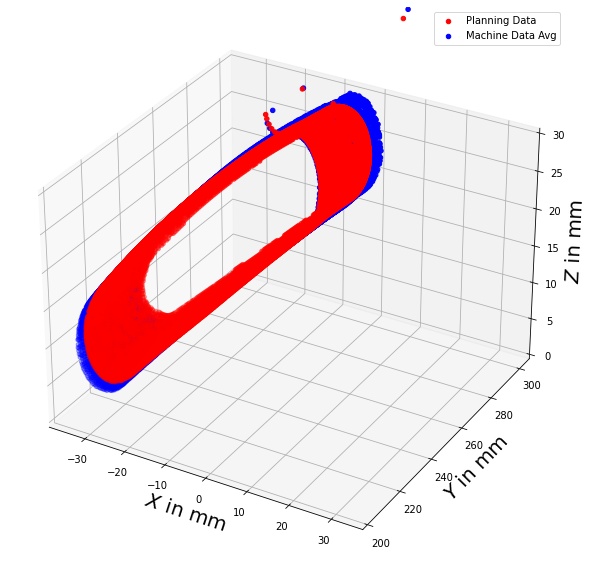

In [59]:
# Plot to show clusters
xdata, ydata, zdata = np.zeros(len(pltlst),),np.zeros(len(pltlst),),np.zeros(len(pltlst),)

plt.figure(figsize=(10,15))
ax = plt.axes(projection='3d')
ax.set_zlim3d([0,30])
ax.set_xlabel('$X$ in mm', fontsize=20)
ax.set_ylabel('$Y$ in mm', fontsize=20)
ax.set_zlabel('$Z$ in mm', fontsize=20)

for i in np.arange(len(pltlst)):
    xdata[i] = tool_tip_X[pltlst[i]]
    ydata[i] = tool_tip_Y[pltlst[i]]
    zdata[i] = tool_tip_Z[pltlst[i]]

ax.scatter3D(xdata, ydata, zdata, color = 'red',label = 'Planning Data')
ax.legend()

xdata2, ydata2, zdata2 = np.zeros(len(pltlst),),np.zeros(len(pltlst),),np.zeros(len(pltlst),)

for i in np.arange(len(pltlst)):
    xdata2[i] = np.average(X[tuple([lst3[pltlst[i]]])])
    ydata2[i] = np.average(Y[tuple([lst3[pltlst[i]]])])
    zdata2[i] = np.average(Z[tuple([lst3[pltlst[i]]])])

ax.scatter3D(xdata2, ydata2, zdata2, color = 'blue',label = 'Machine Data Avg')
ax.legend()

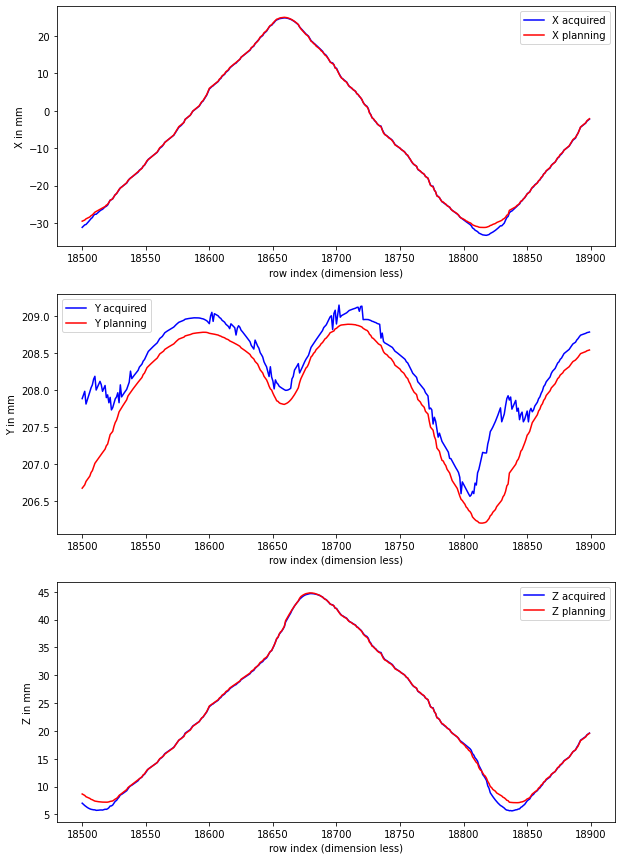

In [64]:
subplotter(18500,18900,xdata2,ydata2,zdata2,xdata,ydata,zdata)

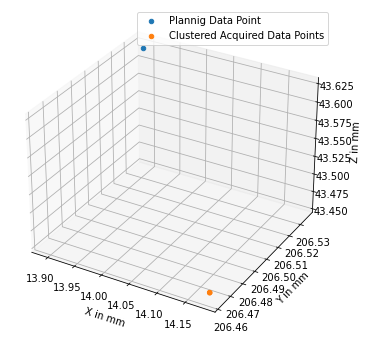

In [35]:
num = -10
xdata, ydata, zdata = np.zeros(len(lst3[pltlst[num]]),),np.zeros(len(lst3[pltlst[num]]),),np.zeros(len(lst3[pltlst[num]]),)

plt.figure(figsize=(6,6))
ax = plt.axes(projection='3d')

ax.scatter3D(tool_tip_X[pltlst[num]],tool_tip_Y[pltlst[num]] , tool_tip_Z[pltlst[num]],label='Plannig Data Point')

for i in np.arange(len(lst3[pltlst[num]])):
    xdata[i] = X[lst3[pltlst[num]]][i]
    ydata[i] = Y[lst3[pltlst[num]]][i]
    zdata[i] = Z[lst3[pltlst[num]]][i]
    
ax.scatter3D(xdata, ydata, zdata, label = 'Clustered Acquired Data Points')
ax.set_xlabel('X in mm', fontsize=10)
ax.set_ylabel('Y in mm', fontsize=10)
ax.set_zlabel('Z in mm', fontsize=10)
plt.legend()

Input two numbers between 0 and 21988 with small difference for plots exaple 10000 then 10010
0


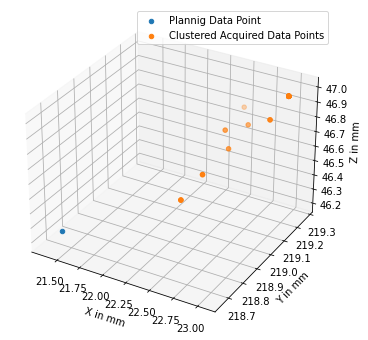

In [36]:
#for num in np.arange(len(pltlst)):
print('Input two numbers between 0 and {} with small difference for plots exaple 10000 then 10010'.format(len(pltlst)))
#lim1 = input()
#lim2 = input()

lim1 = 0
lim2 = 1

for num in np.arange(len(pltlst[int(lim1):int(lim2)])):
    xdata, ydata, zdata = np.zeros(len(lst3[pltlst[num]]),),np.zeros(len(lst3[pltlst[num]]),),np.zeros(len(lst3[pltlst[num]]),)
    
    fig = plt.figure(figsize=(6,6))
    print(num)
    ax = plt.axes(projection='3d')

    ax.scatter3D(tool_tip_X[pltlst[num]],tool_tip_Y[pltlst[num]] , tool_tip_Z[pltlst[num]], label='Plannig Data Point')

    for i in np.arange(len(lst3[pltlst[num]])):
        xdata[i] = X[lst3[pltlst[num]]][i]
        ydata[i] = Y[lst3[pltlst[num]]][i]
        zdata[i] = Z[lst3[pltlst[num]]][i]
    
    ax.scatter3D(xdata, ydata, zdata, label = 'Clustered Acquired Data Points')
    ax.set_xlabel('X in mm', fontsize=10)
    ax.set_ylabel('Y in mm', fontsize=10)
    ax.set_zlabel('Z in mm', fontsize=10)
    plt.legend()
    plt.pause(0.1)
   

In [37]:
# for the clusterd points the acquired points are averaged
lst4 = []
for i in np.arange(len(lst3)):
    lst4.append(df_m.iloc[list(lst3[i])].mean(axis=0))
    
mean_m = pd.concat(lst4,axis=1).T
mean_m.iloc[-100:-1]

,time,MachineX,MachineY,MachineZ,MachineA,MachineC,LoadSpindle,TransfX,TransfY,TransfZ,TransfI,TransfJ,TransfK,executionDuration,previousExecutionDuration,relativeTimetoPreviousCall program number,timeStamp,Tool Length,Tool Radius,G54-X,G54-Y,G54-Z,G54-A,G54-C,ProgNumber,Blade,Step,Level,Fx_mean,Fy_mean,Fz_mean,Mz_mean,Fc_mean,Fa_mean,FcN_mean,Fres_mean,Fx_sigma,Fy_sigma,Fz_sigma,Mz_sigma,Fc_sigma,Fa_sigma,FcN_sigma,Fres_sigma,Fx_max,Fy_max,Fz_max,Mz_max,Fc_max,Fa_max,FcN_max,Fres_max,compensation_x,compensation_y,compensation_z
35861,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35862,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35863,324.305834,-103.9478,-77.7743,-168.947367,-75.686133,11.475633,9.945455,-137.531477,154.971726,36.23908,0.251865,0.130922,0.958584,0.007271,0.005041,0.010743,63750628061.317108,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030.0,-48.0,NaN,37.0,0.703401,0.226547,0.201263,0.006878,1.146299,0.908575,0.89486,1.10023,2.325769,1.520791,0.580685,0.004929,0.821536,2.734794,2.696175,2.738199,12.143293,11.934116,2.630256,0.02369,3.948393,12.942322,12.773836,12.990441,0.021345,-0.011068,-0.007478
35864,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35865,321.420006,-103.6959,-78.1293,-168.6143,-75.7057,11.529,9.990909,-137.484547,155.166368,36.604127,0.260607,0.153895,0.9531,0.008965,0.009601,0.009634,63750628058.431282,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030.0,-48.0,NaN,1.0,0.382544,0.347435,0.198586,0.007298,1.216301,0.729979,0.692041,0.896142,1.735276,1.827031,0.580851,0.006075,1.012572,2.466457,2.350809,2.487977,9.381115,11.523096,2.265641,0.03875,6.458397,11.523096,11.446831,11.523096,0.021362,-0.01106,-0.007486
35866,325.768753,-103.3325,-78.088,-168.5015,-75.6478,11.6173,9.922727,-137.365914,155.019377,36.773429,0.200775,0.143859,0.969017,0.00557,0.00556,0.008004,63750628062.780029,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030.0,-48.0,NaN,5.5,0.416062,0.17863,0.235554,0.006464,1.07727,0.594692,0.587069,0.830246,1.772411,1.186733,0.645728,0.005866,0.97766,2.125368,2.097175,2.174667,9.673978,10.253743,2.686175,0.030207,5.03451,10.255127,10.201252,10.255127,0.021369,-0.01106,-0.007486
35867,321.43,-103.417,-78.3213,-168.3784,-75.6932,11.5941,9.954545,-137.418428,155.216535,36.887629,0.240181,0.163797,0.956809,0.010175,0.008965,0.011758,63750628058.441277,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030.0,-48.0,NaN,1.0,0.54699,0.224973,0.079623,0.005036,0.839352,0.771963,0.768452,0.851585,1.957088,1.552351,0.385263,0.003632,0.605303,2.448239,2.438815,2.45344,8.720358,12.142845,2.546559,0.015586,2.597623,12.142845,12.141536,12.142845,0.021375,-0.011056,-0.007491
35868,321.435005,-103.1453,-78.5169,-168.1467,-75.6808,11.6602,9.954545,-137.361381,155.258448,37.17334,0.219481,0.171973,0.96034,0.002961,0.010175,0.010223,63750628058.446281,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030.0,-48.0,NaN,1.0,0.634674,0.286522,0.120482,0.006284,1.047266,0.921196,0.903304,1.029687,2.138711,1.738911,0.453186,0.004947,0.824505,2.689647,2.643413,2.691178,9.973921,13.402898,2.127697,0.023299,3.88324,13.402898,13.358778,13.402898,0.021388,-0.011051,-0.007496
35869,325.780006,-102.7782,-78.4915,-168.0372,-75.6266,11.7552,9.927273,-137.257656,155.097651,37.34597,0.164159,0.155908,0.974035,0.010328,0.002013,0.007704,63750628062.791283,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030.0,-48.0,NaN,1.0,0.129177,0.0,0.281378,0.0061,1.016726,0.129177,0.128895,0.410554,0.935125,0.0,0.6903,0.004485,0.747573,0.935125,0.933135,1.130609,7.22

In [38]:
# distances are averaged
tcp_avg = [(lambda x: sum(x)/len(x))(item) if len(item)!=0 else np.nan for item in tcp_val]
len(tcp_avg)
#tcp_avg

35961

In [39]:
# Now the final dataframe with plannind data and the corresponding averaged acquired data is obtained 
final_df = pd.concat([df_p,mean_m, pd.DataFrame({'tcp_error':tcp_avg})], axis=1)
final_df = final_df.drop(['Level','Step'],axis=1)
final_df = final_df.dropna()
print(final_df.shape)
final_df.iloc[0:10]

(21988, 69)


,Leading angle,Side tilt angle,Surface Contact point X,Surface contact point Y,Surface contact point z,Surface Orietation X,Surface Orietation Y,Surface Orietation Z,Tool Tip Point X,Tool Tip Point Y,Tool Tip Point Z,Tool Orientation X,Tool Orientation Y,Tool Orientation Z,Closes Point Distance (Surface Contact Point - Acquired TCP 1030 blade0),time,MachineX,MachineY,MachineZ,MachineA,MachineC,LoadSpindle,TransfX,TransfY,TransfZ,TransfI,TransfJ,TransfK,executionDuration,previousExecutionDuration,relativeTimetoPreviousCall program number,timeStamp,Tool Length,Tool Radius,G54-X,G54-Y,G54-Z,G54-A,G54-C,ProgNumber,Blade,Fx_mean,Fy_mean,Fz_mean,Mz_mean,Fc_mean,Fa_mean,FcN_mean,Fres_mean,Fx_sigma,Fy_sigma,Fz_sigma,Mz_sigma,Fc_sigma,Fa_sigma,FcN_sigma,Fres_sigma,Fx_max,Fy_max,Fz_max,Mz_max,Fc_max,Fa_max,FcN_max,Fres_max,compensation_x,compensation_y,compensation_z,tcp_error
8,0.605350,0.136441,20.230158,220.072035,39.789210,-0.152592,0.816819,0.556347,21.342939,218.730804,46.195240,0.001198,0.999999,0.000856,5.929007,9.409753,-84.46439,-80.13469,-142.129157,-75.186433,19.48484,9.91803,-147.518769,163.655645,46.927754,-0.185764,-0.066188,0.830738,0.004892,0.004723,0.00767,63750627746.421021,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030.0,-48.0,0.035964,0.028396,0.175448,0.006478,1.079682,0.06436,0.063675,0.239127,0.283141,0.270865,0.555149,0.004947,0.824529,0.496818,0.491795,0.829669,2.538441,2.971101,2.553811,0.023999,3.99991,4.480863,4.448257,5.651531,0.022938,-0.011331,-0.008002,1.796842
9,0.597177,0.185822,20.229862,220.072062,39.789089,-0.152594,0.816819,0.556346,21.351183,218.735870,46.005775,0.001198,0.999999,0.000856,5.929006,22.47542,-92.36808,-74.357613,-143.939767,-73.589003,17.398667,9.885455,-147.841321,162.769641,46.481612,-0.29459,-0.121979,-0.193476,0.005515,0.005181,0.008535,63750627759.486694,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030.0,-48.0,0.029921,0.020516,0.188588,0.006628,1.104598,0.050437,0.04895,0.238586,0.262822,0.197687,0.580165,0.005067,0.844447,0.425301,0.415002,0.800653,2.692086,2.066925,2.658072,0.025148,4.191402,4.083167,4.022065,5.405432,0.022868,-0.011566,-0.008045,0.922706
10,0.586565,0.232489,20.229565,220.072090,39.788968,-0.152597,0.816819,0.556346,21.347464,218.741852,45.816193,0.001198,0.999999,0.000856,5.929005,28.40273,-95.572864,-72.255468,-144.988309,-72.999914,16.608736,9.879752,-148.182368,162.190451,46.193061,-0.226394,-0.133699,-0.522883,0.00494,0.005364,0.009344,63750627765.414009,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030.0,-48.0,0.017406,0.032482,0.211548,0.006133,1.022159,0.049888,0.049176,0.260458,0.203492,0.313031,0.609894,0.004671,0.778552,0.460072,0.453413,0.832377,2.585342,3.222418,2.605835,0.02316,3.859952,4.825055,4.750066,5.918444,0.022819,-0.011647,-0.008056,0.648288
11,0.573636,0.276109,20.229269,220.072117,39.788846,-0.152599,0.816819,0.556345,21.331797,218.748688,45.627251,0.001198,0.999999,0.000856,5.929004,25.949877,-94.428855,-71.93055,-144.421445,-73.010795,17.08076,9.879545,-148.605794,161.928722,46.012088,-0.191229,-0.193988,-0.495157,0.00576,0.005617,0.008084,63750627762.961159,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030.0,-48.0,0.0278,0.050483,0.184359,0.006016,1.002746,0.078283,0.077636,0.261485,0.238762,0.408389,0.565789,0.004505,0.750758,0.583579,0.577935,0.896429,2.55345,3.712441,2.557763,0.02222,3.703321,5.165823,5.115559,6.156244,0.022855,-0.011658,-0.008056,0.737558
12,0.558518,0.316495,20.228972,220.072145,39.788725,-0.152602,0.816819,0.556345,21.304243,218.756363,45.439705,0.001198,0.999999,0.000856,5.929003,28.086753,-95.53063,-70.90033,-144.71664,-72.7458,16.84491,9.906364,-148.816991,161.637839,45.85555,-0.209613,-0.31012,-0.584034,0.003812,0.005057,0.009325,63750627765.098022,226.4591,6.0,0.0,0.0,-510.483,48.0,0.0,1030.0,-48.0,0.027414,0.067331,0.238098,0.006084,1.01396,0.094745,0.091856,0.330886,0.272884,0.448177,0.636974,0.004724,0.787302,0.617879,0.596991,0.996527,2.955878,3.671227,2.656533,0.024515,4.08587,5.118347,5.051589,6.134672,0.022844,-0.0

### Using Combined dataset Peaks Elimination:
Inspite of the average, there are some high impuse peaks observed in the data (Run the visualiation.ipnby), these must be removed to obtain a flawless, reliable dataset. Using machine data from newly created combined dataset same forward transformation is performed as discribled above. by observing the data, it can be seen that the using just one of the components (in this case Y) all the outlers can be eliminated. Two types of spikes are typicalled observed (check visualizaion by runnung  vizualization.ipnyb) one in positive direction and othes in negetive direction, so for robostness both are considered. At the same time, it is not wise to remove the original expected trajectory of the tool path in begining and the end, so especially for the positive direction they are intentionally not removed. if each peak on a plateu has to be removed its very expensive, so if two neighbous are consicutively classifies as peaks (given by count), it is assumed as plateu and 100 datapoint sare removed. This is a reasonable compromise in accuracy for significant speedup

<img src="images/peak_eli.png">

In [40]:
#final_df = pd.read_excel('Final_df/finaldf_forward_with_compensation1030__24.xlsx' )

### Visulaization of outliers peaks

0 -75.18643333333333 379.48484
1 -73.58900333333334 377.3986666666667
2 -72.99991363636363 376.6087363636364
3 -73.010795 377.08076
4 -72.7458 376.84491
5 -72.4085 376.46071250000006
6 -73.394825 378.383375
7 -72.91146666666667 377.86370000000005
8 -73.79216666666667 379.25183333333337
9 -74.2144 379.9868000000001
10 -72.1185 380.1035
11 -72.15 380.1068
12 -72.1697 380.10850000000005
13 -72.2146 380.11190000000005
14 -72.25225 380.1144
15 -72.2939 380.117
16 -72.34653333333334 380.11983333333336
17 -72.5444 380.12870000000004
18 -72.5848 380.13
19 -72.727 380.13200000000006
20 -72.8279 380.1331
21 -72.9876 380.1347
22 -73.2225 380.13640000000004
23 -73.286 380.1367000000001
24 -73.3615 380.137
25 -73.43190000000001 380.13720000000006
26 -73.4991 380.1374
27 -73.5675 380.1376
28 -73.65190000000001 380.13770000000005
29 -85.3549 379.9768
30 -85.4524 379.97470000000004
31 -85.5398 379.97290000000004
32 -85.6355 379.97090000000003
33 -85.7303 379.9689000000001
34 -85.8241 379.9669
35 -85.9

295 -86.1738 378.3181000000001
296 -86.23952500000003 378.925775
297 -86.0292 379.1093
298 -85.8753 379.09420000000006
299 -74.1248 379.9861
300 -74.0394 379.9828
301 -73.62155 379.74575000000004
302 -73.53547999999999 379.79624
303 -73.2965 379.66135
304 -73.13600000000001 379.581
305 -73.260425 379.86865000000006
306 -73.09075 379.78955
307 -72.9794 379.80155
308 -73.0066 379.9553
309 -72.8267 379.8215
310 -72.65231999999999 379.70956
311 -72.69066666666667 379.8842000000001
312 -72.6826 379.95610000000005
313 -72.55255 379.86647500000004
314 -72.37575 379.79016666666666
315 -72.3696 379.88203333333337
316 -72.2732 379.802
317 -72.26907142857142 379.8598285714286
318 -72.22076666666666 379.87576666666666
319 -72.1872 379.83410000000003
320 -72.19042857142857 379.9300857142857
321 -72.163025 379.95747500000004
322 -72.14226666666667 379.9646000000001
323 -72.12440000000001 379.98375000000004
324 -72.105075 379.99692500000003
325 -72.08664 380.00632
326 -72.081075 380.0221250000001
327

783 -83.4307 376.9587
784 -83.57280000000002 377.96010000000007
785 -83.0893 376.18790000000007
786 -83.3034 377.94620000000003
787 -82.7857 375.9098
788 -83.0281 377.9348
789 -82.70902857142856 377.1989142857143
790 -82.4157 376.89480000000003
791 -82.82520000000001 378.9537
792 -81.8958 375.8544
793 -82.3019 378.2608333333334
794 -81.83352857142857 377.17502857142864
795 -81.8883 377.91350000000006
796 -81.55753333333334 377.22243333333336
797 -81.3048 377.9155
798 -81.239 378.17535000000004
799 -81.0112 377.9194
800 -80.70710000000001 377.5782666666667
801 -80.35785000000001 376.89315
802 -80.359525 377.67435
803 -80.5956 378.96340000000004
804 -79.74013333333333 377.2630333333334
805 -79.93175000000001 378.46375000000006
806 -79.536 377.96520000000004
807 -79.2281 377.46035000000006
808 -79.4696 378.98960000000005
809 -78.8413 377.65943333333337
810 -78.690575 377.751725
811 -78.6549 378.0129
812 -78.1033 377.02817500000003
813 -78.4972 378.5251
814 -77.98575 377.80727500000006
815

1240 -79.1547 380.71220000000005
1241 -79.2131 380.6215
1242 -79.33026666666666 380.5811
1243 -79.4805 380.51130000000006
1244 -79.5284 380.5864
1245 -79.7016 380.4902
1246 -79.7469 380.5616
1247 -79.8443 380.55050000000006
1248 -79.9537 380.53780000000006
1249 -80.0633 380.5251
1250 -80.1728 380.51230000000004
1251 -80.3544 380.42620000000005
1252 -80.51393333333333 380.4515333333334
1253 -80.5983 380.46160000000003
1254 -80.75923333333333 380.40440000000007
1255 -80.90756666666667 380.40583333333336
1256 -80.9939 380.3609000000001
1257 -81.1311 380.39630000000005
1258 -81.2269 380.3602
1259 -81.4389 380.33570000000003
1260 -81.5519 380.3432
1261 -81.70439999999999 380.30490000000003
1262 -81.7669 380.31550000000004
1263 -81.8739 380.3016
1264 -81.9688 380.28920000000005
1265 -82.1813 380.2613
1266 -82.287 380.2472
1267 -82.53575000000001 380.20385000000005
1268 -82.64085 380.19070000000005
1269 -82.8498 380.16435
1270 -83.0063 380.1385
1271 -83.04545 380.13935000000004
1272 -83.1482 

1581 -78.6271 380.83923333333337
1582 -78.7268 380.7658
1583 -78.7305 380.8553
1584 -78.83546666666666 380.7816666666667
1585 -79.0374 380.8114
1586 -79.24990000000003 380.7536666666667
1587 -79.3581 380.6861
1588 -79.4556 380.72456666666665
1589 -79.5737 380.658
1590 -79.6817 380.64380000000006
1591 -79.7776 380.63100000000003
1592 -79.9939 380.60210000000006
1593 -80.102 380.58740000000006
1594 -80.19775 380.60555000000005
1595 -80.3014 380.58023333333335
1596 -80.3987 380.6048
1597 -80.5221 380.52950000000004
1598 -80.5995 380.57270000000005
1599 -80.72184999999999 380.52735000000007
1600 -80.8227 380.512
1601 -80.92955 380.49565000000007
1602 -81.0361 380.47173333333336
1603 -81.1553 380.4393
1604 -81.2233 380.4705
1605 -81.33800000000001 380.4385666666667
1606 -81.4635 380.39410000000004
1607 -81.54814999999999 380.39885000000004
1608 -81.6534 380.38205
1609 -81.7973 380.3543
1610 -81.9096 380.34110000000004
1611 -82.0849 380.3005
1612 -82.11175 380.30805000000004
1613 -82.3123500

1892 -72.7887 381.5504
1893 -72.8654 381.567
1894 -72.9071 381.5742000000001
1895 -73.0309 381.593
1896 -73.06030000000001 381.66825
1897 -73.1232 381.6049
1898 -73.15285 381.68055
1899 -73.267 381.6206
1900 -73.41523333333333 381.5332666666667
1901 -73.4278 381.63340000000005
1902 -73.5518 381.4903
1903 -73.6985 381.3439
1904 -73.7641 381.34490000000005
1905 -74.3541 381.03580000000005
1906 -74.5627 380.88
1907 -74.6683 380.87640000000005
1908 -74.7735 380.87250000000006
1909 -74.9549 380.71880000000004
1910 -75.1968 380.63755000000003
1911 -75.3339 380.5607
1912 -75.4409 380.557
1913 -75.548 380.55310000000003
1914 -75.6555 380.54910000000007
1915 -75.7636 380.54490000000004
1916 -75.9821 380.536
1917 -76.093 380.5312
1918 -76.3188 380.5212
1919 -76.4345 380.5158
1920 -76.47 380.6446
1921 -76.5874 380.63750000000005
1922 -76.7071 380.6301
1923 -76.8296 380.6224
1924 -76.9648 380.7367
1925 -77.2244 380.71560000000005
1926 -77.3248 380.82380000000006
1927 -77.5885 380.9083
1928 -77.804

2348 -87.03120000000001 378.65540000000004
2349 -87.0461 378.59280000000007
2350 -87.0589 378.52630000000005
2351 -87.0687 378.46240000000006
2352 -87.0769 378.3876000000001
2353 -87.0866 378.228
2354 -87.0878 378.06280000000004
2355 -87.0847 377.97130000000004
2356 -87.07920000000001 377.87710000000004
2357 -87.0607 377.6806
2358 -87.0485 377.5864
2359 -87.0128 377.37340000000006
2360 -86.9912 377.2638
2361 -86.967 377.1521
2362 -86.9422 377.04670000000004
2363 -86.8718 376.8148
2364 -86.8275 376.69570000000004
2365 -86.7773 376.57470000000006
2366 -86.4825 376.36850000000004
2367 -86.30093333333333 376.1710666666667
2368 -86.24647999999999 376.04804000000007
2369 -86.2076 375.92865
2370 -86.3612 375.8265
2371 -86.10336666666666 375.6793
2372 -85.6587 375.51980000000003
2373 -86.0762 375.4264
2374 -85.6126 375.27360000000004
2375 -85.8688 375.1621
2376 -85.37383333333332 375.0089666666667
2377 -85.20299999999999 374.83090000000004
2378 -85.15174999999999 374.6802
2379 -84.6472 374.477

2699 -85.2158 374.9284
2700 -85.1184 374.79820000000007
2701 -85.0184 374.668
2702 -84.9214 374.545
2703 -84.8156 374.4149
2704 -84.7073 374.285
2705 -84.4835 374.0264
2706 -84.2557 373.77700000000004
2707 -84.135 373.65000000000003
2708 -83.92836666666666 373.4403333333334
2709 -83.766 373.28110000000004
2710 -83.5037 373.0369
2711 -83.3693 372.9168
2712 -83.2329 372.7982
2713 -83.102 372.6875
2714 -82.9611 372.57250000000005
2715 -82.6737 372.34790000000004
2716 -82.5102 372.2264
2717 -82.362 372.12010000000004
2718 -79.7871 371.09560000000005
2719 -79.6341 371.0088
2720 -79.4847 370.92650000000003
2721 -79.3364 370.8472
2722 -78.9359 370.64730000000003
2723 -78.7227 370.54920000000004
2724 -78.3074 370.3762
2725 -77.908 370.23470000000003
2726 -77.7147 370.1757
2727 -77.3406 370.0815
2728 -76.9831 370.01890000000003
2729 -76.6413 369.98820000000006
2730 -76.3144 369.9904
2731 -76.1565 370.0042
2732 -76.0022 370.0272
2733 -75.8515 370.06000000000006
2734 -75.7044 370.1032
2735 -75.42

2978 -84.924 379.3996
2979 -84.9918 379.37280000000004
2980 -85.0586 379.34610000000004
2981 -85.1813 379.2964
2982 -85.2447 379.2703
2983 -85.3071 379.2443
2984 -85.3684 379.21850000000006
2985 -85.4805 379.17030000000005
2986 -85.5382 379.14500000000004
2987 -85.5948 379.11990000000003
2988 -85.69820000000001 379.0731
2989 -85.7509 379.0486
2990 -85.8024 379.02430000000004
2991 -85.8527 379.0002
2992 -85.9018 378.97640000000007
2993 -85.9442 378.9554
2994 -85.9905 378.932
2995 -86.0355 378.90880000000004
2996 -86.1212 378.8632
2997 -86.1969 378.8211
2998 -86.23490000000001 378.7991
2999 -86.2711 378.7769
3000 -86.3051 378.7538
3001 -86.3333 378.7317
3002 -86.3871 378.6682
3003 -86.4556 378.49280000000005
3004 -86.4654 378.4372
3005 -86.4762 378.31480000000005
3006 -86.2092 377.1139
3007 -86.163 377.00690000000003
3008 -86.0621 376.79420000000005
3009 -86.004 376.68080000000003
3010 -85.9424 376.5658
3011 -85.8774 376.44910000000004
3012 -85.8136 376.3387000000001
3013 -85.7411 376.21

3258 -82.6035 380.16800000000006
3259 -82.759 380.12800000000004
3260 -82.77905 380.10450000000003
3261 -82.9345 380.0665
3262 -83.05093333333333 380.01163333333335
3263 -83.26780000000001 379.9475
3264 -83.30126666666666 379.9190666666667
3265 -83.4257 379.89000000000004
3266 -83.3642 379.85820000000007
3267 -83.5906 379.82900000000006
3268 -83.5988 379.79595
3269 -83.7242 379.7354666666667
3270 -83.90504999999999 379.67470000000003
3271 -83.960875 379.632775
3272 -84.1339 379.62140000000005
3273 -84.16125 379.56965
3274 -84.2486 379.5477333333333
3275 -84.2668 379.4811
3276 -84.4222 379.50620000000004
3277 -84.4471 379.44945
3278 -84.49856666666668 379.4109666666667
3279 -84.5376 379.36
3280 -84.6658 379.37160000000006
3281 -84.66370000000002 379.302
3282 -84.78025000000001 379.30345
3283 -84.9548 379.2816
3284 -85.0816 379.2253
3285 -85.3148 379.118
3286 -85.428 379.06390000000005
3287 -85.5825 378.98740000000004
3288 -85.6336 378.96130000000005
3289 -85.6835 378.9354
3290 -85.7739 

3568 -80.0906 381.05400000000003
3569 -80.1857 381.0214
3570 -80.2807 380.9886
3571 -80.45900000000002 380.92640000000006
3572 -80.5536 380.8932
3573 -80.6478 380.85980000000006
3574 -80.7419 380.82630000000006
3575 -80.8357 380.7927
3576 -80.9182 380.7629
3577 -81.0116 380.72900000000004
3578 -81.1046 380.695
3579 -81.28970000000001 380.62680000000006
3580 -81.3709 380.5966
3581 -81.4626 380.5622
3582 -81.5539 380.52780000000007
3583 -81.7355 380.45880000000005
3584 -81.9046 380.39360000000005
3585 -81.9939 380.35900000000004
3586 -82.0827 380.3243
3587 -82.1711 380.28950000000003
3588 -82.2485 380.25880000000006
3589 -82.3359 380.2241
3590 -82.4226 380.18930000000006
3591 -82.5089 380.1544
3592 -82.5946 380.1196
3593 -82.6697 380.0889
3594 -82.7542 380.0541
3595 -82.8381 380.0194
3596 -82.9213 379.98460000000006
3597 -83.0039 379.9499
3598 -83.07630000000002 379.9193
3599 -83.1576 379.88470000000007
3600 -83.2382 379.8501
3601 -83.318 379.8156
3602 -83.43185 379.7659
3603 -83.5441 37

4058 -76.0421 370.13050000000004
4059 -75.9055 370.13680000000005
4060 -75.7726 370.1511
4061 -75.6435 370.1741
4062 -75.5181 370.20640000000003
4063 -75.3964 370.24780000000004
4064 -75.2785 370.29830000000004
4065 -75.2025 370.35540000000003
4066 -74.9497 370.5043
4067 -74.8928 370.58830000000006
4068 -74.7988 370.68430000000006
4069 -74.5379 370.96770000000004
4070 -74.5871 370.9646000000001
4071 -74.4371 371.13980000000004
4072 -74.3871 371.23410000000007
4073 -74.3388 371.33020000000005
4074 -74.2912 371.42990000000003
4075 -74.2424 371.538
4076 -74.1962 371.64570000000003
4077 -74.1457 371.75860000000006
4078 -74.12365 371.81785
4079 -74.08406666666667 371.92260000000005
4080 -74.0116 372.13310000000007
4081 -73.9417 372.29720000000003
4082 -73.8996 372.4219
4083 -73.8549 372.5599
4084 -73.8059 372.7178
4085 -73.78710000000001 372.80663333333337
4086 -73.7269 372.9877
4087 -73.6873 373.13120000000004
4088 -73.6487 373.2764
4089 -73.6622 373.3110666666667
4090 -73.5742 373.5716000

4432 -78.5813 370.92960000000005
4433 -78.4502 370.8584
4434 -78.3223 370.79110000000003
4435 -78.1643 370.7114
4436 -77.9785 370.6224
4437 -77.7965 370.5407
4438 -77.6184 370.46630000000005
4439 -77.4444 370.3992
4440 -77.2744 370.33930000000004
4441 -77.1086 370.2869
4442 -76.9471 370.2418
4443 -76.7897 370.204
4444 -76.6364 370.17350000000005
4445 -76.4872 370.1503000000001
4446 -76.342 370.13460000000003
4447 -76.2007 370.1263
4448 -76.063 370.1256
4449 -75.929 370.1326
4450 -75.7987 370.14750000000004
4451 -75.6721 370.1711
4452 -75.5491 370.2037
4453 -75.4298 370.2453
4454 -75.3142 370.2958
4455 -75.0949 370.42400000000004
4456 -74.9916 370.5016
4457 -74.8898 370.63230000000004
4458 -74.7101 370.7894
4459 -74.64 370.88380000000006
4460 -74.5367 371.0488
4461 -74.4876 371.1367000000001
4462 -74.4382 371.2311
4463 -74.3904 371.32730000000004
4464 -74.3432 371.42710000000005
4465 -74.2949 371.53540000000004
4466 -74.249 371.6433
4467 -74.2037 371.7549
4468 -74.10625 371.942450000000

4806 -78.876 371.0883
4807 -78.7458 371.01160000000004
4808 -78.6142 370.9366
4809 -78.4868 370.86620000000005
4810 -78.3607 370.7985
4811 -78.2353 370.73400000000004
4812 -78.0514 370.6434
4813 -77.8712 370.56000000000006
4814 -77.6949 370.48380000000003
4815 -77.5223 370.4148
4816 -77.3538 370.353
4817 -77.1893 370.29850000000005
4818 -77.0289 370.25120000000004
4819 -76.8727 370.2112
4820 -76.7205 370.17830000000004
4821 -76.57230000000001 370.15270000000004
4822 -76.4281 370.13430000000005
4823 -76.2876 370.12330000000003
4824 -76.1509 370.1197
4825 -76.0178 370.12350000000004
4826 -75.8883 370.1351
4827 -75.7623 370.1549
4828 -75.64 370.18340000000006
4829 -75.5212 370.2207
4830 -75.406 370.267
4831 -75.2946 370.32210000000003
4832 -75.187 370.3861
4833 -75.0836 370.45910000000003
4834 -75.0272 370.5385
4835 -74.8001 370.7327
4836 -74.71295 370.87995000000006
4837 -74.6114 371.0024
4838 -74.61145 371.04465000000005
4839 -74.5138 371.18020000000007
4840 -74.51535 371.2257
4841 -74.

5103 -83.3217 379.47520000000003
5104 -83.3827 379.4383
5105 -83.4509 379.39670000000007
5106 -83.51830000000001 379.3552
5107 -83.5849 379.31390000000005
5108 -83.6506 379.2728000000001
5109 -83.7079 379.2366
5110 -83.7718 379.1958
5111 -83.8348 379.15520000000004
5112 -83.897 379.1148
5113 -83.9582 379.07460000000003
5114 -84.01150000000001 379.03920000000005
5115 -84.0707 378.99950000000007
5116 -84.1289 378.96000000000004
5117 -84.1862 378.9207
5118 -84.24250000000002 378.8816
5119 -84.2914 378.8473
5120 -84.3456 378.8088
5121 -84.3987 378.7705
5122 -84.4507 378.7325
5123 -84.5016 378.6947
5124 -84.5458 378.6616
5125 -84.5946 378.62450000000007
5126 -84.6422 378.58760000000007
5127 -84.6887 378.5511
5128 -84.734 378.5149
5129 -84.7731 378.48310000000004
5130 -84.8162 378.4475
5131 -84.858 378.4123
5132 -84.8984 378.3775
5133 -84.94896666666666 378.33290000000005
5134 -85.0082 378.27900000000005
5135 -85.0437 378.2456
5136 -85.0779 378.2126
5137 -85.12866666666666 378.15973333333335

5461 -82.2849 379.92650000000003
5462 -82.3594 379.8797
5463 -82.4247 379.8383
5464 -82.4979 379.79150000000004
5465 -82.6424 379.74520000000007
5466 -82.73896666666667 379.7001
5467 -82.8594 379.65650000000005
5468 -82.9309 379.61220000000003
5469 -82.9935 379.57320000000004
5470 -83.0636 379.529
5471 -83.1329 379.485
5472 -83.2014 379.44120000000004
5473 -83.2692 379.39750000000004
5474 -83.3283 379.35900000000004
5475 -83.3944 379.3156
5476 -83.52410000000002 379.2293000000001
5477 -83.5878 379.1865
5478 -83.6432 379.1487
5479 -83.7658 379.06390000000005
5480 -83.8257 379.0219
5481 -83.9362 378.9433
5482 -83.9931 378.902
5483 -84.1044 378.82000000000005
5484 -84.1585 378.7794
5485 -84.2055 378.7438
5486 -84.25750000000001 378.7037
5487 -84.3083 378.66400000000004
5488 -84.35810000000001 378.62450000000007
5489 -84.407 378.58540000000005
5490 -84.4492 378.55100000000004
5491 -84.4957 378.51250000000005
5492 -84.5411 378.4743
5493 -84.5854 378.4365
5494 -84.6285 378.39900000000006
549

5858 -83.4868 379.1204
5859 -83.5478 379.076
5860 -83.6079 379.03170000000006
5861 -83.6671 378.9877000000001
5862 -83.7187 378.949
5863 -83.776 378.90540000000004
5864 -83.8323 378.86220000000003
5865 -83.8877 378.8192
5866 -83.9422 378.7764
5867 -83.9895 378.7388
5868 -84.0419 378.69660000000005
5869 -84.0933 378.6546
5870 -84.1436 378.613
5871 -84.21424999999999 378.55345
5872 -84.2827 378.4947
5873 -84.3288 378.45430000000005
5874 -84.3737 378.4143
5875 -84.4176 378.3747
5876 -84.45540000000001 378.33990000000006
5877 -84.4969 378.301
5878 -84.5372 378.2624
5879 -84.5764 378.22420000000005
5880 -84.6144 378.1864
5881 -84.647 378.1533
5882 -84.6824 378.1163
5883 -84.7167 378.07980000000003
5884 -84.7497 378.0436
5885 -84.78120000000001 378.00750000000005
5886 -84.8072 377.97490000000005
5887 -84.833 377.93600000000004
5888 -84.8546 377.8942
5889 -84.8718 377.84900000000005
5890 -84.8846 377.80050000000006
5891 -84.8921 377.7542
5892 -84.8956 377.69860000000006
5893 -84.8947 377.6398

6285 -79.4294 371.41470000000004
6286 -79.2971 371.32360000000006
6287 -79.1683 371.23720000000003
6288 -79.0349 371.15000000000003
6289 -78.9125 371.0724000000001
6290 -78.7915 370.99760000000003
6291 -78.6679 370.92370000000005
6292 -78.5495 370.85490000000004
6293 -78.432 370.78870000000006
6294 -78.3139 370.72470000000004
6295 -78.1992 370.6646
6296 -78.0855 370.6073
6297 -77.57700000000001 370.39490000000006
6298 -77.417 370.33470000000005
6299 -77.2607 370.2814
6300 -77.1083 370.23510000000005
6301 -76.9598 370.19570000000004
6302 -76.8151 370.16330000000005
6303 -76.5369 370.11940000000004
6304 -76.4033 370.1077
6305 -76.2732 370.1032
6306 -76.1465 370.1058
6307 -76.0232 370.11580000000004
6308 -75.90320000000001 370.1332
6309 -75.7866 370.15880000000004
6310 -75.5633 370.2352
6311 -75.3255 370.3883
6312 -75.231 370.46240000000006
6313 -75.1404 370.54540000000003
6314 -75.054 370.6373
6315 -74.9722 370.7385
6316 -74.8949 370.8491
6317 -74.8456 370.92780000000005
6318 -74.7979 37

6568 -81.6357 380.1249
6569 -81.7728 380.0248
6570 -81.8448 379.97170000000006
6571 -81.9163 379.9186
6572 -81.9872 379.86560000000003
6573 -82.0494 379.81890000000004
6574 -82.119 379.766
6575 -82.188 379.71320000000003
6576 -82.2564 379.66060000000004
6577 -82.3242 379.608
6578 -82.3836 379.56170000000003
6579 -82.45 379.5094
6580 -82.5157 379.45730000000003
6581 -82.5807 379.40530000000007
6582 -82.6449 379.3534
6583 -82.7011 379.3077
6584 -82.7639 379.25620000000004
6585 -82.8259 379.20480000000003
6586 -82.8871 379.1537000000001
6587 -82.9476 379.1028
6588 -83.00040000000001 379.058
6589 -83.5119 378.7851
6590 -83.6127 378.69700000000006
6591 -83.716 378.6046
6592 -83.76620000000001 378.5588000000001
6593 -83.8578 378.47360000000003
6594 -83.9048 378.42890000000006
6595 -83.9509 378.3845
6596 -83.99590000000002 378.34040000000005
6597 -84.0348 378.30170000000004
6598 -84.0776 378.2585000000001
6599 -84.1193 378.21560000000005
6600 -84.16 378.17310000000003
6601 -84.1996 378.131000

6960 -84.2573 377.79010000000005
6961 -84.287 377.74930000000006
6962 -84.3114 377.71250000000003
6963 -84.33530000000002 377.6687
6964 -84.3553 377.6222
6965 -84.3711 377.5727
6966 -84.3828 377.5201
6967 -84.3896 377.47030000000007
6968 -84.3926 377.41130000000004
6969 -84.38866 377.31064000000003
6970 -84.378 377.2176
6971 -84.3668 377.1547
6972 -84.3501 377.08180000000004
6973 -84.3296 377.0065
6974 -84.3056 376.92900000000003
6975 -84.2782 376.8491
6976 -84.2502 376.7746
6977 -84.2154 376.69000000000005
6978 -84.1773 376.60330000000005
6979 -84.136 376.51480000000004
6980 -84.0916 376.42440000000005
6981 -84.0482 376.34020000000004
6982 -83.9971 376.2459
6983 -83.9431 376.15000000000003
6984 -83.8862 376.05260000000004
6985 -83.8265 375.9537
6986 -83.7691 375.86160000000007
6987 -83.7033 375.75960000000003
6988 -83.6349 375.6564
6989 -83.4905 375.44660000000005
6990 -83.4207 375.34850000000006
6991 -83.342 375.2409
6992 -83.261 375.13250000000005
6993 -83.1778 375.02330000000006
69

7301 -76.1666 370.0975
7302 -75.6132 370.25210000000004
7303 -75.515 370.3075
7304 -75.0754 370.78340000000003
7305 -75.016 370.8789
7306 -74.97 370.96000000000004
7307 -74.9252 371.0450000000001
7308 -74.8801 371.13630000000006
7309 -74.8362 371.2302
7310 -74.7925 371.3277
7311 -74.7476 371.4336
7312 -74.7045 371.5398
7313 -74.6618 371.6497
7314 -74.6167 371.77130000000005
7315 -74.574 371.89140000000003
7316 -74.4822 372.1669
7317 -74.4369 372.3113000000001
7318 -74.3991 372.43660000000006
7319 -74.3586 372.57550000000003
7320 -74.3227 372.70210000000003
7321 -74.2875 372.8303
7322 -74.2499 372.9723
7323 -74.2128 373.116
7324 -74.1763 373.2615
7325 -74.1405 373.4085
7326 -74.0734 373.69550000000004
7327 -74.0059 373.99920000000003
7328 -73.9731 374.15260000000006
7329 -73.9433 374.2948
7330 -73.9116 374.44980000000004
7331 -73.8806 374.60540000000003
7332 -73.85 374.76130000000006
7333 -73.8195 374.92350000000005
7334 -73.7929 375.0675
7335 -73.7646 375.2241
7336 -73.73690000000002 3

7608 -83.29146666666668 375.4864
7609 -83.28354999999999 375.41605
7610 -83.1601 375.28193333333337
7611 -83.13466666666666 375.2028
7612 -82.9823 375.05820000000006
7613 -82.97250000000001 374.9889
7614 -82.87509999999999 374.87080000000003
7615 -82.67660000000001 374.63410000000005
7616 -82.5179 374.4273
7617 -82.4323 374.319
7618 -82.345 374.2105
7619 -82.2558 374.1018
7620 -82.0793 373.8925
7621 -81.985 373.78360000000004
7622 -81.88930000000002 373.6749
7623 -81.7922 373.56630000000007
7624 -81.7012 373.4662
7625 -81.601 373.3581
7626 -81.4997 373.25050000000005
7627 -81.3971 373.14340000000004
7628 -81.2934 373.03670000000005
7629 -81.0906 372.8335
7630 -80.9836 372.72900000000004
7631 -80.8757 372.62530000000004
7632 -80.7669 372.52250000000004
7633 -80.5556 372.32790000000006
7634 -80.4445 372.2284
7635 -80.2205 372.03290000000004
7636 -80.0034 371.8505
7637 -79.8898 371.7579
7638 -79.7759 371.6668
7639 -79.6616 371.5772
7640 -79.53490000000001 371.48010000000005
7641 -79.4213 

8013 -80.3592 372.16655000000003
8014 -80.177 372.0056
8015 -80.0672 371.9114
8016 -79.9568 371.81860000000006
8017 -79.8461 371.72720000000004
8018 -79.735 371.63730000000004
8019 -79.6328 371.55620000000005
8020 -79.5212 371.46970000000005
8021 -79.3974 371.3759
8022 -79.2618 371.2762000000001
8023 -79.1407 371.1896
8024 -79.0236 371.10800000000006
8025 -78.901 371.02520000000004
8026 -78.7912 370.9531
8027 -78.6829 370.884
8028 -78.57170000000002 370.81550000000004
8029 -78.4661 370.7524
8030 -78.3644 370.70500000000004
8031 -78.1534 370.5904
8032 -78.0485 370.53700000000003
8033 -77.9459 370.4869
8034 -77.8194 370.4282
8035 -77.6707 370.3636
8036 -77.5251 370.3056
8037 -77.36470000000001 370.26160000000004
8038 -77.2226 370.216
8039 -77.084 370.177
8040 -76.9489 370.1445
8041 -76.8173 370.1185
8042 -76.6891 370.0992
8043 -76.5643 370.0864
8044 -76.4428 370.0802
8045 -76.3245 370.08070000000004
8046 -76.2093 370.08790000000005
8047 -76.0972 370.10210000000006
8048 -75.9881 370.12330

8350 -83.26970000000001 377.63960000000003
8351 -83.3348 377.5378
8352 -83.36580000000001 377.4877
8353 -83.40845 377.41640000000007
8354 -83.44880000000002 377.3462
8355 -83.4742 377.297
8356 -83.59546666666667 377.3308333333334
8357 -83.59160000000001 377.2585
8358 -83.608 377.20785000000006
8359 -83.64783333333332 377.1732
8360 -83.5493 377.02490000000006
8361 -83.5536 376.96160000000003
8362 -83.5543 376.89590000000004
8363 -83.5518 376.8349
8364 -83.60043333333336 376.79176666666666
8365 -83.61755 376.7328
8366 -83.57643333333336 376.6441666666667
8367 -83.6136 376.5947666666667
8368 -83.56710000000001 376.50600000000003
8369 -83.4643 376.38750000000005
8370 -83.438 376.30460000000005
8371 -83.4087 376.2199
8372 -83.3765 376.13370000000003
8373 -83.3447 376.0539
8374 -83.28575 375.91865
8375 -83.2213 375.7806
8376 -83.1749 375.68670000000003
8377 -83.1302 375.60010000000005
8378 -83.0782 375.50350000000003
8379 -83.0237 375.40590000000003
8380 -82.9668 375.3072
8381 -82.9076 375.2

8640 -79.88295 381.11575
8641 -79.99133333333333 381.0255
8642 -80.1375 380.9114
8643 -80.208 380.8464
8644 -80.2781 380.78130000000004
8645 -80.3478 380.71610000000004
8646 -80.4092 380.65830000000005
8647 -80.4782 380.593
8648 -80.5467 380.5276
8649 -80.6149 380.4621
8650 -80.6827 380.3967
8651 -80.7424 380.3387
8652 -80.8093 380.27320000000003
8653 -80.8758 380.20770000000005
8654 -80.9418 380.1422
8655 -81.0649 380.01900000000006
8656 -81.1294 379.9536
8657 -81.2568 379.82320000000004
8658 -81.375 379.70050000000003
8659 -81.4368 379.63570000000004
8660 -81.5586 379.5063
8661 -81.6449 379.41330000000005
8662 -81.7299 379.3208
8663 -81.788 379.25680000000006
8664 -81.8454 379.1931
8665 -81.9022 379.12960000000004
8666 -81.952 379.07340000000005
8667 -82.0074 379.01030000000003
8668 -82.06200000000001 378.94750000000005
8669 -82.1159 378.8849
8670 -82.1691 378.8225
8671 -82.2157 378.76750000000004
8672 -82.2673 378.7058
8673 -82.3182 378.6443
8674 -82.3684 378.58320000000003
8675 -82

9060 -83.1934 376.97450000000003
9061 -83.2051 376.914
9062 -83.2133 376.8512
9063 -83.21843333333334 376.7660333333334
9064 -83.217 376.65610000000004
9065 -83.2114 376.58430000000004
9066 -83.2027 376.51050000000004
9067 -83.1909 376.43480000000005
9068 -83.1775 376.36490000000003
9069 -83.1591 376.2851
9070 -83.1377 376.2037
9071 -83.1135 376.1206
9072 -83.0864 376.036
9073 -83.0594 375.958
9074 -83.0264 375.87010000000004
9075 -82.9907 375.78080000000006
9076 -82.9523 375.69010000000003
9077 -82.872 375.51360000000005
9078 -82.7771 375.32370000000003
9079 -82.7261 375.22720000000004
9080 -82.6728 375.1299
9081 -82.564 374.94090000000006
9082 -82.4415 374.7404
9083 -82.3771 374.6391
9084 -82.3164 374.546
9085 -82.2478 374.44360000000006
9086 -82.1774 374.34090000000003
9087 -82.1052 374.2379
9088 -82.0313 374.1346
9089 -81.9619 374.03960000000006
9090 -81.8843 373.93600000000004
9091 -81.805 373.8321
9092 -81.7241 373.7284
9093 -81.6034 373.577
9094 -81.4796 373.42600000000004
9095 

9462 -77.4939 370.25210000000004
9463 -77.36210000000001 370.20570000000004
9464 -77.0855 370.1389
9465 -76.9601 370.1107
9466 -76.8381 370.0888
9467 -76.71900000000001 370.07320000000004
9468 -76.6032 370.0637
9469 -76.4904 370.0606
9470 -76.3805 370.06380000000007
9471 -76.1693 370.0898000000001
9472 -75.9694 370.14320000000004
9473 -75.8736 370.18070000000006
9474 -75.6563 370.32630000000006
9475 -75.5736 370.39400000000006
9476 -75.494 370.4703
9477 -75.4178 370.55530000000005
9478 -75.3452 370.6494
9479 -75.3235 370.7499
9480 -75.2805 370.82430000000005
9481 -75.2383 370.90270000000004
9482 -75.1961 370.987
9483 -75.15470000000002 371.07450000000006
9484 -75.11340000000001 371.16610000000003
9485 -75.071 371.2652
9486 -75.0606 371.41700000000003
9487 -75.02 371.52400000000006
9488 -74.9365 371.75770000000006
9489 -74.8956 371.87910000000005
9490 -74.8066 372.15770000000003
9491 -74.7624 372.30390000000006
9492 -74.6851 372.5715
9493 -74.6494 372.69980000000004
9494 -74.6143 372.82

9924 -73.2711 383.7038
9925 -73.2729 383.78790000000004
9926 -73.2748 383.90560000000005
9927 -73.2752 383.94530000000003
9928 -73.2757 384.0188
9929 -73.2754 384.0955000000001
9930 -73.2749 384.13370000000003
9931 -73.2735 384.2053
9932 -73.2724 384.2431
9933 -73.271 384.28060000000005
9934 -73.2675 384.3552
9935 -73.2632 384.42470000000003
9936 -73.2604 384.4612
9937 -73.2574 384.49750000000006
9938 -73.2526 384.56510000000003
9939 -73.2518 384.6005
9940 -73.2521 384.63560000000007
9941 -73.2561 384.7049
9942 -73.2642 384.76890000000003
9943 -73.27 384.8023
9944 -73.2769 384.8353
9945 -73.2848 384.8679
9946 -73.2927 384.8965
9947 -73.3139 384.9597
9948 -73.326 384.99060000000003
9949 -73.3477 385.1017
9950 -73.3392 385.0210000000001
9951 -73.3518 385.04760000000005
9952 -73.3833 385.10600000000005
9953 -73.4185 385.16240000000005
9954 -73.4554 385.21360000000004
9955 -73.4764 385.23990000000003
9956 -73.4982 385.2656
9957 -73.5195 385.28870000000006
9958 -73.5464 385.3156
9959 -73.56

10401 -80.9068 379.22950000000003
10402 -81.1389 379.10980000000006
10403 -81.2414 378.963
10404 -81.2447 378.71930000000003
10405 -81.292 378.6452
10406 -81.3387 378.5715
10407 -81.61480000000002 378.40290000000005
10408 -81.6595 378.3326
10409 -81.7035 378.26250000000005
10410 -81.7468 378.19290000000007
10411 -81.78940000000001 378.1236
10412 -82.0193 377.73220000000003
10413 -82.1616 377.47120000000007
10414 -82.2238 377.35110000000003
10415 -82.28590000000001 377.22630000000004
10416 -82.369 377.05030000000005
10417 -82.3958 376.99080000000004
10418 -82.4217 376.9318
10419 -82.4678 376.8222
10420 -82.4889 376.7632
10421 -82.5069 376.7022
10422 -82.5217 376.6392
10423 -82.539075 376.529175
10424 -82.5482 376.37390000000005
10425 -82.5474 376.3011
10426 -82.5379 376.1582
10427 -82.5282 376.08020000000005
10428 -82.5157 376.00070000000005
10429 -82.5006 375.91970000000003
10430 -82.4646 375.7617
10431 -82.4412 375.67650000000003
10432 -82.4154 375.59000000000003
10433 -82.3873 375.50

10790 -73.3607 384.7950000000001
10791 -73.3762 384.86585
10792 -73.3525 384.9121
10793 -73.3508 384.95060000000007
10794 -73.355 385.09670000000006
10795 -73.35860000000001 385.1335000000001
10796 -73.3891 385.24140000000006
10797 -73.3683 385.20160000000004
10798 -73.3748 385.23710000000005
10799 -73.3909 385.3069
10800 -73.4469 385.52450000000005
10801 -73.45980000000002 385.497
10802 -73.475 385.528
10803 -73.4911 385.5585
10804 -73.5259 385.618
10805 -73.5439 385.742
10806 -73.5622 385.67170000000004
10807 -73.6025 385.7243
10808 -73.628 385.7536
10809 -73.64313333333334 385.8471333333334
10810 -73.6721 385.7991
10811 -73.6967 385.82210000000003
10812 -73.722 385.8444
10813 -73.7482 385.86600000000004
10814 -73.7722 385.88450000000006
10815 -73.8286 385.9235
10816 -73.86596666666667 385.8523333333334
10817 -73.9312 385.8327
10818 -73.9625 385.84270000000004
10819 -74.01223333333333 385.75683333333336
10820 -74.0867 385.71860000000004
10821 -74.1194 385.57090000000005
10822 -74.159

11146 -76.7431 384.07460000000003
11147 -76.8051 384.01370000000003
11148 -76.9057 383.9667
11149 -76.97 383.9014
11150 -77.0275 383.84430000000003
11151 -77.087 383.7848
11152 -77.0818 383.83180000000004
11153 -77.1482 383.76120000000003
11154 -77.2081 383.69700000000006
11155 -77.3269 383.56800000000004
11156 -77.34595 383.55840000000006
11157 -77.4186 383.48290000000003
11158 -77.4805 383.41040000000004
11159 -77.6044 383.2636
11160 -77.7215 383.1231
11161 -77.7835 383.0479
11162 -77.8455 382.97210000000007
11163 -77.9075 382.89590000000004
11164 -77.9625 382.8278
11165 -78.05535 382.7118
11166 -78.148 382.595
11167 -78.2097 382.51660000000004
11168 -78.2645 382.44660000000005
11169 -78.326 382.36730000000006
11170 -78.4486 382.2078
11171 -78.5098 382.12760000000003
11172 -78.6249 381.9751
11173 -78.6855 381.89390000000003
11174 -78.8064 381.7309
11175 -78.8599 381.65790000000004
11176 -78.9795 381.49340000000007
11177 -79.0389 381.41080000000005
11178 -79.09810000000002 381.3280000

11441 -75.36970000000002 384.7678
11442 -75.3794 384.8402
11443 -75.5468 384.6152000000001
11444 -75.5154 384.75950000000006
11445 -75.5846 384.7168
11446 -75.6549 384.67220000000003
11447 -75.7264 384.6258
11448 -75.7992 384.57730000000004
11449 -75.8735 384.52680000000004
11450 -75.923 384.60240000000005
11451 -75.9992 384.54570000000007
11452 -76.0772 384.4865
11453 -76.0866 384.5801
11454 -76.2475 384.4469
11455 -76.3031 384.40000000000003
11456 -76.4176 384.30120000000005
11457 -76.5345 384.1981
11458 -76.5568 384.2538
11459 -76.6766 384.13930000000005
11460 -76.652 384.2296
11461 -76.7121 384.1682
11462 -76.7729 384.10550000000006
11463 -76.8416 384.0339
11464 -76.9064 384.01570000000004
11465 -77.0203 383.8967
11466 -77.0551 383.8976
11467 -77.1201 383.8249
11468 -77.1786 383.7588
11469 -77.21085 383.73395000000005
11470 -77.26859999999999 383.6743
11471 -77.4164 383.4939
11472 -77.5913 383.27610000000004
11473 -77.7731 383.04490000000004
11474 -77.948 382.81800000000004
11475 -

11893 -80.6701 373.07390000000004
11894 -80.6036 372.98230000000007
11895 -80.5419 372.89930000000004
11896 -80.4729 372.8088
11897 -80.4028 372.7189000000001
11898 -80.3317 372.6297
11899 -80.1931 372.46130000000005
11900 -80.12870000000001 372.30760000000004
11901 -79.9716 372.13530000000003
11902 -79.8116 371.9671000000001
11903 -79.656 371.81120000000004
11904 -79.4909 371.653
11905 -79.4077 371.5759
11906 -79.3315 371.50710000000004
11907 -79.2474 371.43320000000006
11908 -79.1628 371.3609000000001
11909 -78.99300000000001 371.22100000000006
11910 -78.8302 371.09430000000003
11911 -78.7356 371.024
11912 -78.6509 370.9631
11913 -78.5588 370.89930000000004
11914 -78.4696 370.8397
11915 -78.1808 370.70880000000005
11916 -78.0172 370.6191
11917 -77.8582 370.54010000000005
11918 -77.7816 370.50500000000005
11919 -77.7056 370.47200000000004
11920 -77.6286 370.44100000000003
11921 -77.5544 370.4131
11922 -77.4078 370.3639
11923 -77.3324 370.29080000000005
11924 -77.2252 370.2627
11925 -7

12266 -75.1263 372.12360000000007
12267 -75.087 372.2525
12268 -75.0121 372.51030000000003
12269 -74.9666 372.6744
12270 -74.8961 372.93890000000005
12271 -74.8636 373.06460000000004
12272 -74.8313 373.19350000000003
12273 -74.7618 373.4782
12274 -74.6963 373.75690000000003
12275 -74.6293 374.05340000000007
12276 -74.5962 374.20320000000004
12277 -74.5636 374.35380000000004
12278 -74.5338 374.4929
12279 -74.4702 374.7975
12280 -74.4081 375.10330000000005
12281 -74.3799 375.24590000000006
12282 -74.3191 375.5595
12283 -74.29 375.7124
12284 -74.2613 375.8648
12285 -74.2076 376.15450000000004
12286 -74.1802 376.30440000000004
12287 -74.1533 376.4533
12288 -74.1268 376.6009
12289 -74.103 376.7348
12290 -74.0524 377.0222
12291 -74.0619 377.2089
12292 -74.0402 377.33610000000004
12293 -74.017 377.473
12294 -73.9943 377.6078
12295 -73.9503 377.8738
12296 -73.9309 377.99710000000005
12297 -73.9101 378.13560000000007
12298 -73.8899 378.2764
12299 -73.8703 378.4193000000001
12300 -73.8162 378.84

12749 -75.2998 385.4082000000001
12750 -75.3618 385.3646
12751 -75.4245 385.31930000000006
12752 -75.4879 385.27230000000003
12753 -75.5523 385.22330000000005
12754 -75.6176 385.17240000000004
12755 -75.7151 385.2047
12756 -75.7828 385.14570000000003
12757 -75.9229 385.01980000000003
12758 -75.9294 385.11150000000004
12759 -76.0014 385.04110000000003
12760 -76.0753 384.9673
12761 -76.1382 384.9035
12762 -76.19 384.85030000000006
12763 -76.2421 384.7962
12764 -76.32476666666668 384.75753333333336
12765 -76.419 384.6741
12766 -76.4774 384.66490000000005
12767 -76.5324 384.59720000000004
12768 -76.588 384.52830000000006
12769 -76.6278 384.52060000000006
12770 -76.6937 384.43420000000003
12771 -76.70103333333333 384.4492
12772 -76.7822 384.3525
12773 -76.88146666666667 384.2246666666667
12774 -76.9042 384.2013
12775 -76.9588 384.12250000000006
12776 -77.0135 384.04310000000004
12777 -77.0683 383.963
12778 -77.1172 383.8912
12779 -77.1721 383.80960000000005
12780 -77.227 383.7275
12781 -77.

13212 -80.42043333333334 373.27456666666666
13213 -80.4034 373.1926
13214 -80.3496 373.10490000000004
13215 -80.2997 373.02570000000003
13216 -80.2432 372.9392
13217 -80.1269 372.76800000000003
13218 -80.0671 372.6834
13219 -79.9498 372.52420000000006
13220 -79.963 372.4755
13221 -79.86036666666666 372.3769333333334
13222 -79.84077500000001 372.31542500000006
13223 -79.6986 372.2085
13224 -79.7382 372.17330000000004
13225 -79.5646 372.0534
13226 -79.5475 371.99705
13227 -79.4277 371.90290000000005
13228 -79.3647 371.8364
13229 -79.3425 371.78090000000003
13230 -79.2706 371.70935000000003
13231 -79.0953 371.5154
13232 -78.9522 371.3899
13233 -78.724 371.2052
13234 -78.578 371.09680000000003
13235 -78.4159 370.9854000000001
13236 -78.3398 370.9361
13237 -78.1762 370.83740000000006
13238 -78.039 370.80170000000004
13239 -77.9648 370.7635
13240 -77.8917 370.72780000000006
13241 -77.8684 370.6769
13242 -77.77019999999999 370.65315000000004
13243 -77.7202 370.61190000000005
13244 -77.6019 37

13577 -78.41515000000001 371.04760000000005
13578 -78.3234 370.9673333333334
13579 -78.206 370.89520000000005
13580 -78.1254 370.8487
13581 -78.0199 370.82990000000007
13582 -77.8741 370.7574
13583 -77.8155 370.69280000000003
13584 -77.7291 370.69410000000005
13585 -77.6744 370.634
13586 -77.589 370.64090000000004
13587 -77.3958 370.54200000000003
13588 -77.2633 370.5101
13589 -77.1334 370.4873
13590 -77.0542 370.4775
13591 -76.9612 370.4703
13592 -76.8704 370.46810000000005
13593 -76.70105000000002 370.46500000000003
13594 -76.6111 370.4904
13595 -76.5289 370.50750000000005
13596 -76.4657 370.46920000000006
13597 -76.44900000000001 370.52930000000003
13598 -76.3859 370.49370000000005
13599 -76.308 370.52320000000003
13600 -76.22850000000001 370.5799
13601 -76.1584 370.5976
13602 -76.0865 370.6428
13603 -76.0103 370.76470000000006
13604 -75.9435 370.8226
13605 -75.8819 370.8122
13606 -75.8786 370.8863
13607 -75.8174 370.88100000000003
13608 -75.8155 370.9562
13609 -75.7543 371.03240000

14077 -73.7808 386.98920000000004
14078 -73.8004 387.06390000000005
14079 -73.82390000000001 387.1401
14080 -73.8365 387.1771
14081 -73.8621 387.2447
14082 -73.8767 387.2794
14083 -73.8919 387.31300000000005
14084 -73.9085 387.34650000000005
14085 -73.9247 387.3774
14086 -73.9396 387.40420000000006
14087 -73.9571 387.43330000000003
14088 -73.9936 387.4887
14089 -74.0128 387.5149
14090 -74.0216 387.40250000000003
14091 -74.0507 387.5614
14092 -74.0855 387.46180000000004
14093 -74.109 387.47810000000004
14094 -74.1683 387.36350000000004
14095 -74.1939 387.37110000000007
14096 -74.22905 387.30390000000006
14097 -74.26259999999999 387.30715000000004
14098 -74.3284 387.2294
14099 -74.386 387.06710000000004
14100 -74.4374 386.9012
14101 -74.4729 386.8894
14102 -74.5208 386.7201
14103 -74.5553 386.70570000000004
14104 -74.55650000000003 386.8053333333334
14105 -74.6253 386.67260000000005
14106 -74.6601 386.6544
14107 -74.7124 386.6249
14108 -74.7647 386.5931
14109 -74.82423333333334 386.5066


14477 -75.94495 385.57045000000005
14478 -75.9783 385.53833333333336
14479 -75.9997 385.5323
14480 -76.0707 385.36800000000005
14481 -76.0466 385.46750000000003
14482 -76.1394 385.3369
14483 -76.14920000000001 385.37690000000003
14484 -76.1963 385.3056
14485 -76.2439 385.2327
14486 -76.2629 385.24080000000004
14487 -76.3107 385.16240000000005
14488 -76.416 384.987
14489 -76.4492 384.95020000000005
14490 -76.5425 384.7928
14491 -76.5495 384.7797
14492 -76.6423 384.6111
14493 -76.7327 384.4443
14494 -76.7805 384.3552
14495 -76.7646 384.3491
14496 -76.8111 384.25680000000006
14497 -76.8527 384.17350000000005
14498 -76.8993 384.0797
14499 -76.9459 383.9852
14500 -76.9925 383.89000000000004
14501 -77.039 383.7943000000001
14502 -77.10390000000001 383.6595500000001
14503 -77.1737 383.51340000000005
14504 -77.2201 383.4153
14505 -77.2666 383.3167
14506 -77.3081 383.22780000000006
14507 -77.3544 383.1281
14508 -77.4005 383.02790000000005
14509 -77.4927 382.82610000000005
14510 -77.5339 382.735

14884 -80.0459 374.77770000000004
14885 -80.035 374.61460000000005
14886 -80.0158 374.4418
14887 -80.0037 374.3552
14888 -79.98980000000002 374.26860000000005
14889 -79.9759 374.1904
14890 -79.9395 374.0169
14891 -79.919 373.9304000000001
14892 -79.8758 373.7661
14893 -79.8506 373.68
14894 -79.8239 373.59430000000003
14895 -79.7959 373.50890000000004
14896 -79.7664 373.4239
14897 -79.8424 373.41020000000003
14898 -79.7063 373.2633
14899 -79.74945 373.2259
14900 -79.638 373.0966
14901 -79.67734999999999 373.05940000000004
14902 -79.718 373.02970000000005
14903 -79.6781 372.94750000000005
14904 -79.637 372.86600000000004
14905 -79.5948 372.78510000000006
14906 -79.55150000000002 372.70500000000004
14907 -79.5114 372.6333
14908 -79.4192 372.4776
14909 -79.3716 372.4012000000001
14910 -79.3231 372.32570000000004
14911 -79.228 372.18530000000004
14912 -79.1767 372.11320000000006
14913 -79.1246 372.04240000000004
14914 -79.0718 371.97280000000006
14915 -78.96900000000001 371.8441
14916 -78.9

15359 -74.0847 380.19930000000005
15360 -74.0727 380.3326
15361 -74.0392 380.72540000000004
15362 -74.0201 380.96860000000004
15363 -74.00170000000001 381.21670000000006
15364 -73.9931 381.3381
15365 -73.9702 381.6763
15366 -73.9628 381.78720000000004
15367 -73.95560000000002 381.8951
15368 -73.9653 382.04995
15369 -73.9812 382.11140000000006
15370 -73.968 382.3041
15371 -73.9622 382.3858
15372 -73.9559 382.47150000000005
15373 -73.9496 382.553
15374 -73.9433 382.63070000000005
15375 -73.9372 382.70590000000004
15376 -73.9319 382.77310000000006
15377 -73.9263 382.84810000000004
15378 -73.9068 383.1403
15379 -73.8983 383.28990000000005
15380 -73.8943 383.36460000000005
15381 -73.8889 383.47245000000004
15382 -73.8839 383.58
15383 -73.8807 383.65400000000005
15384 -73.9157 383.7565000000001
15385 -73.8749 383.8013
15386 -73.8699 383.94010000000003
15387 -73.8653 384.08540000000005
15388 -73.8633 384.15760000000006
15389 -73.8615 384.22200000000004
15390 -73.898 384.26860000000005
15391 -

15873 -78.7646 377.949
15874 -78.81710000000001 377.7436
15875 -78.8441 377.6365
15876 -78.8706 377.5298
15877 -78.9196 377.32860000000005
15878 -78.9691 377.1195
15879 -78.9932 377.01590000000004
15880 -79.02705 376.86690000000004
15881 -79.0598 376.7192
15882 -79.0818 376.6184
15883 -79.1032 376.51840000000004
15884 -79.1241 376.419
15885 -79.1424 376.3303
15886 -79.162 376.2326
15887 -79.1998 376.0397
15888 -79.2177 375.9445
15889 -79.2502 375.7663
15890 -79.2663 375.67390000000006
15891 -79.2818 375.5824
15892 -79.2968 375.49190000000004
15893 -79.3097 375.41130000000004
15894 -79.3233 375.32280000000003
15895 -79.33630000000001 375.2353
15896 -79.3587 375.0615
15897 -79.3733 374.8954
15898 -79.3785 374.80760000000004
15899 -79.3819 374.71970000000005
15900 -79.3838 374.6317
15901 -79.384 374.55240000000003
15902 -79.3793 374.37600000000003
15903 -79.53680000000001 374.3249
15904 -79.43260000000001 374.21486
15905 -79.44055 374.13525000000004
15906 -79.43035 374.04775
15907 -79.418

16248 -79.1762 373.84770000000003
16249 -79.24670000000002 373.80915000000005
16250 -79.26056666666666 373.73850000000004
16251 -79.1383 373.59520000000003
16252 -79.2307 373.5742
16253 -79.15893333333334 373.4559333333334
16254 -79.16695 373.387
16255 -79.217 373.31275
16256 -79.1839 373.19120000000004
16257 -79.1595 373.1082
16258 -79.1338 373.02590000000004
16259 -79.0528 372.7914
16260 -78.959 372.55690000000004
16261 -78.8946 372.4129
16262 -78.8232 372.2658
16263 -78.713 372.06100000000004
16264 -78.63280000000002 371.9263
16265 -78.64390000000002 371.87620000000004
16266 -78.6519 371.8267000000001
16267 -78.511 371.7411000000001
16268 -78.5613 371.7019
16269 -78.5197 371.64770000000004
16270 -78.4727 371.5892
16271 -78.3768 371.47700000000003
16272 -78.3281 371.42330000000004
16273 -78.2341 371.3269
16274 -78.1839 371.2787
16275 -78.1333 371.2325
16276 -78.0362 371.15000000000003
16277 -77.9583 371.07823333333334
16278 -77.95590000000001 371.05370000000005
16279 -77.860599999999

16770 -73.99910000000001 386.4218
16771 -73.9979 386.4828
16772 -73.9953 386.6041000000001
16773 -73.9927 386.7180000000001
16774 -73.9897 386.83720000000005
16775 -73.9883 386.8964
16776 -73.9869 386.949
16777 -73.98350000000002 387.06570000000005
16778 -73.9817 387.1236
16779 -73.9799 387.18100000000004
16780 -73.97830000000002 387.2318
16781 -73.9769 387.2884
16782 -73.976 387.3444
16783 -73.9756 387.39990000000006
16784 -73.9757 387.4551
16785 -73.9763 387.50370000000004
16786 -73.9776 387.5577
16787 -73.9793 387.6111
16788 -73.9814 387.66400000000004
16789 -73.987 387.7622
16790 -73.9994 387.91290000000004
16791 -74.0157 388.0519
16792 -74.0522 388.27180000000004
16793 -74.0703 388.35560000000004
16794 -74.0799 388.3962
16795 -74.0894 388.4331
16796 -74.1113 388.509
16797 -74.1226 388.5445
16798 -74.1343 388.5791
16799 -74.1577 388.6411
16800 -74.1707 388.6723
16801 -74.1842 388.7024
16802 -74.198 388.73130000000003
16803 -74.2107 388.7556000000001
16804 -74.22560000000001 388.780

17204 -76.7023 383.6107
17205 -76.7724 383.37940000000003
17206 -76.8073 383.26290000000006
17207 -76.83855 383.0323
17208 -76.9428 382.80350000000004
17209 -76.9773 382.6848
17210 -76.9655 382.43210000000005
17211 -77.0277 382.19950000000006
17212 -77.2085 381.86710000000005
17213 -77.1535 381.71930000000003
17214 -77.3378 381.3929
17215 -77.3297 381.29670000000004
17216 -77.3077 381.1121
17217 -77.3996 380.73940000000005
17218 -77.4869 380.3782
17219 -77.5164 380.2540000000001
17220 -77.5457 380.12980000000005
17221 -77.5748 380.00570000000005
17222 -77.6009 379.89330000000007
17223 -77.6294 379.76950000000005
17224 -77.6856 379.52230000000003
17225 -77.7382 379.2875
17226 -77.7653 379.16460000000006
17227 -77.8186 378.9198
17228 -77.8683 378.68750000000006
17229 -77.8937 378.5663
17230 -77.919 378.44530000000003
17231 -77.9684 378.20470000000006
17232 -77.9902 378.0964
17233 -78.0374 377.85850000000005
17234 -78.06040000000002 377.74030000000005
17235 -78.1033 377.5165
17236 -78.125

17567 -77.8015 378.3253
17568 -77.846 378.0928
17569 -77.8913 377.8508
17570 -77.9134 377.73060000000004
17571 -77.93320000000001 377.622
17572 -77.9545 377.50290000000007
17573 -77.9755 377.3844
17574 -77.9961 377.26640000000003
17575 -78.0163 377.149
17576 -78.0536 376.9273
17577 -78.0912 376.6974
17578 -78.1093 376.5835
17579 -78.1426 376.36870000000005
17580 -78.1594 376.2572
17581 -78.1918 376.03670000000005
17582 -78.2207 375.83000000000004
17583 -78.2352 375.7228
17584 -78.2629 375.51120000000003
17585 -78.4388 375.45790000000005
17586 -78.2872 375.3138
17587 -78.2992 375.21160000000003
17588 -78.3108 375.11030000000005
17589 -78.3219 375.0101
17590 -78.3314 374.9207
17591 -78.3413 374.82280000000003
17592 -78.3507 374.72610000000003
17593 -78.44265 374.66270000000003
17594 -78.5336 374.6013
17595 -78.5399 374.5074
17596 -78.5445 374.4229
17597 -78.548 374.3296
17598 -78.5502 374.2366
17599 -78.5511 374.14390000000003
17600 -78.5509 374.05160000000006
17601 -78.5466 373.8773
176

18046 -74.4496 379.75710000000004
18047 -74.4254 380.00780000000003
18048 -74.43900000000001 380.07475000000005
18049 -74.4426 380.2533
18050 -74.3919 380.37180000000006
18051 -74.381 380.4959
18052 -74.4208 380.4999
18053 -74.3601 380.74170000000004
18054 -74.3501 380.86330000000004
18055 -74.3412 380.97270000000003
18056 -74.3814 380.97290000000004
18057 -74.372 381.09110000000004
18058 -74.3548 381.31320000000005
18059 -74.3381 381.54310000000004
18060 -74.3302 381.65670000000006
18061 -74.3155 381.87070000000006
18062 -74.3011 382.0895
18063 -74.2942 382.19660000000005
18064 -74.2814 382.39590000000004
18065 -74.2685 382.5966
18066 -74.2559 382.7884
18067 -74.2381 383.04780000000005
18068 -74.2215 383.2977
18069 -74.2161 383.3838
18070 -74.2108 383.46990000000005
18071 -74.2491 383.50600000000003
18072 -74.2058 383.55600000000004
18073 -74.1967 383.71930000000003
18074 -74.21340000000001 383.78225000000003
18075 -74.2212 384.02070000000003
18076 -74.2174 384.09880000000004
18077 -7

18507 -75.4408 387.26040000000006
18508 -75.4701 387.19040000000007
18509 -75.5306 387.0434
18510 -75.5613 386.96740000000005
18511 -75.5329 387.06690000000003
18512 -75.56440000000002 386.9836
18513 -75.5951 386.90160000000003
18514 -75.6261 386.8176
18515 -75.63728 386.78868000000006
18516 -75.6336 386.7959
18517 -75.6676 386.6962
18518 -75.6993 386.60240000000005
18519 -75.67930000000001 386.63530000000003
18520 -75.7103 386.53630000000004
18521 -75.7363 386.39470000000006
18522 -75.8042 386.16760000000005
18523 -75.7718 386.1947
18524 -75.8007 386.09020000000004
18525 -75.86 385.8738
18526 -75.9191 385.6548
18527 -75.9458 385.5546
18528 -76.0052 385.32980000000003
18529 -75.9977 385.18140000000005
18530 -76.1213 384.8808
18531 -76.0802 384.8383
18532 -76.1085 384.7187
18533 -76.1368 384.59830000000005
18534 -76.1625 384.48850000000004
18535 -76.1908 384.36660000000006
18536 -76.2474 384.12080000000003
18537 -76.3011 383.884
18538 -76.38473333333333 383.72023333333334
18539 -76.3573

18847 -75.7462 386.1855
18848 -75.7759 386.07020000000006
18849 -75.8308 385.855
18850 -75.8845 385.64160000000004
18851 -75.8648 385.5495
18852 -75.92380000000001 385.4234000000001
18853 -75.9832 385.1414
18854 -75.9969 384.9678
18855 -76.0214 384.85810000000004
18856 -76.0753 384.61340000000007
18857 -76.1022 384.49010000000004
18858 -76.1291 384.3661
18859 -76.18030000000002 384.1274
18860 -76.2071 384.00120000000004
18861 -76.2606 383.7474
18862 -76.29805 383.56695
18863 -76.3643 383.2443
18864 -76.3907 383.1145
18865 -76.4408 382.8652000000001
18866 -76.4669 382.73400000000004
18867 -76.4929 382.60240000000005
18868 -76.5188 382.4705
18869 -76.58064999999999 382.15125000000006
18870 -76.6188 381.95180000000005
18871 -76.6441 381.81840000000005
18872 -76.667 381.6969
18873 -76.7168 381.4293
18874 -76.766 381.16110000000003
18875 -76.7882 381.0389
18876 -76.8365 380.77020000000005
18877 -76.8603 380.6358
18878 -76.9053 380.3792
18879 -76.9516 380.11070000000007
18880 -76.9744 379.97

19137 -74.4181 389.78790000000004
19138 -74.4319 389.7943
19139 -74.44925 389.72255
19140 -74.468 389.6445
19141 -74.48920000000001 389.55950000000007
19142 -74.5118 389.46930000000003
19143 -74.5484 389.44050000000004
19144 -74.5726 389.26390000000004
19145 -74.5914 389.24420000000003
19146 -74.6349 389.0441
19147 -74.6303 389.1985
19148 -74.6756 388.9922
19149 -74.6687 389.14720000000005
19150 -74.7265 388.91970000000003
19151 -74.7176 389.074
19152 -74.788 388.822
19153 -74.819 388.76910000000004
19154 -74.86710000000001 388.5996666666667
19155 -74.9082 388.48440000000005
19156 -74.9743 388.36080000000004
19157 -75.0077 388.29510000000005
19158 -75.0416 388.2268
19159 -75.0759 388.1558
19160 -75.11080000000001 388.08200000000005
19161 -75.1461 388.0051
19162 -75.14260000000002 388.09850000000006
19163 -75.1776 388.0154
19164 -75.21330000000002 387.9288
19165 -75.2499 387.83840000000004
19166 -75.2874 387.744
19167 -75.31400000000001 387.693
19168 -75.36520000000002 387.5424000000000

19542 -76.5986 380.85690000000005
19543 -76.6393 380.5923
19544 -76.6813 380.3156
19545 -76.702 380.17740000000003
19546 -76.7206 380.0513
19547 -76.7409 379.9133
19548 -76.761 379.7753
19549 -76.8006 379.50010000000003
19550 -76.8184 379.3747
19551 -76.8376 379.23760000000004
19552 -76.8566 379.10080000000005
19553 -76.8754 378.9642
19554 -76.7493 378.9176
19555 -76.9107 378.70400000000006
19556 -76.8562 378.60505
19557 -76.9465 378.4334
19558 -76.89805 378.27070000000003
19559 -76.9814 378.1643
19560 -76.8642 377.97090000000003
19561 -77.01360000000001 377.9089
19562 -77.0301 377.7762000000001
19563 -77.0005 377.6222
19564 -76.993 377.4787
19565 -76.98436666666666 377.3390666666667
19566 -76.9513 377.1917
19567 -76.9652 377.06010000000003
19568 -76.9789 376.9291
19569 -77.0053 376.66940000000005
19570 -77.0294 376.42400000000004
19571 -77.12169999999999 376.27540000000005
19572 -77.0533 376.17040000000003
19573 -77.075 375.9313
19574 -77.0858 375.80760000000004
19575 -77.0962 375.684

19941 -77.1175 371.31120000000004
19942 -77.0991 371.2547
19943 -77.0803 371.2
19944 -77.0631 371.15290000000005
19945 -77.0433 371.1026
19946 -77.0232 371.0543
19947 -77.0027 371.008
19948 -76.9819 370.96380000000005
19949 -76.9629 370.9262
19950 -76.96043333333334 370.8693333333334
19951 -77.0187 370.8731
19952 -76.9942 370.83860000000004
19953 -76.9693 370.8063
19954 -76.9215 370.7522
19955 -76.8957 370.7271
19956 -76.8697 370.7044
19957 -76.8434 370.684
19958 -76.7933 370.6529
19959 -76.7663 370.64020000000005
19960 -76.7393 370.63000000000005
19961 -76.712 370.6224
19962 -76.6878 370.61800000000005
19963 -76.6602 370.6159
19964 -76.6935 370.64840000000004
19965 -76.6635 370.6523
19966 -76.6068 370.6671
19967 -76.5433 370.6958
19968 -76.5136 370.71320000000003
19969 -76.4187 370.78400000000005
19970 -76.386 370.81350000000003
19971 -76.2984 370.9054
19972 -76.1869 371.05070000000006
19973 -76.14663333333333 371.13020000000006
19974 -76.1185 371.208
19975 -76.0914 371.25190000000003

20323 -75.3383 373.956
20324 -75.308 374.16600000000005
20325 -75.2921 374.27850000000007
20326 -75.2768 374.3885
20327 -75.2616 374.50020000000006
20328 -75.2453 374.6211
20329 -75.2297 374.73780000000005
20330 -75.21400000000001 374.8571
20331 -75.1963 374.995
20332 -75.1796 375.12500000000006
20333 -75.1479 375.3772
20334 -75.1322 375.5042
20335 -75.0892 375.8593
20336 -75.0593 376.11280000000005
20337 -75.04460000000002 376.24010000000004
20338 -75.0165 376.48490000000004
20339 -75.002 376.61340000000007
20340 -74.9733 376.87070000000006
20341 -74.9947 376.93330000000003
20342 -74.9556 377.3061
20343 -74.93950000000001 377.4626
20344 -74.9133 377.7244
20345 -74.8892 377.9685
20346 -74.8644 378.2225
20347 -74.8523 378.34880000000004
20348 -74.8413 378.4635
20349 -74.8294 378.5887
20350 -74.8176 378.7133
20351 -74.7944 378.9605
20352 -74.7728 379.1936
20353 -74.7616 379.3143
20354 -74.7507 379.43410000000006
20355 -74.7302 379.66040000000004
20356 -74.7196 379.77840000000003
20357 -7

20781 -74.4493 390.56870000000004
20782 -74.455 390.5955000000001
20783 -74.4706 390.7334
20784 -74.4672 390.6392
20785 -74.47895 390.60420000000005
20786 -74.486 390.54490000000004
20787 -74.4937 390.54990000000004
20788 -74.5051 390.55310000000003
20789 -74.515 390.55240000000003
20790 -74.5202 390.3962
20791 -74.5316 390.38890000000004
20792 -74.5435 390.22190000000006
20793 -74.5563 390.20840000000004
20794 -74.5706 390.1908
20795 -74.5838 390.1725
20796 -74.6131 389.97330000000005
20797 -74.64290000000001 389.92120000000006
20798 -74.6724 389.86330000000004
20799 -74.71 389.78150000000005
20800 -74.7327 389.72860000000003
20801 -74.7668 389.51820000000004
20802 -74.8156 389.39830000000006
20803 -74.84020000000001 389.3344000000001
20804 -74.9176 389.0236
20805 -74.9444 388.951
20806 -74.9156 389.12620000000004
20807 -74.94140000000002 389.0511
20808 -74.9675 388.97290000000004
20809 -74.994 388.89180000000005
20810 -75.021 388.8072
20811 -75.0486 388.7191
20812 -75.0767 388.6274
2

21266 -76.2741 370.47490000000005
21267 -76.2572 370.48310000000004
21268 -76.2379 370.49570000000006
21269 -76.199 370.5294
21270 -76.1795 370.55060000000003
21271 -76.1814 370.61295
21272 -76.1622 370.6401
21273 -76.15590000000002 370.71780000000007
21274 -76.09899999999999 370.74455
21275 -76.0257 370.81600000000003
21276 -76.0881 370.8355
21277 -76.0674 370.8758
21278 -76.0453 370.92120000000006
21279 -76.0052 371.00980000000004
21280 -75.9842 371.05960000000005
21281 -75.9454 371.1575
21282 -75.9254 371.21110000000004
21283 -75.9066 371.26360000000005
21284 -75.8879 371.3174
21285 -75.8922 371.36320000000006
21286 -75.851 371.43090000000007
21287 -75.8543 371.4757
21288 -75.8176 371.59295000000003
21289 -75.8185 371.6368
21290 -75.7911 371.72730000000007
21291 -75.7644 371.8201
21292 -75.7385 371.91510000000005
21293 -75.7132 372.01230000000004
21294 -75.6887 372.1118000000001
21295 -75.6417 372.3177
21296 -75.6192 372.42440000000005
21297 -75.5971 372.5337
21298 -75.5755 372.6457

21641 -74.7333 382.7865
21642 -74.727 382.88890000000004
21643 -74.7147 383.0941
21644 -74.7092 383.1872000000001
21645 -74.7031 383.28990000000005
21646 -74.6972 383.3927
21647 -74.6912 383.4954
21648 -74.6854 383.5982
21649 -74.6744 383.79390000000006
21650 -74.6632 383.9995
21651 -74.6527 384.19530000000003
21652 -74.6421 384.4005
21653 -74.6368 384.5029
21654 -74.6316 384.6052
21655 -74.627 384.69780000000003
21656 -74.617 384.9012
21657 -74.6121 385.00260000000003
21658 -74.603 385.1951
21659 -74.5983 385.29560000000004
21660 -74.5937 385.39560000000006
21661 -74.5847 385.59470000000005
21662 -74.564 386.0747
21663 -74.5147 391.08400000000006
21664 -74.5186 391.10220000000004
21665 -74.5233 391.1197
21666 -74.52800000000002 391.13300000000004
21667 -74.5328 391.14320000000004
21668 -74.5431 391.00570000000005
21669 -74.5505 391.00260000000003
21670 -74.555725 390.88007500000003
21671 -74.574 390.81640000000004
21672 -74.5944 390.6218
21673 -74.605 390.6006
21674 -74.6294 390.3949


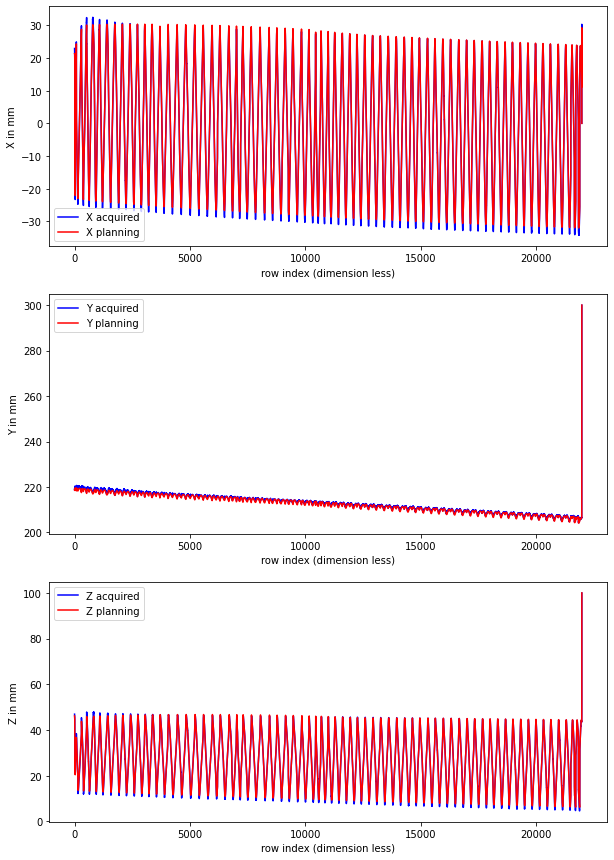

In [41]:
x_final = final_df['MachineX'].copy(deep=True)                 # using machine data from newly created combined dataset
y_final = final_df['MachineY'].copy(deep=True)
z_final = final_df['MachineZ'].copy(deep=True)
a_final = final_df['MachineA'].copy(deep=True)
c_final = final_df['MachineC'].copy(deep=True)

size1_final = x_final.shape[0]

# converting pandas series to numpy array
x_final = x_final.to_numpy()
y_final = y_final.to_numpy()
z_final = z_final.to_numpy()
a_final = a_final.to_numpy(dtype =  np.float64)
a_final = np.deg2rad(a_final)
c_final = c_final.to_numpy(dtype =  np.float64)
c_final = np.deg2rad(c_final)

tool_tip_X_final = final_df['Tool Tip Point X'].to_numpy()        # using newly created combined dataset
tool_tip_Y_final = final_df['Tool Tip Point Y'].to_numpy()
tool_tip_Z_final = final_df['Tool Tip Point Z'].to_numpy()
    
X_inv_final = tool_tip_X_final
Y_inv_final = tool_tip_Y_final
Z_inv_final = tool_tip_Z_final
    
#compensation_values
compensation_values = compensation_values_df.to_numpy()

# Within each cube we have ranges defined in x,y,z for the machine position

x_range = np.arange(-200,201,100)
y_range = np.arange(-300,301,150)
z_range = np.arange(-500,1,50)

obj3_final = compensation.Compensation(compensation_values,x_range,y_range,z_range)

# Caclculation of compensation error values based on machine positions obtained through inverse transformation
deltaX1_final, deltaY1_final, deltaZ1_final,deltaI1_final,deltaJ1_final,deltaK1_final = obj3_final.calculate(x_final,y_final,z_final)  
size3_final = x_final.shape[0]
conc3_final = np.concatenate((deltaX1_final.reshape(size3_final,1),deltaY1_final.reshape(size3_final,1),deltaZ1_final.reshape(size3_final,1),deltaI1_final.reshape(size3_final,1),deltaJ1_final.reshape(size3_final,1),deltaK1_final.reshape(size3_final,1)),axis=1)

# prininting the compensation error values
df_obj3_final = pd.DataFrame(conc3_final, columns=['deltaX1 final','deltaY1 final','deltaZ1 final','deltaI1 final','deltaJ1 final','deltaK1 final'])
df_obj3_final.head(5)  

x_compensated_final = x_final + deltaX1_final*10**-3    # since given compensation is to be converted from microns to mm (10**-6 x 10**3 = 10**-3)
y_compensated_final = y_final + deltaY1_final*10**-3
z_compensated_final = z_final + deltaZ1_final*10**-3

conc4_final = np.concatenate((x_compensated_final.reshape(size3_final,1),y_compensated_final.reshape(size3_final,1),z_compensated_final.reshape(size3_final,1)),axis=1)
df_obj4_final = pd.DataFrame(conc4_final, columns=['x_compensated final','y_compensated final','z_compensated final'])

obj_final = transformation.Transformation(size1_final,angle)
# Forward Transformation fuction:
# Input : Machine points in machine coordinate system
# Output: returns too tip points and orientation in workpiece coordinate system
tool_position_workpiece_CS_final, tool_orientation_workpiece_CS_final = obj_final.forward(x_compensated_final,y_compensated_final,z_compensated_final,a_final,c_final)

X_final = tool_position_workpiece_CS_final[0,0,:]
Y_final = tool_position_workpiece_CS_final[1,0,:]
Z_final = tool_position_workpiece_CS_final[2,0,:]

I_final = tool_orientation_workpiece_CS_final[0,0,:]
J_final = tool_orientation_workpiece_CS_final[1,0,:]
K_final = tool_orientation_workpiece_CS_final[2,0,:]

# Verification the correctness of code, i.e on applying reverse transformation on the forward transformation we should get same values
machine_points_xyz_final, machine_direction_ac_final = obj_final.backward(X_final,Y_final,Z_final,I_final,J_final,K_final)

x_out_final = machine_points_xyz_final[0,0,:]
y_out_final = machine_points_xyz_final[1,0,:]
z_out_final = machine_points_xyz_final[2,0,:]

a_out_final = machine_direction_ac_final[0,0,:]
c_out_final = machine_direction_ac_final[1,0,:]

conc1_final = np.concatenate((x_final.reshape(size1_final,1),x_out_final.reshape(size1_final,1),y_final.reshape(size1_final,1),y_out_final.reshape(size1_final,1),z_final.reshape(size1_final,1),z_out_final.reshape(size1_final,1),a_final.reshape(size1_final,1),a_out_final.reshape(size1_final,1),c_final.reshape(size1_final,1),c_out_final.reshape(size1_final,1)),axis=1)
df_obj1_final = pd.DataFrame(conc1_final, columns=['x final','x_out final','y final','y_out final','z final','z_out final','a final','a_out final','c final','c_out'])

conc11_final = np.concatenate((x_final.reshape(size1_final,1),y_final.reshape(size1_final,1),z_final.reshape(size1_final,1),a_final.reshape(size1_final,1),c_final.reshape(size1_final,1),X_final.reshape(size1_final,1),Y_final.reshape(size1_final,1),Z_final.reshape(size1_final,1),I_final.reshape(size1_final,1),J_final.reshape(size1_final,1),K_final.reshape(size1_final,1)),axis=1)
dfout11_final = pd.DataFrame(conc11_final, columns=['x final','y final','z final','a final','c final','X final','Y final','Z final','I final','J final','K final'])
    
subplotter(0,final_df.shape[0],X_final,Y_final,Z_final,X_inv_final,Y_inv_final,Z_inv_final)   # using combined dataset

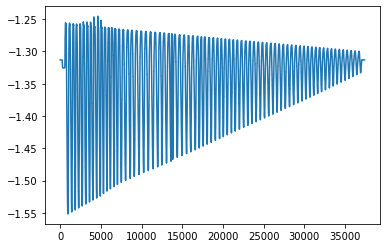

In [42]:
plt.plot(a)

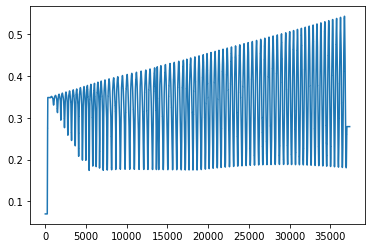

In [43]:
plt.plot(c)

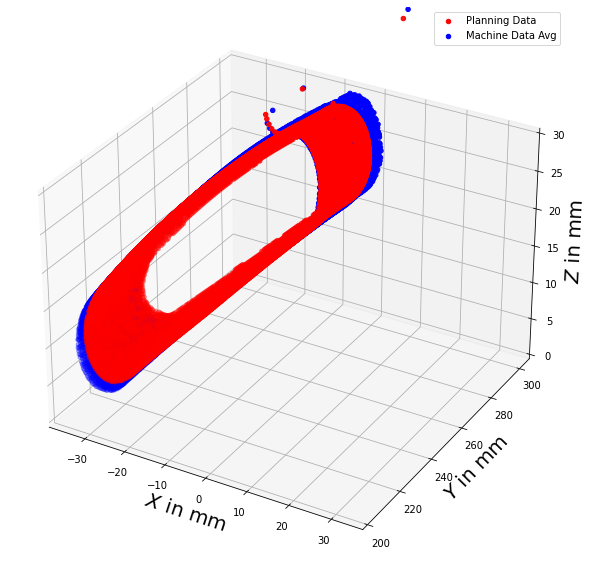

In [44]:
plt.figure(figsize=(10,15))
ax1 = plt.axes(projection='3d')
ax1.set_zlim3d([0,30])

ax1.set_xlabel('$X$ in mm', fontsize=20)
ax1.set_ylabel('$Y$ in mm', fontsize=20)
ax1.set_zlabel('$Z$ in mm', fontsize=20)

ax1.scatter3D(X_inv_final, Y_inv_final, Z_inv_final, color = 'red',label = 'Planning Data')
ax1.legend()

ax1.scatter3D(X_final, Y_final, Z_final, color = 'blue',label = 'Machine Data Avg')
ax1.legend()

In [45]:
def remove_peaks(final_df, compensation_values_df):
    x_final = final_df['MachineX'].copy(deep=True)                 # using machine data from newly created combined dataset
    y_final = final_df['MachineY'].copy(deep=True)
    z_final = final_df['MachineZ'].copy(deep=True)
    a_final = final_df['MachineA'].copy(deep=True)
    c_final = final_df['MachineC'].copy(deep=True)

    size1_final = x_final.shape[0]

    # converting pandas series to numpy array
    x_final = x_final.to_numpy()
    y_final = y_final.to_numpy()
    z_final = z_final.to_numpy()
    a_final = a_final.to_numpy(dtype =  np.float64)
    a_final = np.deg2rad(a_final)
    c_final = c_final.to_numpy(dtype =  np.float64)
    c_final = np.deg2rad(c_final)

    tool_tip_X_final = final_df['Tool Tip Point X'].to_numpy()        # using newly created combined dataset
    tool_tip_Y_final = final_df['Tool Tip Point Y'].to_numpy()
    tool_tip_Z_final = final_df['Tool Tip Point Z'].to_numpy()
    
    X_inv_final = tool_tip_X_final
    Y_inv_final = tool_tip_Y_final
    Z_inv_final = tool_tip_Z_final
    
    #compensation_values
    compensation_values = compensation_values_df.to_numpy()

    # Within each cube we have ranges defined in x,y,z for the machine position

    x_range = np.arange(-200,201,100)
    y_range = np.arange(-300,301,150)
    z_range = np.arange(-500,1,50)

    obj3_final = compensation.Compensation(compensation_values,x_range,y_range,z_range)

    # Caclculation of compensation error values based on machine positions obtained through inverse transformation
    deltaX1_final, deltaY1_final, deltaZ1_final,deltaI1_final,deltaJ1_final,deltaK1_final = obj3_final.calculate(x_final,y_final,z_final)  
    size3_final = x_final.shape[0]
    conc3_final = np.concatenate((deltaX1_final.reshape(size3_final,1),deltaY1_final.reshape(size3_final,1),deltaZ1_final.reshape(size3_final,1),deltaI1_final.reshape(size3_final,1),deltaJ1_final.reshape(size3_final,1),deltaK1_final.reshape(size3_final,1)),axis=1)

    # prininting the compensation error values
    df_obj3_final = pd.DataFrame(conc3_final, columns=['deltaX1 final','deltaY1 final','deltaZ1 final','deltaI1 final','deltaJ1 final','deltaK1 final'])
    df_obj3_final.head(5)  

    x_compensated_final = x_final + deltaX1_final*10**-3    # since given compensation is to be converted from microns to mm (10**-6 x 10**3 = 10**-3)
    y_compensated_final = y_final + deltaY1_final*10**-3
    z_compensated_final = z_final + deltaZ1_final*10**-3

    conc4_final = np.concatenate((x_compensated_final.reshape(size3_final,1),y_compensated_final.reshape(size3_final,1),z_compensated_final.reshape(size3_final,1)),axis=1)
    df_obj4_final = pd.DataFrame(conc4_final, columns=['x_compensated final','y_compensated final','z_compensated final'])

    obj_final = transformation.Transformation(size1_final,angle)
    # Forward Transformation fuction:
    # Input : Machine points in machine coordinate system
    # Output: returns too tip points and orientation in workpiece coordinate system
    tool_position_workpiece_CS_final, tool_orientation_workpiece_CS_final = obj_final.forward(x_compensated_final,y_compensated_final,z_compensated_final,a_final,c_final)

    X_final = tool_position_workpiece_CS_final[0,0,:]
    Y_final = tool_position_workpiece_CS_final[1,0,:]
    Z_final = tool_position_workpiece_CS_final[2,0,:]

    I_final = tool_orientation_workpiece_CS_final[0,0,:]
    J_final = tool_orientation_workpiece_CS_final[1,0,:]
    K_final = tool_orientation_workpiece_CS_final[2,0,:]

    # Verification the correctness of code, i.e on applying reverse transformation on the forward transformation we should get same values
    machine_points_xyz_final, machine_direction_ac_final = obj_final.backward(X_final,Y_final,Z_final,I_final,J_final,K_final)

    x_out_final = machine_points_xyz_final[0,0,:]
    y_out_final = machine_points_xyz_final[1,0,:]
    z_out_final = machine_points_xyz_final[2,0,:]

    a_out_final = machine_direction_ac_final[0,0,:]
    c_out_final = machine_direction_ac_final[1,0,:]

    conc1_final = np.concatenate((x_final.reshape(size1_final,1),x_out_final.reshape(size1_final,1),y_final.reshape(size1_final,1),y_out_final.reshape(size1_final,1),z_final.reshape(size1_final,1),z_out_final.reshape(size1_final,1),a_final.reshape(size1_final,1),a_out_final.reshape(size1_final,1),c_final.reshape(size1_final,1),c_out_final.reshape(size1_final,1)),axis=1)
    df_obj1_final = pd.DataFrame(conc1_final, columns=['x final','x_out final','y final','y_out final','z final','z_out final','a final','a_out final','c final','c_out'])

    conc11_final = np.concatenate((x_final.reshape(size1_final,1),y_final.reshape(size1_final,1),z_final.reshape(size1_final,1),a_final.reshape(size1_final,1),c_final.reshape(size1_final,1),X_final.reshape(size1_final,1),Y_final.reshape(size1_final,1),Z_final.reshape(size1_final,1),I_final.reshape(size1_final,1),J_final.reshape(size1_final,1),K_final.reshape(size1_final,1)),axis=1)
    dfout11_final = pd.DataFrame(conc11_final, columns=['x final','y final','z final','a final','c final','X final','Y final','Z final','I final','J final','K final'])
    
    #subplotter(0,final_df.shape[0],X_final,Y_final,Z_final,X_inv_final,Y_inv_final,Z_inv_final)   # using combined dataset
    
    return Y_final, final_df

In [46]:
# Peak removal: by observing the data,
# it can be seen that the using just one of the components (in this case Y) all the outlers can be eliminated. 
count = 0
col = final_df.columns
while True:
    Y_final, final_df = remove_peaks(final_df,compensation_values_df)
    # Two types of spikes are typicalled observed (check visualizaion by runnung  vizualization.ipnyb) 
    # one in positive direction and othes in negetive direction, so for robostness both are considered. 
    # At the same time, it is not wise to remove the original expected trajectory of the tool path in begining and the end,
    # so especially for the positive direction they are intentionally not removed 
    
    peaks1, _ = find_peaks(-Y_final, height=(-175,None))
    peaks2,_ = find_peaks(Y_final[0:-1000], height=(240,None))
    peaks = list(peaks1) + list(peaks2)
    print(peaks)
    
    if(len(peaks)==0):
        break
        
    # if each peak on a plateu has to be removed its very expensive, so if two neighbous are consicutively classifies as peaks 
    # (given by count), it is assumed as plateu and 100 datapoint sare removed.
    # This is a reasonable compromise in accuracy for significant speedup
        
    #elif(len(peaks)==1 and abs(Y_final[peaks[0]] - Y_final[peaks[0]+20] )<=0.3):
    elif(len(peaks)==1 and count>2):
        arr = final_df.to_numpy()
        arr = np.delete(arr, np.arange(peaks[0],peaks[0]+100), 0)
        final_df = pd.DataFrame(arr,columns=col)
        count = 0
        
    else:
        arr = final_df.to_numpy()
        arr = np.delete(arr,peaks, 0)
        final_df = pd.DataFrame(arr,columns=col)
        count = count+1
        
        

0 -75.18643333333333 379.48484
1 -73.58900333333334 377.3986666666667
2 -72.99991363636363 376.6087363636364
3 -73.010795 377.08076
4 -72.7458 376.84491
5 -72.4085 376.46071250000006
6 -73.394825 378.383375
7 -72.91146666666667 377.86370000000005
8 -73.79216666666667 379.25183333333337
9 -74.2144 379.9868000000001
10 -72.1185 380.1035
11 -72.15 380.1068
12 -72.1697 380.10850000000005
13 -72.2146 380.11190000000005
14 -72.25225 380.1144
15 -72.2939 380.117
16 -72.34653333333334 380.11983333333336
17 -72.5444 380.12870000000004
18 -72.5848 380.13
19 -72.727 380.13200000000006
20 -72.8279 380.1331
21 -72.9876 380.1347
22 -73.2225 380.13640000000004
23 -73.286 380.1367000000001
24 -73.3615 380.137
25 -73.43190000000001 380.13720000000006
26 -73.4991 380.1374
27 -73.5675 380.1376
28 -73.65190000000001 380.13770000000005
29 -85.3549 379.9768
30 -85.4524 379.97470000000004
31 -85.5398 379.97290000000004
32 -85.6355 379.97090000000003
33 -85.7303 379.9689000000001
34 -85.8241 379.9669
35 -85.9

450 -86.5955 379.8552
451 -86.6726 379.84950000000003
452 -86.8158 379.83880000000005
453 -86.9614 379.82770000000005
454 -87.0323 379.8222
455 -87.1633 379.8118
456 -87.2301 379.8064
457 -87.2956 379.80100000000004
458 -87.4164 379.7909
459 -87.5376 379.7805
460 -87.5959 379.77540000000005
461 -87.703 379.76570000000004
462 -87.7568 379.7607
463 -87.93074999999999 379.74385000000007
464 -87.9982 379.737
465 -88.0852 379.7275
466 -88.1261 379.7225
467 -88.1615 379.71750000000003
468 -88.1987 379.7103
469 -88.2342 379.7015
470 -88.2679 379.69130000000007
471 -88.3 379.6798
472 -88.3559 379.65340000000003
473 -88.4071 379.6206
474 -88.4299 379.6023
475 -88.4846 379.5416
476 -88.5125 379.49440000000004
477 -88.5379 379.41790000000003
478 -88.5451 379.36080000000004
479 -88.5454 379.33330000000007
480 -88.5393 379.27110000000005
481 -88.5329 379.2388
482 -88.5243 379.20590000000004
483 -88.5011 379.14070000000004
484 -88.4676 379.07040000000006
485 -88.4474 379.03450000000004
486 -88.3438 

909 -73.1147 380.8752
910 -73.1695 380.878
911 -73.2257 380.8806000000001
912 -73.3011 381.0323000000001
913 -73.6195 380.74060000000003
914 -73.7704 380.74150000000003
915 -73.8405 380.74160000000006
916 -73.9855 380.74100000000004
917 -74.1709 380.6889
918 -74.3618 380.58590000000004
919 -74.5048 380.43420000000003
920 -74.6148 380.43260000000004
921 -74.7806 380.2821
922 -74.89080000000001 380.2807
923 -75.04159999999999 380.20585000000005
924 -75.1936 380.1317
925 -75.3046 380.1308
926 -75.4155 380.1299
927 -75.5266 380.12890000000004
928 -75.7496 380.12690000000003
929 -76.0897 380.12350000000004
930 -76.2053 380.1223
931 -76.3223 380.12110000000007
932 -76.4412 380.1197
933 -76.5621 380.11840000000007
934 -76.6854 380.117
935 -76.698 380.24620000000004
936 -76.82340000000002 380.24320000000006
937 -77.083 380.2368
938 -77.2541 380.3539
939 -77.3923 380.3484
940 -77.4532 380.4638
941 -77.5954 380.4558
942 -77.7418 380.4476
943 -78.5129 380.5016
944 -78.732 380.53260000000006
945 -

1326 -87.6546 379.4508
1327 -87.6071 379.39140000000003
1328 -87.7246 379.42060000000004
1329 -87.71515 379.3767
1330 -87.6449 379.25
1331 -87.6965 379.1809
1332 -87.7583 379.05860000000007
1333 -87.7757 379.0106
1334 -87.8774 379.03335000000004
1335 -87.89125 378.98400000000004
1336 -87.931 378.96380000000005
1337 -87.91165000000001 378.8826
1338 -88.0064 378.91560000000004
1339 -87.8374 378.67420000000004
1340 -87.8406 378.60920000000004
1341 -87.90026666666667 378.6161333333333
1342 -87.95773333333334 378.6217666666667
1343 -87.92519999999999 378.51975000000004
1344 -87.93757999999998 378.47556000000003
1345 -87.8232 378.25910000000005
1346 -87.99230000000001 378.44550000000004
1347 -87.89065 378.24445000000003
1348 -87.9658 378.3104
1349 -87.769 377.9501
1350 -87.85776 378.04952000000003
1351 -87.9101 378.1043
1352 -87.7039 377.70570000000004
1353 -87.63897500000002 377.51142500000003
1354 -87.5826 377.36350000000004
1355 -87.5042 377.18440000000004
1356 -87.6486 377.5074
1357 -87.

1701 -87.2008 376.55395000000004
1702 -87.151 376.44155
1703 -87.05630000000001 376.24750000000006
1704 -86.99936666666667 376.1328666666667
1705 -87.0631 376.24270000000007
1706 -86.92886666666668 375.99600000000004
1707 -86.6323 375.4836
1708 -86.8056 375.78880000000004
1709 -86.4692 375.23640000000006
1710 -86.6555 375.5538
1711 -86.38870000000001 375.15365
1712 -86.4975 375.32340000000005
1713 -86.13876666666665 374.8183333333334
1714 -86.3211 375.0858
1715 -86.0115 374.677
1716 -86.132 374.84880000000004
1717 -85.5675 374.14520000000005
1718 -85.4489 374.02570000000003
1719 -85.2071 373.79580000000004
1720 -84.9455 373.56540000000007
1721 -84.6777 373.34610000000004
1722 -84.73126666666666 373.4335666666667
1723 -84.9935 373.71860000000004
1724 -84.16273333333334 372.9424
1725 -83.95396666666666 372.7772666666667
1726 -83.7216 372.6068
1727 -83.8639 372.7751
1728 -83.6915 372.6701
1729 -83.3706 372.411
1730 -83.208 372.3273
1731 -83.0454 372.24760000000003
1732 -82.8765 372.169600

1976 -84.4775 379.8233000000001
1977 -84.5621 379.8032
1978 -84.6459 379.78310000000005
1979 -84.7287 379.7631
1980 -84.8107 379.7432
1981 -84.8826 379.72560000000004
1982 -84.9627 379.70570000000004
1983 -85.0418 379.686
1984 -85.12 379.6664
1985 -85.2649 379.6295
1986 -85.414 379.59080000000006
1987 -85.4871 379.57160000000005
1988 -85.622 379.5355
1989 -85.6918 379.51660000000004
1990 -85.7603 379.4978
1991 -85.8278 379.4791
1992 -85.8941 379.4605
1993 -86.0159 379.42580000000004
1994 -86.0785 379.40760000000006
1995 -86.1399 379.3895
1996 -86.2001 379.3715
1997 -86.31 379.33810000000005
1998 -86.3663 379.32050000000004
1999 -86.4212 379.30310000000003
2000 -86.5214 379.27070000000003
2001 -86.6218 379.2371
2002 -86.6698 379.2205
2003 -86.7568 379.18960000000004
2004 -86.8005 379.17350000000005
2005 -86.8427 379.15770000000003
2006 -87.0047 379.1940333333333
2007 -87.04353333333334 379.17923333333334
2008 -87.1408 379.19030000000004
2009 -87.08310000000002 379.13300000000004
2010 -8

2396 -81.0385 371.3265
2397 -80.8793 371.24920000000003
2398 -80.5188 371.0883
2399 -80.2781 370.99160000000006
2400 -80.0373 370.9035
2401 -79.7963 370.82390000000004
2402 -79.5553 370.7529
2403 -79.0739 370.6368
2404 -78.8329 370.59180000000003
2405 -78.5892 370.55510000000004
2406 -78.3436 370.5265
2407 -78.0979 370.5058
2408 -77.854 370.4929
2409 -77.6135 370.4877
2410 -77.3779 370.49010000000004
2411 -77.1484 370.5002
2412 -76.9268 370.5179
2413 -76.7145 370.5434
2414 -76.41815 370.4335
2415 -76.3097 370.61830000000003
2416 -76.1155 370.6686
2417 -75.9773 370.36580000000004
2418 -75.9262 370.7276
2419 -75.7418 370.7955
2420 -75.5619 370.87200000000007
2421 -75.3867 370.95720000000006
2422 -75.19749999999999 370.88615000000004
2423 -75.0492 371.15400000000005
2424 -74.887 371.2656
2425 -74.8917 370.9298
2426 -74.7291 371.386
2427 -74.6262 371.4708
2428 -74.525 371.5607
2429 -74.5237 371.4856333333334
2430 -74.4293 371.58510000000007
2431 -74.1514 371.9561
2432 -74.3605 371.6823
243

2797 -72.4234 380.1096
2798 -72.45390000000002 380.20115000000004
2799 -72.441 380.3394
2800 -72.45606666666667 380.38723333333337
2801 -72.4632 380.43460000000005
2802 -72.45652 380.51482000000004
2803 -72.45107142857142 380.57121428571435
2804 -72.4226 380.60285
2805 -72.44077999999999 380.64468
2806 -72.4492 380.68600000000004
2807 -72.4437 380.70520000000005
2808 -72.41295 380.73025
2809 -72.4307 380.7626
2810 -72.404525 380.78970000000004
2811 -72.40913333333333 380.8201
2812 -72.4203 380.8648
2813 -72.3833 380.83910000000003
2814 -72.4206 380.9304
2815 -72.4215 380.94930000000005
2816 -72.4243 380.98510000000005
2817 -72.41024999999999 380.98080000000004
2818 -72.431 381.0412
2819 -72.4364 381.07630000000006
2820 -72.4396 381.09470000000005
2821 -72.44465 381.12225000000007
2822 -72.4554 381.1746
2823 -72.4613 381.20140000000004
2824 -72.46880000000002 381.23480000000006
2825 -72.48526666666667 381.28763333333336
2826 -72.4808 381.2868
2827 -72.4882 381.319
2828 -72.5065999999999

3269 -83.7242 379.7354666666667
3270 -83.90504999999999 379.67470000000003
3271 -83.960875 379.632775
3272 -84.1339 379.62140000000005
3273 -84.16125 379.56965
3274 -84.2486 379.5477333333333
3275 -84.2668 379.4811
3276 -84.4222 379.50620000000004
3277 -84.4471 379.44945
3278 -84.49856666666668 379.4109666666667
3279 -84.5376 379.36
3280 -84.6658 379.37160000000006
3281 -84.66370000000002 379.302
3282 -84.78025000000001 379.30345
3283 -84.9548 379.2816
3284 -85.0816 379.2253
3285 -85.3148 379.118
3286 -85.428 379.06390000000005
3287 -85.5825 378.98740000000004
3288 -85.6336 378.96130000000005
3289 -85.6835 378.9354
3290 -85.7739 378.8873
3291 -85.8646 378.8373
3292 -85.908 378.81270000000006
3293 -85.945 378.79100000000005
3294 -85.9855 378.7669
3295 -86.0247 378.7431
3296 -86.0985 378.69570000000004
3297 -86.1289 378.6743
3298 -86.1884 378.61840000000007
3299 -86.2346 378.54600000000005
3300 -86.2506 378.50770000000006
3301 -86.2646 378.46020000000004
3302 -86.2753 378.4089
3303 -86.2

3572 -80.5536 380.8932
3573 -80.6478 380.85980000000006
3574 -80.7419 380.82630000000006
3575 -80.8357 380.7927
3576 -80.9182 380.7629
3577 -81.0116 380.72900000000004
3578 -81.1046 380.695
3579 -81.28970000000001 380.62680000000006
3580 -81.3709 380.5966
3581 -81.4626 380.5622
3582 -81.5539 380.52780000000007
3583 -81.7355 380.45880000000005
3584 -81.9046 380.39360000000005
3585 -81.9939 380.35900000000004
3586 -82.0827 380.3243
3587 -82.1711 380.28950000000003
3588 -82.2485 380.25880000000006
3589 -82.3359 380.2241
3590 -82.4226 380.18930000000006
3591 -82.5089 380.1544
3592 -82.5946 380.1196
3593 -82.6697 380.0889
3594 -82.7542 380.0541
3595 -82.8381 380.0194
3596 -82.9213 379.98460000000006
3597 -83.0039 379.9499
3598 -83.07630000000002 379.9193
3599 -83.1576 379.88470000000007
3600 -83.2382 379.8501
3601 -83.318 379.8156
3602 -83.43185 379.7659
3603 -83.5441 379.71650000000005
3604 -83.621 379.68230000000005
3605 -83.6971 379.64820000000003
3606 -83.7724 379.6141
3607 -83.83820000

3990 -85.5707 378.66540000000003
3991 -85.6116 378.63770000000005
3992 -85.6512 378.6104
3993 -85.6895 378.5833
3994 -85.7264 378.55640000000005
3995 -85.758 378.53280000000007
3996 -85.7913 378.5056
3997 -85.8218 378.4769
3998 -85.849 378.44530000000003
3999 -85.87210000000002 378.40990000000005
4000 -85.9032 378.3302
4001 -85.9134 378.2821
4002 -85.9196 378.2302
4003 -85.9219 378.17470000000003
4004 -85.9205 378.12140000000005
4005 -85.9145 378.0582
4006 -85.9049 377.99190000000004
4007 -85.8915 377.92220000000003
4008 -85.86495 377.81475
4009 -85.8305 377.70060000000007
4010 -85.8021 377.6182
4011 -85.7703 377.53310000000005
4012 -85.7351 377.44530000000003
4013 -85.6998 377.36260000000004
4014 -85.6571 377.2694
4015 -85.5602 377.0765
4016 -85.506 376.9768
4017 -85.4524 376.8826
4018 -85.3898 376.77810000000005
4019 -85.3235 376.67170000000004
4020 -85.25360000000002 376.56340000000006
4021 -85.18030000000002 376.45340000000004
4022 -85.1091 376.34960000000007
4023 -84.9445 376.1210

4358 -85.22866666666665 378.6522666666667
4359 -85.21155 378.586225
4360 -85.2386 378.5169
4361 -85.4093 378.58770000000004
4362 -85.4495 378.55840000000006
4363 -85.4565 378.4494
4364 -85.49199999999999 378.42035000000004
4365 -85.50063333333335 378.37463333333335
4366 -85.4842 378.30690000000004
4367 -85.58335 378.3308
4368 -85.568125 378.26910000000004
4369 -85.668525 378.279425
4370 -85.64475 378.1951
4371 -85.7394 378.18760000000003
4372 -85.7429 378.1349
4373 -85.7421 378.0787
4374 -85.7377 378.02490000000006
4375 -85.728 377.9612
4376 -85.7143 377.8943
4377 -85.6966 377.8243
4378 -85.6749 377.75110000000006
4379 -85.6516 377.6818
4380 -85.62160000000002 377.60220000000004
4381 -85.5879 377.51980000000003
4382 -85.5506 377.43480000000005
4383 -85.5097 377.3472
4384 -85.46910000000001 377.26460000000003
4385 -85.4204 377.1716
4386 -85.3682 377.0765
4387 -85.3123 376.9792
4388 -85.2528 376.87980000000005
4389 -85.1945 376.78600000000006
4390 -85.12710000000001 376.6820000000001
439

4832 -75.187 370.3861
4833 -75.0836 370.45910000000003
4834 -75.0272 370.5385
4835 -74.8001 370.7327
4836 -74.71295 370.87995000000006
4837 -74.6114 371.0024
4838 -74.61145 371.04465000000005
4839 -74.5138 371.18020000000007
4840 -74.51535 371.2257
4841 -74.41770000000001 371.37570000000005
4842 -74.3714 371.47790000000003
4843 -74.3256 371.58360000000005
4844 -74.2781 371.69950000000006
4845 -74.2333 371.8142
4846 -74.1887 371.93330000000003
4847 -74.1394 372.0724
4848 -74.0939 372.20680000000004
4849 -74.01806000000002 372.37552000000005
4850 -74.0093 372.4739
4851 -73.907475 372.68185
4852 -73.9327 372.7366
4853 -73.8946 372.87460000000004
4854 -73.77780000000001 373.11260000000004
4855 -73.86020000000002 373.00360000000006
4856 -73.8238 373.14590000000004
4857 -73.74775 373.34510000000006
4858 -73.7535 373.43530000000004
4859 -73.6426 373.6838
4860 -73.7195 373.58230000000003
4861 -73.6888 373.7196
4862 -73.5863 374.07800000000003
4863 -73.5939 374.1729
4864 -73.5638 374.326
4865 -

5326 -72.8318 382.5402
5327 -72.8163 382.52420000000006
5328 -72.82743333333333 382.57563333333337
5329 -72.8329 382.61105000000003
5330 -72.8493 382.67760000000004
5331 -72.8254 382.6693666666667
5332 -72.8298 382.70785
5333 -72.8458 382.77350000000007
5334 -72.84390000000002 382.7979
5335 -72.8055 382.7311
5336 -72.839 382.8464
5337 -72.8359 382.8704
5338 -72.8327 382.89160000000004
5339 -72.7924 382.81960000000004
5340 -72.8259 382.9388
5341 -72.8242 382.9621
5342 -72.8252 383.0056000000001
5343 -72.8281 383.02830000000006
5344 -72.8324 383.05080000000004
5345 -72.8382 383.0731
5346 -72.8453 383.09520000000003
5347 -72.8528 383.1146
5348 -72.863 383.13620000000003
5349 -72.8744 383.1575
5350 -72.8872 383.1786
5351 -72.9014 383.19950000000006
5352 -72.92643333333332 383.2311666666667
5353 -72.9504 383.25780000000003
5354 -72.97 383.2774
5355 -72.9908 383.2967
5356 -73.0104 383.31350000000003
5357 -73.034 383.3321
5358 -73.0588 383.35040000000004
5359 -73.08470000000001 383.3684000000

5761 -75.39180000000002 382.2554
5762 -75.4831 382.2394
5763 -75.5749 382.22270000000003
5764 -75.6674 382.2053
5765 -75.7607 382.1872
5766 -75.855 382.1684
5767 -76.0473 382.12850000000003
5768 -76.1458 382.1073
5769 -76.246 382.08520000000004
5770 -76.2726 382.2042
5771 -76.3745 382.17910000000006
5772 -76.4785 382.1529
5773 -76.585 382.1256
5774 -76.5562 382.25140000000005
5775 -76.6637 382.22110000000004
5776 -76.8171 382.2885
5777 -76.9302 382.25250000000005
5778 -77.0465 382.21500000000003
5779 -77.1081 382.29780000000005
5780 -77.1879 382.2694
5781 -77.26860000000002 382.24050000000005
5782 -77.3537 382.20950000000005
5783 -77.4371 382.1788
5784 -77.5213 382.14750000000004
5785 -77.61260000000001 382.1132
5786 -77.6061 382.20380000000006
5787 -77.7885 382.1293
5788 -77.8456 382.18710000000004
5789 -77.94 382.10945000000004
5790 -78.0052 382.1213000000001
5791 -78.0913 382.08540000000005
5792 -78.14665 382.0975
5793 -78.1915 382.1116
5794 -78.2781 382.0724
5795 -78.3547 382.03740

6148 -76.1728 382.2281
6149 -76.2484 382.3346
6150 -76.3487 382.3081
6151 -76.4512 382.28040000000004
6152 -76.59950000000002 382.35550000000006
6153 -76.7069 382.32280000000003
6154 -76.8953 382.3718
6155 -77.0098 382.33220000000006
6156 -77.3508 382.3054
6157 -77.4378 382.2712
6158 -77.58600000000001 382.2981
6159 -77.6712 382.2611
6160 -77.77050000000001 382.2711
6161 -77.853 382.26180000000005
6162 -77.933 382.2267
6163 -78.0177 382.1893
6164 -78.0346 382.2515
6165 -78.1155 382.213
6166 -78.2762 382.13570000000004
6167 -78.3617 382.0941
6168 -78.4473 382.0522
6169 -78.48304999999999 382.08695000000006
6170 -78.6096 382.0201
6171 -78.6941 381.975
6172 -78.7786 381.9296
6173 -78.853 381.8894
6174 -78.9375 381.84330000000006
6175 -79.022 381.797
6176 -79.1065 381.7504
6177 -79.19090000000001 381.7035
6178 -79.2652 381.66200000000003
6179 -79.3494 381.6145
6180 -79.4336 381.56680000000006
6181 -79.5176 381.51890000000003
6182 -79.6385 381.4493
6183 -79.759 381.37940000000003
6184 -79.8

6636 -83.5235 375.3869
6637 -83.4421 375.2782
6638 -83.3648 375.17690000000005
6639 -83.1897 374.9549
6640 -83.0991 374.8430000000001
6641 -82.96260000000001 374.6782
6642 -82.8215 374.5124
6643 -82.7223 374.39860000000004
6644 -82.6215 374.28460000000007
6645 -82.5191 374.17040000000003
6646 -82.4224 374.06440000000003
6647 -82.3163 373.9501
6648 -82.2086 373.83590000000004
6649 -82.0995 373.72190000000006
6650 -81.9889 373.60810000000004
6651 -81.885 373.5027
6652 -81.68885 373.3229
6653 -81.6569 373.2771
6654 -81.4511 373.08740000000006
6655 -81.3147 372.9509
6656 -81.17645000000002 372.8333
6657 -81.0581 372.72505000000007
6658 -80.9432 372.62155000000007
6659 -80.8265 372.516
6660 -80.6936 372.4085
6661 -80.4531 372.2028
6662 -80.3411 372.10940000000005
6663 -80.2195 372.01020000000005
6664 -80.0975 371.91240000000005
6665 -79.9751 371.8161
6666 -79.8524 371.72130000000004
6667 -79.7162 371.6186000000001
6668 -79.5941 371.5285
6669 -79.4534 371.4273
6670 -79.3197 371.3335000000001

7065 -73.0339 380.8124
7066 -72.9511 381.23560000000003
7067 -72.97696666666668 381.25600000000003
7068 -72.9268 381.39270000000005
7069 -72.94126666666666 381.50863333333336
7070 -72.9032 381.61250000000007
7071 -72.92603333333334 381.6826666666667
7072 -72.8972 381.71990000000005
7073 -72.8949 381.7939
7074 -72.8938 381.90020000000004
7075 -72.93 381.9808
7076 -72.9359 382.2386000000001
7077 -72.945 382.41600000000005
7078 -72.9871 382.6305
7079 -72.9913 382.69790000000006
7080 -72.9955 382.7681
7081 -72.9976 382.8027000000001
7082 -72.9996 382.8369
7083 -73.0013 382.867
7084 -73.0032 382.9005
7085 -73.0049 382.93370000000004
7086 -73.0066 382.96650000000005
7087 -73.008 382.9989
7088 -73.0092 383.0273
7089 -73.0104 383.0588
7090 -73.01140000000001 383.0898
7091 -73.0122 383.12050000000005
7092 -73.0127 383.15090000000004
7093 -73.0131 383.1777000000001
7094 -73.0129 383.23780000000005
7095 -73.0124 383.26770000000005
7096 -73.0117 383.2975
7097 -73.0108 383.32380000000006
7098 -73.0

7459 -73.53196666666666 384.3517
7460 -73.5741 384.2771
7461 -73.6111 384.2909
7462 -73.649 384.30370000000005
7463 -73.688 384.31530000000004
7464 -73.7295 384.18
7465 -73.7688 384.18770000000006
7466 -73.8144 384.1952
7467 -73.8742 384.0537
7468 -73.9371 383.90860000000004
7469 -73.9294 384.0581
7470 -74.0436 383.9115
7471 -74.0939 383.911
7472 -74.1522 383.7577
7473 -74.1488 383.90920000000006
7474 -74.2044 383.7549
7475 -74.2901 383.67240000000004
7476 -74.3759 383.58810000000005
7477 -74.3714 383.66360000000003
7478 -74.4844 383.57410000000004
7479 -74.5524 383.56370000000004
7480 -74.6338 383.55
7481 -74.7427 383.38210000000004
7482 -74.8245 383.3661
7483 -74.9062 383.34890000000007
7484 -75.0093 383.1818
7485 -75.0922 383.1632
7486 -75.1751 383.14380000000006
7487 -75.2843 383.04695000000004
7488 -75.3951 382.94980000000004
7489 -75.4802 382.92810000000003
7490 -75.5658 382.9056
7491 -75.6521 382.88210000000004
7492 -75.7393 382.8577
7493 -75.8274 382.83230000000003
7494 -75.916

7916 -81.0103 380.2825
7917 -81.0795 380.22110000000004
7918 -81.1403 380.1668
7919 -81.2086 380.10540000000003
7920 -81.2763 380.0441
7921 -81.38806666666666 379.94200000000006
7922 -81.4689 379.8675
7923 -81.5345 379.8064
7924 -81.5995 379.7455
7925 -81.6639 379.6846
7926 -81.7278 379.6238
7927 -81.7838 379.5701
7928 -81.8464 379.50960000000003
7929 -81.9084 379.4492000000001
7930 -81.9697 379.389
7931 -82.0304 379.329
7932 -82.0836 379.276
7933 -82.1428 379.21630000000005
7934 -82.2014 379.15680000000003
7935 -82.25930000000001 379.0975
7936 -82.3165 379.0385
7937 -82.3665 378.9864
7938 -82.4222 378.9279
7939 -82.477 378.8695000000001
7940 -82.5311 378.8115
7941 -82.58440000000002 378.7538
7942 -82.631 378.7029
7943 -82.6826 378.64570000000003
7944 -82.7334 378.58880000000005
7945 -82.7834 378.5323000000001
7946 -82.8539 378.45135
7947 -82.9226 378.37110000000007
7948 -82.969 378.31600000000003
7949 -83.0146 378.26120000000003
7950 -83.0592 378.2068
7951 -83.2224 378.2546
7952 -83.2

8357 -83.59160000000001 377.2585
8358 -83.608 377.20785000000006
8359 -83.64783333333332 377.1732
8360 -83.5493 377.02490000000006
8361 -83.5536 376.96160000000003
8362 -83.5543 376.89590000000004
8363 -83.5518 376.8349
8364 -83.60043333333336 376.79176666666666
8365 -83.61755 376.7328
8366 -83.57643333333336 376.6441666666667
8367 -83.6136 376.5947666666667
8368 -83.56710000000001 376.50600000000003
8369 -83.4643 376.38750000000005
8370 -83.438 376.30460000000005
8371 -83.4087 376.2199
8372 -83.3765 376.13370000000003
8373 -83.3447 376.0539
8374 -83.28575 375.91865
8375 -83.2213 375.7806
8376 -83.1749 375.68670000000003
8377 -83.1302 375.60010000000005
8378 -83.0782 375.50350000000003
8379 -83.0237 375.40590000000003
8380 -82.9668 375.3072
8381 -82.9076 375.2075
8382 -82.8514 375.11560000000003
8383 -82.7872 375.01390000000004
8384 -82.7208 374.9116
8385 -82.6524 374.80870000000004
8386 -82.5819 374.70500000000004
8387 -82.4405 374.5047
8388 -82.3638 374.39950000000005
8389 -82.2853 3

8821 -73.457 378.401
8822 -73.4073 378.83500000000004
8823 -73.3914 378.9834000000001
8824 -73.3761 379.13120000000004
8825 -73.3625 379.26580000000007
8826 -73.3484 379.4112
8827 -73.3348 379.555
8828 -73.3219 379.69710000000003
8829 -73.3095 379.83700000000005
8830 -73.2988 379.9628
8831 -73.2877 380.0973
8832 -73.2772 380.2287
8833 -73.2672 380.3568
8834 -73.2577 380.48150000000004
8835 -73.2494 380.5915
8836 -73.2409 380.7074
8837 -73.23270000000001 380.8188
8838 -73.2247 380.92550000000006
8839 -73.2171 381.02720000000005
8840 -73.2105 381.1145
8841 -73.2034 381.20410000000004
8842 -73.1965 381.28790000000004
8843 -73.1897 381.3655
8844 -73.183 381.43660000000006
8845 -73.1771 381.494
8846 -73.1705 381.54990000000004
8847 -73.1639 381.5998000000001
8848 -73.15465 381.6692
8849 -73.13142 381.79654000000005
8850 -73.10804999999999 381.922925
8851 -73.1206 382.04740000000004
8852 -73.1183 382.09290000000004
8853 -73.11555 382.15845
8854 -73.1135 382.22380000000004
8855 -73.112 382.29

9204 -73.3279 380.08860000000004
9205 -73.317 380.2232
9206 -73.3068 380.3546
9207 -73.2979 380.4714
9208 -73.2887 380.5948
9209 -73.2799 380.71410000000003
9210 -73.2715 380.82900000000006
9211 -73.2635 380.93940000000003
9212 -73.2565 381.0348
9213 -73.2492 381.13370000000003
9214 -73.242 381.2269
9215 -73.235 381.3142
9216 -73.2282 381.3953
9217 -73.2221 381.46220000000005
9218 -73.2089 381.5876
9219 -73.2023 381.6402
9220 -73.1959 381.6883
9221 -73.17403333333333 381.74683333333337
9222 -73.1798 381.82450000000006
9223 -73.16106666666667 381.8711333333334
9224 -73.1673 381.96070000000003
9225 -73.14694 382.01482000000004
9226 -73.1579 382.1017
9227 -73.1545 382.1694
9228 -73.15129999999999 382.25243333333333
9229 -73.1491 382.32990000000007
9230 -73.14789999999999 382.39680000000004
9231 -73.1471 382.46330000000006
9232 -73.1469 382.5395666666667
9233 -73.1471 382.60030000000006
9234 -73.1475 382.64050000000003
9235 -73.16555 382.6924
9236 -73.1833 382.74570000000006
9237 -73.1838 

9715 -80.3598 380.2926
9716 -80.421 380.2189
9717 -80.4819 380.1453
9718 -80.7772 379.9345
9719 -80.8373 379.8632
9720 -80.8347 379.78920000000005
9721 -80.8304 379.71320000000003
9722 -80.95134999999999 379.64505
9723 -80.9384 379.57550000000003
9724 -81.181 379.44550000000004
9725 -81.2373 379.37510000000003
9726 -81.2932 379.30490000000003
9727 -81.27540000000002 379.232
9728 -81.32935 379.16115
9729 -81.3827 379.0905
9730 -81.5039 379.03380000000004
9731 -81.5566 378.9646
9732 -81.6028 378.9034
9733 -81.654 378.83480000000003
9734 -81.7046 378.76640000000003
9735 -81.7545 378.6983000000001
9736 -81.8038 378.63050000000004
9737 -81.8469 378.57060000000007
9738 -81.8945 378.5036
9739 -81.9415 378.43680000000006
9740 -81.9877 378.3704
9741 -82.0331 378.30440000000004
9742 -82.0727 378.24620000000004
9743 -82.1165 378.1809
9744 -82.1595 378.11600000000004
9745 -82.2017 378.0516
9746 -82.2671 377.9500333333334
9747 -82.3187 377.8681
9748 -82.3575 377.80550000000005
9749 -82.3953 377.743

10123 -81.7421 374.03650000000005
10124 -81.59904999999999 373.8788
10125 -81.607 373.83630000000005
10126 -81.21645 373.38415
10127 -81.2479 373.34430000000003
10128 -81.11474 373.20206
10129 -80.9542 373.0403
10130 -80.8044 372.8543
10131 -80.6433 372.6623
10132 -80.4855 372.4809
10133 -80.4015 372.3874
10134 -80.3167 372.29470000000003
10135 -80.2311 372.2029
10136 -80.1448 372.1121
10137 -79.9776 371.9413
10138 -79.88920000000002 371.85380000000004
10139 -79.74060000000001 371.7107666666667
10140 -79.6288 371.6059
10141 -79.5384 371.5238
10142 -79.4477 371.443
10143 -79.1818 371.2164
10144 -79.09 371.14200000000005
10145 -78.8511 370.95950000000005
10146 -78.7521 370.8884
10147 -78.5552 370.75340000000006
10148 -78.4637 370.69370000000004
10149 -78.3731 370.63650000000007
10150 -78.2798 370.5799
10151 -78.1912 370.528
10152 -78.1033 370.47850000000005
10153 -78.02770000000001 370.4439
10154 -77.9528 370.4116
10155 -77.8651 370.3682
10156 -77.7776 370.3274
10157 -77.6922 370.2894000

10507 -73.3394 384.40880000000004
10508 -73.3384 384.44870000000003
10509 -73.3373 384.4839
10510 -73.3359 384.52350000000007
10511 -73.3343 384.56280000000004
10512 -73.3324 384.6019
10513 -73.3302 384.64080000000007
10514 -73.3252 384.7133
10515 -73.3197 384.7893
10516 -73.318 384.8269
10517 -73.3181 384.8967
10518 -73.34049999999999 384.9925
10519 -73.3224 384.96940000000006
10520 -73.3261 385.00530000000003
10521 -73.3303 385.0368
10522 -73.3361 385.0718
10523 -73.3429 385.1064
10524 -73.3595 385.1745
10525 -73.3908 385.2694
10526 -73.4173 385.3326
10527 -73.48 385.4494
10528 -73.5154 385.50300000000004
10529 -73.5356 385.5305
10530 -73.5566 385.5575
10531 -73.5769 385.5815
10532 -73.6028 385.6095
10533 -73.6237 385.63070000000005
10534 -73.6481 385.65380000000005
10535 -73.6994 385.69800000000004
10536 -73.7263 385.71900000000005
10537 -73.7509 385.737
10538 -73.7795 385.7565
10539 -73.8144 385.70925
10540 -73.8809 385.67080000000004
10541 -73.9146 385.68280000000004
10542 -73.946

10969 -80.9727 373.1624
10970 -80.8992 373.06610000000006
10971 -80.7551 372.8829
10972 -80.6781 372.78800000000007
10973 -80.5207 372.60020000000003
10974 -78.6045 370.83160000000004
10975 -78.5057 370.76480000000004
10976 -78.4179 370.70750000000004
10977 -77.9058 370.4148
10978 -77.8245 370.3752
10979 -77.743 370.3378
10980 -77.6381 370.2384
10981 -77.5391 370.19860000000006
10982 -77.4524 370.18070000000006
10983 -77.3347 370.1412
10984 -77.223 370.12210000000005
10985 -77.1074 370.0928
10986 -76.96475000000001 370.06985
10987 -76.8231 370.05460000000005
10988 -76.7143 370.0445
10989 -76.6084 370.04040000000003
10990 -76.6734 370.0339
10991 -76.5385 370.03805
10992 -76.45 370.0432
10993 -76.3762 370.05160000000006
10994 -76.2112 370.08480000000003
10995 -75.9305 370.20720000000006
10996 -75.8488 370.2593
10997 -75.5026 370.7558
10998 -75.46380000000002 370.8307
10999 -75.4246 370.91130000000004
11000 -75.3069 371.28090000000003
11001 -75.2685 371.37890000000004
11002 -75.2301 371.4

11421 -73.8896 386.235
11422 -73.9149 386.2504
11423 -73.9799 386.1382
11424 -74.0138 386.14910000000003
11425 -74.0806 386.016
11426 -74.0784 386.1642
11427 -74.1117 386.02020000000005
11428 -74.1537 386.0237
11429 -74.1885 385.8739
11430 -74.27706666666668 385.81820000000005
11431 -74.4112 385.5437
11432 -74.453 385.5342
11433 -74.4966 385.523
11434 -74.5806 385.4981
11435 -74.7194 385.3013
11436 -74.6862 385.46110000000004
11437 -74.7837 385.2762
11438 -74.8479 385.24940000000004
11439 -74.912 385.22090000000003
11440 -75.3394 384.7314
11441 -75.36970000000002 384.7678
11442 -75.3794 384.8402
11443 -75.5468 384.6152000000001
11444 -75.5154 384.75950000000006
11445 -75.5846 384.7168
11446 -75.6549 384.67220000000003
11447 -75.7264 384.6258
11448 -75.7992 384.57730000000004
11449 -75.8735 384.52680000000004
11450 -75.923 384.60240000000005
11451 -75.9992 384.54570000000007
11452 -76.0772 384.4865
11453 -76.0866 384.5801
11454 -76.2475 384.4469
11455 -76.3031 384.40000000000003
11456 -

11793 -77.221 383.7454
11794 -77.28 383.6702
11795 -77.3982 383.51790000000005
11796 -77.4508 383.4494
11797 -77.5692 383.2935
11798 -77.6877 383.1355
11799 -77.7994 382.9842
11800 -77.8585 382.90340000000003
11801 -77.9175 382.82210000000003
11802 -77.9765 382.7404
11803 -78.029 382.6674
11804 -78.1466 382.5019
11805 -78.2637 382.3349
11806 -78.3157 382.26000000000005
11807 -78.374 382.17560000000003
11808 -78.4321 382.09090000000003
11809 -78.4901 382.00590000000005
11810 -78.5992 381.84430000000003
11811 -78.7139 381.67240000000004
11812 -78.8277 381.49960000000004
11813 -78.9345 381.3353
11814 -78.9906 381.2482
11815 -79.0464 381.16100000000006
11816 -79.1019 381.07360000000006
11817 -79.2062 380.9080000000001
11818 -79.3152 380.73260000000005
11819 -79.3693 380.64480000000003
11820 -79.4172 380.5665
11821 -79.47060000000002 380.47860000000003
11822 -79.5235 380.39070000000004
11823 -79.6284 380.21500000000003
11824 -79.7262 380.04890000000006
11825 -79.8279 379.8737
11826 -79.8781

12087 -74.5524 385.8066
12088 -74.5935 385.7923
12089 -74.6337 385.77720000000005
12090 -74.74670000000002 385.58360000000005
12091 -74.7547 385.72610000000003
12092 -74.8083 385.55620000000005
12093 -74.8697 385.52690000000007
12094 -74.9311 385.4961
12095 -75.0004 385.31930000000006
12096 -75.0631 385.2861
12097 -75.1261 385.2513
12098 -75.1894 385.21500000000003
12099 -75.2529 385.1773
12100 -75.3169 385.1378
12101 -75.3815 385.0969
12102 -75.4468 385.0543
12103 -75.5128 385.0099
12104 -75.5798 384.9637000000001
12105 -75.6478 384.9157
12106 -75.7171 384.86560000000003
12107 -75.77159999999999 384.9002333333334
12108 -75.88240000000002 384.8487
12109 -75.9805 384.76810000000006
12110 -76.0389 384.8167
12111 -76.1935 384.67580000000004
12112 -76.2468 384.62620000000004
12113 -76.30170000000001 384.5742
12114 -76.4125 384.4678
12115 -76.4159 384.53970000000004
12116 -76.4753 384.47830000000005
12117 -76.55540000000002 384.42705000000007
12118 -76.5778 384.43270000000007
12119 -76.6353

12503 -80.8332 377.12000000000006
12504 -81.0251 377.089
12505 -80.8877 376.9705000000001
12506 -80.9153 376.8926
12507 -80.9422 376.81530000000004
12508 -80.97970000000001 376.70470000000006
12509 -81.0155 376.5958
12510 -81.2056 376.58230000000003
12511 -81.12886 376.47288000000003
12512 -81.0842 376.3749
12513 -81.2733 376.36920000000003
12514 -81.3118 376.23850000000004
12515 -81.3298 376.16940000000005
12516 -81.3454 376.0993
12517 -81.3584 376.02760000000006
12518 -81.36760000000001 375.9623
12519 -81.3799 375.81190000000004
12520 -81.3823 375.73490000000004
12521 -81.38 375.58570000000003
12522 -81.3748 375.5052
12523 -81.3673 375.42370000000005
12524 -81.3575 375.3413
12525 -81.3454 375.2581
12526 -81.3158 375.09720000000004
12527 -81.2969 375.0115
12528 -81.2758 374.92510000000004
12529 -81.2527 374.8381
12530 -81.2301 374.75890000000004
12531 -81.2027 374.6707
12532 -81.1734 374.58200000000005
12533 -81.1422 374.4929
12534 -81.2519 374.459
12535 -81.0775 374.3222
12536 -81.17

12872 -80.3691 372.999
12873 -80.3095 372.9116
12874 -80.3557 372.8607
12875 -80.22183333333334 372.75010000000003
12876 -80.1241 372.6531
12877 -80.1601 372.59990000000005
12878 -80.0309 372.4375
12879 -79.8916 372.2712
12880 -79.8206 372.18950000000007
12881 -79.7489 372.1087
12882 -79.6831 372.0364
12883 -79.56756666666666 371.89183333333335
12884 -79.4611 371.80530000000005
12885 -79.4314 371.7447
12886 -79.35815 371.6738
12887 -79.28434999999999 371.60450000000003
12888 -79.20645 371.5333
12889 -79.1419 371.4667666666667
12890 -79.0896 371.4038
12891 -78.97405 371.33200000000005
12892 -78.8603 371.26450000000006
12893 -78.8311 371.2090666666667
12894 -78.7029 371.14290000000005
12895 -78.67043333333334 371.0878666666667
12896 -78.6039 371.0248
12897 -78.45820000000002 370.96990000000005
12898 -78.418 370.9214
12899 -78.3621 370.86340000000007
12900 -78.2187 370.8199000000001
12901 -78.0218 370.75260000000003
12902 -78.0541 370.72780000000006
12903 -77.9779 370.68820000000005
12904

13362 -73.6387 385.08110000000005
13363 -73.6712 385.2402
13364 -73.6378 385.1831000000001
13365 -73.6707 385.29190000000006
13366 -73.65335 385.3073
13367 -73.6693 385.38790000000006
13368 -73.6685 385.43850000000003
13369 -73.6676 385.4888
13370 -73.6655 385.58340000000004
13371 -73.6642 385.6331
13372 -73.6628 385.68260000000004
13373 -73.6612 385.7319
13374 -73.6595 385.78090000000003
13375 -73.65580000000001 385.8727
13376 -73.6535 385.9207
13377 -73.6511 385.96850000000006
13378 -73.6474 386.0577
13379 -73.6467 386.1043
13380 -73.6476 386.1963
13381 -73.6491 386.24170000000004
13382 -73.6544 386.3260000000001
13383 -73.65840000000001 386.36990000000003
13384 -73.6631 386.4133
13385 -73.6685 386.4562
13386 -73.6739 386.49390000000005
13387 -73.6808 386.5357
13388 -73.6885 386.5769
13389 -73.697 386.6175
13390 -73.7061 386.6574
13391 -73.7254 386.7311
13392 -73.7367 386.76910000000004
13393 -73.7613 386.8432
13394 -73.7731 386.87510000000003
13395 -73.7871 386.9103
13396 -73.801800

13774 -74.7321 386.4673
13775 -74.7855 386.4356
13776 -74.8714 386.23870000000005
13777 -74.9809 386.1651
13778 -75.06899999999999 386.03395
13779 -75.13619999999999 385.9616666666667
13780 -75.21590000000002 385.85670000000005
13781 -75.2735 385.811
13782 -75.3317 385.7635
13783 -75.3904 385.71420000000006
13784 -75.45 385.66290000000004
13785 -75.5105 385.60940000000005
13786 -75.4899 385.74330000000003
13787 -75.6114 385.62680000000006
13788 -75.7378 385.50000000000006
13789 -75.7432 385.59400000000005
13790 -75.8079 385.52320000000003
13791 -75.8741 385.4492
13792 -75.9422 385.37180000000006
13793 -76.0003 385.30480000000006
13794 -76.0477 385.2491
13795 -76.0957 385.19210000000004
13796 -76.1439 385.20480000000003
13797 -76.195 385.1392000000001
13798 -76.2447 385.0749
13799 -76.2689 385.09970000000004
13800 -76.3189 385.03000000000003
13801 -76.3696 384.9589
13802 -76.3918 384.9678
13803 -76.4428 384.89110000000005
13804 -76.5021 384.80100000000004
13805 -76.54317499999999 384.74

14143 -76.7828 384.37640000000005
14144 -76.832 384.2891
14145 -76.85485 384.23325000000006
14146 -76.8763 384.17470000000003
14147 -76.9469 384.06285
14148 -76.9956 383.97180000000003
14149 -77.0152 383.90830000000005
14150 -77.0631 383.815
14151 -77.1325 383.6788
14152 -77.2019 383.54140000000007
14153 -77.2498 383.4457
14154 -77.2976 383.34940000000006
14155 -77.3454 383.25260000000003
14156 -77.3882 383.16560000000004
14157 -77.4359 383.0677
14158 -77.4834 382.9695
14159 -77.531 382.8707
14160 -77.6208 382.68240000000003
14161 -77.668 382.58240000000006
14162 -77.762 382.3813
14163 -77.8506 382.18940000000003
14164 -77.8971 382.0876
14165 -77.9896 381.8833
14166 -78.0356 381.7808
14167 -78.0767 381.6886
14168 -78.1223 381.58570000000003
14169 -78.2128 381.3792
14170 -78.27780000000001 381.22920000000005
14171 -78.3424 381.07890000000003
14172 -78.3866 380.97510000000005
14173 -78.4306 380.87110000000007
14174 -78.4742 380.7671
14175 -78.5563 380.56960000000004
14176 -78.6416 380.36

14707 -73.8206 383.24
14708 -73.8139 383.37590000000006
14709 -73.8106 383.44730000000004
14710 -73.8076 383.51860000000005
14711 -73.8022 383.66050000000007
14712 -73.8 383.72380000000004
14713 -73.8332 383.8831
14714 -73.7935 383.93390000000005
14715 -73.7916 384.00350000000003
14716 -73.7885 384.1342
14717 -73.8207 384.36840000000007
14718 -73.7814 384.53180000000003
14719 -73.7805 384.59770000000003
14720 -73.80313333333332 384.68843333333336
14721 -73.779 384.72110000000004
14722 -73.813 384.8336
14723 -73.7776 384.8492
14724 -73.79996666666666 384.9420666666667
14725 -73.8101 385.0849
14726 -73.8094 385.148
14727 -73.8088 385.2038
14728 -73.8081 385.26550000000003
14729 -73.8075 385.32660000000004
14730 -73.8068 385.38700000000006
14731 -73.8061 385.4468
14732 -73.8047 385.55760000000004
14733 -73.804 385.61490000000003
14734 -73.8032 385.67150000000004
14735 -73.8024 385.7273
14736 -73.8016 385.7764
14737 -73.8006 385.83110000000005
14738 -73.7996 385.8857
14739 -73.7985 385.940

15141 -75.9396 385.75070000000005
15142 -75.9828 385.68480000000005
15143 -76.0266 385.61740000000003
15144 -76.0543 385.6237
15145 -76.1471 385.46880000000004
15146 -76.12840000000001 385.53540000000004
15147 -76.1731 385.4554
15148 -76.2381666666667 385.3487
15149 -76.2685 385.29420000000005
15150 -76.3157 385.20570000000004
15151 -76.3569 385.12970000000007
15152 -76.3683 385.1088
15153 -76.3808 385.08110000000005
15154 -76.4706 384.90270000000004
15155 -76.48823333333333 384.85943333333336
15156 -76.5556 384.73130000000003
15157 -76.6457 384.54720000000003
15158 -76.6128 384.56960000000004
15159 -76.7002 384.3777
15160 -76.744 384.2807
15161 -76.827 384.09470000000005
15162 -76.9145 383.8958
15163 -76.9582 383.7955
15164 -77.0019 383.69450000000006
15165 -77.0411 383.6034
15166 -77.0848 383.50120000000004
15167 -77.1283 383.39850000000007
15168 -77.2283 383.16033333333337
15169 -77.2975 382.9932
15170 -77.34070000000001 382.88800000000003
15171 -77.3838 382.78240000000005
15172 -77

15521 -77.9104 381.1643
15522 -77.9882 380.94030000000004
15523 -78.0612 380.72720000000004
15524 -78.1744 380.39070000000004
15525 -78.2115 380.2785
15526 -78.2449 380.17750000000007
15527 -78.2814 380.06550000000004
15528 -78.3176 379.9536
15529 -78.3894 379.73
15530 -78.4562 379.5181
15531 -78.4908 379.4069
15532 -78.5591 379.18510000000003
15533 -78.6553 378.86530000000005
15534 -78.7197 378.6464
15535 -78.8102 378.3315
15536 -78.8704 378.1163
15537 -78.926 377.91360000000003
15538 -78.9826 377.7022
15539 -79.02646666666668 377.5346333333334
15540 -79.0612 377.39950000000005
15541 -79.0873 377.2964
15542 -79.1129 377.1938
15543 -79.1379 377.09180000000003
15544 -79.16 377.0006
15545 -79.184 376.90000000000003
15546 -79.2075 376.8001
15547 -79.2304 376.70090000000005
15548 -79.2725 376.51430000000005
15549 -79.3144 376.32130000000006
15550 -79.3344 376.2259
15551 -79.3539 376.13120000000004
15552 -79.3891 375.9542
15553 -79.4067 375.8623
15554 -79.44010000000002 375.6812
15555 -79.4

15971 -75.9812 371.20580000000007
15972 -75.92530000000001 371.27200000000005
15973 -75.8707 371.34290000000004
15974 -75.8175 371.4186
15975 -75.7657 371.4995
15976 -75.7152 371.58570000000003
15977 -75.6662 371.67740000000003
15978 -75.6186 371.77500000000003
15979 -75.5727 371.87870000000004
15980 -75.5283 371.98890000000006
15981 -75.4517 372.20840000000004
15982 -75.4251 372.2942
15983 -75.3717 372.47650000000004
15984 -75.3185 372.6701
15985 -75.2908 372.77540000000005
15986 -75.264 372.88030000000003
15987 -75.24873333333333 372.9775333333334
15988 -75.2089 373.1047
15989 -75.1818 373.2191
15990 -75.1246 373.4706
15991 -75.08825 373.7031
15992 -75.0374 373.87570000000005
15993 -74.98750000000001 374.22040000000004
15994 -74.93430000000001 374.38950000000006
15995 -74.9518 374.4576
15996 -74.9287 374.5804
15997 -74.89086666666667 374.6718333333334
15998 -74.8787 374.8528
15999 -74.8294 375.12870000000004
16000 -74.7358 375.67690000000005
16001 -74.6683 376.0889
16002 -74.5748 376

16445 -74.0354 388.1820000000001
16446 -74.0453 388.2226
16447 -74.0557 388.2623
16448 -74.0768 388.33500000000004
16449 -74.089 388.3724
16450 -74.10100000000001 388.40710000000007
16451 -74.1135 388.4408
16452 -74.1265 388.4734
16453 -74.1383 388.50140000000005
16454 -74.1522 388.5317
16455 -74.1665 388.56100000000004
16456 -74.1812 388.589
16457 -74.20996666666667 388.5936666666667
16458 -74.24376666666666 388.63173333333333
16459 -74.2636 388.55660000000006
16460 -74.2827 388.56790000000007
16461 -74.3068 388.4322
16462 -74.3261 388.51075000000003
16463 -74.3544 388.43980000000005
16464 -74.3805 388.2871
16465 -74.377 388.43930000000006
16466 -74.4044 388.283
16467 -74.4286 388.27680000000004
16468 -74.4606 388.11240000000004
16469 -74.4556 388.26730000000003
16470 -74.4885 388.09990000000005
16471 -74.52975 388.00185000000005
16472 -74.5404 388.07160000000005
16473 -74.5722 387.9003
16474 -74.5995 387.88190000000003
16475 -74.6276 387.8612
16476 -74.655 387.8399
16477 -74.6826 387

16896 -77.9625 378.8829
16897 -78.0164 378.64360000000005
16898 -78.11680000000003 378.51025000000004
16899 -78.2177 378.37940000000003
16900 -78.19369999999999 378.27500000000003
16901 -78.1178 378.1807
16902 -78.1428 378.06320000000005
16903 -78.1895 377.8407
16904 -78.2368 377.6092
16905 -78.2598 377.4943
16906 -78.2825 377.38000000000005
16907 -78.3245 377.16400000000004
16908 -78.41495 377.1009
16909 -78.43539999999999 376.9952
16910 -78.52570000000001 376.94110000000006
16911 -78.5469 376.8321
16912 -78.425 376.619
16913 -78.58790000000002 376.6164
16914 -78.4628 376.40200000000004
16915 -78.5141 376.09260000000006
16916 -78.6953 376.0081
16917 -78.5469 375.88380000000006
16918 -78.7281 375.80550000000005
16919 -78.74380000000001 375.70550000000003
16920 -78.772 375.51790000000005
16921 -78.7859 375.4209000000001
16922 -78.8121 375.22970000000004
16923 -78.8349 375.0519
16924 -78.8459 374.9601
16925 -78.8559 374.86870000000005
16926 -78.87160000000002 374.6863
16927 -78.8766 374.

17310 -76.9734 370.78700000000003
17311 -76.8809 370.79810000000003
17312 -76.7877 370.81750000000005
17313 -76.697 370.8446
17314 -76.65340000000002 370.86060000000003
17315 -76.6102 370.8783
17316 -76.5666 370.89850000000007
17317 -76.5245 370.91990000000004
17318 -76.4416 370.96810000000005
17319 -76.36300000000001 371.01410000000004
17320 -76.3238 371.03340000000003
17321 -76.2648 371.0801
17322 -76.2072 371.1305
17323 -76.1512 371.18450000000007
17324 -76.0967 371.2421
17325 -76.0436 371.30330000000004
17326 -75.9918 371.3683
17327 -75.9415 371.43710000000004
17328 -75.8925 371.5099
17329 -75.8446 371.5867
17330 -75.7979 371.6677
17331 -75.7522 371.7531
17332 -75.7076 371.8431
17333 -75.6641 371.93800000000005
17334 -75.6219 372.03800000000007
17335 -75.58070000000001 372.14320000000004
17336 -75.5409 372.25410000000005
17337 -75.5024 372.37080000000003
17338 -75.4653 372.49340000000007
17339 -75.4355 372.6006
17340 -75.4091 372.7882
17341 -75.35663333333333 372.97630000000004
173

17756 -74.1437 384.95680000000004
17757 -74.1384 385.1192
17758 -74.1359 385.19970000000006
17759 -74.1314 385.35110000000003
17760 -74.1292 385.43000000000006
17761 -74.1271 385.50840000000005
17762 -74.12500000000001 385.58610000000004
17763 -74.123 385.66330000000005
17764 -74.1193 385.80760000000004
17765 -74.1157 385.9571
17766 -74.1125 386.09620000000007
17767 -74.1108 386.16830000000004
17768 -74.1092 386.2397
17769 -74.1076 386.3102
17770 -74.1061 386.38000000000005
17771 -74.1048 386.4417
17772 -74.1017 386.57660000000004
17773 -74.1002 386.6427
17774 -74.0975 386.76550000000003
17775 -74.0946 386.89310000000006
17776 -74.0931 386.95660000000004
17777 -74.0904 387.07620000000003
17778 -74.0889 387.13890000000004
17779 -74.0874 387.20130000000006
17780 -74.0858 387.26340000000005
17781 -74.0843 387.32520000000005
17782 -74.0812 387.44110000000006
17783 -74.078 387.56190000000004
17784 -74.0764 387.62170000000003
17785 -74.0743 387.79150000000004
17786 -74.075 387.90630000000004

18242 -77.9069 375.69570000000004
18243 -77.91990000000001 375.58520000000004
18244 -77.9324 375.4756
18245 -77.9445 375.36690000000004
18246 -77.9551 375.26950000000005
18247 -77.9769 375.05740000000003
18248 -77.9871 374.95290000000006
18249 -77.9969 374.8496
18250 -78.0052 374.7572
18251 -78.0139 374.65610000000004
18252 -78.0222 374.5563
18253 -78.0297 374.45730000000003
18254 -78.04120000000002 374.2706
18255 -78.0454 374.1732
18256 -78.0506 373.9802
18257 -78.0516 373.7988
18258 -78.1057 373.72923333333335
18259 -78.2139 373.68580000000003
18260 -78.09989999999999 373.54353333333336
18261 -78.2053 373.50260000000003
18262 -78.1177 373.37805000000003
18263 -78.1933 373.331
18264 -78.1852 373.24210000000005
18265 -78.166 373.06700000000006
18266 -78.155 372.9808
18267 -78.1441 372.90380000000005
18268 -78.1309 372.81970000000007
18269 -78.1019 372.6544
18270 -78.086 372.57340000000005
18271 -78.0532 372.4229000000001
18272 -78.0153 372.2695
18273 -77.9952 372.19460000000004
18274 -

18609 -77.93190000000001 372.50300000000004
18610 -77.8997 372.34520000000003
18611 -77.8825 372.2682
18612 -77.8645 372.1925
18613 -77.828 372.0527000000001
18614 -77.8077 371.98130000000003
18615 -77.7867 371.91130000000004
18616 -77.7449 371.7826
18617 -77.7924 371.75340000000006
18618 -77.76785 371.68935
18619 -77.7427 371.62685
18620 -77.71695 371.56600000000003
18621 -77.626 371.47870000000006
18622 -77.68856666666666 371.4667
18623 -77.7044 371.433
18624 -77.6753 371.37870000000004
18625 -77.6159 371.2755
18626 -77.5885 371.2317
18627 -77.5574 371.18510000000003
18628 -77.526 371.1403
18629 -77.4941 371.0975
18630 -77.4617 371.05680000000007
18631 -77.4325 371.0222
18632 -77.3994 370.9858
18633 -77.332 370.9193
18634 -77.2978 370.8893
18635 -77.2672 370.8645
18636 -77.3133 370.86600000000004
18637 -77.25945 370.83265000000006
18638 -77.205 370.8042
18639 -77.1671 370.78780000000006
18640 -77.0906 370.76220000000006
18641 -77.0566 370.7541
18642 -77.018 370.7479
18643 -76.9406 37

19082 -74.2533 386.28350000000006
19083 -74.2511 386.36250000000007
19084 -74.2468 386.51810000000006
19085 -74.2449 386.5869
19086 -74.241 386.73740000000004
19087 -74.2391 386.81140000000005
19088 -74.2372 386.88450000000006
19089 -74.2355 386.9491
19090 -74.2337 387.0201
19091 -74.2319 387.09000000000003
19092 -74.2656 387.16630000000004
19093 -74.2285 387.2276
19094 -74.2271 387.2884
19095 -74.2238 387.4236
19096 -74.2222 387.4909
19097 -74.2207 387.5579
19098 -74.2193 387.61760000000004
19099 -74.2177 387.6839
19100 -74.2147 387.81550000000004
19101 -74.2133 387.8807
19102 -74.212 387.93870000000004
19103 -74.23363333333333 388.02080000000007
19104 -74.2077 388.1304
19105 -74.2068 388.1932
19106 -74.2062 388.24890000000005
19107 -74.2059 388.31070000000005
19108 -74.2059 388.372
19109 -74.2063 388.43260000000004
19110 -74.2069 388.4926
19111 -74.2077 388.54560000000004
19112 -74.2397 388.64820000000003
19113 -74.2125 388.7194
19114 -74.2169 388.8258
19115 -74.2229 388.9347
19116 -

19555 -76.9107 378.70400000000006
19556 -76.8562 378.60505
19557 -76.9465 378.4334
19558 -76.89805 378.27070000000003
19559 -76.9814 378.1643
19560 -76.8642 377.97090000000003
19561 -77.01360000000001 377.9089
19562 -77.0301 377.7762000000001
19563 -77.0005 377.6222
19564 -76.993 377.4787
19565 -76.98436666666666 377.3390666666667
19566 -76.9513 377.1917
19567 -76.9652 377.06010000000003
19568 -76.9789 376.9291
19569 -77.0053 376.66940000000005
19570 -77.0294 376.42400000000004
19571 -77.12169999999999 376.27540000000005
19572 -77.0533 376.17040000000003
19573 -77.075 375.9313
19574 -77.0858 375.80760000000004
19575 -77.0962 375.6849
19576 -77.1063 375.5629
19577 -77.116 375.44190000000003
19578 -77.1336 375.21410000000003
19579 -77.24663333333334 375.16110000000003
19580 -77.25556666666667 375.0452333333334
19581 -77.21106666666667 374.90063333333336
19582 -77.24490000000002 374.8104000000001
19583 -77.2524 374.69775
19584 -77.25954999999999 374.5862
19585 -77.2663 374.47575000000006


19966 -76.6068 370.6671
19967 -76.5433 370.6958
19968 -76.5136 370.71320000000003
19969 -76.4187 370.78400000000005
19970 -76.386 370.81350000000003
19971 -76.2984 370.9054
19972 -76.1869 371.05070000000006
19973 -76.14663333333333 371.13020000000006
19974 -76.1185 371.208
19975 -76.0914 371.25190000000003
19976 -76.0643 371.2979
19977 -76.0119 371.3926
19978 -75.9801 371.4547
19979 -75.9428 371.5316
19980 -75.90640000000002 371.61120000000005
19981 -75.871 371.6933
19982 -75.8366 371.7782
19983 -75.8031 371.8657
19984 -75.7706 371.95580000000007
19985 -75.7389 372.04890000000006
19986 -75.708 372.14490000000006
19987 -75.678 372.2439
19988 -75.6484 372.346
19989 -75.6194 372.4515
19990 -75.5909 372.5604
19991 -75.563 372.673
19992 -75.5356 372.78950000000003
19993 -75.4824 373.0347
19994 -75.4566 373.1638
19995 -75.4111 373.4123
19996 -75.3633 373.7026
19997 -75.3475 373.80310000000003
19998 -75.315 374.0135
19999 -75.283 374.22880000000004
20000 -75.266 374.34520000000003
20001 -75.2

20364 -74.6612 380.96200000000005
20365 -74.6527 381.0743
20366 -74.64420000000001 381.18550000000005
20367 -74.6367 381.2857
20368 -74.6286 381.39470000000006
20369 -74.6128 381.6095
20370 -74.6051 381.71590000000003
20371 -74.59100000000001 381.9186
20372 -74.5768 382.1306
20373 -74.557 382.43600000000004
20374 -74.5729 382.49885
20375 -74.5376 382.7461
20376 -74.55536666666667 382.88660000000004
20377 -74.564 382.96170000000006
20378 -74.5517 383.16260000000005
20379 -74.5463 383.2524000000001
20380 -74.5403 383.35060000000004
20381 -74.5344 383.4481
20382 -74.5286 383.54530000000005
20383 -74.5229 383.6426
20384 -74.5178 383.73040000000003
20385 -74.5124 383.8277
20386 -74.5016 384.022
20387 -74.4965 384.1191
20388 -74.4919 384.20670000000007
20389 -74.4869 384.3035
20390 -74.482 384.40020000000004
20391 -74.4772 384.49660000000006
20392 -74.4725 384.5929
20393 -74.4683 384.6797
20394 -74.4594 384.87100000000004
20395 -74.4509 385.06110000000007
20396 -74.4471 385.1465
20397 -74.44

20874 -76.27120000000001 378.3519
20875 -76.2833 378.20730000000003
20876 -76.2942 378.07520000000005
20877 -76.3173 377.7884
20878 -76.3286 377.6458
20879 -76.3496 377.3741
20880 -76.3705 377.0932
20881 -76.3906 376.8148
20882 -76.3995 376.6884
20883 -76.4089 376.5511
20884 -76.418 376.4146
20885 -76.42690000000002 376.2789
20886 -76.4432 376.0214
20887 -76.4591 375.75610000000006
20888 -76.4667 375.6247000000001
20889 -76.474 375.4943
20890 -76.4804 375.3761
20891 -76.4871 375.2479000000001
20892 -76.4935 375.1206
20893 -76.5055 374.86910000000006
20894 -76.5158 374.63320000000004
20895 -76.5207 374.5115
20896 -76.5253 374.391
20897 -76.5296 374.27160000000003
20898 -76.5332 374.1641
20899 -76.5402 373.9321
20900 -76.5432 373.81800000000004
20901 -76.5458 373.7052
20902 -76.5479 373.60380000000004
20903 -76.5497 373.4938
20904 -76.5521 373.2778
20905 -76.5529 373.07700000000006
20906 -76.66359999999999 373.02153333333337
20907 -76.66283333333332 372.9209333333334
20908 -76.5509 372.7

21342 -74.83795 379.9214
21343 -74.8471 380.04130000000004
21344 -74.8384 380.1564
21345 -74.8298 380.27110000000005
21346 -74.82200000000002 380.3749
21347 -74.8135 380.4884
21348 -74.8051 380.60130000000004
21349 -74.7761 380.82073333333335
21350 -74.76195 380.92460000000005
21351 -74.7655 381.1447
21352 -74.7577 381.25280000000004
21353 -74.7431 381.4562
21354 -74.7356 381.56100000000004
21355 -74.7282 381.66460000000006
21356 -74.7137 381.86990000000003
21357 -74.7073 381.96290000000005
21358 -74.7003 382.0658
21359 -74.6867 382.272
21360 -74.7202 382.36510000000004
21361 -74.7137 382.46750000000003
21362 -74.7072 382.57
21363 -74.7008 382.6725
21364 -74.6887 382.8681
21365 -74.6825 382.97060000000005
21366 -74.6701 383.1754
21367 -74.6647 383.26800000000003
21368 -74.6587 383.36980000000005
21369 -74.6528 383.47150000000005
21370 -74.647 383.57300000000004
21371 -74.6359 383.7662
21372 -74.6303 383.86760000000004
21373 -74.6248 383.96900000000005
21374 -74.6193 384.0704
21375 -74.

21703 -75.02454999999999 388.96205000000003
21704 -75.06470000000002 388.77560000000005
21705 -75.0317 388.9211000000001
21706 -75.0725 388.72955
21707 -75.1069 388.57590000000005
21708 -75.10595 388.56295
21709 -75.1423 388.4046
21710 -75.1602 388.31620000000004
21711 -75.1793 388.22130000000004
21712 -75.1382 388.36560000000003
21713 -75.1565 388.26660000000004
21714 -75.1985 387.90630000000004
21715 -75.2164 387.79570000000007
21716 -75.1989 387.72440000000006
21717 -75.2363 387.46560000000005
21718 -75.2009 387.4657
21719 -75.2183 387.3317
21720 -75.2481 387.0989
21721 -75.26460000000002 386.9681
21722 -75.2794 386.85010000000005
21723 -76.1935 370.5682
21724 -76.18290000000002 370.53360000000004
21725 -76.1611 370.4717
21726 -76.15 370.44440000000003
21727 -76.1399 370.42240000000004
21728 -76.12840000000001 370.40070000000003
21729 -76.1168 370.3815
21730 -76.1049 370.36490000000003
21731 -76.0824 370.34090000000003
21732 -76.0702 370.3326
21733 -76.058 370.3271
21734 -76.0456 37

[]


### Visulaiztion of effect of removing peaks

0 -75.18643333333333 379.48484
1 -73.58900333333334 377.3986666666667
2 -72.99991363636363 376.6087363636364
3 -73.010795 377.08076
4 -72.7458 376.84491
5 -72.4085 376.46071250000006
6 -73.394825 378.383375
7 -72.91146666666667 377.86370000000005
8 -73.79216666666667 379.25183333333337
9 -74.2144 379.9868000000001
10 -72.1185 380.1035
11 -72.15 380.1068
12 -72.1697 380.10850000000005
13 -72.2146 380.11190000000005
14 -72.25225 380.1144
15 -72.2939 380.117
16 -72.34653333333334 380.11983333333336
17 -72.5444 380.12870000000004
18 -72.5848 380.13
19 -72.727 380.13200000000006
20 -72.8279 380.1331
21 -72.9876 380.1347
22 -73.2225 380.13640000000004
23 -73.286 380.1367000000001
24 -73.3615 380.137
25 -73.43190000000001 380.13720000000006
26 -73.4991 380.1374
27 -73.5675 380.1376
28 -73.65190000000001 380.13770000000005
29 -85.3549 379.9768
30 -85.4524 379.97470000000004
31 -85.5398 379.97290000000004
32 -85.6355 379.97090000000003
33 -85.7303 379.9689000000001
34 -85.8241 379.9669
35 -85.9

413 -81.7164 380.1494
414 -81.9313 380.13820000000004
415 -82.0442 380.1323
416 -82.2689 380.1204
417 -82.3808 380.1145
418 -82.481 380.1091
419 -82.7029 380.09700000000004
420 -82.8133 380.091
421 -83.0216 380.07950000000005
422 -83.1306 380.0735
423 -83.2392 380.0674
424 -83.4548 380.0552
425 -83.551 380.04970000000003
426 -83.6574 380.0436
427 -83.7632 380.0375
428 -83.8685 380.03130000000004
429 -84.0666 380.0197
430 -84.2725 380.0075
431 -84.3745 380.0013
432 -84.4758 379.9952
433 -84.5662 379.98980000000006
434 -84.6659 379.98370000000006
435 -84.7649 379.9776
436 -84.8631 379.9715
437 -84.9605 379.9654
438 -85.0474 379.95990000000006
439 -85.1431 379.95390000000003
440 -85.2379 379.94780000000003
441 -85.3319 379.9418
442 -85.4249 379.9357
443 -85.599 379.9243
444 -85.7784 379.9124
445 -85.919 379.90290000000005
446 -86.1164 379.8893
447 -86.2004 379.8835
448 -86.2833 379.87770000000006
449 -86.4377 379.86670000000004
450 -86.5955 379.8552
451 -86.6726 379.84950000000003
452 -86

791 -82.82520000000001 378.9537
792 -81.8958 375.8544
793 -82.3019 378.2608333333334
794 -81.83352857142857 377.17502857142864
795 -81.8883 377.91350000000006
796 -81.55753333333334 377.22243333333336
797 -81.3048 377.9155
798 -81.239 378.17535000000004
799 -81.0112 377.9194
800 -80.70710000000001 377.5782666666667
801 -80.35785000000001 376.89315
802 -80.359525 377.67435
803 -80.5956 378.96340000000004
804 -79.74013333333333 377.2630333333334
805 -79.93175000000001 378.46375000000006
806 -79.536 377.96520000000004
807 -79.2281 377.46035000000006
808 -79.4696 378.98960000000005
809 -78.8413 377.65943333333337
810 -78.690575 377.751725
811 -78.6549 378.0129
812 -78.1033 377.02817500000003
813 -78.4972 378.5251
814 -77.98575 377.80727500000006
815 -78.3539 379.0292
816 -77.21589999999999 376.44203333333337
817 -78.0798 379.04120000000006
818 -77.4331 377.90488
819 -77.49829999999999 378.58975000000004
820 -76.5046 376.2042
821 -76.503975 376.97025
822 -76.99686 378.34122
823 -76.22573333

1246 -79.7469 380.5616
1247 -79.8443 380.55050000000006
1248 -79.9537 380.53780000000006
1249 -80.0633 380.5251
1250 -80.1728 380.51230000000004
1251 -80.3544 380.42620000000005
1252 -80.51393333333333 380.4515333333334
1253 -80.5983 380.46160000000003
1254 -80.75923333333333 380.40440000000007
1255 -80.90756666666667 380.40583333333336
1256 -80.9939 380.3609000000001
1257 -81.1311 380.39630000000005
1258 -81.2269 380.3602
1259 -81.4389 380.33570000000003
1260 -81.5519 380.3432
1261 -81.70439999999999 380.30490000000003
1262 -81.7669 380.31550000000004
1263 -81.8739 380.3016
1264 -81.9688 380.28920000000005
1265 -82.1813 380.2613
1266 -82.287 380.2472
1267 -82.53575000000001 380.20385000000005
1268 -82.64085 380.19070000000005
1269 -82.8498 380.16435
1270 -83.0063 380.1385
1271 -83.04545 380.13935000000004
1272 -83.1482 380.1261
1273 -83.23216666666667 380.1161333333333
1274 -83.4074 380.09090000000003
1275 -83.4345 380.0889
1276 -83.5992 380.06770000000006
1277 -83.62343333333335 380.

1754 -78.054 371.36050000000006
1755 -77.5799 371.4177
1756 -77.2239 371.4481
1757 -77.25965 371.030725
1758 -76.55553333333334 371.0243666666667
1759 -76.57350000000001 371.48193333333336
1760 -76.14645 371.5561
1761 -75.93079999999999 371.1242666666667
1762 -75.72266666666667 370.7352666666667
1763 -75.452775 371.35467500000004
1764 -75.55763333333334 370.8149
1765 -74.9739 371.7857
1766 -74.7088 371.87340000000006
1767 -74.4592 371.96950000000004
1768 -74.2223 372.07370000000003
1769 -74.07050000000001 372.14770000000004
1770 -73.3106 372.52170000000007
1771 -73.9236 372.2248000000001
1772 -73.7803 372.30710000000005
1773 -73.6435 372.3915
1774 -73.1046 372.68930000000006
1775 -72.7767 372.89020000000005
1776 -73.3806 372.57390000000004
1777 -72.80435 372.91262500000005
1778 -72.4312 373.2015
1779 -72.67833333333333 374.3130666666667
1780 -72.23963333333334 373.6299
1781 -72.12160000000002 373.55840000000006
1782 -72.1984 374.11760000000004
1783 -71.9557 373.79580000000004
1784 -71.

2027 -87.2993 377.62540000000007
2028 -87.2896 377.5185000000001
2029 -87.2644 377.30600000000004
2030 -87.2289 377.07710000000003
2031 -87.185 376.8488
2032 -87.13506666666667 376.64950000000005
2033 -87.0881 376.4888
2034 -87.0481 376.36750000000006
2035 -87.007 376.2533
2036 -86.8503 375.88460000000003
2037 -86.7907 375.76130000000006
2038 -86.6637 375.5215
2039 -86.5926 375.398
2040 -85.83335 374.76315000000005
2041 -85.8809 374.6881666666667
2042 -86.001 374.55030000000005
2043 -84.9941 374.20470000000006
2044 -84.8534 374.0668
2045 -85.6992 374.20090000000005
2046 -85.5904 374.08430000000004
2047 -85.4785 373.9689
2048 -85.36980000000001 373.8607
2049 -83.9509 373.25520000000006
2050 -84.24116666666667 373.2970666666667
2051 -84.3193 373.26105
2052 -83.46770000000001 372.8638
2053 -84.02745 373.02605
2054 -83.87595 372.90965
2055 -83.65635 372.7474
2056 -83.499 372.6356
2057 -82.6192 372.2355
2058 -82.246 371.9809
2059 -81.8203 371.7062
2060 -81.4387 371.47400000000005
2061 -81.2

2484 -72.27626666666669 379.35876666666667
2485 -72.3539 379.52580000000006
2486 -72.27112 379.67092
2487 -72.3376 379.75552000000005
2488 -72.32355000000001 379.86455
2489 -72.34966666666668 380.0041666666667
2490 -72.3578 380.06850000000003
2491 -72.3518 380.2235
2492 -72.39610000000002 380.26790000000005
2493 -72.38784285714287 380.3965857142857
2494 -72.38354 380.48334
2495 -72.3908 380.53770000000003
2496 -72.3841 380.55710000000005
2497 -72.3626 380.6218
2498 -72.3767 380.66895
2499 -72.3696 380.711
2500 -72.34680000000002 380.73440000000005
2501 -72.3649 380.77725000000004
2502 -72.35896666666667 380.79
2503 -72.3482 380.79780000000005
2504 -72.36795000000001 380.85125000000005
2505 -72.3762 380.887
2506 -72.36760000000001 380.88730000000004
2507 -72.36225 380.90045000000003
2508 -72.38629999999999 380.96156
2509 -72.3887 380.9816
2510 -72.4084 381.03395
2511 -72.39508333333333 381.02003333333334
2512 -72.4216 381.09190000000007
2513 -72.40965 381.069
2514 -72.4178 381.0996
2515

2839 -72.5545 381.67350000000005
2840 -72.554 381.6892
2841 -72.5185 381.60640000000006
2842 -72.5518 381.7187
2843 -72.5475 381.74960000000004
2844 -72.5445 381.7649
2845 -72.55995 381.8281
2846 -72.5374 381.7936
2847 -72.5332 381.8086
2848 -72.528 381.83840000000004
2849 -72.5293 381.86620000000005
2850 -72.5424 381.91576666666674
2851 -72.564 382.00140000000005
2852 -72.5448 381.90930000000003
2853 -72.5733 382.0303
2854 -72.56856666666665 381.9723
2855 -72.59020000000001 382.0602
2856 -72.5743 381.9496
2857 -72.5877 381.96320000000003
2858 -72.60626666666667 382.0143
2859 -72.6415 382.11660000000006
2860 -72.6556 382.0147
2861 -72.67743333333333 382.1055
2862 -72.6979 382.1582000000001
2863 -72.7 382.04010000000005
2864 -72.7245 382.0525
2865 -72.73440000000001 381.9734666666667
2866 -72.7751 382.0754
2867 -72.804 382.0871
2868 -72.8343 382.09870000000006
2869 -72.8468 381.97100000000006
2870 -72.8956 382.12010000000004
2871 -72.9676 382.14160000000004
2872 -73.018825 382.188650000

3136 -72.4929 381.0316
3137 -72.45786666666667 381.0205666666667
3138 -72.4601 381.0543
3139 -72.47423333333332 381.1021666666667
3140 -72.466 381.11240000000004
3141 -72.5031 381.20180000000005
3142 -72.4743 381.172
3143 -72.49585 381.23605
3144 -72.4876 381.2479
3145 -72.5241 381.34380000000004
3146 -72.53396666666667 381.398
3147 -72.52455 381.39205
3148 -72.53174999999999 381.42825000000005
3149 -72.5535 381.50120000000004
3150 -72.5266 381.4392
3151 -72.56133333333332 381.54380000000003
3152 -72.55234999999999 381.5368
3153 -72.5728 381.6118
3154 -72.5778 381.6458
3155 -72.5801 381.6635
3156 -72.5821 381.6809
3157 -72.5954 381.7423
3158 -72.5861 381.7301
3159 -72.5869 381.747
3160 -72.5874 381.76380000000006
3161 -72.5874 381.7805
3162 -72.587 381.79540000000003
3163 -72.58630000000001 381.812
3164 -72.5851 381.82860000000005
3165 -72.60069999999999 381.89320000000004
3166 -72.6147 381.97440000000006
3167 -72.6122 381.99170000000004
3168 -72.5906 381.95875000000007
3169 -72.6017 3

3622 -84.89805 379.12870000000004
3623 -84.93243333333334 379.08923333333337
3624 -85.016 379.06785
3625 -85.07325 379.03775
3626 -85.15506666666666 379.01770000000005
3627 -85.10110000000002 378.9511
3628 -85.3095 378.9834000000001
3629 -85.3626 378.95500000000004
3630 -85.4145 378.92690000000005
3631 -85.4652 378.89910000000003
3632 -85.5091 378.87460000000004
3633 -85.5571 378.84720000000004
3634 -85.6041 378.82000000000005
3635 -85.6497 378.7932
3636 -85.694 378.76660000000004
3637 -85.7736 378.7171
3638 -85.8138 378.6913
3639 -85.8527 378.66580000000005
3640 -85.89030000000001 378.64050000000003
3641 -85.9223 378.61830000000003
3642 -85.9563 378.5926
3643 -85.9876 378.56540000000007
3644 -86.0157 378.53540000000004
3645 -86.04020000000001 378.5013
3646 -86.0586 378.46700000000004
3647 -86.0749 378.42370000000005
3648 -86.0874 378.3766
3649 -86.0964 378.32550000000003
3650 -86.1017 378.27070000000003
3651 -86.1033 378.218
3652 -86.101 378.1553
3653 -86.0954 378.0895
3654 -86.0864 3

4011 -85.7703 377.53310000000005
4012 -85.7351 377.44530000000003
4013 -85.6998 377.36260000000004
4014 -85.6571 377.2694
4015 -85.5602 377.0765
4016 -85.506 376.9768
4017 -85.4524 376.8826
4018 -85.3898 376.77810000000005
4019 -85.3235 376.67170000000004
4020 -85.25360000000002 376.56340000000006
4021 -85.18030000000002 376.45340000000004
4022 -85.1091 376.34960000000007
4023 -84.9445 376.12100000000004
4024 -84.8576 376.00460000000004
4025 -84.7676 375.887
4026 -84.6807 375.77600000000007
4027 -84.5842 375.6558
4028 -84.33585 375.492
4029 -84.2831 375.3846666666667
4030 -84.1781 375.1738
4031 -83.9551 374.9243
4032 -83.8401 374.79900000000004
4033 -83.3029 374.4821
4034 -83.1806 374.35760000000005
4035 -83.0565 374.23300000000006
4036 -79.5943 371.56100000000004
4037 -79.4477 371.46400000000006
4038 -79.1573 371.2789
4039 -79.01960000000001 371.19450000000006
4040 -78.8795 371.1111
4041 -78.7448 371.0331
4042 -78.6111 370.9579
4043 -78.4775 370.88520000000005
4044 -78.347 370.8165
40

4489 -73.2542 375.54760000000005
4490 -73.2315 375.7045
4491 -73.24535 375.78360000000004
4492 -73.1897 376.0065
4493 -73.1689 376.16270000000003
4494 -73.1488 376.3186
4495 -73.1292 376.47390000000007
4496 -73.1102 376.62850000000003
4497 -73.0932 376.77110000000005
4498 -73.0753 376.9239
4499 -73.05810000000001 377.0758
4500 -73.0413 377.22670000000005
4501 -73.025 377.37640000000005
4502 -73.0104 377.5135
4503 -72.9952 377.66030000000006
4504 -72.9804 377.8056
4505 -72.966 377.94930000000005
4506 -72.9521 378.0914
4507 -72.9397 378.22080000000005
4508 -72.9266 378.35890000000006
4509 -72.91400000000002 378.49490000000003
4510 -72.9018 378.62880000000007
4511 -72.8899 378.76070000000004
4512 -72.8793 378.87980000000005
4513 -72.8682 379.00640000000004
4514 -72.8471 379.25190000000003
4515 -72.8369 379.37070000000006
4516 -72.8279 379.4768
4517 -72.8185 379.58910000000003
4518 -72.8003 379.80460000000005
4519 -72.7916 379.90740000000005
4520 -72.7839 379.998
4521 -72.7757 380.09330000

4955 -72.80483333333333 382.5626666666667
4956 -72.7813 382.52420000000006
4957 -72.7798 382.54670000000004
4958 -72.7873 382.6208666666667
4959 -72.79055 382.65945000000005
4960 -72.8023 382.75410000000005
4961 -72.7804 382.7255
4962 -72.78323333333333 382.7632666666667
4963 -72.7911 382.8419
4964 -72.77575 382.8117500000001
4965 -72.7781 382.83200000000005
4966 -72.7959 382.90540000000004
4967 -72.8008 382.9269
4968 -72.7947 382.8938
4969 -72.8032 382.91435000000007
4970 -72.8238 382.9903
4971 -72.8331 383.0086
4972 -72.83326666666666 382.9535333333334
4973 -72.8587 383.04920000000004
4974 -72.8735 383.06910000000005
4975 -72.8896 383.0887
4976 -72.90153333333333 383.0667666666667
4977 -72.918 383.0459333333333
4978 -72.94450000000002 383.1437
4979 -72.9661 383.16210000000007
4980 -72.98564999999999 383.1185
4981 -73.0094 383.13480000000004
4982 -73.0361 383.21360000000004
4983 -73.0629 383.23070000000007
4984 -73.09296666666667 383.16363333333334
4985 -73.1216 383.20000000000005
498

5329 -72.8329 382.61105000000003
5330 -72.8493 382.67760000000004
5331 -72.8254 382.6693666666667
5332 -72.8298 382.70785
5333 -72.8458 382.77350000000007
5334 -72.84390000000002 382.7979
5335 -72.8055 382.7311
5336 -72.839 382.8464
5337 -72.8359 382.8704
5338 -72.8327 382.89160000000004
5339 -72.7924 382.81960000000004
5340 -72.8259 382.9388
5341 -72.8242 382.9621
5342 -72.8252 383.0056000000001
5343 -72.8281 383.02830000000006
5344 -72.8324 383.05080000000004
5345 -72.8382 383.0731
5346 -72.8453 383.09520000000003
5347 -72.8528 383.1146
5348 -72.863 383.13620000000003
5349 -72.8744 383.1575
5350 -72.8872 383.1786
5351 -72.9014 383.19950000000006
5352 -72.92643333333332 383.2311666666667
5353 -72.9504 383.25780000000003
5354 -72.97 383.2774
5355 -72.9908 383.2967
5356 -73.0104 383.31350000000003
5357 -73.034 383.3321
5358 -73.0588 383.35040000000004
5359 -73.08470000000001 383.36840000000007
5360 -73.1119 383.386
5361 -73.1371 383.4013
5362 -73.1667 383.4182
5363 -73.1986 383.43450000

5701 -72.8722 382.96070000000003
5702 -72.8696 382.98290000000003
5703 -72.8662 383.0077
5704 -72.8625 383.0323
5705 -72.8593 383.0568
5706 -72.8572 383.0812
5707 -72.8566 383.10260000000005
5708 -72.8576 383.1265
5709 -72.8601 383.1502
5710 -72.8639 383.1736
5711 -72.86920000000002 383.1969
5712 -72.8751 383.2173
5713 -72.8832 383.24010000000004
5714 -72.8927 383.2626
5715 -72.9036 383.2848
5716 -72.9158 383.30680000000007
5717 -72.9427 383.3475
5718 -72.959 383.3686
5719 -72.9766 383.3894
5720 -72.9955 383.40990000000005
5721 -73.0134 383.42780000000005
5722 -73.0349 383.4475
5723 -73.0576 383.4669
5724 -73.0815 383.48600000000005
5725 -73.1067 383.5048
5726 -73.1301 383.5212
5727 -73.1577 383.5391
5728 -73.1865 383.55670000000003
5729 -73.2144 383.57270000000005
5730 -73.2504 383.59110000000004
5731 -73.3317 383.49100000000004
5732 -73.3683 383.5043
5733 -73.406 383.5171
5734 -73.4447 383.52950000000004
5735 -73.49575 383.47270000000003
5736 -73.5214 383.5513
5737 -73.6274 383.2815


6002 -73.5358 375.36580000000004
6003 -73.5102 375.52230000000003
6004 -73.4457 375.77360000000004
6005 -73.4627 375.82280000000003
6006 -73.3622 376.1675000000001
6007 -73.3932 376.28790000000004
6008 -73.3188 376.47580000000005
6009 -73.3711 376.4416
6010 -73.2792 376.76900000000006
6011 -73.2403 377.069
6012 -73.2445 377.1559666666667
6013 -73.2034 377.3638
6014 -73.2537 377.3163
6015 -73.1701 377.64240000000007
6016 -73.19636666666666 377.6658
6017 -73.1373 377.9306
6018 -73.1076 378.20470000000006
6019 -73.12305 378.25705000000005
6020 -73.0787 378.4857
6021 -73.0515 378.76140000000004
6022 -73.05846666666666 378.83020000000005
6023 -73.0272 379.01900000000006
6024 -73.0034 379.27930000000003
6025 -73.01859999999999 379.33160000000004
6026 -72.9821 379.52
6027 -72.9616 379.75950000000006
6028 -72.97694999999999 379.8113
6029 -72.9425 379.9871
6030 -72.9256 380.19110000000006
6031 -72.94115 380.24195000000003
6032 -72.9091 380.38960000000003
6033 -72.9013 380.48290000000003
6034 -7

6482 -73.80005 383.71055
6483 -73.91055 383.53150000000005
6484 -73.9831 383.4585
6485 -74.0409 383.45860000000005
6486 -74.0978 383.3063000000001
6487 -74.1564 383.30400000000003
6488 -74.2341 383.14840000000004
6489 -74.25104999999999 383.22260000000006
6490 -74.34760000000001 383.1394
6491 -74.4056 383.1336
6492 -74.4628 383.12730000000005
6493 -74.5484 383.11650000000003
6494 -74.6773 382.9499
6495 -74.6339 383.10450000000003
6496 -74.7637 382.93670000000003
6497 -74.8533 382.77580000000006
6498 -74.8499 382.92260000000005
6499 -74.9406 382.76140000000004
6500 -75.0277 382.74620000000004
6501 -75.237 382.5647
6502 -75.3252 382.5477
6503 -75.4137 382.5301
6504 -75.5026 382.5117
6505 -75.592 382.49250000000006
6506 -75.6822 382.4725
6507 -75.7733 382.4518
6508 -75.8654 382.4302
6509 -75.9588 382.4078
6510 -76.0535 382.3844
6511 -76.13707500000001 382.39502500000003
6512 -76.1943 382.4734
6513 -76.2924 382.44570000000004
6514 -76.3924 382.41700000000003
6515 -76.47765999999999 382.462

6830 -73.661 384.01890000000003
6831 -73.7052 383.88230000000004
6832 -73.7939 383.8959
6833 -73.8358 383.7515
6834 -73.8823 383.75520000000006
6835 -73.9421 383.6082
6836 -73.9428 383.75860000000006
6837 -73.9941 383.60940000000005
6838 -74.06533333333334 383.5588333333334
6839 -74.1481 383.45550000000003
6840 -74.24666666666667 383.34886666666665
6841 -74.32490000000001 383.29210000000006
6842 -74.32045 383.3675
6843 -74.4371 383.28030000000007
6844 -74.5076 383.2714
6845 -74.5919 383.25950000000006
6846 -74.7191 383.09130000000005
6847 -74.804 383.07700000000006
6848 -74.90754 382.99996000000004
6849 -75.0216 382.89140000000003
6850 -75.16380000000001 382.77768000000003
6851 -75.21667500000001 382.81640000000004
6852 -75.3758 382.677
6853 -75.4633 382.6578
6854 -75.5512 382.6379
6855 -75.6399 382.61710000000005
6856 -75.7294 382.59540000000004
6857 -75.8198 382.57290000000006
6858 -75.9112 382.5495
6859 -76.004 382.52520000000004
6860 -76.0758 382.63210000000004
6861 -76.1704 382.60

7337 -73.7097 375.5368
7338 -73.68300000000002 375.6927
7339 -73.65900000000002 375.8358
7340 -73.6335 375.9905
7341 -73.60860000000001 376.14450000000005
7342 -73.5841 376.29760000000005
7343 -73.5602 376.4497
7344 -73.5388 376.58860000000004
7345 -73.5161 376.73810000000003
7346 -73.4939 376.88630000000006
7347 -73.4722 377.03290000000004
7348 -73.451 377.17800000000005
7349 -73.432 377.3094
7350 -73.412 377.451
7351 -73.3925 377.593
7352 -73.3735 377.7359
7353 -73.355 377.87960000000004
7354 -73.3384 378.01210000000003
7355 -73.321 378.15690000000006
7356 -73.3041 378.30160000000006
7357 -73.2877 378.44630000000006
7358 -73.2718 378.5907
7359 -73.2577 378.72270000000003
7360 -73.2428 378.86560000000003
7361 -73.2285 379.0073
7362 -73.2147 379.1478
7363 -73.2014 379.2868
7364 -73.1896 379.4126
7365 -73.1773 379.54760000000005
7366 -73.1655 379.6803
7367 -73.1542 379.8106
7368 -73.1434 379.93820000000005
7369 -73.134 380.0522
7370 -73.1242 380.17310000000003
7371 -73.1149 380.2907
737

7815 -73.4497 384.4873
7816 -73.48 384.5052
7817 -73.5113 384.52270000000004
7818 -73.54965 384.47390000000007
7819 -73.5946 384.42510000000004
7820 -73.6308 384.43940000000003
7821 -73.668 384.4526
7822 -73.71786666666667 384.3713333333334
7823 -73.7411 384.4742
7824 -73.7648 384.3338
7825 -73.8039 384.3412
7826 -73.8579 384.2009
7827 -73.849 384.3483
7828 -73.9004 384.20540000000005
7829 -73.8922 384.35380000000004
7830 -73.9426 384.2089
7831 -74.0269 384.0623
7832 -74.0809 384.0623
7833 -74.1305 384.06110000000007
7834 -74.1999 383.9064
7835 -74.2514 383.90250000000003
7836 -74.3059 383.89740000000006
7837 -74.42030000000001 383.733
7838 -74.4736 383.7255
7839 -74.5403 383.71500000000003
7840 -74.62 383.701
7841 -74.7149 383.53490000000005
7842 -74.6994 383.6856
7843 -74.7957 383.5185
7844 -74.8763 383.5009
7845 -74.97225 383.40645
7846 -75.069 383.3115000000001
7847 -75.1505 383.29130000000004
7848 -75.2319 383.2701
7849 -75.3413 383.1019
7850 -75.3136 383.248
7851 -75.4248 383.079

8199 -73.1478 384.26500000000004
8200 -73.1607 384.2921
8201 -73.1747 384.31890000000004
8202 -73.1899 384.34520000000003
8203 -73.2061 384.37120000000004
8204 -73.2215 384.3938
8205 -73.2401 384.41880000000003
8206 -73.2598 384.44350000000003
8207 -73.2805 384.46770000000004
8208 -73.3021 384.49150000000003
8209 -73.3223 384.51210000000003
8210 -73.3462 384.5348000000001
8211 -73.3711 384.55710000000005
8212 -73.3952 384.5768
8213 -73.4266 384.6003
8214 -73.5732 384.5539
8215 -73.6074 384.56960000000004
8216 -73.6426 384.5846
8217 -73.6788 384.59860000000003
8218 -73.7118 384.60990000000004
8219 -73.76056666666666 384.57543333333336
8220 -73.7893 384.63140000000004
8221 -73.8198 384.4913000000001
8222 -73.8266 384.6397
8223 -73.864 384.49870000000004
8224 -73.92105000000001 384.43125000000003
8225 -73.9914 384.362
8226 -74.1805 384.0589
8227 -74.2344 384.05510000000004
8228 -74.3578 383.89160000000004
8229 -74.36070000000001 383.99163333333337
8230 -74.4634 383.87710000000004
8231 -74

8592 -75.5713 383.43940000000003
8593 -75.6529 383.4105
8594 -75.819 383.34940000000006
8595 -75.9039 383.31690000000003
8596 -75.9904 383.28310000000005
8597 -76.0785 383.24780000000004
8598 -76.115 383.35200000000003
8599 -76.2046 383.31260000000003
8600 -76.2962 383.2715
8601 -76.5028 383.2826
8602 -76.6011 383.2327
8603 -76.7708 383.1445
8604 -76.9987 383.11100000000005
8605 -77.246 383.1164
8606 -77.3297 383.05960000000005
8607 -77.40690000000001 383.0085
8608 -77.4749 382.96500000000003
8609 -77.5113 382.97385
8610 -77.6211 382.8706
8611 -77.6301 382.92350000000005
8612 -77.6967 382.8774
8613 -77.74393333333335 382.8618333333334
8614 -77.7687 382.8763
8615 -77.843 382.8211
8616 -77.9087 382.7719
8617 -78.03276666666666 382.6779666666667
8618 -78.1322 382.60200000000003
8619 -78.2069 382.5444
8620 -78.2728 382.49330000000003
8621 -78.3475 382.4349
8622 -78.3512 382.45070000000004
8623 -78.4977 382.32840000000004
8624 -78.6354 382.21160000000003
8625 -78.7085 382.14910000000003
862

9083 -82.3771 374.6391
9084 -82.3164 374.546
9085 -82.2478 374.44360000000006
9086 -82.1774 374.34090000000003
9087 -82.1052 374.2379
9088 -82.0313 374.1346
9089 -81.9619 374.03960000000006
9090 -81.8843 373.93600000000004
9091 -81.805 373.8321
9092 -81.7241 373.7284
9093 -81.6034 373.577
9094 -81.4796 373.42600000000004
9095 -81.39290000000001 373.32280000000003
9096 -81.3049 373.22
9097 -81.2159 373.1175
9098 -81.1329 373.0237
9099 -80.9484 372.82140000000004
9100 -80.8546 372.7212
9101 -80.672 372.53090000000003
9102 -80.52636666666666 372.39323333333334
9103 -80.40950000000001 372.2814
9104 -80.31245 372.18660000000006
9105 -80.19140000000002 372.06902
9106 -80.06406666666668 371.9549333333334
9107 -79.97104999999999 371.86725
9108 -79.8872 371.78600000000006
9109 -79.78540000000001 371.69750000000005
9110 -79.69190000000002 371.61780000000005
9111 -79.58173333333333 371.5280666666667
9112 -79.47659999999999 371.4425
9113 -79.3836 371.3663
9114 -79.2695 371.27750000000003
9115 -79.

9504 -74.0092 375.5572
9505 -73.98 375.7123
9506 -73.95370000000001 375.8541
9507 -73.9255 376.00730000000004
9508 -73.8979 376.15970000000004
9509 -73.8708 376.31080000000003
9510 -73.8441 376.4606
9511 -73.8202 376.5966
9512 -73.7947 376.74300000000005
9513 -73.7697 376.88770000000005
9514 -73.7451 377.0305000000001
9515 -73.7211 377.17140000000006
9516 -73.6997 377.29820000000007
9517 -73.6769 377.4349
9518 -73.6546 377.5736
9519 -73.6328 377.7146
9520 -73.6117 377.85800000000006
9521 -73.5927 377.9912
9522 -73.5728 378.1388
9523 -73.5534 378.28780000000006
9524 -73.5345 378.43780000000004
9525 -73.5163 378.58860000000004
9526 -73.5001 378.72760000000005
9527 -73.4831 378.87910000000005
9528 -73.4667 379.03040000000004
9529 -73.4508 379.1814
9530 -73.4356 379.33150000000006
9531 -73.4222 379.46830000000006
9532 -73.4084 379.61560000000003
9533 -73.3952 379.76120000000003
9534 -73.3825 379.90470000000005
9535 -73.3706 380.0459
9536 -73.3603 380.1729
9537 -73.3496 380.3078
9538 -73.33

9853 -75.2666 370.94120000000004
9854 -75.2258 371.02610000000004
9855 -75.1842 371.1179
9856 -75.1435 371.2121
9857 -75.1028 371.3102
9858 -74.9796 371.63480000000004
9859 -74.0464 375.62710000000004
9860 -73.9882 375.9352
9861 -73.8049 376.94910000000004
9862 -73.7802 377.09010000000006
9863 -73.756 377.2289
9864 -73.7324 377.36590000000007
9865 -73.6887 377.62940000000003
9866 -73.6668 377.77180000000004
9867 -73.6455 377.9165
9868 -73.6045 378.2119
9869 -73.5865 378.3497
9870 -73.5493 378.65360000000004
9871 -73.5316 378.8064
9872 -73.5145 378.9594
9873 -73.4993 379.0998
9874 -73.4835 379.2522
9875 -73.4684 379.40360000000004
9876 -73.4538 379.5538
9877 -73.44 379.70270000000005
9878 -73.4278 379.83770000000004
9879 -73.4154 379.982
9880 -73.4036 380.12410000000006
9881 -73.3925 380.26340000000005
9882 -73.3819 380.39950000000005
9883 -73.3729 380.52090000000004
9884 -73.3635 380.64900000000006
9885 -73.3545 380.77290000000005
9886 -73.3461 380.89250000000004
9887 -73.3379 381.0073

10144 -79.09 371.14200000000005
10145 -78.8511 370.95950000000005
10146 -78.7521 370.8884
10147 -78.5552 370.75340000000006
10148 -78.4637 370.69370000000004
10149 -78.3731 370.63650000000007
10150 -78.2798 370.5799
10151 -78.1912 370.528
10152 -78.1033 370.47850000000005
10153 -78.02770000000001 370.4439
10154 -77.9528 370.4116
10155 -77.8651 370.3682
10156 -77.7776 370.3274
10157 -77.6922 370.28940000000006
10158 -77.6655 370.29200000000003
10159 -77.5366 370.2401
10160 -77.4104 370.1942
10161 -77.2871 370.15430000000003
10162 -77.1076 370.1186
10163 -76.9884 370.0923
10164 -76.8722 370.0719
10165 -76.3135 370.06640000000004
10166 -75.8637 370.2123000000001
10167 -75.7776 370.26410000000004
10168 -75.6941 370.3238
10169 -75.5412 370.5063
10170 -75.4704 370.5955
10171 -75.0644 371.6906
10172 -75.0245 371.8088
10173 -74.8965 372.21490000000006
10174 -74.8528 372.3627
10175 -74.7408 372.76410000000004
10176 -74.6649 373.0522
10177 -74.5935 373.33570000000003
10178 -74.5569 373.485900000

10613 -79.4631 381.05190000000005
10614 -79.524 380.9726
10615 -79.6381 380.8226
10616 -79.7576 380.6634
10617 -79.843 380.54825000000005
10618 -79.9277 380.433
10619 -79.9857 380.35330000000005
10620 -80.0434 380.27360000000004
10621 -80.1007 380.19390000000004
10622 -80.1513 380.12300000000005
10623 -80.2077 380.0434
10624 -80.2637 379.96380000000005
10625 -80.3744 379.80490000000003
10626 -80.4771 379.65520000000004
10627 -80.5838 379.4972
10628 -80.6364 379.41850000000005
10629 -80.6828 379.34860000000003
10630 -80.7342 379.2703
10631 -80.91975 379.1001
10632 -80.8854 379.0366
10633 -81.04586666666667 378.9460666666667
10634 -81.15340000000002 378.8603
10635 -81.2064 378.51730000000003
10636 -81.2512 378.44210000000004
10637 -81.3625 378.39605
10638 -81.4696 378.3601
10639 -81.5564 378.2158
10640 -81.5988 378.14430000000004
10641 -81.6404 378.07320000000004
10642 -81.6768 378.01030000000003
10643 -81.7561 377.87030000000004
10644 -81.79460000000002 377.8009
10645 -81.8323 377.7321


11024 -73.4618 380.9397000000001
11025 -73.4675 381.434
11026 -73.4542 381.6143
11027 -73.4408 381.77720000000005
11028 -73.4342 381.8482
11029 -73.4218 381.96160000000003
11030 -73.40980000000002 382.07270000000005
11031 -73.38756666666667 382.1593666666667
11032 -73.38900000000002 382.3165
11033 -73.36765 382.7452
11034 -73.3655 382.8269
11035 -73.4013 382.92350000000005
11036 -73.37556666666666 382.9497666666667
11037 -73.3991 383.0342
11038 -73.3983 383.08930000000004
11039 -73.3977 383.14420000000007
11040 -73.3973 383.19280000000003
11041 -73.3971 383.2471
11042 -73.3969 383.3548
11043 -73.3971 383.4082
11044 -73.3973 383.45550000000003
11045 -73.3976 383.50820000000004
11046 -73.398 383.5606
11047 -73.3985 383.6127
11048 -73.399 383.6643
11049 -73.4003 383.76070000000004
11050 -73.4009 383.8111
11051 -73.4016 383.86100000000005
11052 -73.4029 383.95410000000004
11053 -73.4043 384.0507
11054 -73.405 384.09810000000004
11055 -73.4059 384.1865
11056 -73.4067 384.27770000000004
1105

11372 -73.4343 383.8207
11373 -73.4348 383.86690000000004
11374 -73.436 383.96940000000006
11375 -73.4366 384.01990000000006
11376 -73.4371 384.0699
11377 -73.4376 384.11410000000006
11378 -73.4381 384.16310000000004
11379 -73.4386 384.21160000000003
11380 -73.4391 384.25960000000003
11381 -73.4395 384.307
11382 -73.4398 384.3487
11383 -73.4402 384.44050000000004
11384 -73.4402 384.52970000000005
11385 -73.4565 384.59635000000003
11386 -73.4396 384.61220000000003
11387 -73.4385 384.6988
11388 -73.4368 384.78000000000003
11389 -73.4342 384.86530000000005
11390 -73.44985 384.9402
11391 -73.4308 384.9497
11392 -73.4268 385.02850000000007
11393 -73.45980000000002 385.1399
11394 -73.4215 385.11080000000004
11395 -73.4171 385.1874
11396 -73.4164 385.2275
11397 -73.4275 385.2927666666667
11398 -73.4178 385.30660000000006
11399 -73.42 385.34560000000005
11400 -73.44069999999999 385.45905
11401 -73.4318 385.4558
11402 -73.4516 385.5624
11403 -73.4701 385.63390000000004
11404 -73.5092 385.796500

11885 -81.3488 374.17640000000006
11886 -81.3001 374.083
11887 -81.1976 373.8958
11888 -81.1488 373.81050000000005
11889 -81.0364 373.6231
11890 -80.978 373.5296
11891 -80.8625 373.35130000000004
11892 -80.7355 373.16600000000005
11893 -80.6701 373.07390000000004
11894 -80.6036 372.98230000000007
11895 -80.5419 372.89930000000004
11896 -80.4729 372.8088
11897 -80.4028 372.7189000000001
11898 -80.3317 372.6297
11899 -80.1931 372.46130000000005
11900 -80.12870000000001 372.30760000000004
11901 -79.9716 372.13530000000003
11902 -79.8116 371.9671000000001
11903 -79.656 371.81120000000004
11904 -79.4909 371.653
11905 -79.4077 371.5759
11906 -79.3315 371.50710000000004
11907 -79.2474 371.43320000000006
11908 -79.1628 371.3609000000001
11909 -78.99300000000001 371.22100000000006
11910 -78.8302 371.09430000000003
11911 -78.7356 371.024
11912 -78.6509 370.9631
11913 -78.5588 370.89930000000004
11914 -78.4696 370.8397
11915 -78.1808 370.70880000000005
11916 -78.0172 370.6191
11917 -77.8582 370.5

12252 -75.7655 370.632
12253 -75.6998 370.71040000000005
12254 -75.6367 370.7968
12255 -75.5997 370.93860000000006
12256 -75.48720000000002 371.1488
12257 -75.4517 371.22670000000005
12258 -75.41580000000002 371.31
12259 -75.3802 371.39660000000003
12260 -75.3445 371.487
12261 -75.3078 371.58450000000005
12262 -75.2719 371.68350000000004
12263 -75.236 371.7862
12264 -75.1984 371.8979
12265 -75.1623 372.00890000000004
12266 -75.1263 372.12360000000007
12267 -75.087 372.2525
12268 -75.0121 372.51030000000003
12269 -74.9666 372.6744
12270 -74.8961 372.93890000000005
12271 -74.8636 373.06460000000004
12272 -74.8313 373.19350000000003
12273 -74.7618 373.4782
12274 -74.6963 373.75690000000003
12275 -74.6293 374.05340000000007
12276 -74.5962 374.20320000000004
12277 -74.5636 374.35380000000004
12278 -74.5338 374.4929
12279 -74.4702 374.7975
12280 -74.4081 375.10330000000005
12281 -74.3799 375.24590000000006
12282 -74.3191 375.5595
12283 -74.29 375.7124
12284 -74.2613 375.8648
12285 -74.2076 3

12653 -73.615 382.1342
12654 -73.6023 382.26180000000005
12655 -73.5915 382.38000000000005
12656 -73.5815 382.50500000000005
12657 -73.57556666666667 382.58820000000003
12658 -73.5656 382.7478
12659 -73.5622 382.81
12660 -73.5937 382.9785
12661 -73.5885 383.1048
12662 -73.5841 383.23030000000006
12663 -73.5824 383.28610000000003
12664 -73.5807 383.3483
12665 -73.5793 383.41040000000004
12666 -73.578 383.4722
12667 -73.5768 383.5337
12668 -73.5758 383.58830000000006
12669 -73.575 383.64930000000004
12670 -73.5742 383.70980000000003
12671 -73.5731 383.83000000000004
12672 -73.5727 383.88320000000004
12673 -73.5724 383.94230000000005
12674 -73.5721 384.05940000000004
12675 -73.572 384.2255
12676 -73.5722 384.39340000000004
12677 -73.5726 384.55060000000003
12678 -73.5727 384.60390000000007
12679 -73.5727 384.6566
12680 -73.5728 384.70300000000003
12681 -73.5727 384.75430000000006
12682 -73.5726 384.80510000000004
12683 -73.5725 384.85510000000005
12684 -73.5722 384.9045
12685 -73.5715 384

13135 -78.3661 381.6104
13136 -78.4158 381.5135
13137 -78.4652 381.41650000000004
13138 -78.58895 381.26265000000006
13139 -78.7037 380.939
13140 -78.7943 380.75340000000006
13141 -78.8886 380.5575
13142 -79.05070000000002 380.44960000000003
13143 -79.0818 380.27070000000003
13144 -79.0687 380.1757
13145 -79.1591 379.98
13146 -79.367 379.7988
13147 -79.3937 379.60400000000004
13148 -79.3737 379.50280000000004
13149 -79.48055000000001 379.4118
13150 -79.5836 379.33290000000005
13151 -79.53943333333333 379.2277333333334
13152 -79.669 379.144
13153 -79.711 379.0498
13154 -79.7525 378.9560000000001
13155 -79.7892 378.8722
13156 -79.8297 378.7789
13157 -79.8697 378.6859
13158 -79.9482 378.5009
13159 -79.98270000000001 378.4186
13160 -80.0206 378.32710000000003
13161 -80.0579 378.2359
13162 -80.0947 378.14520000000005
13163 -80.1629 377.9743
13164 -80.1979 377.88500000000005
13165 -80.2323 377.7961
13166 -80.2993 377.61980000000005
13167 -80.3285 377.5416
13168 -80.3916 377.3686000000001
131

13554 -79.9779 372.67260000000005
13555 -79.9195 372.59000000000003
13556 -79.8601 372.50810000000007
13557 -79.8053 372.4346
13558 -79.7438 372.35480000000007
13559 -79.6815 372.27570000000003
13560 -79.6184 372.1977
13561 -79.5543 372.12080000000003
13562 -79.4956 372.0521
13563 -79.3635 371.9045
13564 -79.2964 371.8326
13565 -79.2287 371.7619
13566 -79.16690000000001 371.6992
13567 -79.098 371.6316
13568 -79.11110000000001 371.6050666666667
13569 -79.03983333333333 371.5384
13570 -78.8881 371.4377
13571 -78.903 371.4161666666667
13572 -78.753 371.32280000000003
13573 -78.75753333333333 371.2946
13574 -78.6843 371.2363333333334
13575 -78.5659 371.1467333333334
13576 -78.48885 371.09850000000006
13577 -78.41515000000001 371.04760000000005
13578 -78.3234 370.9673333333334
13579 -78.206 370.89520000000005
13580 -78.1254 370.8487
13581 -78.0199 370.82990000000007
13582 -77.8741 370.7574
13583 -77.8155 370.69280000000003
13584 -77.7291 370.69410000000005
13585 -77.6744 370.634
13586 -77.5

13901 -79.9991 372.98560000000003
13902 -79.9503 372.90200000000004
13903 -79.9004 372.819
13904 -79.9892 372.81730000000005
13905 -79.7973 372.65520000000004
13906 -79.84023333333333 372.6337
13907 -79.7728 372.4974
13908 -79.7148 372.4177000000001
13909 -79.6017 372.26830000000007
13910 -79.4794 372.11600000000004
13911 -79.29600000000002 371.9031
13912 -79.166 371.7633000000001
13913 -78.9732 371.57040000000006
13914 -78.8375 371.44570000000004
13915 -78.7002 371.3274
13916 -78.6377 371.2764
13917 -78.5681 371.22190000000006
13918 -78.4983 371.1693
13919 -78.4282 371.1186
13920 -78.2944 371.02760000000006
13921 -78.27525 370.9962
13922 -78.17926666666666 370.9436
13923 -78.12515 370.90600000000006
13924 -78.07203333333334 370.87030000000004
13925 -77.9259 370.8183
13926 -77.8544 370.7841
13927 -77.7788 370.7507
13928 -77.7109 370.7225
13929 -77.6437 370.69660000000005
13930 -77.6604 370.66690000000006
13931 -77.5217 370.6184
13932 -77.4426 370.63140000000004
13933 -77.3869 370.5794


14367 -73.82780000000001 382.5323
14368 -73.7816 382.58850000000007
14369 -73.7767 382.65070000000003
14370 -73.8056 382.8156
14371 -73.8013 382.879
14372 -73.7968 382.9497
14373 -73.7813 383.2246
14374 -73.7747 383.36500000000007
14375 -73.7689 383.5047
14376 -73.7642 383.63620000000003
14377 -73.7619 383.70520000000005
14378 -73.7598 383.77400000000006
14379 -73.7563 383.90360000000004
14380 -73.7547 383.9715
14381 -73.7518 384.10630000000003
14382 -73.7505 384.17320000000007
14383 -73.7495 384.2327000000001
14384 -73.7844 384.33840000000004
14385 -73.7475 384.3643
14386 -73.7466 384.4295
14387 -73.7445 384.6154
14388 -73.7782 384.78540000000004
14389 -73.7425 384.85850000000005
14390 -73.7764 384.975
14391 -73.7758 385.03040000000004
14392 -73.7753 385.09180000000003
14393 -73.7747 385.1526
14394 -73.7741 385.21270000000004
14395 -73.7736 385.27220000000005
14396 -73.7725 385.3826
14397 -73.7719 385.4399
14398 -73.7712 385.49640000000005
14399 -73.7704 385.5522
14400 -73.7698 385.60

14782 -74.5857 387.1411
14783 -74.6177 387.12340000000006
14784 -74.6502 387.10390000000007
14785 -74.70775 386.99355
14786 -74.7827 386.86920000000003
14787 -74.848 386.7737333333334
14788 -74.906 386.70525000000004
14789 -74.9811 386.5753
14790 -75.0321 386.5321
14791 -75.0833 386.48690000000005
14792 -75.22113333333333 386.27540000000005
14793 -75.23930000000001 386.34000000000003
14794 -75.2923 386.28700000000003
14795 -75.346 386.23190000000005
14796 -75.4559 386.11480000000006
14797 -75.5698 385.98750000000007
14798 -75.6134 386.0359
14799 -75.7322 385.88720000000006
14800 -75.7632 385.93170000000003
14801 -75.8248 385.8469
14802 -75.8775 385.77320000000003
14803 -75.9204 385.71250000000003
14804 -75.9638 385.6503000000001
14805 -76.0095 385.58410000000003
14806 -76.05440000000002 385.51820000000004
14807 -76.119 385.4725
14808 -76.1649 385.39950000000005
14809 -76.2156 385.3178
14810 -76.1926 385.3915
14811 -76.2438 385.3038
14812 -76.3384 385.1392
14813 -76.3179 385.19140000000

15248 -79.47396666666667 372.89250000000004
15249 -79.5298 372.8591
15250 -79.49010000000001 372.77880000000005
15251 -79.4493 372.6992
15252 -79.4075 372.6204
15253 -79.36870000000002 372.55
15254 -79.3247 372.4732
15255 -79.2797 372.39740000000006
15256 -79.1869 372.2488
15257 -79.1438 372.18320000000006
15258 -79.09510000000002 372.1118000000001
15259 -79.0456 372.0417
15260 -78.9952 371.97270000000003
15261 -78.9441 371.90500000000003
15262 -78.8975 371.84510000000006
15263 -78.8449 371.78030000000007
15264 -78.7378 371.65510000000006
15265 -78.6833 371.59470000000005
15266 -78.578 371.48480000000006
15267 -78.576 371.42350000000005
15268 -78.4632 371.3215
15269 -78.4033 371.2709
15270 -78.3429 371.2221
15271 -78.2822 371.17510000000004
15272 -78.2211 371.13
15273 -78.1661 371.0914
15274 -78.1046 371.05070000000006
15275 -78.0429 371.01200000000006
15276 -77.9809 370.97540000000004
15277 -77.8503 370.9057
15278 -77.7888 370.8767
15279 -77.7324 370.8518
15280 -77.6657 370.8248000000

15690 -74.0786 380.737
15691 -74.0684 380.8638
15692 -74.0586 380.9895
15693 -74.0493 381.1138
15694 -74.0906 381.09720000000004
15695 -74.0403 381.23660000000007
15696 -74.0325 381.3466
15697 -74.0243 381.46510000000006
15698 -74.04044999999999 381.5202
15699 -74.0087 381.69530000000003
15700 -74.0014 381.80670000000003
15701 -74.0349 381.9012
15702 -74.0279 382.00780000000003
15703 -74.0211 382.11140000000006
15704 -74.015 382.202
15705 -74.0085 382.2984
15706 -74.002 382.39110000000005
15707 -73.9957 382.4801
15708 -73.9894 382.56510000000003
15709 -73.9837 382.63770000000005
15710 -73.9715 382.7912
15711 -73.95086666666667 382.88613333333336
15712 -73.9159 382.99820000000005
15713 -73.95560000000002 383.01250000000005
15714 -73.94815 383.12710000000004
15715 -73.9369 383.31780000000003
15716 -73.9331 383.386
15717 -73.9255 383.5378
15718 -73.9098 383.9063
15719 -73.9475 383.94440000000003
15720 -73.90240000000001 384.12160000000006
15721 -73.9002 384.1952
15722 -73.9371 384.2391
15

16011 -74.4174 378.04480000000007
16012 -74.3443 378.2906
16013 -74.34626666666666 378.4716666666667
16014 -74.3492 378.55030000000005
16015 -74.3327 378.67580000000004
16016 -74.3004 378.93010000000004
16017 -74.271 379.1779
16018 -74.2415 379.4415
16019 -74.2274 379.57410000000004
16020 -74.2013 379.82840000000004
16021 -74.1883 379.96130000000005
16022 -74.17560000000002 380.09380000000004
16023 -74.1633 380.2259
16024 -74.1515 380.35720000000003
16025 -74.1299 380.6052
16026 -74.109 380.8593
16027 -74.0816 381.2195
16028 -74.0729 381.34020000000004
16029 -74.1132 381.33480000000003
16030 -74.0565 381.57590000000005
16031 -74.0421 381.79200000000003
16032 -74.0823 381.7875000000001
16033 -74.075 381.89790000000005
16034 -74.0686 381.9956
16035 -74.055 382.202
16036 -74.0419 382.39590000000004
16037 -74.0361 382.4787
16038 -74.0298 382.5662
16039 -74.0236 382.6498
16040 -74.0174 382.73
16041 -74.006 382.8777
16042 -74.00040000000001 382.95550000000003
16043 -73.995 383.03340000000003

16308 -75.7599 371.57040000000006
16309 -75.7109 371.65790000000004
16310 -75.6632 371.7509
16311 -75.617 371.84950000000003
16312 -75.5722 371.95410000000004
16313 -75.5289 372.06500000000005
16314 -75.4874 372.18230000000005
16315 -75.4541 372.285
16316 -75.4283 372.37120000000004
16317 -75.4026 372.4601
16318 -75.377 372.5518
16319 -75.3874 372.6061
16320 -75.3506 372.6489
16321 -75.3248 372.7472
16322 -75.3375 372.797
16323 -75.299 372.8482
16324 -75.2866 373.0034
16325 -75.2459 373.064
16326 -75.235 373.22350000000006
16327 -75.1922 373.2941
16328 -75.1659 373.41130000000004
16329 -75.1568 373.5785
16330 -75.052 373.9474000000001
16331 -75.0721 373.9904
16332 -74.9769 374.4844
16333 -74.9522 374.6177
16334 -74.9278 374.752
16335 -74.9036 374.8874
16336 -74.8816 375.01200000000006
16337 -74.85780000000001 375.1493
16338 -74.8341 375.2873
16339 -74.8107 375.4259
16340 -74.76640000000002 375.69290000000007
16341 -74.73235 375.903
16342 -74.69880000000002 376.1135
16343 -74.6767 376.2

16708 -74.4296 378.54410000000007
16709 -74.3977 378.79480000000007
16710 -74.3823 378.91970000000003
16711 -74.36710000000001 379.04560000000004
16712 -74.3391 379.2897
16713 -74.32490000000001 379.41880000000003
16714 -74.311 379.5484
16715 -74.2974 379.6786
16716 -74.2854 379.79740000000004
16717 -74.2725 379.9279
16718 -74.24770000000001 380.1881
16719 -74.2254 380.43480000000005
16720 -74.2036 380.68910000000005
16721 -74.1932 380.81440000000003
16722 -74.1832 380.93840000000006
16723 -74.19669999999999 381.02160000000003
16724 -74.1652 381.17150000000004
16725 -74.1478 381.4109
16726 -74.1396 381.5285
16727 -74.176 381.5774
16728 -74.1689 381.68170000000003
16729 -74.1541 381.90540000000004
16730 -74.1469 382.0143
16731 -74.1338 382.21500000000003
16732 -74.1207 382.41420000000005
16733 -74.1143 382.5093
16734 -74.108 382.6014
16735 -74.10230000000001 382.6813
16736 -74.0961 382.766
16737 -74.0782 383.00910000000005
16738 -74.0732 383.0815
16739 -74.0578 383.3231
16740 -74.049 38

17071 -74.1223 382.9624
17072 -74.1171 383.03610000000003
17073 -74.1115 383.118
17074 -74.13436666666666 383.18166666666673
17075 -74.1008 383.2819
17076 -74.0958 383.3638
17077 -74.0869 383.51910000000004
17078 -74.0825 383.6008
17079 -74.0782 383.68230000000005
17080 -74.0741 383.76370000000003
17081 -74.07974999999999 384.07365
17082 -74.0962 384.15020000000004
17083 -74.0898 384.30500000000006
17084 -74.0867 384.38620000000003
17085 -74.0837 384.46700000000004
17086 -74.0808 384.54760000000005
17087 -74.078 384.62770000000006
17088 -74.07570000000001 384.6993
17089 -74.07310000000001 384.7787
17090 -74.0707 384.8576
17091 -74.0684 384.9361
17092 -74.0641 385.0837
17093 -74.0621 385.1607
17094 -74.0582 385.31320000000005
17095 -74.0547 385.45570000000004
17096 -74.0514 385.6033
17097 -74.0482 385.7484
17098 -74.0439 385.95320000000004
17099 -74.0399 386.15160000000003
17100 -74.0372 386.28430000000003
17101 -74.0359 386.3494
17102 -74.0334 386.47020000000003
17103 -74.0321 386.5326

17559 -77.5269 379.66870000000006
17560 -77.5538 379.5432
17561 -77.6042 379.3043
17562 -77.656 379.05480000000006
17563 -77.7043 378.81780000000003
17564 -77.729 378.69410000000005
17565 -77.7535 378.5708
17566 -77.7777 378.4479
17567 -77.8015 378.3253
17568 -77.846 378.0928
17569 -77.8913 377.8508
17570 -77.9134 377.73060000000004
17571 -77.93320000000001 377.622
17572 -77.9545 377.50290000000007
17573 -77.9755 377.3844
17574 -77.9961 377.26640000000003
17575 -78.0163 377.149
17576 -78.0536 376.9273
17577 -78.0912 376.6974
17578 -78.1093 376.5835
17579 -78.1426 376.36870000000005
17580 -78.1594 376.2572
17581 -78.1918 376.03670000000005
17582 -78.2207 375.83000000000004
17583 -78.2352 375.7228
17584 -78.2629 375.51120000000003
17585 -78.4388 375.45790000000005
17586 -78.2872 375.3138
17587 -78.2992 375.21160000000003
17588 -78.3108 375.11030000000005
17589 -78.3219 375.0101
17590 -78.3314 374.9207
17591 -78.3413 374.82280000000003
17592 -78.3507 374.72610000000003
17593 -78.44265 374

17971 -77.3345 370.8407
17972 -77.2968 370.8249
17973 -77.2113 370.797
17974 -77.1685 370.7868
17975 -77.0781 370.77360000000004
17976 -77.0357 370.7715
17977 -76.9506 370.77430000000004
17978 -76.9061 370.77900000000005
17979 -76.8582 370.78690000000006
17980 -76.8232 370.805
17981 -76.7808 370.8158
17982 -76.67335 370.84795
17983 -76.6111 370.8799
17984 -76.5709 370.90000000000003
17985 -76.5312 370.9218
17986 -76.452 370.9716
17987 -76.3753 371.0279
17988 -76.3012 371.0903
17989 -76.1514 371.2438
17990 -76.101 371.3043
17991 -76.0851 371.3070000000001
17992 -76.0351 371.37090000000006
17993 -75.9865 371.4382
17994 -75.9391 371.50910000000005
17995 -75.893 371.5837
17996 -75.8481 371.6619
17997 -75.8043 371.744
17998 -75.7614 371.83000000000004
17999 -75.7195 371.92030000000005
18000 -75.6786 372.0149
18001 -75.6386 372.11420000000004
18002 -75.5996 372.2182
18003 -75.56180000000002 372.32740000000007
18004 -75.5523 372.4194
18005 -75.5171 372.53560000000004
18006 -75.4894 372.561700

18388 -74.4099 381.11840000000007
18389 -74.3931 381.33830000000006
18390 -74.3846 381.45250000000004
18391 -74.3764 381.56600000000003
18392 -74.3615 381.7805
18393 -74.3467 382.0011
18394 -74.3396 382.10960000000006
18395 -74.3265 382.31260000000003
18396 -74.3199 382.41640000000007
18397 -74.3134 382.5184
18398 -74.307 382.6186
18399 -74.3007 382.71680000000003
18400 -74.2889 382.8969
18401 -74.2828 382.988
18402 -74.2767 383.07700000000006
18403 -74.2707 383.1646
18404 -74.2598 383.33090000000004
18405 -74.2914 383.47270000000003
18406 -74.244 383.5935
18407 -74.25085 383.83295
18408 -74.2623 383.9963000000001
18409 -74.2579 384.0845
18410 -74.254 384.1639
18411 -74.2499 384.25190000000003
18412 -74.2458 384.33950000000004
18413 -74.2419 384.4270000000001
18414 -74.2349 384.5923
18415 -74.2313 384.6789
18416 -74.2278 384.7651000000001
18417 -74.2213 384.93640000000005
18418 -74.2184 385.01300000000003
18419 -74.2155 385.09770000000003
18420 -74.2125 385.18190000000004
18421 -74.209

18883 -77.0397 379.5872
18884 -77.0833 379.3204
18885 -77.1241 379.06660000000005
18886 -77.1658 378.8021
18887 -77.1862 378.6703
18888 -77.2064 378.53890000000007
18889 -77.26350000000001 378.1589
18890 -77.3013 377.8999
18891 -77.3541 377.52700000000004
18892 -77.4041 377.1589
18893 -77.4206 377.0339
18894 -77.43670000000002 376.90940000000006
18895 -77.4525 376.78560000000004
18896 -77.4679 376.6625
18897 -77.4964 376.42990000000003
18898 -77.5108 376.30920000000003
18899 -77.5249 376.1892
18900 -77.5385 376.0701000000001
18901 -77.5505 375.96270000000004
18902 -77.5758 375.7291
18903 -77.58790000000002 375.6136
18904 -77.5996 375.499
18905 -77.6098 375.396
18906 -77.6206 375.2836
18907 -77.6309 375.17210000000006
18908 -77.6409 375.06170000000003
18909 -77.65313333333334 374.91960000000006
18910 -77.6673 374.7472
18911 -77.6755 374.64130000000006
18912 -77.6833 374.5365
18913 -77.6967 374.34020000000004
18914 -77.7027 374.23870000000005
18915 -77.7078 374.1379
18916 -77.7118 374.03

19374 -74.5815 380.02950000000004
19375 -74.56 380.27090000000004
19376 -74.5496 380.3912
19377 -74.5302 380.6195000000001
19378 -74.5573 380.7735
19379 -74.5388 381.0057
19380 -74.5218 381.2233
19381 -74.5132 381.3355
19382 -74.5049 381.44660000000005
19383 -74.4896 381.6571
19384 -74.482 381.7669
19385 -74.4745 381.8761
19386 -74.4671 381.98490000000004
19387 -74.4599 382.09290000000004
19388 -74.4468 382.2962
19389 -74.4334 382.5056
19390 -74.427 382.6086
19391 -74.4212 382.70050000000003
19392 -74.44556666666666 382.73370000000006
19393 -74.4087 382.89910000000003
19394 -74.4025 382.996
19395 -74.3964 383.09130000000005
19396 -74.4367 383.08700000000005
19397 -74.4306 383.1823
19398 -74.4247 383.2762
19399 -74.3792 383.3593000000001
19400 -74.4188 383.3693
19401 -74.4136 383.4533
19402 -74.4079 383.5464
19403 -74.4025 383.6395
19404 -74.3918 383.82560000000007
19405 -74.3822 384.0024
19406 -74.3727 384.18770000000006
19407 -74.368 384.2801
19408 -74.3639 384.36330000000004
19409 -7

19747 -74.3394 385.92170000000004
19748 -74.3595 386.0744
19749 -74.3284 386.254
19750 -74.3257 386.33740000000006
19751 -74.31840000000001 386.57480000000004
19752 -74.316 386.65510000000006
19753 -74.3137 386.73460000000006
19754 -74.3114 386.8133
19755 -74.3094 386.88320000000004
19756 -74.3072 386.96000000000004
19757 -74.3051 387.03580000000005
19758 -74.3031 387.11080000000004
19759 -74.2993 387.2502
19760 -74.2974 387.32200000000006
19761 -74.2938 387.46320000000003
19762 -74.3271 387.55780000000004
19763 -74.30799999999999 387.60850000000005
19764 -74.2856 387.80300000000005
19765 -74.2841 387.8716
19766 -74.2783 388.13500000000005
19767 -74.27430000000001 388.32640000000004
19768 -74.2732 388.39160000000004
19769 -74.28945 388.47855000000004
19770 -74.2718 388.52020000000005
19771 -74.2715 388.63980000000004
19772 -74.27170000000001 388.70210000000003
19773 -74.29366666666665 388.7989
19774 -74.2729 388.82470000000006
19775 -74.2766 388.9966
19776 -74.2933 389.08535
19777 -74.

20240 -77.0376 372.6696
20241 -77.03290000000001 372.57890000000003
20242 -77.0276 372.4897
20243 -77.0217 372.4019
20244 -77.0159 372.32390000000004
20245 -77.0087 372.2393
20246 -77.001 372.15620000000007
20247 -76.9927 372.0747
20248 -76.9839 371.9948
20249 -76.9655 371.84770000000003
20250 -76.955 371.773
20251 -76.944 371.69990000000007
20252 -76.9326 371.62860000000006
20253 -76.9219 371.56600000000003
20254 -77.00950000000002 371.54990000000004
20255 -77.0452 371.50950000000006
20256 -77.0304 371.44520000000006
20257 -77.0152 371.38270000000006
20258 -76.9996 371.32210000000003
20259 -76.9686 371.21290000000005
20260 -76.9516 371.15840000000003
20261 -76.9164 371.0553
20262 -76.8815 370.9658
20263 -76.8626 370.9219
20264 -76.8433 370.8801
20265 -76.8059 370.807
20266 -76.7856 370.7721
20267 -76.831 370.77665
20268 -76.83093333333333 370.75683333333336
20269 -76.8539 370.7533
20270 -76.8307 370.72520000000003
20271 -76.8072 370.69930000000005
20272 -76.7835 370.67580000000004
202

20689 -74.6505 381.6384
20690 -74.6437 381.7336
20691 -74.6363 381.8388
20692 -74.629 381.9440000000001
20693 -74.6219 382.0491
20694 -74.6149 382.1541
20695 -74.6087 382.24910000000006
20696 -74.62440000000001 382.31290000000007
20697 -74.5823 382.66490000000005
20698 -74.6212 382.67690000000005
20699 -74.6085 382.882
20700 -74.5962 383.0855
20701 -74.5907 383.17690000000005
20702 -74.5788 383.3766
20703 -74.57280000000002 383.47560000000004
20704 -74.56700000000001 383.5742
20705 -74.5618 383.6634
20706 -74.5562 383.76210000000003
20707 -74.5506 383.8607
20708 -74.5452 383.95930000000004
20709 -74.5399 384.0579
20710 -74.53 384.2452
20711 -74.5199 384.4416
20712 -74.5107 384.6279
20713 -74.50140000000002 384.8226
20714 -74.4969 384.9196
20715 -74.4924 385.01630000000006
20716 -74.4884 385.10330000000005
20717 -74.4842 385.19930000000005
20718 -74.48 385.29490000000004
20719 -74.4759 385.39000000000004
20720 -74.5142 385.4133
20721 -74.4719 385.48480000000006
20722 -74.4683 385.5701
2

21020 -74.7344 381.03420000000006
21021 -74.719 381.2429
21022 -74.7111 381.35080000000005
21023 -74.7033 381.45770000000005
21024 -74.6889 381.6582
21025 -74.6742 381.8659
21026 -74.6671 381.9699
21027 -74.66 382.074
21028 -74.6538 382.16830000000004
21029 -74.6934 382.1689
21030 -74.6402 382.3761
21031 -74.6335 382.47980000000007
21032 -74.67400000000002 382.46860000000004
21033 -74.6675 382.5717
21034 -74.661 382.67460000000005
21035 -74.6547 382.7774
21036 -74.6484 382.8801
21037 -74.6366 383.0749
21038 -74.6245 383.2778
21039 -74.6132 383.4696
21040 -74.6073 383.56970000000007
21041 -74.6015 383.66960000000006
21042 -74.5959 383.76970000000006
21043 -74.5903 383.8697
21044 -74.5853 383.9603000000001
21045 -74.5693 384.2599
21046 -74.5546 384.54920000000004
21047 -74.54 384.84610000000004
21048 -74.55285 384.99575000000004
21049 -74.518 385.32590000000005
21050 -74.5564 385.34560000000005
21051 -74.5059 385.60540000000003
21052 -74.4979 385.7958
21053 -74.4945 385.88100000000003
21

21566 -75.644 372.24760000000003
21567 -75.60210000000001 372.4628
21568 -75.58200000000001 372.574
21569 -75.5623 372.68770000000006
21570 -75.5427 372.80420000000004
21571 -75.5234 372.92350000000005
21572 -75.5043 373.04570000000007
21573 -75.4853 373.1711
21574 -75.4666 373.29990000000004
21575 -75.448 373.43210000000005
21576 -75.4297 373.5679
21577 -75.41150000000002 373.7074
21578 -75.3936 373.8507
21579 -75.3818 373.94820000000004
21580 -75.37 374.04810000000003
21581 -75.3584 374.14910000000003
21582 -75.3467 374.2515
21583 -75.3345 374.3582
21584 -75.3227 374.46410000000003
21585 -75.2984 374.68520000000007
21586 -75.2947 374.83950000000004
21587 -75.2744 374.9082
21588 -75.2616 375.0294
21589 -75.2717 375.0704
21590 -75.2494 375.14590000000004
21591 -75.2371 375.2647
21592 -75.223 375.4019
21593 -75.1963 375.66530000000006
21594 -75.18594999999999 375.8648
21595 -75.1877 375.9492
21596 -75.1775 376.06030000000004
21597 -75.15026666666665 376.2810666666667
21598 -75.1449 376.

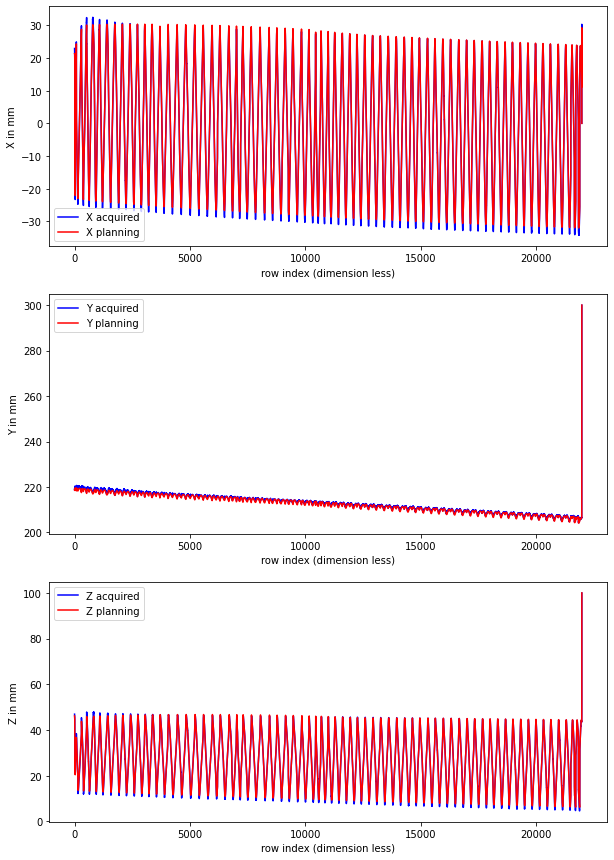

In [47]:
x_final = final_df['MachineX'].copy(deep=True)                 # using machine data from newly created combined dataset
y_final = final_df['MachineY'].copy(deep=True)
z_final = final_df['MachineZ'].copy(deep=True)
a_final = final_df['MachineA'].copy(deep=True)
c_final = final_df['MachineC'].copy(deep=True)

size1_final = x_final.shape[0]

# converting pandas series to numpy array
x_final = x_final.to_numpy()
y_final = y_final.to_numpy()
z_final = z_final.to_numpy()
a_final = a_final.to_numpy(dtype =  np.float64)
a_final = np.deg2rad(a_final)
c_final = c_final.to_numpy(dtype =  np.float64)
c_final = np.deg2rad(c_final)

tool_tip_X_final = final_df['Tool Tip Point X'].to_numpy()        # using newly created combined dataset
tool_tip_Y_final = final_df['Tool Tip Point Y'].to_numpy()
tool_tip_Z_final = final_df['Tool Tip Point Z'].to_numpy()
    
X_inv_final = tool_tip_X_final
Y_inv_final = tool_tip_Y_final
Z_inv_final = tool_tip_Z_final
    
#compensation_values
compensation_values = compensation_values_df.to_numpy()

# Within each cube we have ranges defined in x,y,z for the machine position

x_range = np.arange(-200,201,100)
y_range = np.arange(-300,301,150)
z_range = np.arange(-500,1,50)

obj3_final = compensation.Compensation(compensation_values,x_range,y_range,z_range)

# Caclculation of compensation error values based on machine positions obtained through inverse transformation
deltaX1_final, deltaY1_final, deltaZ1_final,deltaI1_final,deltaJ1_final,deltaK1_final = obj3_final.calculate(x_final,y_final,z_final)  
size3_final = x_final.shape[0]
conc3_final = np.concatenate((deltaX1_final.reshape(size3_final,1),deltaY1_final.reshape(size3_final,1),deltaZ1_final.reshape(size3_final,1),deltaI1_final.reshape(size3_final,1),deltaJ1_final.reshape(size3_final,1),deltaK1_final.reshape(size3_final,1)),axis=1)

# prininting the compensation error values
df_obj3_final = pd.DataFrame(conc3_final, columns=['deltaX1 final','deltaY1 final','deltaZ1 final','deltaI1 final','deltaJ1 final','deltaK1 final'])
df_obj3_final.head(5)  

x_compensated_final = x_final + deltaX1_final*10**-3    # since given compensation is to be converted from microns to mm (10**-6 x 10**3 = 10**-3)
y_compensated_final = y_final + deltaY1_final*10**-3
z_compensated_final = z_final + deltaZ1_final*10**-3

conc4_final = np.concatenate((x_compensated_final.reshape(size3_final,1),y_compensated_final.reshape(size3_final,1),z_compensated_final.reshape(size3_final,1)),axis=1)
df_obj4_final = pd.DataFrame(conc4_final, columns=['x_compensated final','y_compensated final','z_compensated final'])

obj_final = transformation.Transformation(size1_final,angle)
# Forward Transformation fuction:
# Input : Machine points in machine coordinate system
# Output: returns too tip points and orientation in workpiece coordinate system
tool_position_workpiece_CS_final, tool_orientation_workpiece_CS_final = obj_final.forward(x_compensated_final,y_compensated_final,z_compensated_final,a_final,c_final)

X_final = tool_position_workpiece_CS_final[0,0,:]
Y_final = tool_position_workpiece_CS_final[1,0,:]
Z_final = tool_position_workpiece_CS_final[2,0,:]

I_final = tool_orientation_workpiece_CS_final[0,0,:]
J_final = tool_orientation_workpiece_CS_final[1,0,:]
K_final = tool_orientation_workpiece_CS_final[2,0,:]

# Verification the correctness of code, i.e on applying reverse transformation on the forward transformation we should get same values
machine_points_xyz_final, machine_direction_ac_final = obj_final.backward(X_final,Y_final,Z_final,I_final,J_final,K_final)

x_out_final = machine_points_xyz_final[0,0,:]
y_out_final = machine_points_xyz_final[1,0,:]
z_out_final = machine_points_xyz_final[2,0,:]

a_out_final = machine_direction_ac_final[0,0,:]
c_out_final = machine_direction_ac_final[1,0,:]

conc1_final = np.concatenate((x_final.reshape(size1_final,1),x_out_final.reshape(size1_final,1),y_final.reshape(size1_final,1),y_out_final.reshape(size1_final,1),z_final.reshape(size1_final,1),z_out_final.reshape(size1_final,1),a_final.reshape(size1_final,1),a_out_final.reshape(size1_final,1),c_final.reshape(size1_final,1),c_out_final.reshape(size1_final,1)),axis=1)
df_obj1_final = pd.DataFrame(conc1_final, columns=['x final','x_out final','y final','y_out final','z final','z_out final','a final','a_out final','c final','c_out'])

conc11_final = np.concatenate((x_final.reshape(size1_final,1),y_final.reshape(size1_final,1),z_final.reshape(size1_final,1),a_final.reshape(size1_final,1),c_final.reshape(size1_final,1),X_final.reshape(size1_final,1),Y_final.reshape(size1_final,1),Z_final.reshape(size1_final,1),I_final.reshape(size1_final,1),J_final.reshape(size1_final,1),K_final.reshape(size1_final,1)),axis=1)
dfout11_final = pd.DataFrame(conc11_final, columns=['x final','y final','z final','a final','c final','X final','Y final','Z final','I final','J final','K final'])
    
subplotter(0,final_df.shape[0],X_final,Y_final,Z_final,X_inv_final,Y_inv_final,Z_inv_final)   # using combined dataset

Text(0.5, 1.0, 'TCP Error plot')

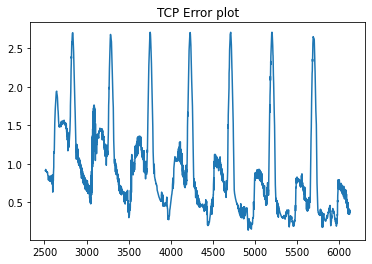

In [48]:
plt.plot((final_df['tcp_error']).iloc[1000:3500])
plt.title('TCP Error plot')

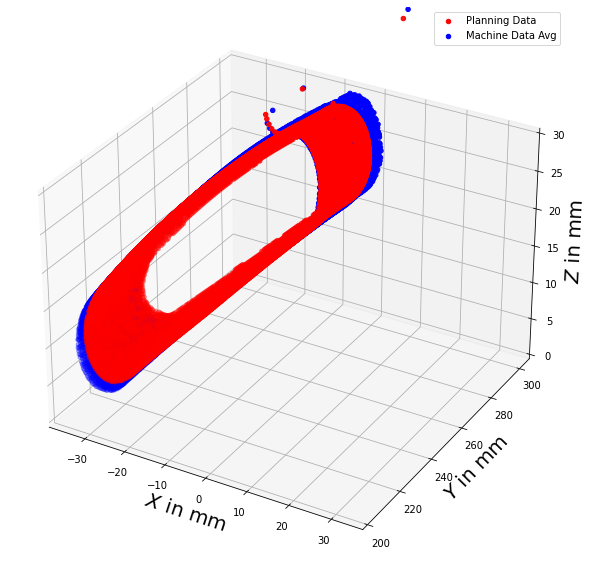

In [49]:
plt.figure(figsize=(10,15))
ax1 = plt.axes(projection='3d')
ax1.set_zlim3d([0,30])

ax1.set_xlabel('$X$ in mm', fontsize=20)
ax1.set_ylabel('$Y$ in mm', fontsize=20)
ax1.set_zlabel('$Z$ in mm', fontsize=20)

ax1.scatter3D(X_inv_final, Y_inv_final, Z_inv_final, color = 'red',label = 'Planning Data')
ax1.legend()

ax1.scatter3D(X_final, Y_final, Z_final, color = 'blue',label = 'Machine Data Avg')
ax1.legend()

In [50]:
mean = final_df['tcp_error'].mean()
mean

0.6587715422303441

In [51]:
median = final_df['tcp_error'].median()
median

0.34426197711514406

In [52]:
minimum = final_df['tcp_error'].min()
minimum

0.08753824165997463

In [53]:
maximum = final_df['tcp_error'].max()  
maximum

2.8345189492506315

In [49]:
#final_df = final_df.iloc[0:21500]

In [ ]:
# saving data 
final_df.to_excel(str(dir_final_save)+'finaldf_forward_with_compensation'+str(block)+'__'+str(angle)+'.xlsx') 